# Self-Driving Car Engineer Nanodegree


## Project: **Vehicle Detection and Tracking** 
***
In this project, you will use the tools you learned about in the lesson to identify lane lines on the road.  You can develop your pipeline on a series of individual images, and later apply the result to a video stream (really just a series of images). Check out the video clip "raw-lines-example.mp4" (also contained in this repository) to see what the output should look like after using the helper functions below. 

Once you have a result that looks roughly like "raw-lines-example.mp4", you'll need to get creative and try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines.  You can see an example of the result you're going for in the video "P1_example.mp4".  Ultimately, you would like to draw just one line for the left side of the lane, and one for the right.

In addition to implementing code, there is a brief writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) that can be used to guide the writing process. Completing both the code in the Ipython notebook and the writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/322/view) for this project.

---
Let's have a look at our first image called 'test_images/solidWhiteRight.jpg'.  Run the 2 cells below (hit Shift-Enter or the "play" button above) to display the image.

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

---

**The tools you have are color selection, region of interest selection, grayscaling, Gaussian smoothing, Canny Edge Detection and Hough Tranform line detection.  You  are also free to explore and try other techniques that were not presented in the lesson.  Your goal is piece together a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below).  Once you have a working pipeline, try it out on the video stream below.**

---

<figure>
 <img src="examples/line-segments-example.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above) after detecting line segments using the helper functions below </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="examples/laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your goal is to connect/average/extrapolate line segments to get output like this</p> 
 </figcaption>
</figure>

**Run the cell below to import some packages.  If you get an `import error` for a package you've already installed, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt.  Also, consult the forums for more troubleshooting tips.**  

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

#import glb package to file management
import glob
import math

## Steps
1. *Camera Calibration
2. *Distortion Correction on Images
3. *Use Color & Gradient Threshold instead of Canny for Advance Edge Detection
4. Draw Line
5. *Perspective Transform
5. *Lane Finding 
    a. Identify lane pixel 
    b. Calculate radius of curvature of lane
6. *Plot Lane Tracking to Orignial Image

## Read in an Image

In [2]:
def plotImageFile(filename):
    #reading in an image
    image = mpimg.imread(filename)

    #printing out some stats and plotting
    print('This image is:', type(image), 'with dimensions:', image.shape)
    plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')
    return

def plotImage(image, cmap='', title=''):
    #printing out some stats and plotting
    print('This image is:', type(image), 'with dimensions:', image.shape)
    if (cmap==''):
        plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')
    else:
        plt.imshow(image,cmap)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')
    plt.suptitle(title, fontsize=30)
    return

def plotOrigAndNew(image, newImage, cmap='', origTitle='Original Image', newTitle='New Image'):
    #Print images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    if (cmap==''):
        ax1.imshow(image)
        ax2.imshow(newImage)
    else:
        ax1.imshow(image, cmap=cmap)
        ax2.imshow(newImage, cmap=cmap)
    ax1.set_title(origTitle, fontsize=30)
    ax2.set_title(newTitle, fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return


## Ideas for Lane Detection Pipeline

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd / overlay two images
`cv2.cvtColor()` to grayscale or change color
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

## Helper Functions

Below are some helper functions to help get you started. They should look familiar from the lesson!

In [3]:
#new images from Proj4
image = mpimg.imread('test_images/test4.jpg')


# define parameters from Proj1
debug       = 0
edgeLoThres = 50  # canny edge detection low threshold
edgeHiThres = 250 # canny edge detection high threshold
kernelSize  = 5   # gaussian smoothing blurring kernel size
x_size      = image.shape[1]
y_size      = image.shape[0]
x_ctr       = int(x_size*0.5)  # taking 50% from right
x_lcap      = x_ctr-int(x_size*0.1)
x_rcap      = x_ctr+int(x_size*0.1)
y_cap       = int(y_size*0.65)  # taking 62% from bottom
# vertices for region of interest on road image [upper left, , lower left, upper right, lower right]
roadVertices = np.array([[int(x_size*0.1), y_size], [int(x_size*0.9), y_size], [x_rcap, y_cap], [x_lcap, y_cap]]) 
# vertices for region of interest on perspective lane binary image, 2 columns [upper left, , lower left, upper right, lower right]
laneVertices = np.array([[220,720], [500,720], [700,100], [900,720], [1100, 720], [1100,0], [220,0]])
rho          = 1         # distance resolution in pixels of the Hough grid
theta        = np.pi/180 # angular resolution in radians of the Hough grid
threshold    = 30        # minimum number of votes (intersections in Hough grid cell)
min_line_len = 5         # minimum number of pixels making up a line
max_line_gap = 250       # maximum gap in pixels between connectable line segments
alpha = 1     # orignial image color pixel density
beta  = 1     # line image color pixel density
lamda = -20   # additional color pixel to the combined original and line images



#new parameters for avdance lane line detection and tracking
# collect all filename to be read for calibration
cal_images  = glob.glob("camera_cal\calibration*.jpg")
#s_thresh    = (90, 255)   # HSL color scale, S channel color thresholds
#x_thresh    = (40, 180)   # Gray scale X gradient thresholds
#kernel_size = 3           # kernel-size for X gradient
src = np.float32([])      # source coordinates for perspective transform
dst = np.float32([])      # destination coordinates for perspective transform

#s_thresh    = (90, 255)   # HSL color space, S channel color thresholds
#x_thresh    = (40, 180)   # Gray scale X gradient thresholds
#l_thresh    = (90, 255)   # HSL color space, L channel color thresholds
#r_thresh    = (90, 255)   # RGB color space, R channel color thresholds
#g_thresh    = (90, 255)   # RGB color space, G channel color thresholds
#mag_thresh  = (30, 120)   # magnitude threshold for Sobel X and Y gradient
#kernel_size = 5           # kernel-size for X gradient

s_thresh    = (90, 155)   # best for Y lane 90-255 HSL color space, S channel color thresholds
x_thresh    = (40, 180)   # best for lane edges 40-180 Gray scale X gradient thresholds
l_thresh    = (150, 165)  # best for eliminating shadows 150-165 HSL color space, L channel color thresholds
r_thresh    = (225, 255)  # best for white lane 195-255 RGB color space, R channel color thresholds
g_thresh    = (205, 255)  # best for white lane 195-255 RGB color space, G channel color thresholds
mag_thresh  = (70, 140)   # best for outlining Y and W lanes 70-140 magnitude threshold for Sobel X and Y gradient
kernel_size = 5           # kernel-size for X gradient



### Helping functions from Project 1

In [4]:
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    process image using uint8 dtype to match hoguhline or others
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    #cv2.fillPoly(mask, np.int32([vertices]), ignore_mask_color)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #cv2.fillPoly(mask, no.array[img], ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    #print("img.shape", img.shape)
    #print("img.dtype", img.dtype)
    #print("mask.shape", mask.shape)
    #print("masked_image", masked_image.shape)
    #print("masked_image.dtype", masked_image.dtype)
    return masked_image

def slope(x1,y1,x2,y2):
    if (debug==1): print('%%%%   y2,y1,x2,x1,m', y2,' ', y1,' ', x2,' ', x1,' ', (y2-y1)/(x2-x1))
    return float((y2-y1)/(x2-x1))

def averaging(lines):
    xbot=[]
    xtop=[]
    for line in lines:
        for x1,y1,x2,y2 in line:
            if (debug==1): print('averaging line:y2,y1,x2,x1', y2, y1, x2, x1)
            if (x1!=x2 and y1!=y2):
                m = slope(x1,y1,x2,y2)
                if (abs(m) >= 0.5):
                    xb=int(round(x2-(y2-y_size)/m))
                    xt=int(round(x1-(y1-y_cap)/m))
                    xbot.append(xb)
                    xtop.append(xt)
    if (debug==1): print('list of xbot line:', xbot)
    if (debug==1): print('list of xtop line:', xtop)
    if (xbot == []):
        print("==============================================================")
        print("xbot NaN: xbot|np.mean(xbot)", xbot, np.mean(xbot))
        print("xbot NaN: lines", lines)
        print("xtop NaN: xbot|np.mean(xtop)", xtop, np.mean(xtop))
        print("xtop NaN: lines", lines)
        print("==============================================================")
        return ([])
    else:
        avg_xbot=int(round(np.mean(xbot)))
        avg_xtop=int(round(np.mean(xtop)))
        if (debug==1): print('############   averaging xbot, y_size, xtop, y_cap: ############\n', avg_xbot, y_size, avg_xtop, y_cap, "\n###########################################\n")
        return np.array([[avg_xbot, y_size, avg_xtop, y_cap]])

def sortlines(lines):
    LLines=[] # left hand side line
    RLines=[] # ride hand side line
    SLines=[] # straight line
    HLines=[] # horizontal line
    for line in lines:
        for x1,y1,x2,y2 in line:
            m=slope(x1,y1,x2,y2)
            if (x1==x2 or y1==y2):
                SLines.append(line)
                if (debug==1): print("striaght line => drop")
            elif (abs(m) < 0.5):# or abs(m) > 1):
                HLines.append(line)
                if (debug==1): print("near horizontal line => drop")
            else:
                if (m < 0):
                    LLines.append(line)
                    if (debug==1): print("left lane line => keep")
                elif (m > 0):
                    RLines.append(line)
                    if (debug==1): print("right lane line => keep")
    return (LLines, RLines, SLines, HLines)
            

def extrapolate_lines(lines):
    (L_lines, R_lines, S_lines, H_lines) = sortlines(lines)
    L_line = averaging(L_lines)
    R_line = averaging(R_lines)
    return (L_line, R_line)


def draw_lines(img, lines, color=[0, 120, 0], thickness=5):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    singleline=1
    y_top = y_cap
    y_bot = y_size-30
    x_rcap = x_size-50
    x_lcap = 50
    coor = []
    if (singleline == 1):
        (L_line, R_line) = extrapolate_lines(lines)
        #print("number of L_lines passed to drawline", len(L_line))
        #print("number of R_lines passed to drawline", len(R_line))
        if (debug==1):print("L_line = ", L_line)
        if (debug==1):print("R_line = ", R_line)
        if (debug==1):print("[L_line, R_line] = ", np.array([L_line, R_line]))
        #for line in np.array([L_line, R_line]):
        #    if (len(line) != 0):
        for x1,y1,x2,y2 in L_line:
        #            #cv2.line(img, (x1, y1), (x2, y2), color, thickness)
            coor.append((x2,y2))  # coor[0]
            coor.append((x1,y1))  # coor[1]
        for x1,y1,x2,y2 in R_line:
            coor.append((x1,y1))  # coor[2]
            coor.append((x2,y2))  # coor[3]
    else:
        print("*****************************************\n","\t\toriginal method\n", "*****************************************\n")
        for line in lines:
            for x1,y1,x2,y2 in line:
                if (debug==1): print("      line coordinants:x1,y1,x2,y2", x1,y1,x2,y2)
                if (x1!=x2 and y1!=y2): # skip striaght lines and horizontal lines and semi-flat lines, process only positive and negative slope lines
                    m=slope(x1,y1,x2,y2)
                    if (abs(m) >= 0.5):
                        xbot=int(round(x2-(y2-y_size)/m))
                        xtop=int(round(x1-(y1-y_cap)/m))
                        if (debug==1): print("                                                     final line coordinants:x1,y1,x2,y2", xbot, y_size, xtop, y_cap)
                        cv2.line(img, (xbot, y_size), (xtop, y_cap), color, thickness)
                    elif (debug==1): print("final line coordinants: skipped as m < 0.5")
                elif (debug==1): print("final line coordinants: skipped as horizontal/vertial line")
    if (len(coor) == 4):
        cv2.fillPoly(img, [np.array(coor)], color)
    return coor


def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
    process image using uint8 dtype to match hoguhline or others
    
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    lines = cv2.HoughLinesP(img, rho, theta, threshold, minLineLength=min_line_len, maxLineGap=max_line_gap)
    #print("houghlines: len", len(lines))
    #print("houghlines: lines", lines)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    coor = []
    if (lines is None):
        print("==============================================================")
        print("hough NaN: lines", lines)
        print("==============================================================")
    else:
        if (len(lines) >= 2):
            coor = draw_lines(line_img, lines)
    if (debug==1): 
        print("hough: lines", lines)
    return line_img, coor


# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

### Helping functions from Project 4

In [ ]:
#calibrate camera 
def calibration(images):
    #arrays for storing object points and image points from all calibration images
    objpoints = [] # 3D array of chessboard in real world that are expected to be positioned
    imgpoints = [] # 2D array of chessboard coordinates on the calibration image

    nx = 9
    ny = 6
    image_shape = (None, None, None)
    #set the expected object points. and add to the array when imgpoints detected corners
    expobjp = np.zeros((nx*ny,3), np.float32)
    expobjp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # setting x,y coordinates, i.e. 000, 100, 200, .., 850, etc 

    for fname in images:
        #read all calibration images, this is in RGB color format
        img = mpimg.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        image_shape = img.shape
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
        #if found corners, add corners to imgpoints and add expected coordinates to objpoints
        if (ret == True):
            imgpoints.append(corners)
            objpoints.append(expobjp)

            #draw the corners back on original image for sanity check
            img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            plt.imshow(img)
            #cv2.imshow('fname', img)
            #cv2.waitKey(900)

        else:
            print("skip", fname, "- not enough corners detected")
            
    #calibrate camera and return the following output
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_shape[0:2], None, None)
    print("\ndistortion coefficient = \n", dist)
    return ret, mtx, dist, rvecs, tvecs


#undistort a chessboard test image
def undistort_image(img):
    return cv2.undistort(img, mtx, dist, None)



def hsvscale(img):
    """Applies the HSV color space transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


### Helper functions from Project 5

In [ ]:
# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy
    
    
# Define a function that takes an image and a list of templates as inputs
# then searches the image and returns the a list of bounding boxes 
# for matched templates
def find_matches(img, template_list):
    # Make a copy of the image to draw on
    # Define an empty list to take bbox coords
    imgcopy = np.copy(img)
    bbox_list = []
    # Iterate through template list
    # Read in templates one by one
    for temp in template_list:
        
        timg = mpimg.imread(temp)
        w, h = (timg.shape[1], timg.shape[0])
        # Use cv2.matchTemplate() to search the image
        #     using whichever of the OpenCV search methods you prefer
        res = cv2.matchTemplate(img, timg, cv2.TM_SQDIFF_NORMED)
        # Use cv2.minMaxLoc() to extract the location of the best match
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        top_left = min_loc
        # Determine bounding box corners for the match
        bbox_list.append(((min_loc), ((min_loc[0]+w), (min_loc[1]+h))))
    # Return the list of bounding boxes
    return bbox_list


# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the RGB channels separately
    rhist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    ghist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    bhist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return rhist, ghist, bhist, bin_centers, hist_features

# Define a function to compute color histogram features  
# Pass the color_space flag as 3-letter all caps string
# like 'HSV' or 'LUV' etc.
def bin_spatial(img, color_space='RGB', size=(32, 32)):
    # Convert image to new color space (if specified)
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)             
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(feature_image, size).ravel() 
    # Return the feature vector
    return features


# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    example_img = mpimg.imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = example_img.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = example_img.dtype
    # Return data_dict
    return data_dict

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                                  visualise=True, feature_vector=False)
        return features, hog_image
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                       visualise=False, feature_vector=feature_vec)
        return features


# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256)):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        else: feature_image = np.copy(image)      
        # Apply bin_spatial() to get spatial color features
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        # Apply color_hist() also with a color space option now
        hist_features = color_hist(feature_image, nbins=hist_bins, bins_range=hist_range)
        # Append the new feature vector to the features list
        features.append(np.concatenate((spatial_features, hist_features)))
    # Return list of feature vectors
    return features




## Test Images

Build your pipeline to work on the images in the directory "test_images"  
**You should make sure your pipeline works well on these images before you try the videos.**

In [5]:
import os
testImages = os.listdir("test_images/")
testImages

['straight_lines1.jpg',
 'straight_lines2.jpg',
 'test1.jpg',
 'test10.jpg',
 'test11.jpg',
 'test12.jpg',
 'test13.jpg',
 'test14.jpg',
 'test15.jpg',
 'test2.jpg',
 'test3.jpg',
 'test4.jpg',
 'test5.jpg',
 'test6.jpg',
 'test7.jpg',
 'test8.jpg',
 'test9.jpg']

## Build a Lane Finding Pipeline



Build the pipeline and run your solution on all test_images. Make copies into the `test_images_output` directory, and you can use the images in your writeup report.

Try tuning the various parameters, especially the low and high Canny thresholds as well as the Hough lines parameters.

### Camera Calibration

skip camera_cal\calibration1.jpg - not enough corners detected
skip camera_cal\calibration4.jpg - not enough corners detected
skip camera_cal\calibration5.jpg - not enough corners detected

distortion coefficient = 
 [[-0.24688507 -0.02373154 -0.00109831  0.00035107 -0.00259869]]


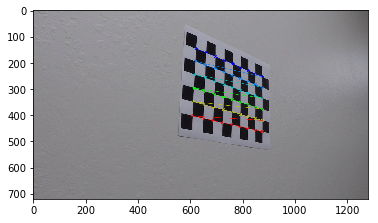

In [6]:
#Camera Calibration
ret, mtx, dist, rvecs, tvecs = calibration(cal_images)

### Distortion Correction

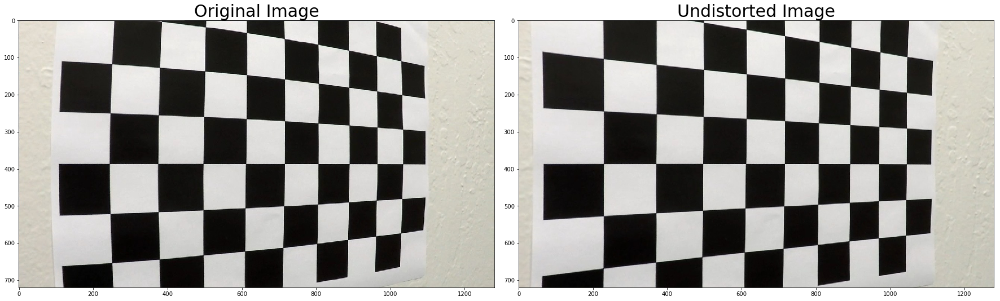

In [7]:
#Undistort Calibrate Image
test_img = mpimg.imread("camera_cal\calibration5.jpg")
undist = undistort_image(test_img)

#Print images
plotOrigAndNew(test_img, undist, newTitle='Undistorted Image')

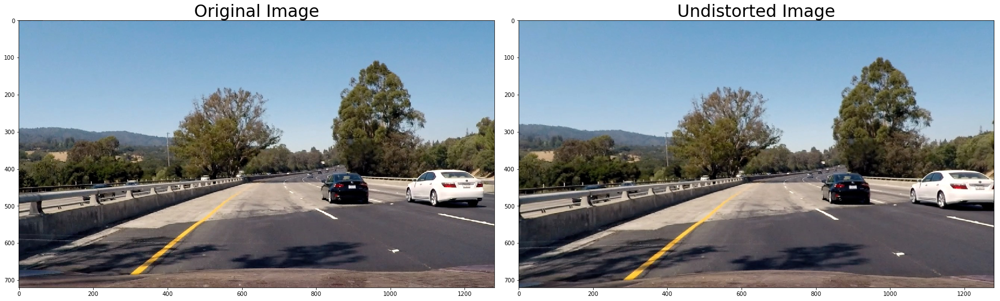

In [8]:
#Undistort test pipeline image
undist = undistort_image(image)

#Print images
plotOrigAndNew(image, undist, newTitle='Undistorted Image')

### Canny's Edge Detection from Project 1

print canny edge image
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280)


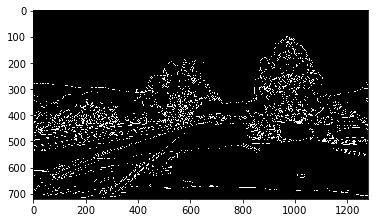

In [9]:
# turn image to hsv scale
hsvImage = hsvscale(undist)
# apply gaussian smoothing and blurring to reduce noise
gausImage = gaussian_blur(hsvImage, kernelSize)
# create a Canny Edge image
edgeImage = canny(gausImage, edgeLoThres, edgeHiThres)
print('print canny edge image')
plotImage(edgeImage,'Greys_r')

### Advanced Edge Detection - Color & Gradient Threshold

In [10]:
# color threshold combines with HLS color S channel and magnitude of the gradients 
#of sobelX in gray scale thresholds
# process image binary using uint8 dtype to match hoguhline or others
def threshold_edges(img, r_thresh=(170, 255), g_thresh=(170,255), s_thresh=(170, 255), l_thresh=(170,255), \
                    x_thresh=(20, 100),  mag_thresh=(30, 120), kernel_size=3, thtype='sx'):
    img = np.copy(img)
    
    # Capture R and G color chanel for color threshold
    # R & G channels (of RGB) help you detect yellow lanes
    r_channel = np.uint8(img[:,:,0])
    g_channel = np.uint8(img[:,:,1])

    # Convert to HLS color space and separate the L and S channel
    # L channel (luminosity or lightness) can help you avoid shadows
    # S channel (of HSL) helps your detect bright yellow & white lanes
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.uint8)
    s_channel = hls[:,:,2]
    l_channel = hls[:,:,1]
    h_channel = hls[:,:,0]
    
    # Threshold for R color channel
    r_binary = np.zeros_like(s_channel)
    r_binary[(r_channel >= r_thresh[0]) & (r_channel <= r_thresh[1])] = 1

    # Threshold for G color channel
    g_binary = np.zeros_like(s_channel)
    g_binary[(g_channel >= g_thresh[0]) & (g_channel <= g_thresh[1])] = 1

    # Threshold for S color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Threshold for L color channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1

    # Threshold for L color channel
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel >= mag_thresh[0]) & (h_channel <= mag_thresh[1])] = 1

    # Sobel x for gradient threshold
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=kernel_size) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel   = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Sobel y for gradient threshold
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=kernel_size) # Take the derivative in y
    abs_sobely = np.absolute(sobely) # Absolute y derivative to accentuate lines away from horizontal
    scaled_sobely  = np.uint8(255*abs_sobely/np.max(abs_sobely))

    abs_sobelxy= np.sqrt(abs_sobelx + abs_sobely)
    scaled_sobelxy = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))

    # Threshold x gradient
    x_binary = np.zeros_like(scaled_sobel)
    x_binary[(scaled_sobel >= x_thresh[0]) & (scaled_sobel <= x_thresh[1])] = 1
    
    # Threshold x gradient
    y_binary = np.zeros_like(scaled_sobel)
    y_binary[(scaled_sobely >= x_thresh[0]) & (scaled_sobely <= x_thresh[1])] = 1
    
    # Magnitude Threshold for x and y gradient
    mag_binary = np.zeros_like(scaled_sobelxy)
    mag_binary[(scaled_sobelxy >= mag_thresh[0]) & (scaled_sobelxy <= mag_thresh[1])] = 1
    
    #combine X gradient and S channel color thresholds
    combine_sx_binary    = np.zeros_like(s_binary)
    combine_sxl_binary   = np.zeros_like(s_binary)
    combine_rgsx_binary  = np.zeros_like(s_binary)
    combine_rgslxy_binary = np.zeros_like(s_binary)
    
    if (thtype=='sx'):
        combine_sx_binary   [(s_binary==1) | ((x_binary==1) & (y_binary==1))] = 1
        return combine_sx_binary
    elif (thtype=='sxl'):
        combine_sxl_binary  [((s_binary==1) | (l_binary==1)) | ((x_binary==1) & (y_binary==1))] = 1
        return combine_sxl_binary
    elif (thtype=='rgsl'):
        combine_rgsx_binary [(r_binary==1) & (g_binary==1) & (s_binary==1) & (l_binary==1)] = 1
        return combine_rgsx_binary
    elif (thtype=='rgslxy'):
        combine_rgslxy_binary[((r_binary==1) & (g_binary==1) & (s_binary==1) & (l_binary==1)) | ((x_binary==1) & (y_binary==1))] = 1
        return combine_rgslxy_binary
    elif (thtype=='all'):
        combine_sx_binary   [(s_binary==1) | ((x_binary==1) & (y_binary==1))] = 1
        combine_sxl_binary  [((s_binary==1) & (l_binary==1)) | ((x_binary==1) & (y_binary==1))] = 1
        combine_rgsx_binary [((r_binary==1) & (g_binary==1) & (s_binary==1)) | ((x_binary==1) & (y_binary==1))] = 1
        combine_rgslxy_binary[((r_binary==1) & (g_binary==1) & (s_binary==1) & (l_binary==1)) | ((x_binary==1) & (y_binary==1))] = 1
        return combine_rgslxy_binary, combine_sx_binary, combine_sxl_binary, combine_rgsx_binary, \
                r_binary, g_binary, s_binary, l_binary, x_binary, mag_binary
        
    
#persective transform to bird eyes view
def pTransWrap(img, src, dst):
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # e) use cv2.warpPerspective() to warp your image to a top-down view
    topDownView = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
    return topDownView

combined_binary.shape (720, 1280)
combined_binary.dtype uint8


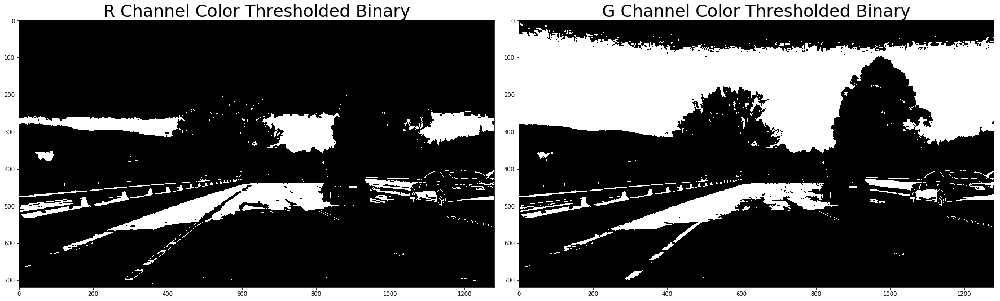

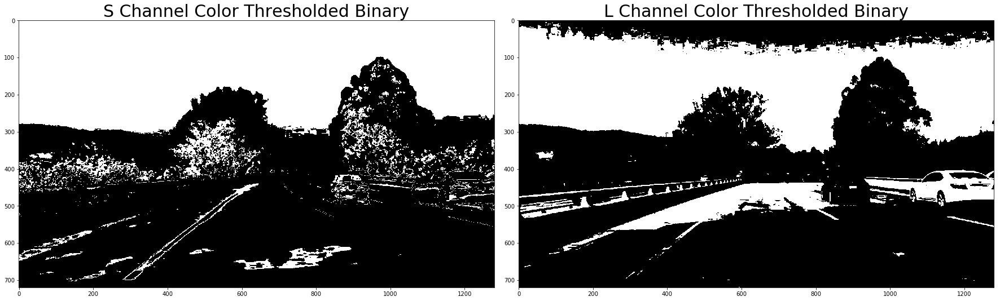

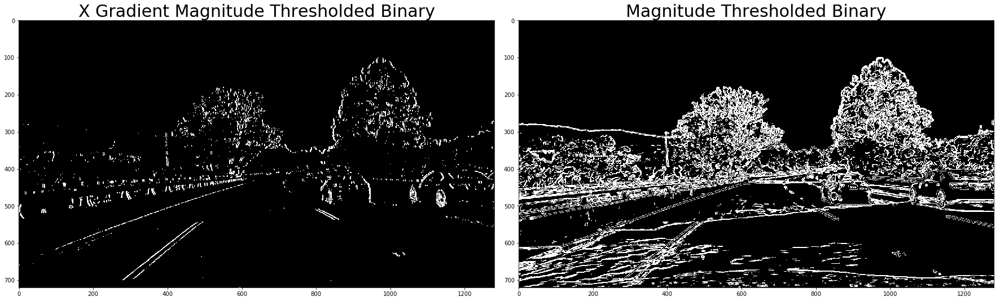

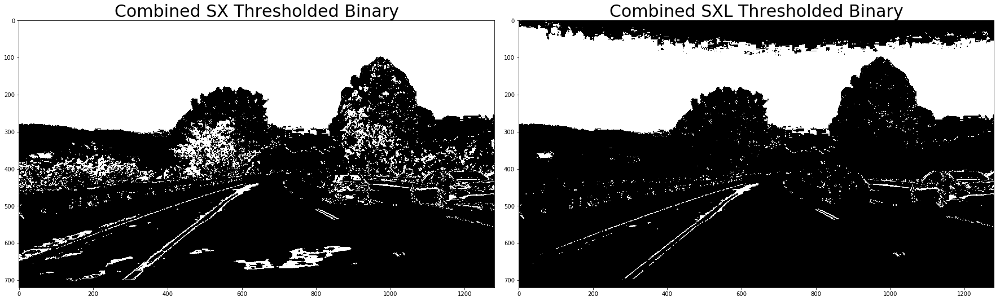

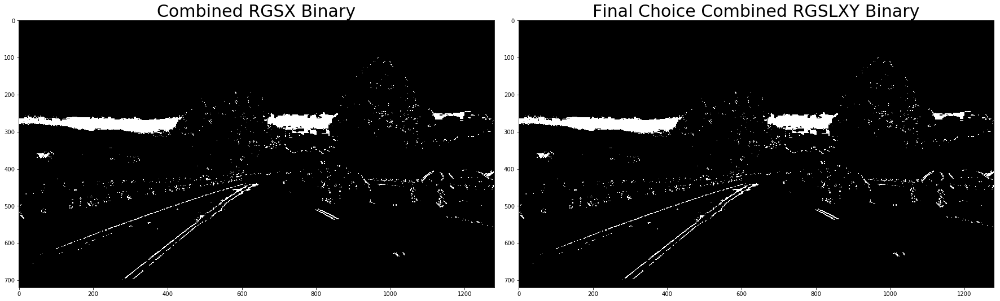

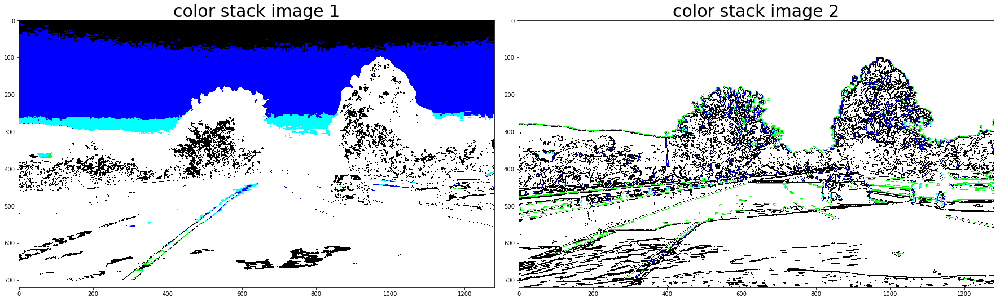

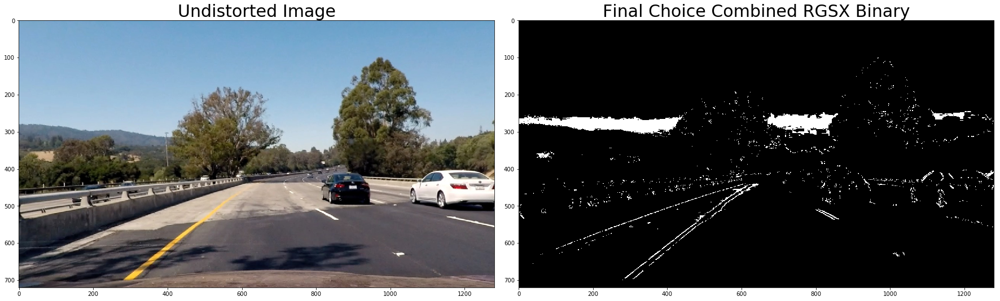

In [36]:
#instead of using Canny's Edge Detect, let's try a new combined edge detect function
#s_thresh    = (90, 255)   # HSL color space, S channel color thresholds
#x_thresh    = (30,  80)   # Gray scale X gradient thresholds
#l_thresh    = (40, 90)   # HSL color space, L channel color thresholds
#r_thresh    = (125, 175)   # RGB color space, R channel color thresholds
#g_thresh    = (125, 125)   # RGB color space, G channel color thresholds
r_thresh    = (175, 225)  # best for white lane 195-255 RGB color space, R channel color thresholds
g_thresh    = (170, 225)  # best for white lane 195-255 RGB color space, G channel color thresholds
s_thresh    = (90, 155)   # best for Y lane 90-255 HSL color space, S channel color thresholds
l_thresh    = (165, 255)  # 205-255 best for eliminating shadows 150-165 HSL color space, L channel color thresholds
x_thresh    = (40, 180)   # best for lane edges 40-180 Gray scale X gradient thresholds
mag_thresh  = (70, 140)   # best for outlining Y and W lanes 70-140 magnitude threshold for Sobel X and Y gradient
kernel_size = 5           # kernel-size for X gradient


# apply threshold_edges to include all binaries
combined_binary, comb_sx_bin, comb_sxl_bin, comb_rgsx_bin, \
    r_bin, g_bin, s_bin, l_bin, x_bin, mag_bin = \
    threshold_edges(undist, r_thresh=r_thresh, g_thresh=g_thresh, s_thresh=s_thresh, l_thresh=l_thresh, \
                    x_thresh=x_thresh, mag_thresh=mag_thresh, kernel_size=kernel_size, thtype='all')
color_stack1 = np.dstack(( np.zeros_like(s_bin), r_bin, g_bin, s_bin)) * 255
color_stack2 = np.dstack(( np.zeros_like(s_bin), l_bin, x_bin, mag_bin)) * 255
plotOrigAndNew(r_bin, g_bin, cmap='gray', origTitle='R Channel Color Thresholded Binary', \
               newTitle='G Channel Color Thresholded Binary')
plotOrigAndNew(s_bin, l_bin, cmap='gray', origTitle='S Channel Color Thresholded Binary', \
               newTitle='L Channel Color Thresholded Binary')
plotOrigAndNew(x_bin, mag_bin, cmap='gray', origTitle='X Gradient Magnitude Thresholded Binary', \
               newTitle='Magnitude Thresholded Binary')
plotOrigAndNew(comb_sx_bin, comb_sxl_bin, cmap='gray', origTitle='Combined SX Thresholded Binary', \
               newTitle='Combined SXL Thresholded Binary')
plotOrigAndNew(comb_rgsx_bin, combined_binary, cmap='gray', origTitle='Combined RGSX Binary', \
               newTitle='Final Choice Combined RGSLXY Binary')
plotOrigAndNew(color_stack1, color_stack2, origTitle="color stack image 1", newTitle="color stack image 2")


# apply threshold_edges to return just 'combine_rgslxy_binary' binary
combined_binary = \
    threshold_edges(undist, r_thresh=r_thresh, g_thresh=g_thresh, s_thresh=s_thresh, l_thresh=l_thresh, \
                    x_thresh=x_thresh, mag_thresh=mag_thresh, kernel_size=kernel_size, thtype='rgslxy')

plotOrigAndNew(undist, combined_binary, cmap='gray', origTitle='Undistorted Image', \
                   newTitle='Final Choice Combined RGSX Binary')


print("combined_binary.shape", combined_binary.shape)
print("combined_binary.dtype", combined_binary.dtype)

[[ 128  720]
 [1152  720]
 [ 768  468]
 [ 512  468]]
print only region of interested edge image


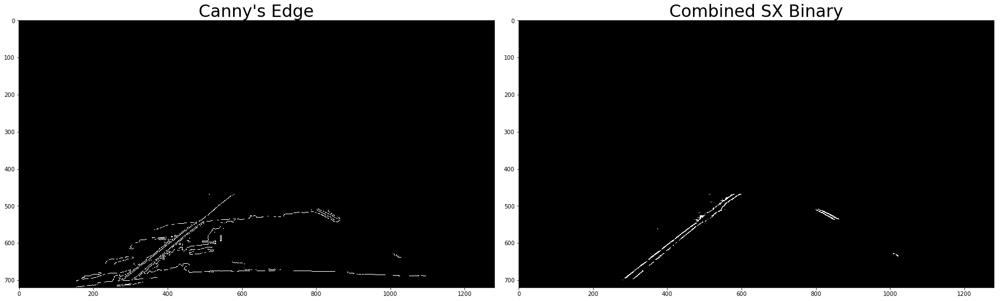

In [12]:
# define region of interest for road image
print(roadVertices)
CannyEdges=region_of_interest(edgeImage, [roadVertices])
edges=region_of_interest(combined_binary, [roadVertices])
print('print only region of interested edge image')
#plotOrigAndNew(CannyEdges, edges, cmap='Greys_r', origTitle="Canny's Edge", newTitle='Combined Binary')
plotOrigAndNew(CannyEdges, edges, cmap='Greys_r', origTitle="Canny's Edge", newTitle='Combined SX Binary')

print only region of interested edge image
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)
coordinates [(582, 468), (273, 720), (1194, 720), (730, 468)]


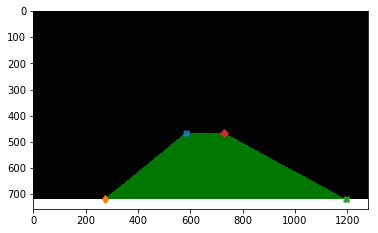

In [13]:
# apply Hough Transform
lineImage, coor = hough_lines(edges, rho, theta, 25, 25, 250)
print('print only region of interested edge image')
plotImage(lineImage)
print("coordinates", coor)
plt.plot(coor[0][0], coor[0][1], "X")
plt.plot(coor[1][0], coor[1][1], "d")
plt.plot(coor[2][0], coor[2][1], "X")
plt.plot(coor[3][0], coor[3][1], "D")

print only region of interested edge image
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


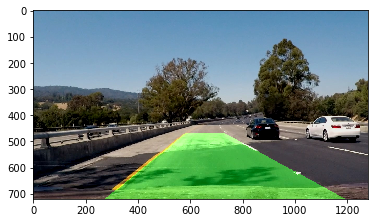

In [14]:
# apply weight to line image from hough line image
alpha = 1     # orignial image color pixel density
beta  = 1     # line image color pixel density
lamda = -20   # additional color pixel to the combined original and line images
line = weighted_img(lineImage, image, alpha, beta, lamda)
print('print only region of interested edge image')
plotImage(line)

### Perspective Transform

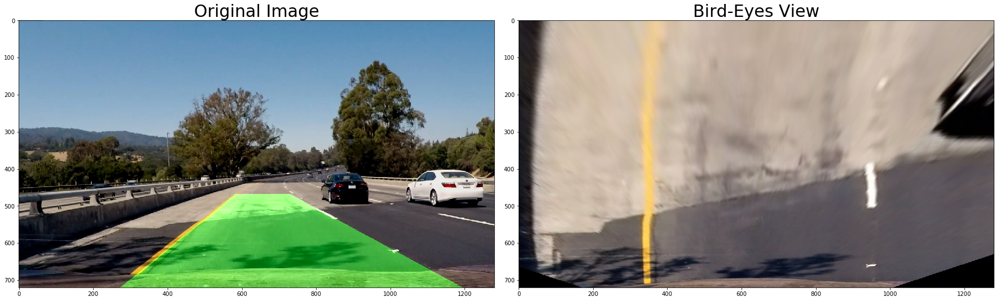

In [15]:
#define source coordinates using the results from HoughLines
#predefine destination coordinates
src = np.array([coor[0], coor[1], coor[2], coor[3]], np.float32)
dst = np.array([(350, 0), (350, 720), (950, 720), (950, 0)], np.float32)

top_down = pTransWrap(undist, src, dst)
plotOrigAndNew(line, top_down, newTitle='Bird-Eyes View')

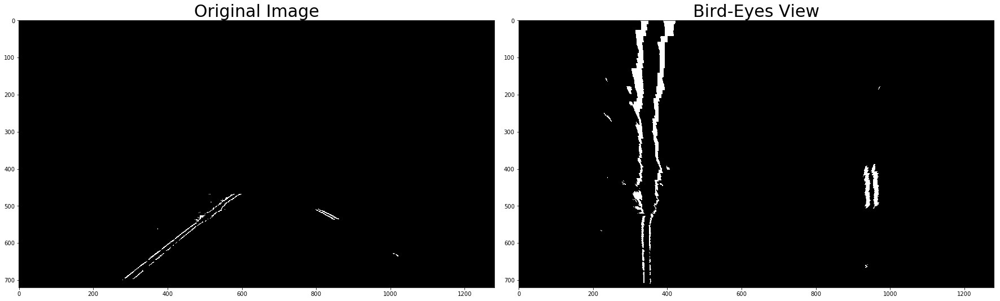

In [16]:
#apply perspective transform
top_down_binary = pTransWrap(edges, src, dst)

#print("top_down_binary", top_down_binary.dtype)
#print("laneVertices", laneVertices.dtype)
#print("roadVertices", roadVertices.dtype)
#apply mask to top_down_binary to limit to two vertical areas
#laneVertices = np.array([[320,720], [500,720], [700,100], [900,720], [1100, 720], [1100,0], [320,0]])
masked_top_down_binary = region_of_interest(top_down_binary, np.array([laneVertices]))

plotOrigAndNew(edges, masked_top_down_binary, newTitle="Bird-Eyes View", cmap='gray')

### Sliding 

slidingfit1: [  1.54987346e-04  -1.30951759e-01   3.67450166e+02] [  4.39178922e-05  -6.38598787e-02   9.68532662e+02]
left: f(y)= 0.000154987345938 *y^2+ -0.130951758999 *y+ 367.45016645
right: f(y)= 4.39178921762e-05 *y^2+ -0.0638598787132 *y+ 968.532662316
(720,)
(720,)
(720,)
[  4.71870045e-04  -1.66121660e-02   1.94223659e+00]
[  1.33711160e-04  -8.10108176e-03   5.11938693e+00]


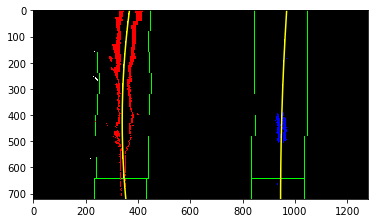

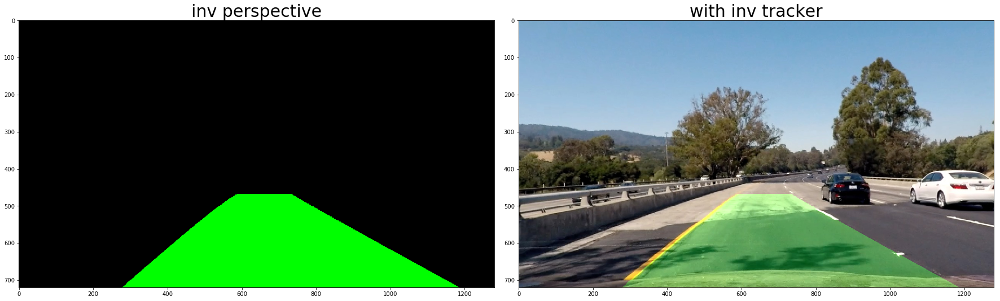

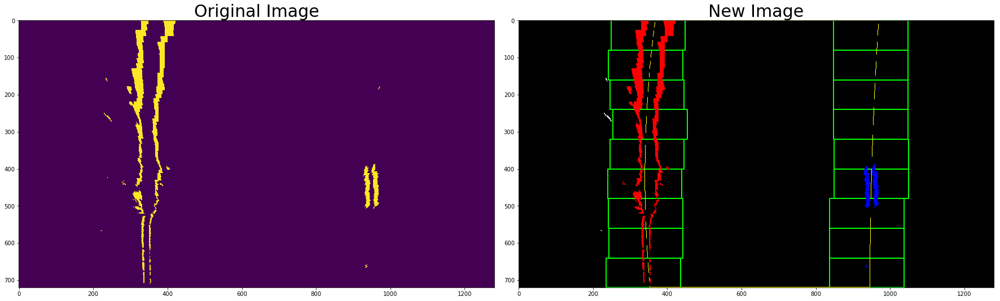

In [17]:
#sliding windows and fit a polynomial, the first time sliding windows use will have 
#to do blind searching of where the peaks are using histogram
# nwindows - number of sliding windows
# margin - Set the width of the windows +/- margin 
# minpix - Set minimum number of pixels found to recenter window
# ym_per_pix = 30/720 - meters per pixel in y dimension
# xm_per_pix = 3.7/700 - meters per pixel in x dimension
def slidingfit1(binary_warped, nwindows=9, margin=100, minpix=50, ym_per_pix=30/720, xm_per_pix=3.7/700, draw=True):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    y_startpoint = np.int(binary_warped.shape[0]/2)
    histogram = np.sum(binary_warped[y_startpoint:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    if ((len(leftx)==0) or (len(rightx)==0) or (len(lefty)==0) or (len(righty)==0)):
        left_fit = None
        right_fit = None
        left_fit_real = None
        right_fit_real = None
        left_fitx = None
        right_fitx = None
    else:
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Fit a second order polynomial to each in real world scale
        left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

        #visual the result
        # Generate x and y values for plotting
        #ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    print("slidingfit1:", left_fit, right_fit)
    
    # output lines segments
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    if (len(leftx)>0 and len(rightx)>0):
        ppts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        ppts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        ppts = np.hstack((ppts_left, ppts_right))
        cv2.polylines(out_img, np.int_([ppts]), True, [255,255,0])

    if (draw==True and (left_fitx is not None and right_fitx is not None)):
        #out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        #out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        print("left: f(y)=",left_fit[0],"*y^2+",left_fit[1],"*y+",left_fit[2])
        print("right: f(y)=",right_fit[0],"*y^2+",right_fit[1],"*y+",right_fit[2])

    return left_fit, right_fit, left_fit_real, right_fit_real, left_fitx, right_fitx, ploty, out_img


def sliding(binary_warped, left_fit, right_fit, \
            undist, combined_binary, corps, lineImage, top_down_binary, \
            nwindows=9, margin=100, minpix=50, ym_per_pix=30/720, xm_per_pix=3.7/1280, draw=True):
    
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    #print(binary_warped.shape)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & \
                      (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & \
                       (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left andright line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # enhance leftx,lefty and rightx,righty points for fitting
    # basically widen existing point by adding random points around and within their margin
    #leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
    #                          for X in ploty])
    #rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
    #                            for y in ploty])
    
    if (draw==True):
        if(len(leftx)==0 or len(lefty)==0 or len(rightx) or len(righty)):
            plotOrigAndNew(undist, combined_binary)
            plotOrigAndNew(corps, lineImage)
            plotOrigAndNew(top_down_binary, binary_warped)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    if ((len(leftx)==0) or (len(rightx)==0) or (len(lefty)==0) or (len(righty)==0)):
        left_fit = None
        right_fit = None
        left_fit_real = None
        right_fit_real = None
        left_fitx = None
        right_fitx = None
    else:
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Fit a second order polynomial to each
        left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Generate x and y values for plotting
        #ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
    # output lines segments
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    if (len(leftx)>0 and len(rightx)>0):
        ppts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        ppts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        ppts = np.hstack((ppts_left, ppts_right))
        cv2.polylines(out_img, np.int_([ppts]), True, [255,255,0])

    if (draw==True and (left_fitx is not None and right_fitx is not None)):
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        print("sliding:", left_fit, right_fit)
    
    return left_fit, right_fit, left_fit_real, right_fit_real, left_fitx, right_fitx, ploty, out_img


# apply sliding
left_fit = []
right_fit = []
left_fit, right_fit, left_fit_real, right_fit_real, left_fitx, right_fitx, y_points, sImg = slidingfit1(masked_top_down_binary)

# Create an image to draw the lines on
warp_zero = np.zeros_like(masked_top_down_binary).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

print(left_fitx.shape)
print(right_fitx.shape)
print(y_points.shape)
# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, y_points]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, y_points])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))


# Warp the blank back to original image space using inverse perspective matrix (Minv)
Minv = cv2.getPerspectiveTransform(dst, src)
revertwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(undist, 1, revertwarp, 0.3, 0)

print(left_fit_real)
print(right_fit_real)

plotOrigAndNew(revertwarp, result, origTitle='inv perspective', newTitle='with inv tracker')
plotOrigAndNew(masked_top_down_binary, sImg)

sliding: [  1.59585080e-04  -1.33765855e-01   3.67577302e+02] [  4.39178922e-05  -6.38598787e-02   9.68532662e+02]
(720,)
(720,)
(720,)
pts [[[ 367.57730201    0.        ]
  [ 367.44369574    1.        ]
  [ 367.31040864    2.        ]
  ..., 
  [ 968.40511823    2.        ]
  [ 968.46884636    1.        ]
  [ 968.53266232    0.        ]]]
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)
[  2.65709157e-04  -9.28000621e-03   1.06252814e+00]
[  7.31232905e-05  -4.43027909e-03   2.79966473e+00]


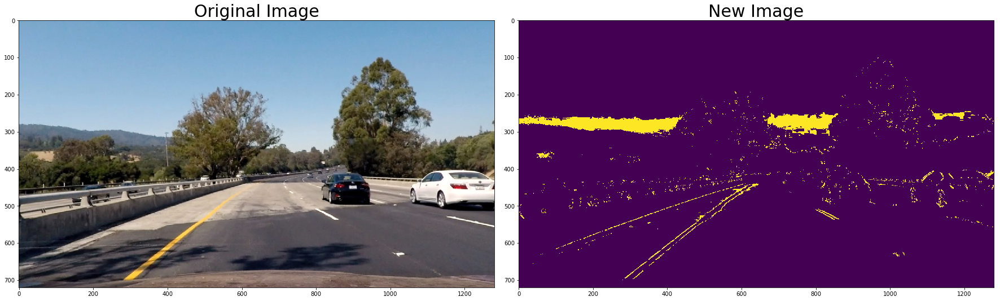

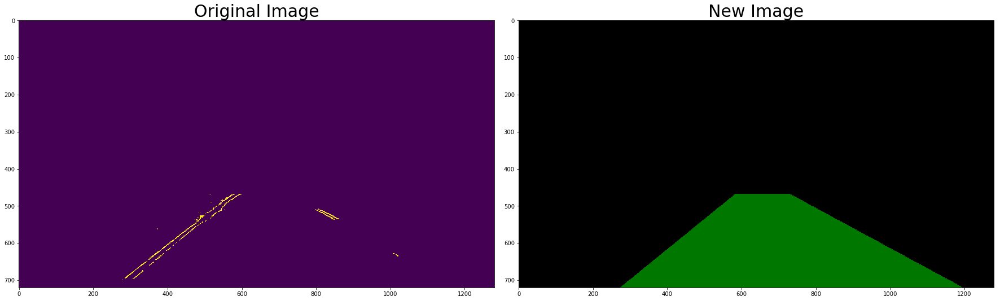

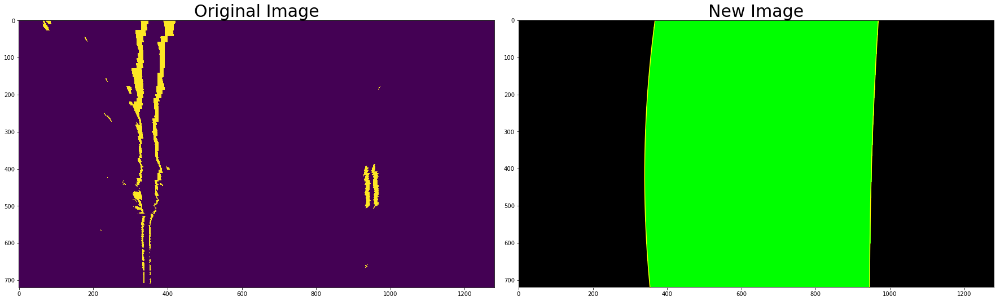

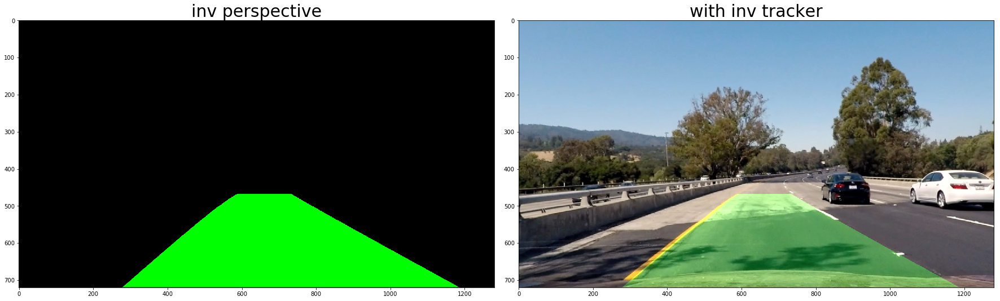

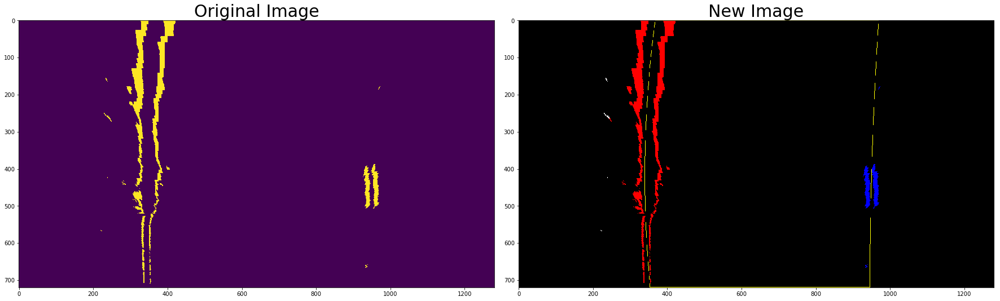

In [18]:
left_fit, right_fit, left_fit_real, right_fit_real, left_fitx, right_fitx, y_points, sImg = \
    sliding(masked_top_down_binary, left_fit, right_fit, \
            undist, combined_binary, edges, lineImage, top_down_binary, \
            draw=True);

# Create an image to draw the lines on
warp_zero = np.zeros_like(masked_top_down_binary).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

print(left_fitx.shape)
print(right_fitx.shape)
print(y_points.shape)
# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, y_points]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, y_points])))])
pts = np.hstack((pts_left, pts_right))

print("pts", pts)
# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
plotImage(color_warp)


# Warp the blank back to original image space using inverse perspective matrix (Minv)
Minv = cv2.getPerspectiveTransform(dst, src)
revertwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(undist, 1, revertwarp, 0.3, 0)

print(left_fit_real)
print(right_fit_real)

plotOrigAndNew(revertwarp, result, origTitle='inv perspective', newTitle='with inv tracker')
plotOrigAndNew(masked_top_down_binary, sImg)

### Measure Curvature

In [19]:
# Define conversions in x and y from pixels space to meters
#ym_per_pix = 30/720 # meters per pixel in y dimension
#xm_per_pix = 3.7/700 # meters per pixel in x dimension
def curvaturefinding(left_fit_real, right_fit_real, ym_per_pix=30/720, xm_per_pix=3.7/1280):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = y_size-1
    #f(y)=Ay^2+By+C
    #f(y)
    #Rcurve=((1+(2Ay+B)^2)^3/2)/∣2A∣

    left_curverad = ((1 + (2*left_fit_real[0]*y_eval*ym_per_pix + left_fit_real[1])**2)**1.5) / np.absolute(2*left_fit_real[0])
    right_curverad = ((1 + (2*right_fit_real[0]*y_eval*ym_per_pix + right_fit_real[1])**2)**1.5) / np.absolute(2*right_fit_real[0])
    avg_curverad = np.average([left_curverad, right_curverad])
    #print(left_curverad, 'm    ', right_curverad, 'm')
    return avg_curverad, left_curverad, right_curverad

def offsetfinding(left_fit, right_fit, ym_per_pix=30/720, xm_per_pix=3.7/1280):
    y_eval = y_size-1
    #leftx  = left_fit_real[0]*y_eval**2 + left_fit_real[1]*y_eval + left_fit_real[2]
    #rightx = right_fit_real[0]*y_eval**2 + right_fit_real[1]*y_eval + right_fit_real[2]
    leftx  = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    rightx = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    offset = (x_size/2) - ((rightx-leftx)/2 + leftx)
    offset_real_world = offset*ym_per_pix
    #print("leftx=%f, rightx=%f, offset=%f, offset_real_world=%f" % (leftx, rightx, offset, offset_real_world))
    return offset_real_world

print("curvature(average, \tleft, \t\tright)")
print(curvaturefinding(left_fit, right_fit))
offset = offsetfinding(left_fit, right_fit)
if (offset < 0):
    print("offset: %fm to the right from center of image, left_fit_real=%a, right_fit_real=%a" % (-1*offset, left_fit, right_fit))
else:
    print("offset: %fm to the left from center of image, left_fit_real=%a, right_fit_real=%a" % (offset, left_fit, right_fit))


curvature(average, 	left, 		right)
(7327.4337009033725, 3205.904294913229, 11448.963106893516)
offset: 0.400420m to the right from center of image, left_fit_real=array([  1.59585080e-04,  -1.33765855e-01,   3.67577302e+02]), right_fit_real=array([  4.39178922e-05,  -6.38598787e-02,   9.68532662e+02])


## Test on Images and Videos

First, I will demo the testing of my pipeline over provided still images to make sure pipeline works properly. Images from test_image directory include:

`test1.jpg`
`test2.jpg`
`test3.jpg`
`test4.jpg`
`test5.jpg`
`test6.jpg`
`test7.jpg`

Then I will test our solution on provided video:

`project_video.mp4`

For challenge, we will try it on the following videos:

`challenge_video.mp4`
`harder_challenge_video.mp4`

In [20]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [21]:
class pipeline:
    # processing pipeline
    # setup parameters
    frame = 0
    prev_coor = None  # track the previous src coordinate identified
    left_fit = None
    right_fit = None
    prev_leftx = np.zeros(720)  # track the previous leftx points identified
    prev_rightx = np.zeros(720)  # track the previous rightx points identified
    prev_left_fit_real = None  # track the previous left_fit_real coefficent identified
    prev_right_fit_real = None # track the previous right_fit_real coefficent identified
    thtype = 'rgslxy'
    
    def __init__(self, thtype):
        self.frame = 0
        self.prev_coor = None
        self.left_fit = None
        self.right_fit = None
        self.prev_left_fit_real = None
        self.prev_right_fit_real = None
        self.thtype = thtype

    def process_image(self, image):
        # NOTE: The output you return should be a color image (3 channel) for processing video below
        # TODO: put your pipeline here,
        # you should return the final output (image where lines are drawn on lanes)

        self.frame+=1

        #Advanced pipeline
        #Undistort test pipeline image
        undist = undistort_image(image)

        #Apply thresholds to color channels and sobelX gradient
        # output :combine_rgslm_binary, combine_sx_binary, combine_sxl_binary, combine_rgsx_binary, \
        #         r_binary, g_binary, s_binary, l_binary, x_binary, mag_binary
        
        combined_binary = threshold_edges(undist, r_thresh, g_thresh, s_thresh, l_thresh, \
                                            x_thresh, mag_thresh, kernel_size, thtype=self.thtype)
        
        #combined_binary, c_sx_b, c_sxl_b, c_rgslx_b, r_b, g_b, s_b, l_b, x_b, m_b = \
        #    threshold_edges(undist, r_thresh, g_thresh, s_thresh, l_thresh, \
        #                    x_thresh, mag_thresh, kernel_size, thtype='all')

        #print("combined_binary.shape:", combined_binary.shape)
        
        # define region of interest for road imaage
        corps=region_of_interest(combined_binary, [roadVertices])
        #print("combined_binary.shape", combined_binary.shape)
        
        # apply Hough Transform
        lineImage, coor = hough_lines(corps, rho, theta, 25, 25, 250)
        #print("lineImage.shape", lineImage.shape)
        
        #sanity check - if can't identify the src coordinates from current frame, use previous
        if (len(coor)==4):
            src = np.array([coor[0], coor[1], coor[2], coor[3]], np.float32)
            self.prev_coor = coor
        elif (self.prev_coor is not None):
            print("sanity failed: less than 4 coor: ", coor)
            src = np.array([self.prev_coor[0], self.prev_coor[1], self.prev_coor[2], self.prev_coor[3]], np.float32)
        else:
            src = np.array([roadVertices[1], roadVertices[2], roadVertices[3], roadVertices[0]], np.float32)
            
        # apply prespective transform for curvature calculation
        dst = np.array([(350, 0), (350, 720), (950, 720), (950, 0)], np.float32)
        top_down_binary = pTransWrap(combined_binary, src, dst)
              
        #apply mask to top_down_binary to limit to two vertical areas
        laneVertices = np.array([[320,720], [500,720], [700,100], [900,720], [1100, 720], [1100,0], [320,0]])
        masked_top_down_binary = region_of_interest(top_down_binary, np.array([laneVertices]))

        if(self.frame >= 2000):
            draw1 = True
        else:
            draw1 = False
        
        # apply sliding to for fitting and curvation calculation
        if self.left_fit is None or self.right_fit is None:
            #self.left_fit, self.right_fit, left_fit_real, right_fit_real, leftx, rightx, yx = \
            #    slidingfit1(top_down_binary, draw=False)
            self.left_fit, self.right_fit, left_fit_real, right_fit_real, leftx, rightx, yx, slideImg = \
                slidingfit1(masked_top_down_binary, draw=draw1)
        else:
            #self.left_fit, self.right_fit, left_fit_real, right_fit_real, leftx, rightx, yx = \
            #   sliding(masked_top_down_binary, self.left_fit, self.right_fit, \
            #           undist, combined_binary, corps, lineImage, top_down_binary, draw=draw1)
            self.left_fit, self.right_fit, left_fit_real, right_fit_real, leftx, rightx, yx, slideImg = \
                sliding(masked_top_down_binary, self.left_fit, self.right_fit, \
                        undist, combined_binary, corps, lineImage, top_down_binary, draw=False)
        
        
        #sanity check - if left_fit and right_fit are not in parallel or same direction from current frame, then use previous
        # no sliding window found - load previous data point
        if (self.left_fit is None or self.right_fit is None or len(self.left_fit)==0 or len(self.right_fit)==0):
            print("sanity failed: no left_fit or right_fit found from sliding. use previous data")
            if (self.prev_leftx is not None):
                leftx = self.prev_leftx
                rightx = self.prev_rightx
                left_fit_real = self.prev_left_fit_real
                right_fit_real = self.prev_right_fit_real
            self.left_fit = None
            self.rightfit = None
        else:
            delta = rightx - leftx
            if ((np.amax(delta)-np.amin(delta))/np.amin(delta) >= 0.25):
                print("sanity failed: large delta: max %d min %d" % (np.amax(delta), np.amin(delta)))
                # reset left_fit and right_fit at next frame
                self.left_fit = None
                self.right_fit = None 
                if (self.prev_leftx is not None):
                    leftx = self.prev_leftx
                    rightx = self.prev_rightx
                    left_fit_real = self.prev_left_fit_real
                    right_fit_real = self.prev_right_fit_real
            else:
                self.prev_leftx = leftx
                self.prev_rightx = rightx
                self.prev_left_fit_real = left_fit_real
                self.prev_right_fit_real = right_fit_real
        
        
        # Create an image to draw the lines on
        warp_zero = np.zeros_like(top_down_binary).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        if (leftx is not None and rightx is not None):
            # Recast the x and y points into usable format for cv2.fillPoly()
            pts_left = np.array([np.transpose(np.vstack([leftx, yx]))])
            pts_right = np.array([np.flipud(np.transpose(np.vstack([rightx, yx])))])
            pts = np.hstack((pts_left, pts_right))

            #print("points:", pts)
            # Draw the lane onto the warped blank image
            cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
            
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        Minv = cv2.getPerspectiveTransform(dst, src)
        revertwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 

        # Combine the result with the original image
        result = cv2.addWeighted(undist, 1, revertwarp, 0.3, 0)

        # overlap sliding windows on result image
        x_offset=1000
        y_offset=50
        smallSlideImg = cv2.resize(slideImg, (280, 196))
        result[y_offset:y_offset+smallSlideImg.shape[0], x_offset:x_offset+smallSlideImg.shape[1]] = smallSlideImg[::-1]
        #smallSlideImg.copyTo(result)
        
        if (left_fit_real is not None and right_fit_real is not None and self.left_fit is not None and self.right_fit is not None):
            # curvature calculation
            avg_radius, left_radius, right_radius = curvaturefinding(left_fit_real, right_fit_real)

            # offset to center of road calculation
            offset = offsetfinding(self.left_fit, self.right_fit)
            if (offset < 0):
                text_offset = "offset: %fm to the right from center" % (-1*offset)
            else:
                text_offset = "offset: %fm to the left from center" % (offset)

            #print Radius to image
            text_radius = "frame:%4d  Radius A:%5dm  L:%5dm  R:%5dm " % (self.frame, avg_radius, left_radius,right_radius)
            cv2.putText(result, text_radius, (100,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
            cv2.putText(result, text_offset, (100,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)

        print("frame:", self.frame)
        
        return result

slidingfit1: [  1.93931322e-04  -2.01292658e-01   4.05409655e+02] [  1.68043010e-04  -1.98488817e-01   1.01466519e+03]
frame: 1
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


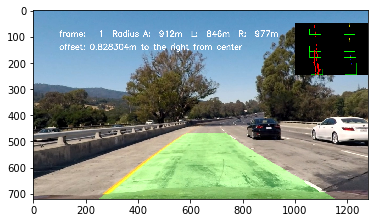

In [22]:
#testimage = mpimg.imread('test_images/' + testImages[0])
testimage = mpimg.imread('test_images/test1.jpg')
a = pipeline(thtype='rgslxy')
outputimage = a.process_image(testimage)
plotImage(outputimage)

frame: 2
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


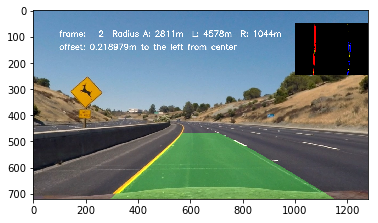

In [23]:
testimage = mpimg.imread('test_images/test2.jpg')
outputimage = a.process_image(testimage)
plotImage(outputimage)

Let's try the one with the solid white lane on the right first ...

frame: 3
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


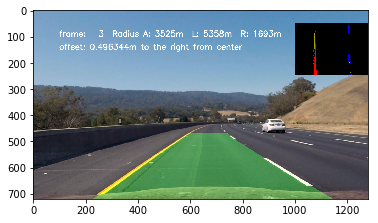

In [24]:
testimage = mpimg.imread('test_images/test3.jpg')
outputimage = a.process_image(testimage)
plotImage(outputimage)

frame: 4
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


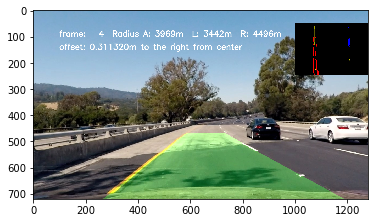

In [25]:
testimage = mpimg.imread('test_images/test4.jpg')
outputimage = a.process_image(testimage)
plotImage(outputimage)

frame: 5
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


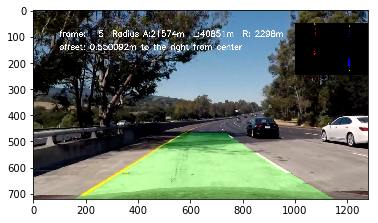

In [26]:
testimage = mpimg.imread('test_images/test5.jpg')
outputimage = a.process_image(testimage)
plotImage(outputimage)

frame: 6
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


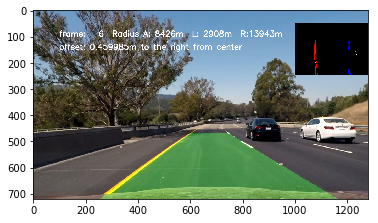

In [27]:
testimage = mpimg.imread('test_images/test6.jpg')
outputimage = a.process_image(testimage)
plotImage(outputimage)

frame: 7
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


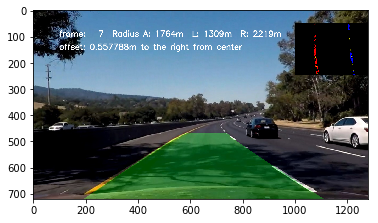

In [28]:
testimage = mpimg.imread('test_images/test7.jpg')
outputimage = a.process_image(testimage)
plotImage(outputimage)

In [29]:
project_output = 'test_video_outputs/project_video-revised.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
b = pipeline(thtype='rgslxy')
project_clip = clip1.fl_image(b.process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

slidingfit1: [ -8.24829044e-05   8.85115222e-02   3.29385994e+02] [  4.51869980e-05  -4.04389590e-03   9.44528268e+02]
frame: 1
[MoviePy] >>>> Building video test_video_outputs/project_video-revised.mp4
[MoviePy] Writing video test_video_outputs/project_video-revised.mp4


  0%|                                                                                         | 0/1261 [00:00<?, ?it/s]

frame: 2


  0%|                                                                                 | 1/1261 [00:00<05:57,  3.52it/s]

frame: 3


  0%|▏                                                                                | 2/1261 [00:00<05:26,  3.86it/s]

frame: 4


  0%|▏                                                                                | 3/1261 [00:00<05:01,  4.17it/s]

frame: 5


  0%|▎                                                                                | 4/1261 [00:00<04:45,  4.40it/s]

frame: 6


  0%|▎                                                                                | 5/1261 [00:01<04:38,  4.51it/s]

frame: 7


  0%|▍                                                                                | 6/1261 [00:01<04:40,  4.48it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(573, 468), (292, 720)]
frame: 8


  1%|▍                                                                                | 7/1261 [00:01<05:10,  4.04it/s]

frame: 9


  1%|▌                                                                                | 8/1261 [00:01<04:48,  4.35it/s]

frame: 10


  1%|▌                                                                                | 9/1261 [00:01<04:31,  4.60it/s]

frame: 11


  1%|▋                                                                               | 10/1261 [00:02<04:19,  4.81it/s]

frame: 12


  1%|▋                                                                               | 11/1261 [00:02<04:08,  5.02it/s]

frame: 13


  1%|▊                                                                               | 12/1261 [00:02<04:02,  5.15it/s]

frame: 14


  1%|▊                                                                               | 13/1261 [00:02<03:59,  5.21it/s]

frame: 15


  1%|▉                                                                               | 14/1261 [00:02<03:54,  5.31it/s]

frame: 16


  1%|▉                                                                               | 15/1261 [00:03<03:50,  5.42it/s]

frame: 17


  1%|█                                                                               | 16/1261 [00:03<03:45,  5.53it/s]

frame: 18


  1%|█                                                                               | 17/1261 [00:03<03:44,  5.55it/s]

frame: 19


  1%|█▏                                                                              | 18/1261 [00:03<03:42,  5.58it/s]

frame: 20


  2%|█▏                                                                              | 19/1261 [00:03<03:42,  5.57it/s]

frame: 21


  2%|█▎                                                                              | 20/1261 [00:03<03:45,  5.49it/s]

frame: 22


  2%|█▎                                                                              | 21/1261 [00:04<03:44,  5.53it/s]

frame: 23


  2%|█▍                                                                              | 22/1261 [00:04<03:48,  5.42it/s]

frame: 24


  2%|█▍                                                                              | 23/1261 [00:04<03:47,  5.43it/s]

frame: 25


  2%|█▌                                                                              | 24/1261 [00:04<03:58,  5.20it/s]

frame: 26


  2%|█▌                                                                              | 25/1261 [00:04<04:05,  5.03it/s]

frame: 27


  2%|█▋                                                                              | 26/1261 [00:05<04:13,  4.87it/s]

frame: 28


  2%|█▋                                                                              | 27/1261 [00:05<04:19,  4.75it/s]

frame: 29


  2%|█▊                                                                              | 28/1261 [00:05<04:13,  4.87it/s]

frame: 30


  2%|█▊                                                                              | 29/1261 [00:05<04:38,  4.42it/s]

frame: 31


  2%|█▉                                                                              | 30/1261 [00:06<05:40,  3.62it/s]

frame: 32


  2%|█▉                                                                              | 31/1261 [00:06<05:48,  3.53it/s]

frame: 33


  3%|██                                                                              | 32/1261 [00:06<05:36,  3.65it/s]

frame: 34


  3%|██                                                                              | 33/1261 [00:07<05:18,  3.85it/s]

frame: 35


  3%|██▏                                                                             | 34/1261 [00:07<04:47,  4.27it/s]

frame: 36


  3%|██▏                                                                             | 35/1261 [00:07<04:28,  4.57it/s]

frame: 37


  3%|██▎                                                                             | 36/1261 [00:07<04:13,  4.84it/s]

frame: 38


  3%|██▎                                                                             | 37/1261 [00:07<04:04,  5.00it/s]

frame: 39


  3%|██▍                                                                             | 38/1261 [00:07<03:57,  5.14it/s]

frame: 40


  3%|██▍                                                                             | 39/1261 [00:08<04:00,  5.08it/s]

frame: 41


  3%|██▌                                                                             | 40/1261 [00:08<03:57,  5.15it/s]

frame: 42


  3%|██▌                                                                             | 41/1261 [00:08<03:54,  5.20it/s]

frame: 43


  3%|██▋                                                                             | 42/1261 [00:08<03:46,  5.38it/s]

frame: 44


  3%|██▋                                                                             | 43/1261 [00:08<03:47,  5.36it/s]

frame: 45


  3%|██▊                                                                             | 44/1261 [00:09<03:47,  5.36it/s]

frame: 46


  4%|██▊                                                                             | 45/1261 [00:09<03:46,  5.36it/s]

frame: 47


  4%|██▉                                                                             | 46/1261 [00:09<03:45,  5.39it/s]

frame: 48


  4%|██▉                                                                             | 47/1261 [00:09<03:42,  5.46it/s]

frame: 49


  4%|███                                                                             | 48/1261 [00:09<03:41,  5.47it/s]

frame: 50


  4%|███                                                                             | 49/1261 [00:09<03:43,  5.42it/s]

frame: 51


  4%|███▏                                                                            | 50/1261 [00:10<03:44,  5.39it/s]

frame: 52


  4%|███▏                                                                            | 51/1261 [00:10<03:44,  5.39it/s]

frame: 53


  4%|███▎                                                                            | 52/1261 [00:10<03:50,  5.24it/s]

frame: 54


  4%|███▎                                                                            | 53/1261 [00:10<03:48,  5.29it/s]

frame: 55


  4%|███▍                                                                            | 54/1261 [00:10<03:48,  5.29it/s]

frame: 56


  4%|███▍                                                                            | 55/1261 [00:11<03:45,  5.35it/s]

frame: 57


  4%|███▌                                                                            | 56/1261 [00:11<03:54,  5.14it/s]

frame: 58


  5%|███▌                                                                            | 57/1261 [00:11<04:02,  4.96it/s]

frame: 59


  5%|███▋                                                                            | 58/1261 [00:11<04:01,  4.97it/s]

frame: 60


  5%|███▋                                                                            | 59/1261 [00:11<04:03,  4.94it/s]

frame: 61


  5%|███▊                                                                            | 60/1261 [00:12<04:13,  4.74it/s]

frame: 62


  5%|███▊                                                                            | 61/1261 [00:12<04:18,  4.64it/s]

frame: 63


  5%|███▉                                                                            | 62/1261 [00:12<04:49,  4.14it/s]

frame: 64


  5%|███▉                                                                            | 63/1261 [00:12<04:53,  4.08it/s]

frame: 65


  5%|████                                                                            | 64/1261 [00:13<05:13,  3.81it/s]

frame: 66


  5%|████                                                                            | 65/1261 [00:13<05:08,  3.88it/s]

frame: 67


  5%|████▏                                                                           | 66/1261 [00:13<05:04,  3.92it/s]

frame: 68


  5%|████▎                                                                           | 67/1261 [00:14<05:08,  3.88it/s]

frame: 69


  5%|████▎                                                                           | 68/1261 [00:14<05:17,  3.76it/s]

frame: 70


  5%|████▍                                                                           | 69/1261 [00:14<05:23,  3.69it/s]

frame: 71


  6%|████▍                                                                           | 70/1261 [00:14<05:35,  3.55it/s]

frame: 72


  6%|████▌                                                                           | 71/1261 [00:15<05:29,  3.62it/s]

frame: 73


  6%|████▌                                                                           | 72/1261 [00:15<05:27,  3.63it/s]

frame: 74


  6%|████▋                                                                           | 73/1261 [00:15<05:23,  3.67it/s]

frame: 75


  6%|████▋                                                                           | 74/1261 [00:16<05:37,  3.52it/s]

frame: 76


  6%|████▊                                                                           | 75/1261 [00:16<05:33,  3.55it/s]

frame: 77


  6%|████▊                                                                           | 76/1261 [00:16<05:28,  3.61it/s]

frame: 78


  6%|████▉                                                                           | 77/1261 [00:16<05:15,  3.75it/s]

frame: 79


  6%|████▉                                                                           | 78/1261 [00:17<05:06,  3.86it/s]

frame: 80


  6%|█████                                                                           | 79/1261 [00:17<05:00,  3.94it/s]

frame: 81


  6%|█████                                                                           | 80/1261 [00:17<04:55,  4.00it/s]

frame: 82


  6%|█████▏                                                                          | 81/1261 [00:17<04:51,  4.04it/s]

frame: 83


  7%|█████▏                                                                          | 82/1261 [00:18<04:49,  4.08it/s]

frame: 84


  7%|█████▎                                                                          | 83/1261 [00:18<04:44,  4.14it/s]

frame: 85


  7%|█████▎                                                                          | 84/1261 [00:18<04:46,  4.11it/s]

frame: 86


  7%|█████▍                                                                          | 85/1261 [00:18<04:42,  4.16it/s]

frame: 87


  7%|█████▍                                                                          | 86/1261 [00:18<04:42,  4.16it/s]

frame: 88


  7%|█████▌                                                                          | 87/1261 [00:19<04:35,  4.25it/s]

frame: 89


  7%|█████▌                                                                          | 88/1261 [00:19<04:33,  4.29it/s]

frame: 90


  7%|█████▋                                                                          | 89/1261 [00:19<04:32,  4.30it/s]

frame: 91


  7%|█████▋                                                                          | 90/1261 [00:19<04:30,  4.32it/s]

frame: 92


  7%|█████▊                                                                          | 91/1261 [00:20<04:26,  4.39it/s]

frame: 93


  7%|█████▊                                                                          | 92/1261 [00:20<04:22,  4.45it/s]

frame: 94


  7%|█████▉                                                                          | 93/1261 [00:20<04:21,  4.46it/s]

frame: 95


  7%|█████▉                                                                          | 94/1261 [00:20<04:21,  4.46it/s]

frame: 96


  8%|██████                                                                          | 95/1261 [00:20<04:23,  4.43it/s]

frame: 97


  8%|██████                                                                          | 96/1261 [00:21<04:25,  4.39it/s]

frame: 98


  8%|██████▏                                                                         | 97/1261 [00:21<04:27,  4.34it/s]

frame: 99


  8%|██████▏                                                                         | 98/1261 [00:21<04:30,  4.31it/s]

frame: 100


  8%|██████▎                                                                         | 99/1261 [00:21<04:25,  4.38it/s]

frame: 101


  8%|██████▎                                                                        | 100/1261 [00:22<04:27,  4.34it/s]

frame: 102


  8%|██████▎                                                                        | 101/1261 [00:22<04:27,  4.33it/s]

frame: 103


  8%|██████▍                                                                        | 102/1261 [00:22<04:22,  4.42it/s]

frame: 104


  8%|██████▍                                                                        | 103/1261 [00:22<04:29,  4.30it/s]

frame: 105


  8%|██████▌                                                                        | 104/1261 [00:23<04:33,  4.23it/s]

frame: 106


  8%|██████▌                                                                        | 105/1261 [00:23<04:34,  4.21it/s]

frame: 107


  8%|██████▋                                                                        | 106/1261 [00:23<04:41,  4.10it/s]

frame: 108


  8%|██████▋                                                                        | 107/1261 [00:23<04:35,  4.18it/s]

frame: 109


  9%|██████▊                                                                        | 108/1261 [00:24<04:34,  4.21it/s]

frame: 110


  9%|██████▊                                                                        | 109/1261 [00:24<04:38,  4.14it/s]

frame: 111


  9%|██████▉                                                                        | 110/1261 [00:24<04:48,  3.99it/s]

frame: 112


  9%|██████▉                                                                        | 111/1261 [00:24<04:45,  4.03it/s]

frame: 113


  9%|███████                                                                        | 112/1261 [00:25<04:51,  3.94it/s]

frame: 114


  9%|███████                                                                        | 113/1261 [00:25<04:40,  4.09it/s]

frame: 115


  9%|███████▏                                                                       | 114/1261 [00:25<04:39,  4.10it/s]

frame: 116


  9%|███████▏                                                                       | 115/1261 [00:25<04:35,  4.17it/s]

frame: 117


  9%|███████▎                                                                       | 116/1261 [00:26<04:32,  4.20it/s]

frame: 118


  9%|███████▎                                                                       | 117/1261 [00:26<04:40,  4.08it/s]

frame: 119


  9%|███████▍                                                                       | 118/1261 [00:26<04:41,  4.06it/s]

frame: 120


  9%|███████▍                                                                       | 119/1261 [00:26<04:52,  3.91it/s]

frame: 121


 10%|███████▌                                                                       | 120/1261 [00:27<04:42,  4.04it/s]

frame: 122


 10%|███████▌                                                                       | 121/1261 [00:27<04:36,  4.12it/s]

frame: 123


 10%|███████▋                                                                       | 122/1261 [00:27<04:33,  4.16it/s]

frame: 124


 10%|███████▋                                                                       | 123/1261 [00:27<04:29,  4.22it/s]

frame: 125


 10%|███████▊                                                                       | 124/1261 [00:27<04:21,  4.36it/s]

frame: 126


 10%|███████▊                                                                       | 125/1261 [00:28<04:08,  4.57it/s]

frame: 127


 10%|███████▉                                                                       | 126/1261 [00:28<03:58,  4.76it/s]

frame: 128


 10%|███████▉                                                                       | 127/1261 [00:28<03:48,  4.95it/s]

frame: 129


 10%|████████                                                                       | 128/1261 [00:28<03:43,  5.06it/s]

frame: 130


 10%|████████                                                                       | 129/1261 [00:28<03:39,  5.15it/s]

frame: 131


 10%|████████▏                                                                      | 130/1261 [00:29<03:37,  5.21it/s]

frame: 132


 10%|████████▏                                                                      | 131/1261 [00:29<03:37,  5.21it/s]

frame: 133


 10%|████████▎                                                                      | 132/1261 [00:29<03:39,  5.15it/s]

frame: 134


 11%|████████▎                                                                      | 133/1261 [00:29<03:37,  5.18it/s]

frame: 135


 11%|████████▍                                                                      | 134/1261 [00:29<03:39,  5.15it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(575, 468), (298, 720)]
frame: 136


 11%|████████▍                                                                      | 135/1261 [00:30<04:06,  4.58it/s]

frame: 137


 11%|████████▌                                                                      | 136/1261 [00:30<04:04,  4.60it/s]

frame: 138


 11%|████████▌                                                                      | 137/1261 [00:30<04:00,  4.68it/s]

frame: 139


 11%|████████▋                                                                      | 138/1261 [00:30<03:54,  4.79it/s]

frame: 140


 11%|████████▋                                                                      | 139/1261 [00:30<04:00,  4.66it/s]

frame: 141


 11%|████████▊                                                                      | 140/1261 [00:31<03:56,  4.74it/s]

frame: 142


 11%|████████▊                                                                      | 141/1261 [00:31<03:52,  4.82it/s]

frame: 143


 11%|████████▉                                                                      | 142/1261 [00:31<03:50,  4.86it/s]

frame: 144


 11%|████████▉                                                                      | 143/1261 [00:31<04:05,  4.56it/s]

frame: 145


 11%|█████████                                                                      | 144/1261 [00:32<04:21,  4.26it/s]

frame: 146


 11%|█████████                                                                      | 145/1261 [00:32<04:25,  4.21it/s]

frame: 147


 12%|█████████▏                                                                     | 146/1261 [00:32<04:29,  4.13it/s]

frame: 148


 12%|█████████▏                                                                     | 147/1261 [00:32<04:29,  4.13it/s]

frame: 149


 12%|█████████▎                                                                     | 148/1261 [00:33<04:18,  4.30it/s]

frame: 150


 12%|█████████▎                                                                     | 149/1261 [00:33<04:04,  4.55it/s]

frame: 151


 12%|█████████▍                                                                     | 150/1261 [00:33<03:54,  4.73it/s]

frame: 152


 12%|█████████▍                                                                     | 151/1261 [00:33<03:49,  4.83it/s]

frame: 153


 12%|█████████▌                                                                     | 152/1261 [00:33<03:44,  4.93it/s]

frame: 154


 12%|█████████▌                                                                     | 153/1261 [00:33<03:39,  5.06it/s]

frame: 155


 12%|█████████▋                                                                     | 154/1261 [00:34<03:37,  5.10it/s]

frame: 156


 12%|█████████▋                                                                     | 155/1261 [00:34<03:36,  5.10it/s]

frame: 157


 12%|█████████▊                                                                     | 156/1261 [00:34<03:33,  5.17it/s]

frame: 158


 12%|█████████▊                                                                     | 157/1261 [00:34<03:33,  5.17it/s]

frame: 159


 13%|█████████▉                                                                     | 158/1261 [00:34<03:34,  5.13it/s]

frame: 160


 13%|█████████▉                                                                     | 159/1261 [00:35<03:40,  5.00it/s]

frame: 161


 13%|██████████                                                                     | 160/1261 [00:35<03:45,  4.88it/s]

frame: 162


 13%|██████████                                                                     | 161/1261 [00:35<03:43,  4.92it/s]

frame: 163


 13%|██████████▏                                                                    | 162/1261 [00:35<03:40,  4.99it/s]

frame: 164


 13%|██████████▏                                                                    | 163/1261 [00:35<03:37,  5.05it/s]

frame: 165


 13%|██████████▎                                                                    | 164/1261 [00:36<03:41,  4.96it/s]

frame: 166


 13%|██████████▎                                                                    | 165/1261 [00:36<03:43,  4.91it/s]

frame: 167


 13%|██████████▍                                                                    | 166/1261 [00:36<03:40,  4.97it/s]

frame: 168


 13%|██████████▍                                                                    | 167/1261 [00:36<03:40,  4.96it/s]

frame: 169


 13%|██████████▌                                                                    | 168/1261 [00:36<03:35,  5.08it/s]

frame: 170


 13%|██████████▌                                                                    | 169/1261 [00:37<03:36,  5.06it/s]

frame: 171


 13%|██████████▋                                                                    | 170/1261 [00:37<03:33,  5.11it/s]

frame: 172


 14%|██████████▋                                                                    | 171/1261 [00:37<03:34,  5.09it/s]

frame: 173


 14%|██████████▊                                                                    | 172/1261 [00:37<03:39,  4.97it/s]

frame: 174


 14%|██████████▊                                                                    | 173/1261 [00:38<03:50,  4.72it/s]

frame: 175


 14%|██████████▉                                                                    | 174/1261 [00:38<03:52,  4.67it/s]

frame: 176


 14%|██████████▉                                                                    | 175/1261 [00:38<03:49,  4.73it/s]

frame: 177


 14%|███████████                                                                    | 176/1261 [00:38<03:43,  4.85it/s]

frame: 178


 14%|███████████                                                                    | 177/1261 [00:38<03:42,  4.88it/s]

frame: 179


 14%|███████████▏                                                                   | 178/1261 [00:39<03:39,  4.92it/s]

frame: 180


 14%|███████████▏                                                                   | 179/1261 [00:39<03:37,  4.97it/s]

frame: 181


 14%|███████████▎                                                                   | 180/1261 [00:39<03:35,  5.02it/s]

frame: 182


 14%|███████████▎                                                                   | 181/1261 [00:39<03:43,  4.84it/s]

frame: 183


 14%|███████████▍                                                                   | 182/1261 [00:39<03:49,  4.69it/s]

frame: 184


 15%|███████████▍                                                                   | 183/1261 [00:40<03:54,  4.60it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(565, 468), (254, 720)]
frame: 185


 15%|███████████▌                                                                   | 184/1261 [00:40<04:24,  4.08it/s]

frame: 186


 15%|███████████▌                                                                   | 185/1261 [00:40<04:17,  4.19it/s]

frame: 187


 15%|███████████▋                                                                   | 186/1261 [00:40<04:16,  4.19it/s]

frame: 188


 15%|███████████▋                                                                   | 187/1261 [00:41<04:21,  4.11it/s]

frame: 189


 15%|███████████▊                                                                   | 188/1261 [00:41<04:20,  4.12it/s]

frame: 190


 15%|███████████▊                                                                   | 189/1261 [00:41<04:18,  4.14it/s]

frame: 191


 15%|███████████▉                                                                   | 190/1261 [00:41<04:16,  4.18it/s]

frame: 192


 15%|███████████▉                                                                   | 191/1261 [00:42<04:03,  4.39it/s]

frame: 193


 15%|████████████                                                                   | 192/1261 [00:42<03:53,  4.58it/s]

frame: 194


 15%|████████████                                                                   | 193/1261 [00:42<03:49,  4.66it/s]

frame: 195


 15%|████████████▏                                                                  | 194/1261 [00:42<03:50,  4.63it/s]

frame: 196


 15%|████████████▏                                                                  | 195/1261 [00:42<03:54,  4.55it/s]

frame: 197


 16%|████████████▎                                                                  | 196/1261 [00:43<03:53,  4.56it/s]

frame: 198


 16%|████████████▎                                                                  | 197/1261 [00:43<04:01,  4.41it/s]

frame: 199


 16%|████████████▍                                                                  | 198/1261 [00:43<03:59,  4.43it/s]

frame: 200


 16%|████████████▍                                                                  | 199/1261 [00:43<04:02,  4.37it/s]

frame: 201


 16%|████████████▌                                                                  | 200/1261 [00:44<04:03,  4.36it/s]

frame: 202


 16%|████████████▌                                                                  | 201/1261 [00:44<04:01,  4.40it/s]

frame: 203


 16%|████████████▋                                                                  | 202/1261 [00:44<04:06,  4.30it/s]

frame: 204


 16%|████████████▋                                                                  | 203/1261 [00:44<04:04,  4.33it/s]

frame: 205


 16%|████████████▊                                                                  | 204/1261 [00:44<04:01,  4.37it/s]

frame: 206


 16%|████████████▊                                                                  | 205/1261 [00:45<03:59,  4.42it/s]

frame: 207


 16%|████████████▉                                                                  | 206/1261 [00:45<03:56,  4.46it/s]

frame: 208


 16%|████████████▉                                                                  | 207/1261 [00:45<03:54,  4.50it/s]

frame: 209


 16%|█████████████                                                                  | 208/1261 [00:45<03:50,  4.57it/s]

frame: 210


 17%|█████████████                                                                  | 209/1261 [00:46<03:49,  4.58it/s]

frame: 211


 17%|█████████████▏                                                                 | 210/1261 [00:46<03:52,  4.53it/s]

frame: 212


 17%|█████████████▏                                                                 | 211/1261 [00:46<03:48,  4.59it/s]

frame: 213


 17%|█████████████▎                                                                 | 212/1261 [00:46<03:40,  4.75it/s]

frame: 214


 17%|█████████████▎                                                                 | 213/1261 [00:46<03:42,  4.71it/s]

frame: 215


 17%|█████████████▍                                                                 | 214/1261 [00:47<03:37,  4.81it/s]

frame: 216


 17%|█████████████▍                                                                 | 215/1261 [00:47<03:32,  4.93it/s]

frame: 217


 17%|█████████████▌                                                                 | 216/1261 [00:47<03:27,  5.05it/s]

frame: 218


 17%|█████████████▌                                                                 | 217/1261 [00:47<03:28,  5.02it/s]

frame: 219


 17%|█████████████▋                                                                 | 218/1261 [00:47<03:25,  5.07it/s]

frame: 220


 17%|█████████████▋                                                                 | 219/1261 [00:48<03:24,  5.11it/s]

frame: 221


 17%|█████████████▊                                                                 | 220/1261 [00:48<03:19,  5.22it/s]

frame: 222


 18%|█████████████▊                                                                 | 221/1261 [00:48<03:19,  5.21it/s]

frame: 223


 18%|█████████████▉                                                                 | 222/1261 [00:48<03:19,  5.20it/s]

frame: 224


 18%|█████████████▉                                                                 | 223/1261 [00:48<03:21,  5.16it/s]

frame: 225


 18%|██████████████                                                                 | 224/1261 [00:49<03:26,  5.02it/s]

frame: 226


 18%|██████████████                                                                 | 225/1261 [00:49<03:26,  5.01it/s]

frame: 227


 18%|██████████████▏                                                                | 226/1261 [00:49<03:26,  5.02it/s]

frame: 228


 18%|██████████████▏                                                                | 227/1261 [00:49<03:25,  5.03it/s]

frame: 229


 18%|██████████████▎                                                                | 228/1261 [00:49<03:26,  4.99it/s]

frame: 230


 18%|██████████████▎                                                                | 229/1261 [00:50<03:28,  4.96it/s]

frame: 231


 18%|██████████████▍                                                                | 230/1261 [00:50<03:31,  4.88it/s]

frame: 232


 18%|██████████████▍                                                                | 231/1261 [00:50<03:30,  4.88it/s]

frame: 233


 18%|██████████████▌                                                                | 232/1261 [00:50<03:27,  4.95it/s]

frame: 234


 18%|██████████████▌                                                                | 233/1261 [00:50<03:24,  5.03it/s]

frame: 235


 19%|██████████████▋                                                                | 234/1261 [00:51<03:26,  4.97it/s]

frame: 236


 19%|██████████████▋                                                                | 235/1261 [00:51<03:26,  4.96it/s]

frame: 237


 19%|██████████████▊                                                                | 236/1261 [00:51<03:32,  4.83it/s]

frame: 238


 19%|██████████████▊                                                                | 237/1261 [00:51<03:27,  4.93it/s]

frame: 239


 19%|██████████████▉                                                                | 238/1261 [00:51<03:33,  4.78it/s]

frame: 240


 19%|██████████████▉                                                                | 239/1261 [00:52<03:33,  4.78it/s]

frame: 241


 19%|███████████████                                                                | 240/1261 [00:52<03:36,  4.72it/s]

frame: 242


 19%|███████████████                                                                | 241/1261 [00:52<03:31,  4.82it/s]

frame: 243


 19%|███████████████▏                                                               | 242/1261 [00:52<03:24,  4.99it/s]

frame: 244


 19%|███████████████▏                                                               | 243/1261 [00:52<03:28,  4.88it/s]

frame: 245


 19%|███████████████▎                                                               | 244/1261 [00:53<03:23,  5.00it/s]

frame: 246


 19%|███████████████▎                                                               | 245/1261 [00:53<03:24,  4.96it/s]

frame: 247


 20%|███████████████▍                                                               | 246/1261 [00:53<03:21,  5.03it/s]

frame: 248


 20%|███████████████▍                                                               | 247/1261 [00:53<03:19,  5.08it/s]

frame: 249


 20%|███████████████▌                                                               | 248/1261 [00:53<03:16,  5.15it/s]

frame: 250


 20%|███████████████▌                                                               | 249/1261 [00:54<03:16,  5.16it/s]

frame: 251


 20%|███████████████▋                                                               | 250/1261 [00:54<03:12,  5.24it/s]

frame: 252


 20%|███████████████▋                                                               | 251/1261 [00:54<03:14,  5.18it/s]

frame: 253


 20%|███████████████▊                                                               | 252/1261 [00:54<03:13,  5.21it/s]

frame: 254


 20%|███████████████▊                                                               | 253/1261 [00:54<03:13,  5.22it/s]

frame: 255


 20%|███████████████▉                                                               | 254/1261 [00:55<03:12,  5.22it/s]

frame: 256


 20%|███████████████▉                                                               | 255/1261 [00:55<03:13,  5.19it/s]

frame: 257


 20%|████████████████                                                               | 256/1261 [00:55<03:12,  5.21it/s]

frame: 258


 20%|████████████████                                                               | 257/1261 [00:55<03:12,  5.23it/s]

frame: 259


 20%|████████████████▏                                                              | 258/1261 [00:55<03:10,  5.26it/s]

frame: 260


 21%|████████████████▏                                                              | 259/1261 [00:55<03:12,  5.21it/s]

frame: 261


 21%|████████████████▎                                                              | 260/1261 [00:56<03:11,  5.24it/s]

frame: 262


 21%|████████████████▎                                                              | 261/1261 [00:56<03:13,  5.16it/s]

frame: 263


 21%|████████████████▍                                                              | 262/1261 [00:56<03:14,  5.13it/s]

frame: 264


 21%|████████████████▍                                                              | 263/1261 [00:56<03:14,  5.14it/s]

frame: 265


 21%|████████████████▌                                                              | 264/1261 [00:56<03:13,  5.14it/s]

frame: 266


 21%|████████████████▌                                                              | 265/1261 [00:57<03:13,  5.15it/s]

frame: 267


 21%|████████████████▋                                                              | 266/1261 [00:57<03:10,  5.22it/s]

frame: 268


 21%|████████████████▋                                                              | 267/1261 [00:57<03:13,  5.14it/s]

frame: 269


 21%|████████████████▊                                                              | 268/1261 [00:57<03:12,  5.15it/s]

frame: 270


 21%|████████████████▊                                                              | 269/1261 [00:57<03:10,  5.20it/s]

frame: 271


 21%|████████████████▉                                                              | 270/1261 [00:58<03:10,  5.20it/s]

frame: 272


 21%|████████████████▉                                                              | 271/1261 [00:58<03:09,  5.24it/s]

frame: 273


 22%|█████████████████                                                              | 272/1261 [00:58<03:08,  5.25it/s]

frame: 274


 22%|█████████████████                                                              | 273/1261 [00:58<03:07,  5.26it/s]

frame: 275


 22%|█████████████████▏                                                             | 274/1261 [00:58<03:07,  5.27it/s]

frame: 276


 22%|█████████████████▏                                                             | 275/1261 [00:59<03:08,  5.24it/s]

frame: 277


 22%|█████████████████▎                                                             | 276/1261 [00:59<03:07,  5.27it/s]

frame: 278


 22%|█████████████████▎                                                             | 277/1261 [00:59<03:10,  5.18it/s]

frame: 279


 22%|█████████████████▍                                                             | 278/1261 [00:59<03:09,  5.19it/s]

frame: 280


 22%|█████████████████▍                                                             | 279/1261 [00:59<03:09,  5.19it/s]

frame: 281


 22%|█████████████████▌                                                             | 280/1261 [01:00<03:09,  5.19it/s]

frame: 282


 22%|█████████████████▌                                                             | 281/1261 [01:00<03:08,  5.19it/s]

frame: 283


 22%|█████████████████▋                                                             | 282/1261 [01:00<03:06,  5.25it/s]

frame: 284


 22%|█████████████████▋                                                             | 283/1261 [01:00<03:06,  5.25it/s]

frame: 285


 23%|█████████████████▊                                                             | 284/1261 [01:00<03:12,  5.07it/s]

frame: 286


 23%|█████████████████▊                                                             | 285/1261 [01:01<03:13,  5.04it/s]

frame: 287


 23%|█████████████████▉                                                             | 286/1261 [01:01<03:18,  4.91it/s]

frame: 288


 23%|█████████████████▉                                                             | 287/1261 [01:01<03:19,  4.89it/s]

frame: 289


 23%|██████████████████                                                             | 288/1261 [01:01<03:17,  4.93it/s]

frame: 290


 23%|██████████████████                                                             | 289/1261 [01:01<03:13,  5.03it/s]

frame: 291


 23%|██████████████████▏                                                            | 290/1261 [01:02<03:12,  5.04it/s]

frame: 292


 23%|██████████████████▏                                                            | 291/1261 [01:02<03:08,  5.15it/s]

frame: 293


 23%|██████████████████▎                                                            | 292/1261 [01:02<03:07,  5.17it/s]

frame: 294


 23%|██████████████████▎                                                            | 293/1261 [01:02<03:07,  5.17it/s]

frame: 295


 23%|██████████████████▍                                                            | 294/1261 [01:02<03:09,  5.11it/s]

frame: 296


 23%|██████████████████▍                                                            | 295/1261 [01:02<03:06,  5.18it/s]

frame: 297


 23%|██████████████████▌                                                            | 296/1261 [01:03<03:05,  5.21it/s]

frame: 298


 24%|██████████████████▌                                                            | 297/1261 [01:03<03:03,  5.26it/s]

frame: 299


 24%|██████████████████▋                                                            | 298/1261 [01:03<03:03,  5.26it/s]

frame: 300


 24%|██████████████████▋                                                            | 299/1261 [01:03<03:01,  5.30it/s]

frame: 301


 24%|██████████████████▊                                                            | 300/1261 [01:03<03:02,  5.27it/s]

frame: 302


 24%|██████████████████▊                                                            | 301/1261 [01:04<03:02,  5.25it/s]

frame: 303


 24%|██████████████████▉                                                            | 302/1261 [01:04<03:02,  5.25it/s]

frame: 304


 24%|██████████████████▉                                                            | 303/1261 [01:04<03:01,  5.27it/s]

frame: 305


 24%|███████████████████                                                            | 304/1261 [01:04<03:02,  5.24it/s]

frame: 306


 24%|███████████████████                                                            | 305/1261 [01:04<03:02,  5.24it/s]

frame: 307


 24%|███████████████████▏                                                           | 306/1261 [01:05<03:12,  4.96it/s]

frame: 308


 24%|███████████████████▏                                                           | 307/1261 [01:05<03:17,  4.84it/s]

frame: 309


 24%|███████████████████▎                                                           | 308/1261 [01:05<03:17,  4.84it/s]

frame: 310


 25%|███████████████████▎                                                           | 309/1261 [01:05<03:12,  4.93it/s]

frame: 311


 25%|███████████████████▍                                                           | 310/1261 [01:05<03:10,  5.00it/s]

frame: 312


 25%|███████████████████▍                                                           | 311/1261 [01:06<03:08,  5.04it/s]

frame: 313


 25%|███████████████████▌                                                           | 312/1261 [01:06<03:17,  4.81it/s]

frame: 314


 25%|███████████████████▌                                                           | 313/1261 [01:06<03:33,  4.44it/s]

frame: 315


 25%|███████████████████▋                                                           | 314/1261 [01:06<03:41,  4.28it/s]

frame: 316


 25%|███████████████████▋                                                           | 315/1261 [01:07<03:35,  4.40it/s]

frame: 317


 25%|███████████████████▊                                                           | 316/1261 [01:07<03:30,  4.50it/s]

frame: 318


 25%|███████████████████▊                                                           | 317/1261 [01:07<03:24,  4.61it/s]

frame: 319


 25%|███████████████████▉                                                           | 318/1261 [01:07<03:19,  4.72it/s]

frame: 320


 25%|███████████████████▉                                                           | 319/1261 [01:07<03:15,  4.83it/s]

frame: 321


 25%|████████████████████                                                           | 320/1261 [01:08<03:12,  4.88it/s]

frame: 322


 25%|████████████████████                                                           | 321/1261 [01:08<03:13,  4.87it/s]

frame: 323


 26%|████████████████████▏                                                          | 322/1261 [01:08<03:26,  4.55it/s]

frame: 324


 26%|████████████████████▏                                                          | 323/1261 [01:08<03:23,  4.62it/s]

frame: 325


 26%|████████████████████▎                                                          | 324/1261 [01:08<03:20,  4.68it/s]

frame: 326


 26%|████████████████████▎                                                          | 325/1261 [01:09<03:14,  4.81it/s]

frame: 327


 26%|████████████████████▍                                                          | 326/1261 [01:09<03:15,  4.79it/s]

frame: 328


 26%|████████████████████▍                                                          | 327/1261 [01:09<03:12,  4.86it/s]

frame: 329


 26%|████████████████████▌                                                          | 328/1261 [01:09<03:12,  4.85it/s]

frame: 330


 26%|████████████████████▌                                                          | 329/1261 [01:09<03:09,  4.93it/s]

frame: 331


 26%|████████████████████▋                                                          | 330/1261 [01:10<03:16,  4.74it/s]

frame: 332


 26%|████████████████████▋                                                          | 331/1261 [01:10<03:17,  4.71it/s]

frame: 333


 26%|████████████████████▊                                                          | 332/1261 [01:10<03:17,  4.71it/s]

frame: 334


 26%|████████████████████▊                                                          | 333/1261 [01:10<03:11,  4.84it/s]

frame: 335


 26%|████████████████████▉                                                          | 334/1261 [01:11<03:08,  4.91it/s]

frame: 336


 27%|████████████████████▉                                                          | 335/1261 [01:11<03:06,  4.97it/s]

frame: 337


 27%|█████████████████████                                                          | 336/1261 [01:11<03:05,  4.98it/s]

frame: 338


 27%|█████████████████████                                                          | 337/1261 [01:11<03:08,  4.89it/s]

frame: 339


 27%|█████████████████████▏                                                         | 338/1261 [01:11<03:12,  4.80it/s]

frame: 340


 27%|█████████████████████▏                                                         | 339/1261 [01:12<03:16,  4.69it/s]

frame: 341


 27%|█████████████████████▎                                                         | 340/1261 [01:12<03:11,  4.80it/s]

frame: 342


 27%|█████████████████████▎                                                         | 341/1261 [01:12<03:04,  4.98it/s]

frame: 343


 27%|█████████████████████▍                                                         | 342/1261 [01:12<03:04,  4.99it/s]

frame: 344


 27%|█████████████████████▍                                                         | 343/1261 [01:12<03:03,  4.99it/s]

frame: 345


 27%|█████████████████████▌                                                         | 344/1261 [01:13<03:01,  5.06it/s]

frame: 346


 27%|█████████████████████▌                                                         | 345/1261 [01:13<03:00,  5.07it/s]

frame: 347


 27%|█████████████████████▋                                                         | 346/1261 [01:13<02:59,  5.11it/s]

frame: 348


 28%|█████████████████████▋                                                         | 347/1261 [01:13<02:55,  5.19it/s]

frame: 349


 28%|█████████████████████▊                                                         | 348/1261 [01:13<02:56,  5.17it/s]

frame: 350


 28%|█████████████████████▊                                                         | 349/1261 [01:13<02:55,  5.20it/s]

frame: 351


 28%|█████████████████████▉                                                         | 350/1261 [01:14<02:54,  5.21it/s]

frame: 352


 28%|█████████████████████▉                                                         | 351/1261 [01:14<02:53,  5.23it/s]

frame: 353


 28%|██████████████████████                                                         | 352/1261 [01:14<02:53,  5.24it/s]

frame: 354


 28%|██████████████████████                                                         | 353/1261 [01:14<02:54,  5.19it/s]

frame: 355


 28%|██████████████████████▏                                                        | 354/1261 [01:14<03:01,  4.99it/s]

frame: 356


 28%|██████████████████████▏                                                        | 355/1261 [01:15<02:56,  5.13it/s]

frame: 357


 28%|██████████████████████▎                                                        | 356/1261 [01:15<02:56,  5.13it/s]

frame: 358


 28%|██████████████████████▎                                                        | 357/1261 [01:15<02:55,  5.14it/s]

frame: 359


 28%|██████████████████████▍                                                        | 358/1261 [01:15<02:58,  5.06it/s]

frame: 360


 28%|██████████████████████▍                                                        | 359/1261 [01:15<03:01,  4.98it/s]

frame: 361


 29%|██████████████████████▌                                                        | 360/1261 [01:16<02:58,  5.06it/s]

frame: 362


 29%|██████████████████████▌                                                        | 361/1261 [01:16<02:56,  5.11it/s]

frame: 363


 29%|██████████████████████▋                                                        | 362/1261 [01:16<02:57,  5.07it/s]

frame: 364


 29%|██████████████████████▋                                                        | 363/1261 [01:16<03:00,  4.99it/s]

frame: 365


 29%|██████████████████████▊                                                        | 364/1261 [01:16<02:58,  5.04it/s]

frame: 366


 29%|██████████████████████▊                                                        | 365/1261 [01:17<02:55,  5.11it/s]

frame: 367


 29%|██████████████████████▉                                                        | 366/1261 [01:17<02:57,  5.05it/s]

frame: 368


 29%|██████████████████████▉                                                        | 367/1261 [01:17<02:56,  5.07it/s]

frame: 369


 29%|███████████████████████                                                        | 368/1261 [01:17<02:57,  5.04it/s]

frame: 370


 29%|███████████████████████                                                        | 369/1261 [01:17<02:54,  5.12it/s]

frame: 371


 29%|███████████████████████▏                                                       | 370/1261 [01:18<02:52,  5.15it/s]

frame: 372


 29%|███████████████████████▏                                                       | 371/1261 [01:18<02:51,  5.19it/s]

frame: 373


 30%|███████████████████████▎                                                       | 372/1261 [01:18<02:51,  5.20it/s]

frame: 374


 30%|███████████████████████▎                                                       | 373/1261 [01:18<02:48,  5.27it/s]

frame: 375


 30%|███████████████████████▍                                                       | 374/1261 [01:18<02:49,  5.23it/s]

frame: 376


 30%|███████████████████████▍                                                       | 375/1261 [01:19<02:47,  5.28it/s]

frame: 377


 30%|███████████████████████▌                                                       | 376/1261 [01:19<02:49,  5.23it/s]

frame: 378


 30%|███████████████████████▌                                                       | 377/1261 [01:19<02:48,  5.25it/s]

frame: 379


 30%|███████████████████████▋                                                       | 378/1261 [01:19<02:49,  5.21it/s]

frame: 380


 30%|███████████████████████▋                                                       | 379/1261 [01:19<02:49,  5.22it/s]

frame: 381


 30%|███████████████████████▊                                                       | 380/1261 [01:20<02:47,  5.26it/s]

frame: 382


 30%|███████████████████████▊                                                       | 381/1261 [01:20<02:48,  5.23it/s]

frame: 383


 30%|███████████████████████▉                                                       | 382/1261 [01:20<02:49,  5.19it/s]

frame: 384


 30%|███████████████████████▉                                                       | 383/1261 [01:20<02:48,  5.22it/s]

frame: 385


 30%|████████████████████████                                                       | 384/1261 [01:20<02:50,  5.13it/s]

frame: 386


 31%|████████████████████████                                                       | 385/1261 [01:20<02:48,  5.19it/s]

frame: 387


 31%|████████████████████████▏                                                      | 386/1261 [01:21<02:55,  4.98it/s]

frame: 388


 31%|████████████████████████▏                                                      | 387/1261 [01:21<02:57,  4.91it/s]

frame: 389


 31%|████████████████████████▎                                                      | 388/1261 [01:21<02:56,  4.94it/s]

frame: 390


 31%|████████████████████████▎                                                      | 389/1261 [01:21<02:53,  5.04it/s]

frame: 391


 31%|████████████████████████▍                                                      | 390/1261 [01:21<02:51,  5.09it/s]

frame: 392


 31%|████████████████████████▍                                                      | 391/1261 [01:22<02:50,  5.11it/s]

frame: 393


 31%|████████████████████████▌                                                      | 392/1261 [01:22<02:50,  5.10it/s]

frame: 394


 31%|████████████████████████▌                                                      | 393/1261 [01:22<02:46,  5.21it/s]

frame: 395


 31%|████████████████████████▋                                                      | 394/1261 [01:22<02:49,  5.10it/s]

frame: 396


 31%|████████████████████████▋                                                      | 395/1261 [01:22<02:47,  5.16it/s]

frame: 397


 31%|████████████████████████▊                                                      | 396/1261 [01:23<02:46,  5.19it/s]

frame: 398


 31%|████████████████████████▊                                                      | 397/1261 [01:23<02:46,  5.19it/s]

frame: 399


 32%|████████████████████████▉                                                      | 398/1261 [01:23<02:46,  5.19it/s]

frame: 400


 32%|████████████████████████▉                                                      | 399/1261 [01:23<02:45,  5.21it/s]

frame: 401


 32%|█████████████████████████                                                      | 400/1261 [01:23<02:45,  5.20it/s]

frame: 402


 32%|█████████████████████████                                                      | 401/1261 [01:24<02:43,  5.26it/s]

frame: 403


 32%|█████████████████████████▏                                                     | 402/1261 [01:24<02:44,  5.22it/s]

frame: 404


 32%|█████████████████████████▏                                                     | 403/1261 [01:24<02:43,  5.25it/s]

frame: 405


 32%|█████████████████████████▎                                                     | 404/1261 [01:24<02:43,  5.25it/s]

frame: 406


 32%|█████████████████████████▎                                                     | 405/1261 [01:24<02:42,  5.28it/s]

frame: 407


 32%|█████████████████████████▍                                                     | 406/1261 [01:25<02:43,  5.22it/s]

frame: 408


 32%|█████████████████████████▍                                                     | 407/1261 [01:25<02:43,  5.21it/s]

frame: 409


 32%|█████████████████████████▌                                                     | 408/1261 [01:25<02:43,  5.22it/s]

frame: 410


 32%|█████████████████████████▌                                                     | 409/1261 [01:25<02:41,  5.26it/s]

frame: 411


 33%|█████████████████████████▋                                                     | 410/1261 [01:25<02:43,  5.19it/s]

frame: 412


 33%|█████████████████████████▋                                                     | 411/1261 [01:26<02:42,  5.24it/s]

frame: 413


 33%|█████████████████████████▊                                                     | 412/1261 [01:26<02:41,  5.26it/s]

frame: 414


 33%|█████████████████████████▊                                                     | 413/1261 [01:26<02:40,  5.29it/s]

frame: 415


 33%|█████████████████████████▉                                                     | 414/1261 [01:26<02:42,  5.21it/s]

frame: 416


 33%|█████████████████████████▉                                                     | 415/1261 [01:26<02:41,  5.25it/s]

frame: 417


 33%|██████████████████████████                                                     | 416/1261 [01:26<02:42,  5.21it/s]

frame: 418


 33%|██████████████████████████                                                     | 417/1261 [01:27<02:41,  5.23it/s]

frame: 419


 33%|██████████████████████████▏                                                    | 418/1261 [01:27<02:43,  5.16it/s]

frame: 420


 33%|██████████████████████████▏                                                    | 419/1261 [01:27<02:41,  5.22it/s]

frame: 421


 33%|██████████████████████████▎                                                    | 420/1261 [01:27<02:43,  5.14it/s]

frame: 422


 33%|██████████████████████████▍                                                    | 421/1261 [01:27<02:42,  5.17it/s]

frame: 423


 33%|██████████████████████████▍                                                    | 422/1261 [01:28<02:42,  5.15it/s]

frame: 424


 34%|██████████████████████████▌                                                    | 423/1261 [01:28<02:41,  5.19it/s]

frame: 425


 34%|██████████████████████████▌                                                    | 424/1261 [01:28<02:40,  5.21it/s]

frame: 426


 34%|██████████████████████████▋                                                    | 425/1261 [01:28<02:38,  5.26it/s]

frame: 427


 34%|██████████████████████████▋                                                    | 426/1261 [01:28<02:40,  5.19it/s]

frame: 428


 34%|██████████████████████████▊                                                    | 427/1261 [01:29<02:40,  5.20it/s]

frame: 429


 34%|██████████████████████████▊                                                    | 428/1261 [01:29<02:39,  5.21it/s]

frame: 430


 34%|██████████████████████████▉                                                    | 429/1261 [01:29<02:38,  5.26it/s]

frame: 431


 34%|██████████████████████████▉                                                    | 430/1261 [01:29<02:39,  5.22it/s]

frame: 432


 34%|███████████████████████████                                                    | 431/1261 [01:29<02:37,  5.27it/s]

frame: 433


 34%|███████████████████████████                                                    | 432/1261 [01:30<02:39,  5.19it/s]

frame: 434


 34%|███████████████████████████▏                                                   | 433/1261 [01:30<02:39,  5.18it/s]

frame: 435


 34%|███████████████████████████▏                                                   | 434/1261 [01:30<02:40,  5.14it/s]

frame: 436


 34%|███████████████████████████▎                                                   | 435/1261 [01:30<02:38,  5.21it/s]

frame: 437


 35%|███████████████████████████▎                                                   | 436/1261 [01:30<02:40,  5.14it/s]

frame: 438


 35%|███████████████████████████▍                                                   | 437/1261 [01:31<02:38,  5.21it/s]

frame: 439


 35%|███████████████████████████▍                                                   | 438/1261 [01:31<02:36,  5.24it/s]

frame: 440


 35%|███████████████████████████▌                                                   | 439/1261 [01:31<02:35,  5.27it/s]

frame: 441


 35%|███████████████████████████▌                                                   | 440/1261 [01:31<02:37,  5.22it/s]

frame: 442


 35%|███████████████████████████▋                                                   | 441/1261 [01:31<02:36,  5.23it/s]

frame: 443


 35%|███████████████████████████▋                                                   | 442/1261 [01:31<02:35,  5.25it/s]

frame: 444


 35%|███████████████████████████▊                                                   | 443/1261 [01:32<02:35,  5.25it/s]

frame: 445


 35%|███████████████████████████▊                                                   | 444/1261 [01:32<02:36,  5.22it/s]

frame: 446


 35%|███████████████████████████▉                                                   | 445/1261 [01:32<02:35,  5.24it/s]

frame: 447


 35%|███████████████████████████▉                                                   | 446/1261 [01:32<02:37,  5.17it/s]

frame: 448


 35%|████████████████████████████                                                   | 447/1261 [01:32<02:35,  5.23it/s]

frame: 449


 36%|████████████████████████████                                                   | 448/1261 [01:33<02:35,  5.22it/s]

frame: 450


 36%|████████████████████████████▏                                                  | 449/1261 [01:33<02:34,  5.24it/s]

frame: 451


 36%|████████████████████████████▏                                                  | 450/1261 [01:33<02:38,  5.12it/s]

frame: 452


 36%|████████████████████████████▎                                                  | 451/1261 [01:33<02:41,  5.01it/s]

frame: 453


 36%|████████████████████████████▎                                                  | 452/1261 [01:33<02:45,  4.90it/s]

frame: 454


 36%|████████████████████████████▍                                                  | 453/1261 [01:34<02:42,  4.98it/s]

frame: 455


 36%|████████████████████████████▍                                                  | 454/1261 [01:34<02:40,  5.03it/s]

frame: 456


 36%|████████████████████████████▌                                                  | 455/1261 [01:34<02:37,  5.12it/s]

frame: 457


 36%|████████████████████████████▌                                                  | 456/1261 [01:34<02:36,  5.15it/s]

frame: 458


 36%|████████████████████████████▋                                                  | 457/1261 [01:34<02:34,  5.22it/s]

frame: 459


 36%|████████████████████████████▋                                                  | 458/1261 [01:35<02:34,  5.20it/s]

frame: 460


 36%|████████████████████████████▊                                                  | 459/1261 [01:35<02:33,  5.23it/s]

frame: 461


 36%|████████████████████████████▊                                                  | 460/1261 [01:35<02:33,  5.20it/s]

frame: 462


 37%|████████████████████████████▉                                                  | 461/1261 [01:35<02:31,  5.27it/s]

frame: 463


 37%|████████████████████████████▉                                                  | 462/1261 [01:35<02:34,  5.18it/s]

frame: 464


 37%|█████████████████████████████                                                  | 463/1261 [01:36<02:32,  5.23it/s]

frame: 465


 37%|█████████████████████████████                                                  | 464/1261 [01:36<02:35,  5.13it/s]

frame: 466


 37%|█████████████████████████████▏                                                 | 465/1261 [01:36<02:34,  5.16it/s]

frame: 467


 37%|█████████████████████████████▏                                                 | 466/1261 [01:36<02:34,  5.16it/s]

frame: 468


 37%|█████████████████████████████▎                                                 | 467/1261 [01:36<02:33,  5.17it/s]

frame: 469


 37%|█████████████████████████████▎                                                 | 468/1261 [01:37<02:32,  5.19it/s]

frame: 470


 37%|█████████████████████████████▍                                                 | 469/1261 [01:37<02:32,  5.18it/s]

frame: 471


 37%|█████████████████████████████▍                                                 | 470/1261 [01:37<02:33,  5.14it/s]

frame: 472


 37%|█████████████████████████████▌                                                 | 471/1261 [01:37<02:31,  5.20it/s]

frame: 473


 37%|█████████████████████████████▌                                                 | 472/1261 [01:37<02:33,  5.15it/s]

frame: 474


 38%|█████████████████████████████▋                                                 | 473/1261 [01:37<02:31,  5.20it/s]

frame: 475


 38%|█████████████████████████████▋                                                 | 474/1261 [01:38<02:31,  5.18it/s]

frame: 476


 38%|█████████████████████████████▊                                                 | 475/1261 [01:38<02:30,  5.21it/s]

frame: 477


 38%|█████████████████████████████▊                                                 | 476/1261 [01:38<02:30,  5.21it/s]

frame: 478


 38%|█████████████████████████████▉                                                 | 477/1261 [01:38<02:31,  5.18it/s]

frame: 479


 38%|█████████████████████████████▉                                                 | 478/1261 [01:38<02:30,  5.19it/s]

frame: 480


 38%|██████████████████████████████                                                 | 479/1261 [01:39<02:29,  5.25it/s]

frame: 481


 38%|██████████████████████████████                                                 | 480/1261 [01:39<02:30,  5.20it/s]

frame: 482


 38%|██████████████████████████████▏                                                | 481/1261 [01:39<02:28,  5.24it/s]

frame: 483


 38%|██████████████████████████████▏                                                | 482/1261 [01:39<02:29,  5.21it/s]

frame: 484


 38%|██████████████████████████████▎                                                | 483/1261 [01:39<02:29,  5.20it/s]

frame: 485


 38%|██████████████████████████████▎                                                | 484/1261 [01:40<02:29,  5.21it/s]

frame: 486


 38%|██████████████████████████████▍                                                | 485/1261 [01:40<02:27,  5.26it/s]

frame: 487


 39%|██████████████████████████████▍                                                | 486/1261 [01:40<02:28,  5.21it/s]

frame: 488


 39%|██████████████████████████████▌                                                | 487/1261 [01:40<02:32,  5.06it/s]

frame: 489


 39%|██████████████████████████████▌                                                | 488/1261 [01:40<02:38,  4.88it/s]

frame: 490


 39%|██████████████████████████████▋                                                | 489/1261 [01:41<02:43,  4.73it/s]

frame: 491


 39%|██████████████████████████████▋                                                | 490/1261 [01:41<02:50,  4.51it/s]

frame: 492


 39%|██████████████████████████████▊                                                | 491/1261 [01:41<02:51,  4.49it/s]

frame: 493


 39%|██████████████████████████████▊                                                | 492/1261 [01:41<02:51,  4.47it/s]

frame: 494


 39%|██████████████████████████████▉                                                | 493/1261 [01:42<02:52,  4.46it/s]

frame: 495


 39%|██████████████████████████████▉                                                | 494/1261 [01:42<02:52,  4.44it/s]

frame: 496


 39%|███████████████████████████████                                                | 495/1261 [01:42<02:53,  4.41it/s]

frame: 497


 39%|███████████████████████████████                                                | 496/1261 [01:42<02:55,  4.37it/s]

frame: 498


 39%|███████████████████████████████▏                                               | 497/1261 [01:42<02:53,  4.40it/s]

frame: 499


 39%|███████████████████████████████▏                                               | 498/1261 [01:43<02:55,  4.34it/s]

frame: 500


 40%|███████████████████████████████▎                                               | 499/1261 [01:43<02:53,  4.39it/s]

frame: 501


 40%|███████████████████████████████▎                                               | 500/1261 [01:43<02:48,  4.51it/s]

frame: 502


 40%|███████████████████████████████▍                                               | 501/1261 [01:43<02:41,  4.71it/s]

frame: 503


 40%|███████████████████████████████▍                                               | 502/1261 [01:44<02:37,  4.83it/s]

frame: 504


 40%|███████████████████████████████▌                                               | 503/1261 [01:44<02:34,  4.92it/s]

frame: 505


 40%|███████████████████████████████▌                                               | 504/1261 [01:44<02:31,  4.98it/s]

frame: 506


 40%|███████████████████████████████▋                                               | 505/1261 [01:44<02:29,  5.07it/s]

frame: 507


 40%|███████████████████████████████▋                                               | 506/1261 [01:44<02:29,  5.03it/s]

frame: 508


 40%|███████████████████████████████▊                                               | 507/1261 [01:44<02:26,  5.13it/s]

frame: 509


 40%|███████████████████████████████▊                                               | 508/1261 [01:45<02:25,  5.19it/s]

frame: 510


 40%|███████████████████████████████▉                                               | 509/1261 [01:45<02:23,  5.25it/s]

frame: 511


 40%|███████████████████████████████▉                                               | 510/1261 [01:45<02:24,  5.19it/s]

frame: 512


 41%|████████████████████████████████                                               | 511/1261 [01:45<02:23,  5.24it/s]

frame: 513


 41%|████████████████████████████████                                               | 512/1261 [01:45<02:23,  5.20it/s]

frame: 514


 41%|████████████████████████████████▏                                              | 513/1261 [01:46<02:24,  5.19it/s]

frame: 515


 41%|████████████████████████████████▏                                              | 514/1261 [01:46<02:24,  5.16it/s]

frame: 516


 41%|████████████████████████████████▎                                              | 515/1261 [01:46<02:23,  5.22it/s]

frame: 517


 41%|████████████████████████████████▎                                              | 516/1261 [01:46<02:24,  5.14it/s]

frame: 518


 41%|████████████████████████████████▍                                              | 517/1261 [01:46<02:23,  5.20it/s]

frame: 519


 41%|████████████████████████████████▍                                              | 518/1261 [01:47<02:23,  5.19it/s]

frame: 520


 41%|████████████████████████████████▌                                              | 519/1261 [01:47<02:22,  5.22it/s]

frame: 521


 41%|████████████████████████████████▌                                              | 520/1261 [01:47<02:23,  5.17it/s]

frame: 522


 41%|████████████████████████████████▋                                              | 521/1261 [01:47<02:21,  5.24it/s]

frame: 523


 41%|████████████████████████████████▋                                              | 522/1261 [01:47<02:22,  5.18it/s]

frame: 524


 41%|████████████████████████████████▊                                              | 523/1261 [01:48<02:21,  5.20it/s]

frame: 525


 42%|████████████████████████████████▊                                              | 524/1261 [01:48<02:26,  5.02it/s]

frame: 526


 42%|████████████████████████████████▉                                              | 525/1261 [01:48<02:30,  4.89it/s]

frame: 527


 42%|████████████████████████████████▉                                              | 526/1261 [01:48<02:32,  4.81it/s]

frame: 528


 42%|█████████████████████████████████                                              | 527/1261 [01:48<02:36,  4.69it/s]

frame: 529


 42%|█████████████████████████████████                                              | 528/1261 [01:49<02:37,  4.64it/s]

frame: 530


 42%|█████████████████████████████████▏                                             | 529/1261 [01:49<02:38,  4.63it/s]

frame: 531


 42%|█████████████████████████████████▏                                             | 530/1261 [01:49<02:39,  4.59it/s]

frame: 532


 42%|█████████████████████████████████▎                                             | 531/1261 [01:49<02:39,  4.57it/s]

frame: 533


 42%|█████████████████████████████████▎                                             | 532/1261 [01:50<02:40,  4.55it/s]

frame: 534


 42%|█████████████████████████████████▍                                             | 533/1261 [01:50<02:39,  4.57it/s]

frame: 535


 42%|█████████████████████████████████▍                                             | 534/1261 [01:50<02:40,  4.52it/s]

frame: 536


 42%|█████████████████████████████████▌                                             | 535/1261 [01:50<02:39,  4.56it/s]

frame: 537


 43%|█████████████████████████████████▌                                             | 536/1261 [01:50<02:37,  4.60it/s]

frame: 538


 43%|█████████████████████████████████▋                                             | 537/1261 [01:51<02:39,  4.55it/s]

frame: 539


 43%|█████████████████████████████████▋                                             | 538/1261 [01:51<02:39,  4.53it/s]

frame: 540


 43%|█████████████████████████████████▊                                             | 539/1261 [01:51<02:39,  4.52it/s]

frame: 541


 43%|█████████████████████████████████▊                                             | 540/1261 [01:51<02:40,  4.49it/s]

sanity failed: large delta: max 624 min 470
frame: 542


 43%|█████████████████████████████████▉                                             | 541/1261 [01:52<02:38,  4.54it/s]

slidingfit1: [ -3.60585375e-07  -1.93185519e-02   3.61207456e+02] [ -4.84536056e-04   4.50210807e-01   8.61453517e+02]
frame: 543


 43%|█████████████████████████████████▉                                             | 542/1261 [01:52<02:36,  4.59it/s]

frame: 544


 43%|██████████████████████████████████                                             | 543/1261 [01:52<02:37,  4.55it/s]

frame: 545


 43%|██████████████████████████████████                                             | 544/1261 [01:52<02:37,  4.56it/s]

frame: 546


 43%|██████████████████████████████████▏                                            | 545/1261 [01:52<02:32,  4.70it/s]

frame: 547


 43%|██████████████████████████████████▏                                            | 546/1261 [01:53<02:28,  4.81it/s]

frame: 548


 43%|██████████████████████████████████▎                                            | 547/1261 [01:53<02:24,  4.94it/s]

frame: 549


 43%|██████████████████████████████████▎                                            | 548/1261 [01:53<02:22,  5.02it/s]

frame: 550


 44%|██████████████████████████████████▍                                            | 549/1261 [01:53<02:18,  5.14it/s]

frame: 551


 44%|██████████████████████████████████▍                                            | 550/1261 [01:53<02:16,  5.19it/s]

frame: 552


 44%|██████████████████████████████████▌                                            | 551/1261 [01:54<02:16,  5.20it/s]

frame: 553


 44%|██████████████████████████████████▌                                            | 552/1261 [01:54<02:18,  5.13it/s]

sanity failed: large delta: max 756 min 569
frame: 554


 44%|██████████████████████████████████▋                                            | 553/1261 [01:54<02:17,  5.16it/s]

slidingfit1: [  6.65701882e-06  -5.50923148e-03   3.49968406e+02] [  5.89370864e-04  -5.86276320e-01   1.07484770e+03]
frame: 555


 44%|██████████████████████████████████▋                                            | 554/1261 [01:54<02:20,  5.04it/s]

frame: 556


 44%|██████████████████████████████████▊                                            | 555/1261 [01:54<02:18,  5.11it/s]

frame: 557


 44%|██████████████████████████████████▊                                            | 556/1261 [01:54<02:17,  5.13it/s]

frame: 558


 44%|██████████████████████████████████▉                                            | 557/1261 [01:55<02:15,  5.18it/s]

frame: 559


 44%|██████████████████████████████████▉                                            | 558/1261 [01:55<02:15,  5.17it/s]

frame: 560


 44%|███████████████████████████████████                                            | 559/1261 [01:55<02:15,  5.18it/s]

frame: 561


 44%|███████████████████████████████████                                            | 560/1261 [01:55<02:15,  5.16it/s]

frame: 562


 44%|███████████████████████████████████▏                                           | 561/1261 [01:55<02:14,  5.21it/s]

frame: 563


 45%|███████████████████████████████████▏                                           | 562/1261 [01:56<02:15,  5.17it/s]

frame: 564


 45%|███████████████████████████████████▎                                           | 563/1261 [01:56<02:14,  5.19it/s]

frame: 565


 45%|███████████████████████████████████▎                                           | 564/1261 [01:56<02:14,  5.17it/s]

frame: 566


 45%|███████████████████████████████████▍                                           | 565/1261 [01:56<02:14,  5.16it/s]

frame: 567


 45%|███████████████████████████████████▍                                           | 566/1261 [01:56<02:13,  5.20it/s]

frame: 568


 45%|███████████████████████████████████▌                                           | 567/1261 [01:57<02:14,  5.16it/s]

frame: 569


 45%|███████████████████████████████████▌                                           | 568/1261 [01:57<02:16,  5.07it/s]

frame: 570


 45%|███████████████████████████████████▋                                           | 569/1261 [01:57<02:13,  5.18it/s]

frame: 571


 45%|███████████████████████████████████▋                                           | 570/1261 [01:57<02:14,  5.12it/s]

frame: 572


 45%|███████████████████████████████████▊                                           | 571/1261 [01:57<02:13,  5.18it/s]

frame: 573


 45%|███████████████████████████████████▊                                           | 572/1261 [01:58<02:12,  5.20it/s]

frame: 574


 45%|███████████████████████████████████▉                                           | 573/1261 [01:58<02:11,  5.22it/s]

frame: 575


 46%|███████████████████████████████████▉                                           | 574/1261 [01:58<02:12,  5.18it/s]

frame: 576


 46%|████████████████████████████████████                                           | 575/1261 [01:58<02:12,  5.19it/s]

frame: 577


 46%|████████████████████████████████████                                           | 576/1261 [01:58<02:12,  5.19it/s]

frame: 578


 46%|████████████████████████████████████▏                                          | 577/1261 [01:59<02:10,  5.23it/s]

frame: 579


 46%|████████████████████████████████████▏                                          | 578/1261 [01:59<02:11,  5.19it/s]

frame: 580


 46%|████████████████████████████████████▎                                          | 579/1261 [01:59<02:10,  5.23it/s]

frame: 581


 46%|████████████████████████████████████▎                                          | 580/1261 [01:59<02:11,  5.18it/s]

frame: 582


 46%|████████████████████████████████████▍                                          | 581/1261 [01:59<02:12,  5.15it/s]

frame: 583


 46%|████████████████████████████████████▍                                          | 582/1261 [02:00<02:12,  5.13it/s]

frame: 584


 46%|████████████████████████████████████▌                                          | 583/1261 [02:00<02:13,  5.06it/s]

frame: 585


 46%|████████████████████████████████████▌                                          | 584/1261 [02:00<02:15,  4.98it/s]

frame: 586


 46%|████████████████████████████████████▋                                          | 585/1261 [02:00<02:17,  4.91it/s]

frame: 587


 46%|████████████████████████████████████▋                                          | 586/1261 [02:00<02:19,  4.84it/s]

frame: 588


 47%|████████████████████████████████████▊                                          | 587/1261 [02:01<02:16,  4.95it/s]

frame: 589


 47%|████████████████████████████████████▊                                          | 588/1261 [02:01<02:18,  4.86it/s]

frame: 590


 47%|████████████████████████████████████▉                                          | 589/1261 [02:01<02:19,  4.82it/s]

frame: 591


 47%|████████████████████████████████████▉                                          | 590/1261 [02:01<02:16,  4.91it/s]

frame: 592


 47%|█████████████████████████████████████                                          | 591/1261 [02:01<02:13,  5.03it/s]

frame: 593


 47%|█████████████████████████████████████                                          | 592/1261 [02:02<02:12,  5.06it/s]

frame: 594


 47%|█████████████████████████████████████▏                                         | 593/1261 [02:02<02:09,  5.17it/s]

frame: 595


 47%|█████████████████████████████████████▏                                         | 594/1261 [02:02<02:08,  5.18it/s]

frame: 596


 47%|█████████████████████████████████████▎                                         | 595/1261 [02:02<02:07,  5.23it/s]

frame: 597


 47%|█████████████████████████████████████▎                                         | 596/1261 [02:02<02:08,  5.18it/s]

frame: 598


 47%|█████████████████████████████████████▍                                         | 597/1261 [02:02<02:06,  5.23it/s]

frame: 599


 47%|█████████████████████████████████████▍                                         | 598/1261 [02:03<02:07,  5.22it/s]

frame: 600


 48%|█████████████████████████████████████▌                                         | 599/1261 [02:03<02:07,  5.18it/s]

frame: 601


 48%|█████████████████████████████████████▌                                         | 600/1261 [02:03<02:09,  5.09it/s]

frame: 602


 48%|█████████████████████████████████████▋                                         | 601/1261 [02:03<02:07,  5.17it/s]

frame: 603


 48%|█████████████████████████████████████▋                                         | 602/1261 [02:03<02:07,  5.18it/s]

frame: 604


 48%|█████████████████████████████████████▊                                         | 603/1261 [02:04<02:06,  5.19it/s]

frame: 605


 48%|█████████████████████████████████████▊                                         | 604/1261 [02:04<02:07,  5.17it/s]

frame: 606


 48%|█████████████████████████████████████▉                                         | 605/1261 [02:04<02:05,  5.23it/s]

frame: 607


 48%|█████████████████████████████████████▉                                         | 606/1261 [02:04<02:05,  5.21it/s]

frame: 608


 48%|██████████████████████████████████████                                         | 607/1261 [02:04<02:04,  5.26it/s]

frame: 609


 48%|██████████████████████████████████████                                         | 608/1261 [02:05<02:10,  5.01it/s]

frame: 610


 48%|██████████████████████████████████████▏                                        | 609/1261 [02:05<02:14,  4.87it/s]

frame: 611


 48%|██████████████████████████████████████▏                                        | 610/1261 [02:05<02:15,  4.81it/s]

frame: 612


 48%|██████████████████████████████████████▎                                        | 611/1261 [02:05<02:12,  4.89it/s]

frame: 613


 49%|██████████████████████████████████████▎                                        | 612/1261 [02:05<02:10,  4.96it/s]

frame: 614


 49%|██████████████████████████████████████▍                                        | 613/1261 [02:06<02:08,  5.05it/s]

frame: 615


 49%|██████████████████████████████████████▍                                        | 614/1261 [02:06<02:07,  5.09it/s]

frame: 616


 49%|██████████████████████████████████████▌                                        | 615/1261 [02:06<02:05,  5.16it/s]

frame: 617


 49%|██████████████████████████████████████▌                                        | 616/1261 [02:06<02:04,  5.17it/s]

frame: 618


 49%|██████████████████████████████████████▋                                        | 617/1261 [02:06<02:04,  5.16it/s]

frame: 619


 49%|██████████████████████████████████████▋                                        | 618/1261 [02:07<02:04,  5.15it/s]

frame: 620


 49%|██████████████████████████████████████▊                                        | 619/1261 [02:07<02:04,  5.14it/s]

frame: 621


 49%|██████████████████████████████████████▊                                        | 620/1261 [02:07<02:06,  5.08it/s]

frame: 622


 49%|██████████████████████████████████████▉                                        | 621/1261 [02:07<02:05,  5.10it/s]

frame: 623


 49%|██████████████████████████████████████▉                                        | 622/1261 [02:07<02:06,  5.04it/s]

frame: 624


 49%|███████████████████████████████████████                                        | 623/1261 [02:08<02:05,  5.06it/s]

frame: 625


 49%|███████████████████████████████████████                                        | 624/1261 [02:08<02:05,  5.07it/s]

frame: 626


 50%|███████████████████████████████████████▏                                       | 625/1261 [02:08<02:04,  5.09it/s]

frame: 627


 50%|███████████████████████████████████████▏                                       | 626/1261 [02:08<02:04,  5.10it/s]

frame: 628


 50%|███████████████████████████████████████▎                                       | 627/1261 [02:08<02:03,  5.12it/s]

frame: 629


 50%|███████████████████████████████████████▎                                       | 628/1261 [02:09<02:03,  5.11it/s]

frame: 630


 50%|███████████████████████████████████████▍                                       | 629/1261 [02:09<02:02,  5.15it/s]

frame: 631


 50%|███████████████████████████████████████▍                                       | 630/1261 [02:09<02:04,  5.08it/s]

frame: 632


 50%|███████████████████████████████████████▌                                       | 631/1261 [02:09<02:03,  5.12it/s]

frame: 633


 50%|███████████████████████████████████████▌                                       | 632/1261 [02:09<02:04,  5.05it/s]

frame: 634


 50%|███████████████████████████████████████▋                                       | 633/1261 [02:10<02:02,  5.11it/s]

frame: 635


 50%|███████████████████████████████████████▋                                       | 634/1261 [02:10<02:02,  5.11it/s]

frame: 636


 50%|███████████████████████████████████████▊                                       | 635/1261 [02:10<02:01,  5.15it/s]

frame: 637


 50%|███████████████████████████████████████▊                                       | 636/1261 [02:10<02:00,  5.19it/s]

frame: 638


 51%|███████████████████████████████████████▉                                       | 637/1261 [02:10<02:01,  5.12it/s]

frame: 639


 51%|███████████████████████████████████████▉                                       | 638/1261 [02:11<02:02,  5.09it/s]

frame: 640


 51%|████████████████████████████████████████                                       | 639/1261 [02:11<02:02,  5.09it/s]

frame: 641


 51%|████████████████████████████████████████                                       | 640/1261 [02:11<02:00,  5.16it/s]

frame: 642


 51%|████████████████████████████████████████▏                                      | 641/1261 [02:11<02:01,  5.12it/s]

frame: 643


 51%|████████████████████████████████████████▏                                      | 642/1261 [02:11<02:00,  5.14it/s]

frame: 644


 51%|████████████████████████████████████████▎                                      | 643/1261 [02:12<02:01,  5.10it/s]

frame: 645


 51%|████████████████████████████████████████▎                                      | 644/1261 [02:12<01:59,  5.16it/s]

frame: 646


 51%|████████████████████████████████████████▍                                      | 645/1261 [02:12<02:00,  5.13it/s]

frame: 647


 51%|████████████████████████████████████████▍                                      | 646/1261 [02:12<01:59,  5.13it/s]

frame: 648


 51%|████████████████████████████████████████▌                                      | 647/1261 [02:12<02:00,  5.08it/s]

frame: 649


 51%|████████████████████████████████████████▌                                      | 648/1261 [02:12<02:00,  5.10it/s]

frame: 650


 51%|████████████████████████████████████████▋                                      | 649/1261 [02:13<02:00,  5.09it/s]

frame: 651


 52%|████████████████████████████████████████▋                                      | 650/1261 [02:13<01:58,  5.15it/s]

frame: 652


 52%|████████████████████████████████████████▊                                      | 651/1261 [02:13<02:00,  5.05it/s]

frame: 653


 52%|████████████████████████████████████████▊                                      | 652/1261 [02:13<01:59,  5.12it/s]

frame: 654


 52%|████████████████████████████████████████▉                                      | 653/1261 [02:13<01:59,  5.10it/s]

frame: 655


 52%|████████████████████████████████████████▉                                      | 654/1261 [02:14<01:58,  5.14it/s]

frame: 656


 52%|█████████████████████████████████████████                                      | 655/1261 [02:14<01:58,  5.11it/s]

frame: 657


 52%|█████████████████████████████████████████                                      | 656/1261 [02:14<01:57,  5.14it/s]

frame: 658


 52%|█████████████████████████████████████████▏                                     | 657/1261 [02:14<01:58,  5.11it/s]

frame: 659


 52%|█████████████████████████████████████████▏                                     | 658/1261 [02:14<01:57,  5.15it/s]

frame: 660


 52%|█████████████████████████████████████████▎                                     | 659/1261 [02:15<01:58,  5.09it/s]

frame: 661


 52%|█████████████████████████████████████████▎                                     | 660/1261 [02:15<01:57,  5.13it/s]

frame: 662


 52%|█████████████████████████████████████████▍                                     | 661/1261 [02:15<01:57,  5.09it/s]

frame: 663


 52%|█████████████████████████████████████████▍                                     | 662/1261 [02:15<01:56,  5.14it/s]

frame: 664


 53%|█████████████████████████████████████████▌                                     | 663/1261 [02:15<01:56,  5.15it/s]

frame: 665


 53%|█████████████████████████████████████████▌                                     | 664/1261 [02:16<01:55,  5.15it/s]

frame: 666


 53%|█████████████████████████████████████████▋                                     | 665/1261 [02:16<01:56,  5.13it/s]

frame: 667


 53%|█████████████████████████████████████████▋                                     | 666/1261 [02:16<01:55,  5.16it/s]

frame: 668


 53%|█████████████████████████████████████████▊                                     | 667/1261 [02:16<01:55,  5.14it/s]

frame: 669


 53%|█████████████████████████████████████████▊                                     | 668/1261 [02:16<01:55,  5.14it/s]

frame: 670


 53%|█████████████████████████████████████████▉                                     | 669/1261 [02:17<01:56,  5.10it/s]

frame: 671


 53%|█████████████████████████████████████████▉                                     | 670/1261 [02:17<01:57,  5.03it/s]

frame: 672


 53%|██████████████████████████████████████████                                     | 671/1261 [02:17<01:58,  5.00it/s]

frame: 673


 53%|██████████████████████████████████████████                                     | 672/1261 [02:17<01:58,  4.97it/s]

frame: 674


 53%|██████████████████████████████████████████▏                                    | 673/1261 [02:17<01:58,  4.98it/s]

frame: 675


 53%|██████████████████████████████████████████▏                                    | 674/1261 [02:18<01:57,  5.00it/s]

frame: 676


 54%|██████████████████████████████████████████▎                                    | 675/1261 [02:18<01:57,  5.01it/s]

frame: 677


 54%|██████████████████████████████████████████▎                                    | 676/1261 [02:18<01:56,  5.04it/s]

frame: 678


 54%|██████████████████████████████████████████▍                                    | 677/1261 [02:18<01:56,  5.03it/s]

frame: 679


 54%|██████████████████████████████████████████▍                                    | 678/1261 [02:18<01:55,  5.06it/s]

frame: 680


 54%|██████████████████████████████████████████▌                                    | 679/1261 [02:19<01:54,  5.06it/s]

frame: 681


 54%|██████████████████████████████████████████▌                                    | 680/1261 [02:19<01:53,  5.10it/s]

frame: 682


 54%|██████████████████████████████████████████▋                                    | 681/1261 [02:19<01:53,  5.12it/s]

frame: 683


 54%|██████████████████████████████████████████▋                                    | 682/1261 [02:19<01:52,  5.13it/s]

frame: 684


 54%|██████████████████████████████████████████▊                                    | 683/1261 [02:19<01:52,  5.12it/s]

frame: 685


 54%|██████████████████████████████████████████▊                                    | 684/1261 [02:20<01:53,  5.07it/s]

frame: 686


 54%|██████████████████████████████████████████▉                                    | 685/1261 [02:20<01:53,  5.09it/s]

frame: 687


 54%|██████████████████████████████████████████▉                                    | 686/1261 [02:20<01:52,  5.11it/s]

frame: 688


 54%|███████████████████████████████████████████                                    | 687/1261 [02:20<01:53,  5.05it/s]

frame: 689


 55%|███████████████████████████████████████████                                    | 688/1261 [02:20<01:53,  5.04it/s]

frame: 690


 55%|███████████████████████████████████████████▏                                   | 689/1261 [02:21<01:53,  5.02it/s]

frame: 691


 55%|███████████████████████████████████████████▏                                   | 690/1261 [02:21<01:56,  4.89it/s]

frame: 692


 55%|███████████████████████████████████████████▎                                   | 691/1261 [02:21<01:56,  4.87it/s]

frame: 693


 55%|███████████████████████████████████████████▎                                   | 692/1261 [02:21<01:55,  4.95it/s]

frame: 694


 55%|███████████████████████████████████████████▍                                   | 693/1261 [02:21<01:53,  4.99it/s]

frame: 695


 55%|███████████████████████████████████████████▍                                   | 694/1261 [02:22<01:51,  5.08it/s]

frame: 696


 55%|███████████████████████████████████████████▌                                   | 695/1261 [02:22<01:51,  5.06it/s]

frame: 697


 55%|███████████████████████████████████████████▌                                   | 696/1261 [02:22<01:49,  5.16it/s]

frame: 698


 55%|███████████████████████████████████████████▋                                   | 697/1261 [02:22<01:50,  5.11it/s]

frame: 699


 55%|███████████████████████████████████████████▋                                   | 698/1261 [02:22<01:49,  5.15it/s]

frame: 700


 55%|███████████████████████████████████████████▊                                   | 699/1261 [02:23<01:49,  5.14it/s]

frame: 701


 56%|███████████████████████████████████████████▊                                   | 700/1261 [02:23<01:48,  5.19it/s]

frame: 702


 56%|███████████████████████████████████████████▉                                   | 701/1261 [02:23<01:48,  5.18it/s]

frame: 703


 56%|███████████████████████████████████████████▉                                   | 702/1261 [02:23<01:48,  5.18it/s]

frame: 704


 56%|████████████████████████████████████████████                                   | 703/1261 [02:23<01:47,  5.21it/s]

frame: 705


 56%|████████████████████████████████████████████                                   | 704/1261 [02:23<01:46,  5.23it/s]

frame: 706


 56%|████████████████████████████████████████████▏                                  | 705/1261 [02:24<01:48,  5.14it/s]

frame: 707


 56%|████████████████████████████████████████████▏                                  | 706/1261 [02:24<01:46,  5.22it/s]

frame: 708


 56%|████████████████████████████████████████████▎                                  | 707/1261 [02:24<01:46,  5.19it/s]

frame: 709


 56%|████████████████████████████████████████████▎                                  | 708/1261 [02:24<01:46,  5.20it/s]

frame: 710


 56%|████████████████████████████████████████████▍                                  | 709/1261 [02:24<01:47,  5.14it/s]

frame: 711


 56%|████████████████████████████████████████████▍                                  | 710/1261 [02:25<01:45,  5.20it/s]

frame: 712


 56%|████████████████████████████████████████████▌                                  | 711/1261 [02:25<01:46,  5.19it/s]

frame: 713


 56%|████████████████████████████████████████████▌                                  | 712/1261 [02:25<01:45,  5.23it/s]

frame: 714


 57%|████████████████████████████████████████████▋                                  | 713/1261 [02:25<01:45,  5.18it/s]

frame: 715


 57%|████████████████████████████████████████████▋                                  | 714/1261 [02:25<01:45,  5.20it/s]

frame: 716


 57%|████████████████████████████████████████████▊                                  | 715/1261 [02:26<01:45,  5.20it/s]

frame: 717


 57%|████████████████████████████████████████████▊                                  | 716/1261 [02:26<01:45,  5.18it/s]

frame: 718


 57%|████████████████████████████████████████████▉                                  | 717/1261 [02:26<01:45,  5.17it/s]

frame: 719


 57%|████████████████████████████████████████████▉                                  | 718/1261 [02:26<01:44,  5.18it/s]

frame: 720


 57%|█████████████████████████████████████████████                                  | 719/1261 [02:26<01:43,  5.23it/s]

frame: 721


 57%|█████████████████████████████████████████████                                  | 720/1261 [02:27<01:43,  5.24it/s]

frame: 722


 57%|█████████████████████████████████████████████▏                                 | 721/1261 [02:27<01:43,  5.22it/s]

frame: 723


 57%|█████████████████████████████████████████████▏                                 | 722/1261 [02:27<01:42,  5.23it/s]

frame: 724


 57%|█████████████████████████████████████████████▎                                 | 723/1261 [02:27<01:43,  5.19it/s]

frame: 725


 57%|█████████████████████████████████████████████▎                                 | 724/1261 [02:27<01:43,  5.18it/s]

frame: 726


 57%|█████████████████████████████████████████████▍                                 | 725/1261 [02:28<01:43,  5.19it/s]

frame: 727


 58%|█████████████████████████████████████████████▍                                 | 726/1261 [02:28<01:42,  5.21it/s]

frame: 728


 58%|█████████████████████████████████████████████▌                                 | 727/1261 [02:28<01:42,  5.23it/s]

frame: 729


 58%|█████████████████████████████████████████████▌                                 | 728/1261 [02:28<01:41,  5.26it/s]

frame: 730


 58%|█████████████████████████████████████████████▋                                 | 729/1261 [02:28<01:41,  5.22it/s]

frame: 731


 58%|█████████████████████████████████████████████▋                                 | 730/1261 [02:28<01:40,  5.27it/s]

frame: 732


 58%|█████████████████████████████████████████████▊                                 | 731/1261 [02:29<01:41,  5.21it/s]

frame: 733


 58%|█████████████████████████████████████████████▊                                 | 732/1261 [02:29<01:40,  5.27it/s]

frame: 734


 58%|█████████████████████████████████████████████▉                                 | 733/1261 [02:29<01:41,  5.22it/s]

frame: 735


 58%|█████████████████████████████████████████████▉                                 | 734/1261 [02:29<01:40,  5.24it/s]

frame: 736


 58%|██████████████████████████████████████████████                                 | 735/1261 [02:29<01:40,  5.23it/s]

frame: 737


 58%|██████████████████████████████████████████████                                 | 736/1261 [02:30<01:40,  5.23it/s]

frame: 738


 58%|██████████████████████████████████████████████▏                                | 737/1261 [02:30<01:41,  5.19it/s]

frame: 739


 59%|██████████████████████████████████████████████▏                                | 738/1261 [02:30<01:40,  5.20it/s]

frame: 740


 59%|██████████████████████████████████████████████▎                                | 739/1261 [02:30<01:41,  5.15it/s]

frame: 741


 59%|██████████████████████████████████████████████▎                                | 740/1261 [02:30<01:39,  5.24it/s]

frame: 742


 59%|██████████████████████████████████████████████▍                                | 741/1261 [02:31<01:38,  5.26it/s]

frame: 743


 59%|██████████████████████████████████████████████▍                                | 742/1261 [02:31<01:38,  5.26it/s]

frame: 744


 59%|██████████████████████████████████████████████▌                                | 743/1261 [02:31<01:38,  5.26it/s]

frame: 745


 59%|██████████████████████████████████████████████▌                                | 744/1261 [02:31<01:38,  5.25it/s]

frame: 746


 59%|██████████████████████████████████████████████▋                                | 745/1261 [02:31<01:38,  5.25it/s]

frame: 747


 59%|██████████████████████████████████████████████▋                                | 746/1261 [02:32<01:37,  5.28it/s]

frame: 748


 59%|██████████████████████████████████████████████▊                                | 747/1261 [02:32<01:39,  5.19it/s]

frame: 749


 59%|██████████████████████████████████████████████▊                                | 748/1261 [02:32<01:37,  5.27it/s]

frame: 750


 59%|██████████████████████████████████████████████▉                                | 749/1261 [02:32<01:37,  5.24it/s]

frame: 751


 59%|██████████████████████████████████████████████▉                                | 750/1261 [02:32<01:38,  5.21it/s]

frame: 752


 60%|███████████████████████████████████████████████                                | 751/1261 [02:33<01:37,  5.21it/s]

frame: 753


 60%|███████████████████████████████████████████████                                | 752/1261 [02:33<01:37,  5.23it/s]

frame: 754


 60%|███████████████████████████████████████████████▏                               | 753/1261 [02:33<01:37,  5.22it/s]

frame: 755


 60%|███████████████████████████████████████████████▏                               | 754/1261 [02:33<01:36,  5.23it/s]

frame: 756


 60%|███████████████████████████████████████████████▎                               | 755/1261 [02:33<01:37,  5.21it/s]

frame: 757


 60%|███████████████████████████████████████████████▎                               | 756/1261 [02:33<01:36,  5.24it/s]

frame: 758


 60%|███████████████████████████████████████████████▍                               | 757/1261 [02:34<01:36,  5.21it/s]

frame: 759


 60%|███████████████████████████████████████████████▍                               | 758/1261 [02:34<01:36,  5.24it/s]

frame: 760


 60%|███████████████████████████████████████████████▌                               | 759/1261 [02:34<01:35,  5.24it/s]

frame: 761


 60%|███████████████████████████████████████████████▌                               | 760/1261 [02:34<01:36,  5.19it/s]

frame: 762


 60%|███████████████████████████████████████████████▋                               | 761/1261 [02:34<01:36,  5.20it/s]

frame: 763


 60%|███████████████████████████████████████████████▋                               | 762/1261 [02:35<01:35,  5.24it/s]

frame: 764


 61%|███████████████████████████████████████████████▊                               | 763/1261 [02:35<01:35,  5.20it/s]

frame: 765


 61%|███████████████████████████████████████████████▊                               | 764/1261 [02:35<01:35,  5.23it/s]

frame: 766


 61%|███████████████████████████████████████████████▉                               | 765/1261 [02:35<01:35,  5.19it/s]

frame: 767


 61%|███████████████████████████████████████████████▉                               | 766/1261 [02:35<01:34,  5.22it/s]

frame: 768


 61%|████████████████████████████████████████████████                               | 767/1261 [02:36<01:34,  5.21it/s]

frame: 769


 61%|████████████████████████████████████████████████                               | 768/1261 [02:36<01:34,  5.22it/s]

frame: 770


 61%|████████████████████████████████████████████████▏                              | 769/1261 [02:36<01:34,  5.22it/s]

frame: 771


 61%|████████████████████████████████████████████████▏                              | 770/1261 [02:36<01:34,  5.21it/s]

frame: 772


 61%|████████████████████████████████████████████████▎                              | 771/1261 [02:36<01:34,  5.20it/s]

frame: 773


 61%|████████████████████████████████████████████████▎                              | 772/1261 [02:37<01:33,  5.24it/s]

frame: 774


 61%|████████████████████████████████████████████████▍                              | 773/1261 [02:37<01:35,  5.14it/s]

frame: 775


 61%|████████████████████████████████████████████████▍                              | 774/1261 [02:37<01:33,  5.21it/s]

frame: 776


 61%|████████████████████████████████████████████████▌                              | 775/1261 [02:37<01:33,  5.20it/s]

frame: 777


 62%|████████████████████████████████████████████████▌                              | 776/1261 [02:37<01:33,  5.19it/s]

frame: 778


 62%|████████████████████████████████████████████████▋                              | 777/1261 [02:37<01:32,  5.21it/s]

frame: 779


 62%|████████████████████████████████████████████████▋                              | 778/1261 [02:38<01:33,  5.15it/s]

frame: 780


 62%|████████████████████████████████████████████████▊                              | 779/1261 [02:38<01:33,  5.14it/s]

frame: 781


 62%|████████████████████████████████████████████████▊                              | 780/1261 [02:38<01:32,  5.21it/s]

frame: 782


 62%|████████████████████████████████████████████████▉                              | 781/1261 [02:38<01:32,  5.21it/s]

frame: 783


 62%|████████████████████████████████████████████████▉                              | 782/1261 [02:38<01:31,  5.26it/s]

frame: 784


 62%|█████████████████████████████████████████████████                              | 783/1261 [02:39<01:32,  5.19it/s]

frame: 785


 62%|█████████████████████████████████████████████████                              | 784/1261 [02:39<01:31,  5.23it/s]

frame: 786


 62%|█████████████████████████████████████████████████▏                             | 785/1261 [02:39<01:31,  5.20it/s]

frame: 787


 62%|█████████████████████████████████████████████████▏                             | 786/1261 [02:39<01:31,  5.21it/s]

frame: 788


 62%|█████████████████████████████████████████████████▎                             | 787/1261 [02:39<01:30,  5.24it/s]

frame: 789


 62%|█████████████████████████████████████████████████▎                             | 788/1261 [02:40<01:30,  5.24it/s]

frame: 790


 63%|█████████████████████████████████████████████████▍                             | 789/1261 [02:40<01:30,  5.20it/s]

frame: 791


 63%|█████████████████████████████████████████████████▍                             | 790/1261 [02:40<01:29,  5.27it/s]

frame: 792


 63%|█████████████████████████████████████████████████▌                             | 791/1261 [02:40<01:30,  5.19it/s]

frame: 793


 63%|█████████████████████████████████████████████████▌                             | 792/1261 [02:40<01:29,  5.23it/s]

frame: 794


 63%|█████████████████████████████████████████████████▋                             | 793/1261 [02:41<01:34,  4.98it/s]

frame: 795


 63%|█████████████████████████████████████████████████▋                             | 794/1261 [02:41<01:36,  4.82it/s]

frame: 796


 63%|█████████████████████████████████████████████████▊                             | 795/1261 [02:41<01:36,  4.85it/s]

frame: 797


 63%|█████████████████████████████████████████████████▊                             | 796/1261 [02:41<01:37,  4.77it/s]

frame: 798


 63%|█████████████████████████████████████████████████▉                             | 797/1261 [02:41<01:39,  4.68it/s]

frame: 799


 63%|█████████████████████████████████████████████████▉                             | 798/1261 [02:42<01:39,  4.63it/s]

frame: 800


 63%|██████████████████████████████████████████████████                             | 799/1261 [02:42<01:40,  4.60it/s]

frame: 801


 63%|██████████████████████████████████████████████████                             | 800/1261 [02:42<01:38,  4.66it/s]

frame: 802


 64%|██████████████████████████████████████████████████▏                            | 801/1261 [02:42<01:38,  4.66it/s]

frame: 803


 64%|██████████████████████████████████████████████████▏                            | 802/1261 [02:43<01:39,  4.63it/s]

frame: 804


 64%|██████████████████████████████████████████████████▎                            | 803/1261 [02:43<01:39,  4.61it/s]

frame: 805


 64%|██████████████████████████████████████████████████▎                            | 804/1261 [02:43<01:40,  4.56it/s]

frame: 806


 64%|██████████████████████████████████████████████████▍                            | 805/1261 [02:43<01:39,  4.58it/s]

frame: 807


 64%|██████████████████████████████████████████████████▍                            | 806/1261 [02:43<01:36,  4.72it/s]

frame: 808


 64%|██████████████████████████████████████████████████▌                            | 807/1261 [02:44<01:33,  4.87it/s]

frame: 809


 64%|██████████████████████████████████████████████████▌                            | 808/1261 [02:44<01:31,  4.93it/s]

frame: 810


 64%|██████████████████████████████████████████████████▋                            | 809/1261 [02:44<01:29,  5.07it/s]

frame: 811


 64%|██████████████████████████████████████████████████▋                            | 810/1261 [02:44<01:29,  5.06it/s]

frame: 812


 64%|██████████████████████████████████████████████████▊                            | 811/1261 [02:44<01:27,  5.14it/s]

frame: 813


 64%|██████████████████████████████████████████████████▊                            | 812/1261 [02:45<01:27,  5.13it/s]

frame: 814


 64%|██████████████████████████████████████████████████▉                            | 813/1261 [02:45<01:26,  5.20it/s]

frame: 815


 65%|██████████████████████████████████████████████████▉                            | 814/1261 [02:45<01:27,  5.14it/s]

frame: 816


 65%|███████████████████████████████████████████████████                            | 815/1261 [02:45<01:25,  5.21it/s]

frame: 817


 65%|███████████████████████████████████████████████████                            | 816/1261 [02:45<01:25,  5.23it/s]

frame: 818


 65%|███████████████████████████████████████████████████▏                           | 817/1261 [02:46<01:25,  5.21it/s]

frame: 819


 65%|███████████████████████████████████████████████████▏                           | 818/1261 [02:46<01:25,  5.21it/s]

frame: 820


 65%|███████████████████████████████████████████████████▎                           | 819/1261 [02:46<01:24,  5.24it/s]

frame: 821


 65%|███████████████████████████████████████████████████▎                           | 820/1261 [02:46<01:24,  5.21it/s]

frame: 822


 65%|███████████████████████████████████████████████████▍                           | 821/1261 [02:46<01:23,  5.28it/s]

frame: 823


 65%|███████████████████████████████████████████████████▍                           | 822/1261 [02:46<01:23,  5.23it/s]

frame: 824


 65%|███████████████████████████████████████████████████▌                           | 823/1261 [02:47<01:24,  5.17it/s]

frame: 825


 65%|███████████████████████████████████████████████████▌                           | 824/1261 [02:47<01:25,  5.09it/s]

frame: 826


 65%|███████████████████████████████████████████████████▋                           | 825/1261 [02:47<01:24,  5.14it/s]

frame: 827


 66%|███████████████████████████████████████████████████▋                           | 826/1261 [02:47<01:27,  5.00it/s]

frame: 828


 66%|███████████████████████████████████████████████████▊                           | 827/1261 [02:47<01:29,  4.87it/s]

frame: 829


 66%|███████████████████████████████████████████████████▊                           | 828/1261 [02:48<01:29,  4.82it/s]

frame: 830


 66%|███████████████████████████████████████████████████▉                           | 829/1261 [02:48<01:27,  4.94it/s]

frame: 831


 66%|███████████████████████████████████████████████████▉                           | 830/1261 [02:48<01:26,  4.96it/s]

frame: 832


 66%|████████████████████████████████████████████████████                           | 831/1261 [02:48<01:25,  5.01it/s]

frame: 833


 66%|████████████████████████████████████████████████████                           | 832/1261 [02:48<01:24,  5.07it/s]

frame: 834


 66%|████████████████████████████████████████████████████▏                          | 833/1261 [02:49<01:23,  5.12it/s]

frame: 835


 66%|████████████████████████████████████████████████████▏                          | 834/1261 [02:49<01:22,  5.17it/s]

frame: 836


 66%|████████████████████████████████████████████████████▎                          | 835/1261 [02:49<01:22,  5.18it/s]

frame: 837


 66%|████████████████████████████████████████████████████▎                          | 836/1261 [02:49<01:22,  5.13it/s]

frame: 838


 66%|████████████████████████████████████████████████████▍                          | 837/1261 [02:49<01:22,  5.16it/s]

frame: 839


 66%|████████████████████████████████████████████████████▍                          | 838/1261 [02:50<01:21,  5.18it/s]

frame: 840


 67%|████████████████████████████████████████████████████▌                          | 839/1261 [02:50<01:21,  5.19it/s]

frame: 841


 67%|████████████████████████████████████████████████████▌                          | 840/1261 [02:50<01:20,  5.21it/s]

frame: 842


 67%|████████████████████████████████████████████████████▋                          | 841/1261 [02:50<01:20,  5.23it/s]

frame: 843


 67%|████████████████████████████████████████████████████▊                          | 842/1261 [02:50<01:20,  5.19it/s]

frame: 844


 67%|████████████████████████████████████████████████████▊                          | 843/1261 [02:51<01:19,  5.24it/s]

frame: 845


 67%|████████████████████████████████████████████████████▉                          | 844/1261 [02:51<01:20,  5.18it/s]

frame: 846


 67%|████████████████████████████████████████████████████▉                          | 845/1261 [02:51<01:19,  5.22it/s]

frame: 847


 67%|█████████████████████████████████████████████████████                          | 846/1261 [02:51<01:20,  5.18it/s]

frame: 848


 67%|█████████████████████████████████████████████████████                          | 847/1261 [02:51<01:19,  5.20it/s]

frame: 849


 67%|█████████████████████████████████████████████████████▏                         | 848/1261 [02:52<01:19,  5.20it/s]

frame: 850


 67%|█████████████████████████████████████████████████████▏                         | 849/1261 [02:52<01:18,  5.22it/s]

frame: 851


 67%|█████████████████████████████████████████████████████▎                         | 850/1261 [02:52<01:18,  5.20it/s]

frame: 852


 67%|█████████████████████████████████████████████████████▎                         | 851/1261 [02:52<01:18,  5.20it/s]

frame: 853


 68%|█████████████████████████████████████████████████████▍                         | 852/1261 [02:52<01:19,  5.17it/s]

frame: 854


 68%|█████████████████████████████████████████████████████▍                         | 853/1261 [02:53<01:18,  5.20it/s]

frame: 855


 68%|█████████████████████████████████████████████████████▌                         | 854/1261 [02:53<01:18,  5.17it/s]

frame: 856


 68%|█████████████████████████████████████████████████████▌                         | 855/1261 [02:53<01:18,  5.18it/s]

frame: 857


 68%|█████████████████████████████████████████████████████▋                         | 856/1261 [02:53<01:18,  5.14it/s]

frame: 858


 68%|█████████████████████████████████████████████████████▋                         | 857/1261 [02:53<01:19,  5.08it/s]

frame: 859


 68%|█████████████████████████████████████████████████████▊                         | 858/1261 [02:54<01:21,  4.96it/s]

frame: 860


 68%|█████████████████████████████████████████████████████▊                         | 859/1261 [02:54<01:23,  4.81it/s]

frame: 861


 68%|█████████████████████████████████████████████████████▉                         | 860/1261 [02:54<01:24,  4.76it/s]

frame: 862


 68%|█████████████████████████████████████████████████████▉                         | 861/1261 [02:54<01:25,  4.69it/s]

frame: 863


 68%|██████████████████████████████████████████████████████                         | 862/1261 [02:54<01:25,  4.64it/s]

frame: 864


 68%|██████████████████████████████████████████████████████                         | 863/1261 [02:55<01:25,  4.64it/s]

frame: 865


 69%|██████████████████████████████████████████████████████▏                        | 864/1261 [02:55<01:26,  4.61it/s]

frame: 866


 69%|██████████████████████████████████████████████████████▏                        | 865/1261 [02:55<01:25,  4.61it/s]

frame: 867


 69%|██████████████████████████████████████████████████████▎                        | 866/1261 [02:55<01:25,  4.63it/s]

frame: 868


 69%|██████████████████████████████████████████████████████▎                        | 867/1261 [02:55<01:25,  4.61it/s]

frame: 869


 69%|██████████████████████████████████████████████████████▍                        | 868/1261 [02:56<01:25,  4.58it/s]

frame: 870


 69%|██████████████████████████████████████████████████████▍                        | 869/1261 [02:56<01:25,  4.60it/s]

frame: 871


 69%|██████████████████████████████████████████████████████▌                        | 870/1261 [02:56<01:25,  4.59it/s]

frame: 872


 69%|██████████████████████████████████████████████████████▌                        | 871/1261 [02:56<01:24,  4.63it/s]

frame: 873


 69%|██████████████████████████████████████████████████████▋                        | 872/1261 [02:57<01:24,  4.63it/s]

frame: 874


 69%|██████████████████████████████████████████████████████▋                        | 873/1261 [02:57<01:24,  4.60it/s]

frame: 875


 69%|██████████████████████████████████████████████████████▊                        | 874/1261 [02:57<01:24,  4.56it/s]

frame: 876


 69%|██████████████████████████████████████████████████████▊                        | 875/1261 [02:57<01:22,  4.67it/s]

frame: 877


 69%|██████████████████████████████████████████████████████▉                        | 876/1261 [02:57<01:20,  4.77it/s]

frame: 878


 70%|██████████████████████████████████████████████████████▉                        | 877/1261 [02:58<01:21,  4.73it/s]

frame: 879


 70%|███████████████████████████████████████████████████████                        | 878/1261 [02:58<01:19,  4.80it/s]

frame: 880


 70%|███████████████████████████████████████████████████████                        | 879/1261 [02:58<01:17,  4.90it/s]

frame: 881


 70%|███████████████████████████████████████████████████████▏                       | 880/1261 [02:58<01:17,  4.93it/s]

frame: 882


 70%|███████████████████████████████████████████████████████▏                       | 881/1261 [02:58<01:15,  5.06it/s]

frame: 883


 70%|███████████████████████████████████████████████████████▎                       | 882/1261 [02:59<01:14,  5.06it/s]

frame: 884


 70%|███████████████████████████████████████████████████████▎                       | 883/1261 [02:59<01:13,  5.15it/s]

frame: 885


 70%|███████████████████████████████████████████████████████▍                       | 884/1261 [02:59<01:13,  5.16it/s]

frame: 886


 70%|███████████████████████████████████████████████████████▍                       | 885/1261 [02:59<01:12,  5.17it/s]

frame: 887


 70%|███████████████████████████████████████████████████████▌                       | 886/1261 [02:59<01:12,  5.16it/s]

frame: 888


 70%|███████████████████████████████████████████████████████▌                       | 887/1261 [03:00<01:12,  5.16it/s]

frame: 889


 70%|███████████████████████████████████████████████████████▋                       | 888/1261 [03:00<01:12,  5.12it/s]

frame: 890


 70%|███████████████████████████████████████████████████████▋                       | 889/1261 [03:00<01:12,  5.16it/s]

frame: 891


 71%|███████████████████████████████████████████████████████▊                       | 890/1261 [03:00<01:12,  5.12it/s]

frame: 892


 71%|███████████████████████████████████████████████████████▊                       | 891/1261 [03:00<01:11,  5.16it/s]

frame: 893


 71%|███████████████████████████████████████████████████████▉                       | 892/1261 [03:01<01:11,  5.16it/s]

frame: 894


 71%|███████████████████████████████████████████████████████▉                       | 893/1261 [03:01<01:14,  4.97it/s]

frame: 895


 71%|████████████████████████████████████████████████████████                       | 894/1261 [03:01<01:14,  4.91it/s]

frame: 896


 71%|████████████████████████████████████████████████████████                       | 895/1261 [03:01<01:12,  5.03it/s]

frame: 897


 71%|████████████████████████████████████████████████████████▏                      | 896/1261 [03:01<01:12,  5.05it/s]

frame: 898


 71%|████████████████████████████████████████████████████████▏                      | 897/1261 [03:02<01:11,  5.09it/s]

frame: 899


 71%|████████████████████████████████████████████████████████▎                      | 898/1261 [03:02<01:11,  5.10it/s]

frame: 900


 71%|████████████████████████████████████████████████████████▎                      | 899/1261 [03:02<01:10,  5.15it/s]

frame: 901


 71%|████████████████████████████████████████████████████████▍                      | 900/1261 [03:02<01:11,  5.07it/s]

frame: 902


 71%|████████████████████████████████████████████████████████▍                      | 901/1261 [03:02<01:10,  5.07it/s]

frame: 903


 72%|████████████████████████████████████████████████████████▌                      | 902/1261 [03:03<01:11,  5.04it/s]

frame: 904


 72%|████████████████████████████████████████████████████████▌                      | 903/1261 [03:03<01:10,  5.09it/s]

frame: 905


 72%|████████████████████████████████████████████████████████▋                      | 904/1261 [03:03<01:10,  5.03it/s]

frame: 906


 72%|████████████████████████████████████████████████████████▋                      | 905/1261 [03:03<01:09,  5.11it/s]

frame: 907


 72%|████████████████████████████████████████████████████████▊                      | 906/1261 [03:03<01:09,  5.11it/s]

frame: 908


 72%|████████████████████████████████████████████████████████▊                      | 907/1261 [03:03<01:08,  5.18it/s]

frame: 909


 72%|████████████████████████████████████████████████████████▉                      | 908/1261 [03:04<01:08,  5.16it/s]

frame: 910


 72%|████████████████████████████████████████████████████████▉                      | 909/1261 [03:04<01:07,  5.18it/s]

frame: 911


 72%|█████████████████████████████████████████████████████████                      | 910/1261 [03:04<01:07,  5.18it/s]

frame: 912


 72%|█████████████████████████████████████████████████████████                      | 911/1261 [03:04<01:07,  5.21it/s]

frame: 913


 72%|█████████████████████████████████████████████████████████▏                     | 912/1261 [03:04<01:07,  5.20it/s]

frame: 914


 72%|█████████████████████████████████████████████████████████▏                     | 913/1261 [03:05<01:09,  4.99it/s]

frame: 915


 72%|█████████████████████████████████████████████████████████▎                     | 914/1261 [03:05<01:11,  4.85it/s]

frame: 916


 73%|█████████████████████████████████████████████████████████▎                     | 915/1261 [03:05<01:11,  4.87it/s]

frame: 917


 73%|█████████████████████████████████████████████████████████▍                     | 916/1261 [03:05<01:10,  4.92it/s]

frame: 918


 73%|█████████████████████████████████████████████████████████▍                     | 917/1261 [03:05<01:08,  5.01it/s]

frame: 919


 73%|█████████████████████████████████████████████████████████▌                     | 918/1261 [03:06<01:08,  5.02it/s]

frame: 920


 73%|█████████████████████████████████████████████████████████▌                     | 919/1261 [03:06<01:13,  4.67it/s]

frame: 921


 73%|█████████████████████████████████████████████████████████▋                     | 920/1261 [03:06<01:17,  4.43it/s]

frame: 922


 73%|█████████████████████████████████████████████████████████▋                     | 921/1261 [03:06<01:16,  4.44it/s]

frame: 923


 73%|█████████████████████████████████████████████████████████▊                     | 922/1261 [03:07<01:14,  4.54it/s]

frame: 924


 73%|█████████████████████████████████████████████████████████▊                     | 923/1261 [03:07<01:13,  4.61it/s]

frame: 925


 73%|█████████████████████████████████████████████████████████▉                     | 924/1261 [03:07<01:11,  4.70it/s]

frame: 926


 73%|█████████████████████████████████████████████████████████▉                     | 925/1261 [03:07<01:10,  4.79it/s]

frame: 927


 73%|██████████████████████████████████████████████████████████                     | 926/1261 [03:07<01:10,  4.78it/s]

frame: 928


 74%|██████████████████████████████████████████████████████████                     | 927/1261 [03:08<01:09,  4.80it/s]

frame: 929


 74%|██████████████████████████████████████████████████████████▏                    | 928/1261 [03:08<01:07,  4.96it/s]

frame: 930


 74%|██████████████████████████████████████████████████████████▏                    | 929/1261 [03:08<01:06,  4.99it/s]

frame: 931


 74%|██████████████████████████████████████████████████████████▎                    | 930/1261 [03:08<01:06,  4.98it/s]

frame: 932


 74%|██████████████████████████████████████████████████████████▎                    | 931/1261 [03:08<01:05,  5.04it/s]

frame: 933


 74%|██████████████████████████████████████████████████████████▍                    | 932/1261 [03:09<01:05,  5.02it/s]

frame: 934


 74%|██████████████████████████████████████████████████████████▍                    | 933/1261 [03:09<01:06,  4.91it/s]

frame: 935


 74%|██████████████████████████████████████████████████████████▌                    | 934/1261 [03:09<01:08,  4.78it/s]

frame: 936


 74%|██████████████████████████████████████████████████████████▌                    | 935/1261 [03:09<01:06,  4.90it/s]

frame: 937


 74%|██████████████████████████████████████████████████████████▋                    | 936/1261 [03:09<01:05,  4.97it/s]

frame: 938


 74%|██████████████████████████████████████████████████████████▋                    | 937/1261 [03:10<01:04,  5.04it/s]

frame: 939


 74%|██████████████████████████████████████████████████████████▊                    | 938/1261 [03:10<01:03,  5.06it/s]

frame: 940


 74%|██████████████████████████████████████████████████████████▊                    | 939/1261 [03:10<01:02,  5.12it/s]

frame: 941


 75%|██████████████████████████████████████████████████████████▉                    | 940/1261 [03:10<01:03,  5.07it/s]

frame: 942


 75%|██████████████████████████████████████████████████████████▉                    | 941/1261 [03:10<01:03,  5.08it/s]

frame: 943


 75%|███████████████████████████████████████████████████████████                    | 942/1261 [03:11<01:03,  5.06it/s]

frame: 944


 75%|███████████████████████████████████████████████████████████                    | 943/1261 [03:11<01:03,  5.04it/s]

frame: 945


 75%|███████████████████████████████████████████████████████████▏                   | 944/1261 [03:11<01:02,  5.04it/s]

frame: 946


 75%|███████████████████████████████████████████████████████████▏                   | 945/1261 [03:11<01:02,  5.08it/s]

frame: 947


 75%|███████████████████████████████████████████████████████████▎                   | 946/1261 [03:11<01:02,  5.05it/s]

frame: 948


 75%|███████████████████████████████████████████████████████████▎                   | 947/1261 [03:12<01:01,  5.09it/s]

frame: 949


 75%|███████████████████████████████████████████████████████████▍                   | 948/1261 [03:12<01:01,  5.10it/s]

frame: 950


 75%|███████████████████████████████████████████████████████████▍                   | 949/1261 [03:12<01:01,  5.11it/s]

frame: 951


 75%|███████████████████████████████████████████████████████████▌                   | 950/1261 [03:12<01:01,  5.02it/s]

frame: 952


 75%|███████████████████████████████████████████████████████████▌                   | 951/1261 [03:12<01:00,  5.08it/s]

frame: 953


 75%|███████████████████████████████████████████████████████████▋                   | 952/1261 [03:13<01:00,  5.09it/s]

frame: 954


 76%|███████████████████████████████████████████████████████████▋                   | 953/1261 [03:13<00:59,  5.16it/s]

frame: 955


 76%|███████████████████████████████████████████████████████████▊                   | 954/1261 [03:13<00:59,  5.16it/s]

frame: 956


 76%|███████████████████████████████████████████████████████████▊                   | 955/1261 [03:13<00:58,  5.24it/s]

frame: 957


 76%|███████████████████████████████████████████████████████████▉                   | 956/1261 [03:13<00:58,  5.22it/s]

frame: 958


 76%|███████████████████████████████████████████████████████████▉                   | 957/1261 [03:14<00:58,  5.23it/s]

frame: 959


 76%|████████████████████████████████████████████████████████████                   | 958/1261 [03:14<00:59,  5.09it/s]

frame: 960


 76%|████████████████████████████████████████████████████████████                   | 959/1261 [03:14<00:58,  5.14it/s]

frame: 961


 76%|████████████████████████████████████████████████████████████▏                  | 960/1261 [03:14<00:58,  5.11it/s]

frame: 962


 76%|████████████████████████████████████████████████████████████▏                  | 961/1261 [03:14<00:58,  5.12it/s]

frame: 963


 76%|████████████████████████████████████████████████████████████▎                  | 962/1261 [03:15<00:59,  4.99it/s]

frame: 964


 76%|████████████████████████████████████████████████████████████▎                  | 963/1261 [03:15<00:59,  5.02it/s]

frame: 965


 76%|████████████████████████████████████████████████████████████▍                  | 964/1261 [03:15<00:59,  5.02it/s]

frame: 966


 77%|████████████████████████████████████████████████████████████▍                  | 965/1261 [03:15<00:58,  5.08it/s]

frame: 967


 77%|████████████████████████████████████████████████████████████▌                  | 966/1261 [03:15<00:58,  5.03it/s]

frame: 968


 77%|████████████████████████████████████████████████████████████▌                  | 967/1261 [03:16<00:59,  4.94it/s]

frame: 969


 77%|████████████████████████████████████████████████████████████▋                  | 968/1261 [03:16<01:00,  4.84it/s]

frame: 970


 77%|████████████████████████████████████████████████████████████▋                  | 969/1261 [03:16<01:02,  4.67it/s]

frame: 971


 77%|████████████████████████████████████████████████████████████▊                  | 970/1261 [03:16<01:05,  4.43it/s]

frame: 972


 77%|████████████████████████████████████████████████████████████▊                  | 971/1261 [03:16<01:07,  4.30it/s]

frame: 973


 77%|████████████████████████████████████████████████████████████▉                  | 972/1261 [03:17<01:06,  4.33it/s]

frame: 974


 77%|████████████████████████████████████████████████████████████▉                  | 973/1261 [03:17<01:06,  4.33it/s]

frame: 975


 77%|█████████████████████████████████████████████████████████████                  | 974/1261 [03:17<01:06,  4.32it/s]

frame: 976


 77%|█████████████████████████████████████████████████████████████                  | 975/1261 [03:17<01:05,  4.34it/s]

frame: 977


 77%|█████████████████████████████████████████████████████████████▏                 | 976/1261 [03:18<01:05,  4.38it/s]

frame: 978


 77%|█████████████████████████████████████████████████████████████▏                 | 977/1261 [03:18<01:04,  4.38it/s]

frame: 979


 78%|█████████████████████████████████████████████████████████████▎                 | 978/1261 [03:18<01:03,  4.43it/s]

frame: 980


 78%|█████████████████████████████████████████████████████████████▎                 | 979/1261 [03:18<01:03,  4.47it/s]

frame: 981


 78%|█████████████████████████████████████████████████████████████▍                 | 980/1261 [03:19<01:02,  4.47it/s]

frame: 982


 78%|█████████████████████████████████████████████████████████████▍                 | 981/1261 [03:19<01:03,  4.43it/s]

frame: 983


 78%|█████████████████████████████████████████████████████████████▌                 | 982/1261 [03:19<01:02,  4.44it/s]

frame: 984


 78%|█████████████████████████████████████████████████████████████▌                 | 983/1261 [03:19<01:02,  4.42it/s]

frame: 985


 78%|█████████████████████████████████████████████████████████████▋                 | 984/1261 [03:19<01:02,  4.44it/s]

frame: 986


 78%|█████████████████████████████████████████████████████████████▋                 | 985/1261 [03:20<01:01,  4.46it/s]

frame: 987


 78%|█████████████████████████████████████████████████████████████▊                 | 986/1261 [03:20<01:00,  4.52it/s]

frame: 988


 78%|█████████████████████████████████████████████████████████████▊                 | 987/1261 [03:20<01:00,  4.52it/s]

frame: 989


 78%|█████████████████████████████████████████████████████████████▉                 | 988/1261 [03:20<01:00,  4.52it/s]

frame: 990


 78%|█████████████████████████████████████████████████████████████▉                 | 989/1261 [03:21<00:59,  4.54it/s]

frame: 991


 79%|██████████████████████████████████████████████████████████████                 | 990/1261 [03:21<01:01,  4.39it/s]

frame: 992


 79%|██████████████████████████████████████████████████████████████                 | 991/1261 [03:21<01:01,  4.37it/s]

sanity failed: large delta: max 616 min 485
frame: 993


 79%|██████████████████████████████████████████████████████████████▏                | 992/1261 [03:21<01:01,  4.37it/s]

slidingfit1: [  8.22984388e-05  -1.24584106e-01   3.90056629e+02] [  9.05699511e-05  -1.65267267e-01   1.00969296e+03]
frame: 994


 79%|██████████████████████████████████████████████████████████████▏                | 993/1261 [03:21<01:01,  4.38it/s]

frame: 995


 79%|██████████████████████████████████████████████████████████████▎                | 994/1261 [03:22<01:00,  4.45it/s]

frame: 996


 79%|██████████████████████████████████████████████████████████████▎                | 995/1261 [03:22<00:57,  4.64it/s]

frame: 997


 79%|██████████████████████████████████████████████████████████████▍                | 996/1261 [03:22<00:55,  4.76it/s]

frame: 998


 79%|██████████████████████████████████████████████████████████████▍                | 997/1261 [03:22<00:54,  4.84it/s]

frame: 999


 79%|██████████████████████████████████████████████████████████████▌                | 998/1261 [03:22<00:55,  4.75it/s]

frame: 1000


 79%|██████████████████████████████████████████████████████████████▌                | 999/1261 [03:23<00:55,  4.73it/s]

frame: 1001


 79%|█████████████████████████████████████████████████████████████▊                | 1000/1261 [03:23<00:53,  4.85it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(575, 468), (225, 720)]
frame: 1002


 79%|█████████████████████████████████████████████████████████████▉                | 1001/1261 [03:23<00:56,  4.58it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(569, 468), (213, 720)]
frame: 1003


 79%|█████████████████████████████████████████████████████████████▉                | 1002/1261 [03:23<00:59,  4.34it/s]

frame: 1004


 80%|██████████████████████████████████████████████████████████████                | 1003/1261 [03:24<00:57,  4.48it/s]

frame: 1005


 80%|██████████████████████████████████████████████████████████████                | 1004/1261 [03:24<00:55,  4.61it/s]

frame: 1006


 80%|██████████████████████████████████████████████████████████████▏               | 1005/1261 [03:24<00:53,  4.75it/s]

frame: 1007


 80%|██████████████████████████████████████████████████████████████▏               | 1006/1261 [03:24<00:52,  4.81it/s]

frame: 1008


 80%|██████████████████████████████████████████████████████████████▎               | 1007/1261 [03:24<00:51,  4.94it/s]

frame: 1009


 80%|██████████████████████████████████████████████████████████████▎               | 1008/1261 [03:25<00:51,  4.92it/s]

frame: 1010


 80%|██████████████████████████████████████████████████████████████▍               | 1009/1261 [03:25<00:50,  4.99it/s]

frame: 1011


 80%|██████████████████████████████████████████████████████████████▍               | 1010/1261 [03:25<00:50,  4.99it/s]

frame: 1012


 80%|██████████████████████████████████████████████████████████████▌               | 1011/1261 [03:25<00:49,  5.02it/s]

frame: 1013


 80%|██████████████████████████████████████████████████████████████▌               | 1012/1261 [03:25<00:49,  5.03it/s]

frame: 1014


 80%|██████████████████████████████████████████████████████████████▋               | 1013/1261 [03:26<00:48,  5.10it/s]

frame: 1015


 80%|██████████████████████████████████████████████████████████████▋               | 1014/1261 [03:26<00:48,  5.05it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(567, 468), (187, 720)]
frame: 1016


 80%|██████████████████████████████████████████████████████████████▊               | 1015/1261 [03:26<00:52,  4.69it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(567, 468), (190, 720)]
frame: 1017


 81%|██████████████████████████████████████████████████████████████▊               | 1016/1261 [03:26<00:55,  4.40it/s]

frame: 1018


 81%|██████████████████████████████████████████████████████████████▉               | 1017/1261 [03:26<00:52,  4.61it/s]

frame: 1019


 81%|██████████████████████████████████████████████████████████████▉               | 1018/1261 [03:27<00:51,  4.76it/s]

frame: 1020


 81%|███████████████████████████████████████████████████████████████               | 1019/1261 [03:27<00:51,  4.74it/s]

frame: 1021


 81%|███████████████████████████████████████████████████████████████               | 1020/1261 [03:27<00:50,  4.76it/s]

frame: 1022


 81%|███████████████████████████████████████████████████████████████▏              | 1021/1261 [03:27<00:54,  4.38it/s]

frame: 1023


 81%|███████████████████████████████████████████████████████████████▏              | 1022/1261 [03:28<00:52,  4.54it/s]

frame: 1024


 81%|███████████████████████████████████████████████████████████████▎              | 1023/1261 [03:28<00:50,  4.69it/s]

frame: 1025


 81%|███████████████████████████████████████████████████████████████▎              | 1024/1261 [03:28<00:50,  4.67it/s]

frame: 1026


 81%|███████████████████████████████████████████████████████████████▍              | 1025/1261 [03:28<00:49,  4.76it/s]

frame: 1027


 81%|███████████████████████████████████████████████████████████████▍              | 1026/1261 [03:28<00:49,  4.77it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(564, 468), (168, 720)]
frame: 1028


 81%|███████████████████████████████████████████████████████████████▌              | 1027/1261 [03:29<00:53,  4.38it/s]

frame: 1029


 82%|███████████████████████████████████████████████████████████████▌              | 1028/1261 [03:29<00:51,  4.50it/s]

frame: 1030


 82%|███████████████████████████████████████████████████████████████▋              | 1029/1261 [03:29<00:51,  4.54it/s]

frame: 1031


 82%|███████████████████████████████████████████████████████████████▋              | 1030/1261 [03:29<00:50,  4.60it/s]

frame: 1032


 82%|███████████████████████████████████████████████████████████████▊              | 1031/1261 [03:30<00:49,  4.62it/s]

frame: 1033


 82%|███████████████████████████████████████████████████████████████▊              | 1032/1261 [03:30<00:49,  4.64it/s]

frame: 1034


 82%|███████████████████████████████████████████████████████████████▉              | 1033/1261 [03:30<00:48,  4.70it/s]

frame: 1035


 82%|███████████████████████████████████████████████████████████████▉              | 1034/1261 [03:30<00:47,  4.76it/s]

frame: 1036


 82%|████████████████████████████████████████████████████████████████              | 1035/1261 [03:30<00:46,  4.84it/s]

frame: 1037


 82%|████████████████████████████████████████████████████████████████              | 1036/1261 [03:31<00:46,  4.89it/s]

frame: 1038


 82%|████████████████████████████████████████████████████████████████▏             | 1037/1261 [03:31<00:45,  4.93it/s]

frame: 1039


 82%|████████████████████████████████████████████████████████████████▏             | 1038/1261 [03:31<00:44,  4.96it/s]

frame: 1040


 82%|████████████████████████████████████████████████████████████████▎             | 1039/1261 [03:31<00:44,  4.98it/s]

frame: 1041


 82%|████████████████████████████████████████████████████████████████▎             | 1040/1261 [03:31<00:45,  4.89it/s]

frame: 1042


 83%|████████████████████████████████████████████████████████████████▍             | 1041/1261 [03:32<00:44,  4.93it/s]

frame: 1043


 83%|████████████████████████████████████████████████████████████████▍             | 1042/1261 [03:32<00:45,  4.82it/s]

frame: 1044


 83%|████████████████████████████████████████████████████████████████▌             | 1043/1261 [03:32<00:44,  4.85it/s]

sanity failed: large delta: max 730 min 578
frame: 1045


 83%|████████████████████████████████████████████████████████████████▌             | 1044/1261 [03:32<00:44,  4.88it/s]

slidingfit1: [  1.87558955e-04  -1.60566730e-01   3.81345763e+02] [  2.55547862e-04  -3.59031653e-01   1.07504123e+03]
frame: 1046


 83%|████████████████████████████████████████████████████████████████▋             | 1045/1261 [03:32<00:45,  4.72it/s]

frame: 1047


 83%|████████████████████████████████████████████████████████████████▋             | 1046/1261 [03:33<00:45,  4.73it/s]

frame: 1048


 83%|████████████████████████████████████████████████████████████████▊             | 1047/1261 [03:33<00:44,  4.85it/s]

frame: 1049


 83%|████████████████████████████████████████████████████████████████▊             | 1048/1261 [03:33<00:45,  4.71it/s]

frame: 1050


 83%|████████████████████████████████████████████████████████████████▉             | 1049/1261 [03:33<00:44,  4.75it/s]

frame: 1051


 83%|████████████████████████████████████████████████████████████████▉             | 1050/1261 [03:33<00:45,  4.64it/s]

frame: 1052


 83%|█████████████████████████████████████████████████████████████████             | 1051/1261 [03:34<00:45,  4.65it/s]

frame: 1053


 83%|█████████████████████████████████████████████████████████████████             | 1052/1261 [03:34<00:47,  4.36it/s]

frame: 1054


 84%|█████████████████████████████████████████████████████████████████▏            | 1053/1261 [03:34<00:46,  4.49it/s]

frame: 1055


 84%|█████████████████████████████████████████████████████████████████▏            | 1054/1261 [03:34<00:46,  4.42it/s]

frame: 1056


 84%|█████████████████████████████████████████████████████████████████▎            | 1055/1261 [03:35<00:46,  4.42it/s]

frame: 1057


 84%|█████████████████████████████████████████████████████████████████▎            | 1056/1261 [03:35<00:45,  4.50it/s]

frame: 1058


 84%|█████████████████████████████████████████████████████████████████▍            | 1057/1261 [03:35<00:44,  4.56it/s]

frame: 1059


 84%|█████████████████████████████████████████████████████████████████▍            | 1058/1261 [03:35<00:43,  4.64it/s]

frame: 1060


 84%|█████████████████████████████████████████████████████████████████▌            | 1059/1261 [03:35<00:42,  4.75it/s]

frame: 1061


 84%|█████████████████████████████████████████████████████████████████▌            | 1060/1261 [03:36<00:42,  4.77it/s]

frame: 1062


 84%|█████████████████████████████████████████████████████████████████▋            | 1061/1261 [03:36<00:40,  4.89it/s]

frame: 1063


 84%|█████████████████████████████████████████████████████████████████▋            | 1062/1261 [03:36<00:40,  4.96it/s]

frame: 1064


 84%|█████████████████████████████████████████████████████████████████▊            | 1063/1261 [03:36<00:41,  4.80it/s]

frame: 1065


 84%|█████████████████████████████████████████████████████████████████▊            | 1064/1261 [03:36<00:41,  4.70it/s]

frame: 1066


 84%|█████████████████████████████████████████████████████████████████▉            | 1065/1261 [03:37<00:41,  4.72it/s]

frame: 1067


 85%|█████████████████████████████████████████████████████████████████▉            | 1066/1261 [03:37<00:40,  4.86it/s]

frame: 1068


 85%|██████████████████████████████████████████████████████████████████            | 1067/1261 [03:37<00:38,  5.01it/s]

frame: 1069


 85%|██████████████████████████████████████████████████████████████████            | 1068/1261 [03:37<00:38,  5.00it/s]

frame: 1070


 85%|██████████████████████████████████████████████████████████████████            | 1069/1261 [03:37<00:37,  5.13it/s]

frame: 1071


 85%|██████████████████████████████████████████████████████████████████▏           | 1070/1261 [03:38<00:36,  5.21it/s]

frame: 1072


 85%|██████████████████████████████████████████████████████████████████▏           | 1071/1261 [03:38<00:35,  5.29it/s]

frame: 1073


 85%|██████████████████████████████████████████████████████████████████▎           | 1072/1261 [03:38<00:36,  5.21it/s]

frame: 1074


 85%|██████████████████████████████████████████████████████████████████▎           | 1073/1261 [03:38<00:35,  5.23it/s]

frame: 1075


 85%|██████████████████████████████████████████████████████████████████▍           | 1074/1261 [03:38<00:36,  5.15it/s]

frame: 1076


 85%|██████████████████████████████████████████████████████████████████▍           | 1075/1261 [03:39<00:35,  5.22it/s]

frame: 1077


 85%|██████████████████████████████████████████████████████████████████▌           | 1076/1261 [03:39<00:35,  5.25it/s]

frame: 1078


 85%|██████████████████████████████████████████████████████████████████▌           | 1077/1261 [03:39<00:34,  5.31it/s]

frame: 1079


 85%|██████████████████████████████████████████████████████████████████▋           | 1078/1261 [03:39<00:33,  5.41it/s]

frame: 1080


 86%|██████████████████████████████████████████████████████████████████▋           | 1079/1261 [03:39<00:33,  5.40it/s]

frame: 1081


 86%|██████████████████████████████████████████████████████████████████▊           | 1080/1261 [03:40<00:33,  5.42it/s]

frame: 1082


 86%|██████████████████████████████████████████████████████████████████▊           | 1081/1261 [03:40<00:33,  5.41it/s]

frame: 1083


 86%|██████████████████████████████████████████████████████████████████▉           | 1082/1261 [03:40<00:33,  5.40it/s]

frame: 1084


 86%|██████████████████████████████████████████████████████████████████▉           | 1083/1261 [03:40<00:32,  5.46it/s]

frame: 1085


 86%|███████████████████████████████████████████████████████████████████           | 1084/1261 [03:40<00:31,  5.54it/s]

frame: 1086


 86%|███████████████████████████████████████████████████████████████████           | 1085/1261 [03:40<00:31,  5.50it/s]

frame: 1087


 86%|███████████████████████████████████████████████████████████████████▏          | 1086/1261 [03:41<00:32,  5.31it/s]

frame: 1088


 86%|███████████████████████████████████████████████████████████████████▏          | 1087/1261 [03:41<00:34,  5.07it/s]

frame: 1089


 86%|███████████████████████████████████████████████████████████████████▎          | 1088/1261 [03:41<00:33,  5.11it/s]

frame: 1090


 86%|███████████████████████████████████████████████████████████████████▎          | 1089/1261 [03:41<00:32,  5.22it/s]

frame: 1091


 86%|███████████████████████████████████████████████████████████████████▍          | 1090/1261 [03:41<00:32,  5.27it/s]

frame: 1092


 87%|███████████████████████████████████████████████████████████████████▍          | 1091/1261 [03:42<00:31,  5.35it/s]

frame: 1093


 87%|███████████████████████████████████████████████████████████████████▌          | 1092/1261 [03:42<00:31,  5.43it/s]

frame: 1094


 87%|███████████████████████████████████████████████████████████████████▌          | 1093/1261 [03:42<00:31,  5.32it/s]

frame: 1095


 87%|███████████████████████████████████████████████████████████████████▋          | 1094/1261 [03:42<00:32,  5.20it/s]

frame: 1096


 87%|███████████████████████████████████████████████████████████████████▋          | 1095/1261 [03:42<00:33,  5.00it/s]

frame: 1097


 87%|███████████████████████████████████████████████████████████████████▊          | 1096/1261 [03:43<00:33,  4.93it/s]

frame: 1098


 87%|███████████████████████████████████████████████████████████████████▊          | 1097/1261 [03:43<00:34,  4.78it/s]

frame: 1099


 87%|███████████████████████████████████████████████████████████████████▉          | 1098/1261 [03:43<00:33,  4.81it/s]

frame: 1100


 87%|███████████████████████████████████████████████████████████████████▉          | 1099/1261 [03:43<00:32,  4.97it/s]

frame: 1101


 87%|████████████████████████████████████████████████████████████████████          | 1100/1261 [03:43<00:32,  4.92it/s]

frame: 1102


 87%|████████████████████████████████████████████████████████████████████          | 1101/1261 [03:44<00:32,  4.86it/s]

frame: 1103


 87%|████████████████████████████████████████████████████████████████████▏         | 1102/1261 [03:44<00:32,  4.83it/s]

frame: 1104


 87%|████████████████████████████████████████████████████████████████████▏         | 1103/1261 [03:44<00:32,  4.85it/s]

frame: 1105


 88%|████████████████████████████████████████████████████████████████████▎         | 1104/1261 [03:44<00:31,  4.97it/s]

frame: 1106


 88%|████████████████████████████████████████████████████████████████████▎         | 1105/1261 [03:44<00:29,  5.21it/s]

frame: 1107


 88%|████████████████████████████████████████████████████████████████████▍         | 1106/1261 [03:45<00:29,  5.33it/s]

frame: 1108


 88%|████████████████████████████████████████████████████████████████████▍         | 1107/1261 [03:45<00:29,  5.14it/s]

frame: 1109


 88%|████████████████████████████████████████████████████████████████████▌         | 1108/1261 [03:45<00:30,  5.05it/s]

frame: 1110


 88%|████████████████████████████████████████████████████████████████████▌         | 1109/1261 [03:45<00:30,  5.03it/s]

frame: 1111


 88%|████████████████████████████████████████████████████████████████████▋         | 1110/1261 [03:45<00:30,  4.93it/s]

frame: 1112


 88%|████████████████████████████████████████████████████████████████████▋         | 1111/1261 [03:46<00:29,  5.04it/s]

frame: 1113


 88%|████████████████████████████████████████████████████████████████████▊         | 1112/1261 [03:46<00:28,  5.17it/s]

frame: 1114


 88%|████████████████████████████████████████████████████████████████████▊         | 1113/1261 [03:46<00:27,  5.30it/s]

frame: 1115


 88%|████████████████████████████████████████████████████████████████████▉         | 1114/1261 [03:46<00:27,  5.39it/s]

frame: 1116


 88%|████████████████████████████████████████████████████████████████████▉         | 1115/1261 [03:46<00:26,  5.51it/s]

frame: 1117


 89%|█████████████████████████████████████████████████████████████████████         | 1116/1261 [03:46<00:25,  5.59it/s]

frame: 1118


 89%|█████████████████████████████████████████████████████████████████████         | 1117/1261 [03:47<00:25,  5.65it/s]

frame: 1119


 89%|█████████████████████████████████████████████████████████████████████▏        | 1118/1261 [03:47<00:25,  5.61it/s]

frame: 1120


 89%|█████████████████████████████████████████████████████████████████████▏        | 1119/1261 [03:47<00:24,  5.70it/s]

frame: 1121


 89%|█████████████████████████████████████████████████████████████████████▎        | 1120/1261 [03:47<00:24,  5.69it/s]

frame: 1122


 89%|█████████████████████████████████████████████████████████████████████▎        | 1121/1261 [03:47<00:24,  5.66it/s]

frame: 1123


 89%|█████████████████████████████████████████████████████████████████████▍        | 1122/1261 [03:48<00:24,  5.63it/s]

frame: 1124


 89%|█████████████████████████████████████████████████████████████████████▍        | 1123/1261 [03:48<00:24,  5.52it/s]

frame: 1125


 89%|█████████████████████████████████████████████████████████████████████▌        | 1124/1261 [03:48<00:24,  5.51it/s]

frame: 1126


 89%|█████████████████████████████████████████████████████████████████████▌        | 1125/1261 [03:48<00:24,  5.59it/s]

frame: 1127


 89%|█████████████████████████████████████████████████████████████████████▋        | 1126/1261 [03:48<00:24,  5.61it/s]

frame: 1128


 89%|█████████████████████████████████████████████████████████████████████▋        | 1127/1261 [03:48<00:23,  5.68it/s]

frame: 1129


 89%|█████████████████████████████████████████████████████████████████████▊        | 1128/1261 [03:49<00:23,  5.67it/s]

frame: 1130


 90%|█████████████████████████████████████████████████████████████████████▊        | 1129/1261 [03:49<00:23,  5.71it/s]

frame: 1131


 90%|█████████████████████████████████████████████████████████████████████▉        | 1130/1261 [03:49<00:23,  5.68it/s]

frame: 1132


 90%|█████████████████████████████████████████████████████████████████████▉        | 1131/1261 [03:49<00:22,  5.78it/s]

frame: 1133


 90%|██████████████████████████████████████████████████████████████████████        | 1132/1261 [03:49<00:22,  5.79it/s]

frame: 1134


 90%|██████████████████████████████████████████████████████████████████████        | 1133/1261 [03:49<00:21,  5.89it/s]

frame: 1135


 90%|██████████████████████████████████████████████████████████████████████▏       | 1134/1261 [03:50<00:21,  5.82it/s]

frame: 1136


 90%|██████████████████████████████████████████████████████████████████████▏       | 1135/1261 [03:50<00:21,  5.85it/s]

frame: 1137


 90%|██████████████████████████████████████████████████████████████████████▎       | 1136/1261 [03:50<00:21,  5.77it/s]

frame: 1138


 90%|██████████████████████████████████████████████████████████████████████▎       | 1137/1261 [03:50<00:21,  5.77it/s]

frame: 1139


 90%|██████████████████████████████████████████████████████████████████████▍       | 1138/1261 [03:50<00:21,  5.78it/s]

frame: 1140


 90%|██████████████████████████████████████████████████████████████████████▍       | 1139/1261 [03:50<00:20,  5.82it/s]

frame: 1141


 90%|██████████████████████████████████████████████████████████████████████▌       | 1140/1261 [03:51<00:20,  5.77it/s]

frame: 1142


 90%|██████████████████████████████████████████████████████████████████████▌       | 1141/1261 [03:51<00:20,  5.78it/s]

frame: 1143


 91%|██████████████████████████████████████████████████████████████████████▋       | 1142/1261 [03:51<00:20,  5.79it/s]

frame: 1144


 91%|██████████████████████████████████████████████████████████████████████▋       | 1143/1261 [03:51<00:20,  5.83it/s]

frame: 1145


 91%|██████████████████████████████████████████████████████████████████████▊       | 1144/1261 [03:51<00:20,  5.75it/s]

frame: 1146


 91%|██████████████████████████████████████████████████████████████████████▊       | 1145/1261 [03:52<00:20,  5.78it/s]

frame: 1147


 91%|██████████████████████████████████████████████████████████████████████▉       | 1146/1261 [03:52<00:19,  5.82it/s]

frame: 1148


 91%|██████████████████████████████████████████████████████████████████████▉       | 1147/1261 [03:52<00:19,  5.85it/s]

frame: 1149


 91%|███████████████████████████████████████████████████████████████████████       | 1148/1261 [03:52<00:19,  5.74it/s]

frame: 1150


 91%|███████████████████████████████████████████████████████████████████████       | 1149/1261 [03:52<00:19,  5.74it/s]

frame: 1151


 91%|███████████████████████████████████████████████████████████████████████▏      | 1150/1261 [03:52<00:19,  5.72it/s]

frame: 1152


 91%|███████████████████████████████████████████████████████████████████████▏      | 1151/1261 [03:53<00:19,  5.76it/s]

frame: 1153


 91%|███████████████████████████████████████████████████████████████████████▎      | 1152/1261 [03:53<00:18,  5.77it/s]

frame: 1154


 91%|███████████████████████████████████████████████████████████████████████▎      | 1153/1261 [03:53<00:19,  5.63it/s]

frame: 1155


 92%|███████████████████████████████████████████████████████████████████████▍      | 1154/1261 [03:53<00:18,  5.69it/s]

frame: 1156


 92%|███████████████████████████████████████████████████████████████████████▍      | 1155/1261 [03:53<00:18,  5.72it/s]

frame: 1157


 92%|███████████████████████████████████████████████████████████████████████▌      | 1156/1261 [03:53<00:18,  5.70it/s]

frame: 1158


 92%|███████████████████████████████████████████████████████████████████████▌      | 1157/1261 [03:54<00:18,  5.72it/s]

frame: 1159


 92%|███████████████████████████████████████████████████████████████████████▋      | 1158/1261 [03:54<00:18,  5.68it/s]

frame: 1160


 92%|███████████████████████████████████████████████████████████████████████▋      | 1159/1261 [03:54<00:17,  5.71it/s]

frame: 1161


 92%|███████████████████████████████████████████████████████████████████████▊      | 1160/1261 [03:54<00:17,  5.70it/s]

frame: 1162


 92%|███████████████████████████████████████████████████████████████████████▊      | 1161/1261 [03:54<00:17,  5.74it/s]

frame: 1163


 92%|███████████████████████████████████████████████████████████████████████▉      | 1162/1261 [03:55<00:18,  5.45it/s]

frame: 1164


 92%|███████████████████████████████████████████████████████████████████████▉      | 1163/1261 [03:55<00:18,  5.23it/s]

frame: 1165


 92%|████████████████████████████████████████████████████████████████████████      | 1164/1261 [03:55<00:18,  5.31it/s]

frame: 1166


 92%|████████████████████████████████████████████████████████████████████████      | 1165/1261 [03:55<00:17,  5.47it/s]

frame: 1167


 92%|████████████████████████████████████████████████████████████████████████      | 1166/1261 [03:55<00:17,  5.57it/s]

frame: 1168


 93%|████████████████████████████████████████████████████████████████████████▏     | 1167/1261 [03:55<00:16,  5.63it/s]

frame: 1169


 93%|████████████████████████████████████████████████████████████████████████▏     | 1168/1261 [03:56<00:16,  5.67it/s]

frame: 1170


 93%|████████████████████████████████████████████████████████████████████████▎     | 1169/1261 [03:56<00:16,  5.66it/s]

frame: 1171


 93%|████████████████████████████████████████████████████████████████████████▎     | 1170/1261 [03:56<00:16,  5.68it/s]

frame: 1172


 93%|████████████████████████████████████████████████████████████████████████▍     | 1171/1261 [03:56<00:15,  5.69it/s]

frame: 1173


 93%|████████████████████████████████████████████████████████████████████████▍     | 1172/1261 [03:56<00:15,  5.65it/s]

frame: 1174


 93%|████████████████████████████████████████████████████████████████████████▌     | 1173/1261 [03:56<00:15,  5.74it/s]

frame: 1175


 93%|████████████████████████████████████████████████████████████████████████▌     | 1174/1261 [03:57<00:15,  5.68it/s]

frame: 1176


 93%|████████████████████████████████████████████████████████████████████████▋     | 1175/1261 [03:57<00:15,  5.73it/s]

frame: 1177


 93%|████████████████████████████████████████████████████████████████████████▋     | 1176/1261 [03:57<00:14,  5.77it/s]

frame: 1178


 93%|████████████████████████████████████████████████████████████████████████▊     | 1177/1261 [03:57<00:14,  5.84it/s]

frame: 1179


 93%|████████████████████████████████████████████████████████████████████████▊     | 1178/1261 [03:57<00:14,  5.72it/s]

frame: 1180


 93%|████████████████████████████████████████████████████████████████████████▉     | 1179/1261 [03:58<00:14,  5.79it/s]

frame: 1181


 94%|████████████████████████████████████████████████████████████████████████▉     | 1180/1261 [03:58<00:14,  5.77it/s]

frame: 1182


 94%|█████████████████████████████████████████████████████████████████████████     | 1181/1261 [03:58<00:13,  5.77it/s]

frame: 1183


 94%|█████████████████████████████████████████████████████████████████████████     | 1182/1261 [03:58<00:13,  5.74it/s]

frame: 1184


 94%|█████████████████████████████████████████████████████████████████████████▏    | 1183/1261 [03:58<00:13,  5.72it/s]

frame: 1185


 94%|█████████████████████████████████████████████████████████████████████████▏    | 1184/1261 [03:58<00:13,  5.75it/s]

frame: 1186


 94%|█████████████████████████████████████████████████████████████████████████▎    | 1185/1261 [03:59<00:13,  5.78it/s]

frame: 1187


 94%|█████████████████████████████████████████████████████████████████████████▎    | 1186/1261 [03:59<00:13,  5.56it/s]

frame: 1188


 94%|█████████████████████████████████████████████████████████████████████████▍    | 1187/1261 [03:59<00:13,  5.39it/s]

frame: 1189


 94%|█████████████████████████████████████████████████████████████████████████▍    | 1188/1261 [03:59<00:14,  5.20it/s]

frame: 1190


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1189/1261 [03:59<00:14,  5.12it/s]

frame: 1191


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1190/1261 [04:00<00:14,  5.05it/s]

frame: 1192


 94%|█████████████████████████████████████████████████████████████████████████▋    | 1191/1261 [04:00<00:13,  5.02it/s]

frame: 1193


 95%|█████████████████████████████████████████████████████████████████████████▋    | 1192/1261 [04:00<00:13,  4.99it/s]

frame: 1194


 95%|█████████████████████████████████████████████████████████████████████████▊    | 1193/1261 [04:00<00:13,  5.01it/s]

frame: 1195


 95%|█████████████████████████████████████████████████████████████████████████▊    | 1194/1261 [04:00<00:13,  4.96it/s]

frame: 1196


 95%|█████████████████████████████████████████████████████████████████████████▉    | 1195/1261 [04:01<00:13,  4.85it/s]

frame: 1197


 95%|█████████████████████████████████████████████████████████████████████████▉    | 1196/1261 [04:01<00:13,  4.75it/s]

frame: 1198


 95%|██████████████████████████████████████████████████████████████████████████    | 1197/1261 [04:01<00:13,  4.72it/s]

frame: 1199


 95%|██████████████████████████████████████████████████████████████████████████    | 1198/1261 [04:01<00:13,  4.70it/s]

frame: 1200


 95%|██████████████████████████████████████████████████████████████████████████▏   | 1199/1261 [04:01<00:13,  4.72it/s]

frame: 1201


 95%|██████████████████████████████████████████████████████████████████████████▏   | 1200/1261 [04:02<00:12,  4.74it/s]

frame: 1202


 95%|██████████████████████████████████████████████████████████████████████████▎   | 1201/1261 [04:02<00:12,  4.84it/s]

frame: 1203


 95%|██████████████████████████████████████████████████████████████████████████▎   | 1202/1261 [04:02<00:12,  4.79it/s]

frame: 1204


 95%|██████████████████████████████████████████████████████████████████████████▍   | 1203/1261 [04:02<00:12,  4.69it/s]

frame: 1205


 95%|██████████████████████████████████████████████████████████████████████████▍   | 1204/1261 [04:03<00:12,  4.74it/s]

frame: 1206


 96%|██████████████████████████████████████████████████████████████████████████▌   | 1205/1261 [04:03<00:11,  4.78it/s]

frame: 1207


 96%|██████████████████████████████████████████████████████████████████████████▌   | 1206/1261 [04:03<00:10,  5.02it/s]

frame: 1208


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1207/1261 [04:03<00:10,  5.22it/s]

frame: 1209


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1208/1261 [04:03<00:09,  5.35it/s]

frame: 1210


 96%|██████████████████████████████████████████████████████████████████████████▊   | 1209/1261 [04:03<00:09,  5.44it/s]

frame: 1211


 96%|██████████████████████████████████████████████████████████████████████████▊   | 1210/1261 [04:04<00:09,  5.46it/s]

frame: 1212


 96%|██████████████████████████████████████████████████████████████████████████▉   | 1211/1261 [04:04<00:08,  5.57it/s]

frame: 1213


 96%|██████████████████████████████████████████████████████████████████████████▉   | 1212/1261 [04:04<00:08,  5.58it/s]

frame: 1214


 96%|███████████████████████████████████████████████████████████████████████████   | 1213/1261 [04:04<00:08,  5.70it/s]

frame: 1215


 96%|███████████████████████████████████████████████████████████████████████████   | 1214/1261 [04:04<00:08,  5.68it/s]

frame: 1216


 96%|███████████████████████████████████████████████████████████████████████████▏  | 1215/1261 [04:04<00:08,  5.69it/s]

frame: 1217


 96%|███████████████████████████████████████████████████████████████████████████▏  | 1216/1261 [04:05<00:08,  5.40it/s]

frame: 1218


 97%|███████████████████████████████████████████████████████████████████████████▎  | 1217/1261 [04:05<00:08,  5.26it/s]

frame: 1219


 97%|███████████████████████████████████████████████████████████████████████████▎  | 1218/1261 [04:05<00:08,  5.27it/s]

frame: 1220


 97%|███████████████████████████████████████████████████████████████████████████▍  | 1219/1261 [04:05<00:07,  5.39it/s]

frame: 1221


 97%|███████████████████████████████████████████████████████████████████████████▍  | 1220/1261 [04:05<00:07,  5.44it/s]

frame: 1222


 97%|███████████████████████████████████████████████████████████████████████████▌  | 1221/1261 [04:06<00:07,  5.53it/s]

frame: 1223


 97%|███████████████████████████████████████████████████████████████████████████▌  | 1222/1261 [04:06<00:08,  4.74it/s]

frame: 1224


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [04:06<00:08,  4.51it/s]

frame: 1225


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1224/1261 [04:06<00:08,  4.39it/s]

frame: 1226


 97%|███████████████████████████████████████████████████████████████████████████▊  | 1225/1261 [04:07<00:08,  4.44it/s]

frame: 1227


 97%|███████████████████████████████████████████████████████████████████████████▊  | 1226/1261 [04:07<00:07,  4.46it/s]

frame: 1228


 97%|███████████████████████████████████████████████████████████████████████████▉  | 1227/1261 [04:07<00:08,  3.86it/s]

frame: 1229


 97%|███████████████████████████████████████████████████████████████████████████▉  | 1228/1261 [04:08<00:09,  3.40it/s]

frame: 1230


 97%|████████████████████████████████████████████████████████████████████████████  | 1229/1261 [04:08<00:09,  3.24it/s]

frame: 1231


 98%|████████████████████████████████████████████████████████████████████████████  | 1230/1261 [04:08<00:09,  3.19it/s]

frame: 1232


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1231/1261 [04:08<00:08,  3.43it/s]

frame: 1233


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1232/1261 [04:09<00:08,  3.62it/s]

frame: 1234


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1233/1261 [04:09<00:07,  3.74it/s]

frame: 1235


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1234/1261 [04:09<00:06,  3.93it/s]

frame: 1236


 98%|████████████████████████████████████████████████████████████████████████████▍ | 1235/1261 [04:09<00:06,  4.06it/s]

frame: 1237


 98%|████████████████████████████████████████████████████████████████████████████▍ | 1236/1261 [04:10<00:06,  4.00it/s]

frame: 1238


 98%|████████████████████████████████████████████████████████████████████████████▌ | 1237/1261 [04:10<00:05,  4.06it/s]

frame: 1239


 98%|████████████████████████████████████████████████████████████████████████████▌ | 1238/1261 [04:10<00:05,  3.98it/s]

frame: 1240


 98%|████████████████████████████████████████████████████████████████████████████▋ | 1239/1261 [04:10<00:05,  4.20it/s]

frame: 1241


 98%|████████████████████████████████████████████████████████████████████████████▋ | 1240/1261 [04:11<00:04,  4.45it/s]

frame: 1242


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1241/1261 [04:11<00:04,  4.66it/s]

frame: 1243


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1242/1261 [04:11<00:03,  4.93it/s]

frame: 1244


 99%|████████████████████████████████████████████████████████████████████████████▉ | 1243/1261 [04:11<00:03,  5.13it/s]

frame: 1245


 99%|████████████████████████████████████████████████████████████████████████████▉ | 1244/1261 [04:11<00:03,  5.30it/s]

frame: 1246


 99%|█████████████████████████████████████████████████████████████████████████████ | 1245/1261 [04:11<00:02,  5.43it/s]

frame: 1247


 99%|█████████████████████████████████████████████████████████████████████████████ | 1246/1261 [04:12<00:02,  5.44it/s]

frame: 1248


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1247/1261 [04:12<00:02,  5.50it/s]

frame: 1249


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1248/1261 [04:12<00:02,  5.54it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(592, 468), (334, 720)]
frame: 1250


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1249/1261 [04:12<00:02,  5.08it/s]

frame: 1251


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1250/1261 [04:12<00:02,  5.20it/s]

frame: 1252


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1251/1261 [04:13<00:01,  5.32it/s]

frame: 1253


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1252/1261 [04:13<00:01,  5.43it/s]

frame: 1254


 99%|█████████████████████████████████████████████████████████████████████████████▌| 1253/1261 [04:13<00:01,  5.52it/s]

frame: 1255


 99%|█████████████████████████████████████████████████████████████████████████████▌| 1254/1261 [04:13<00:01,  5.57it/s]

frame: 1256


100%|█████████████████████████████████████████████████████████████████████████████▋| 1255/1261 [04:13<00:01,  5.63it/s]

frame: 1257


100%|█████████████████████████████████████████████████████████████████████████████▋| 1256/1261 [04:13<00:00,  5.59it/s]

frame: 1258


100%|█████████████████████████████████████████████████████████████████████████████▊| 1257/1261 [04:14<00:00,  5.69it/s]

frame: 1259


100%|█████████████████████████████████████████████████████████████████████████████▊| 1258/1261 [04:14<00:00,  5.60it/s]

frame: 1260


100%|█████████████████████████████████████████████████████████████████████████████▉| 1259/1261 [04:14<00:00,  5.62it/s]

frame: 1261


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:14<00:00,  5.62it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_outputs/project_video-revised.mp4 

Wall time: 4min 15s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [30]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

## Writeup and Submission

If you're satisfied with your video outputs, it's time to make the report writeup in a pdf or markdown file. Once you have this Ipython notebook ready along with the writeup, it's time to submit for review! Here is a [link](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) to the writeup template file.


## Optional Challenge

In [31]:
challenge_output = 'test_video_outputs/challenge_video-revised.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4').subclip(0,5)
clip2 = VideoFileClip('challenge_video.mp4')
cb = pipeline(thtype='rgslxy')
challenge_clip = clip2.fl_image(cb.process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

slidingfit1: [  4.67763749e-04  -5.37830079e-01   4.94123143e+02] [  3.26268089e-04  -5.21336946e-01   1.15175145e+03]
frame: 1
[MoviePy] >>>> Building video test_video_outputs/challenge_video-revised.mp4
[MoviePy] Writing video test_video_outputs/challenge_video-revised.mp4


  0%|                                                                                          | 0/485 [00:00<?, ?it/s]

frame: 2


  0%|▏                                                                                 | 1/485 [00:00<01:54,  4.22it/s]

frame: 3


  0%|▎                                                                                 | 2/485 [00:00<02:05,  3.85it/s]

frame: 4


  1%|▌                                                                                 | 3/485 [00:00<01:59,  4.04it/s]

frame: 5


  1%|▋                                                                                 | 4/485 [00:00<01:56,  4.12it/s]

sanity failed: large delta: max 940 min 599
frame: 6


  1%|▊                                                                                 | 5/485 [00:01<01:51,  4.29it/s]

slidingfit1: [  8.28817644e-04  -1.03382668e+00   6.68235044e+02] [  2.82962485e-04  -3.24763178e-01   1.03611411e+03]
sanity failed: large delta: max 598 min 367
frame: 7


  1%|█                                                                                 | 6/485 [00:01<01:48,  4.43it/s]

slidingfit1: [  1.57097493e-03  -1.96962916e+00   9.62022128e+02] [  2.68496319e-04  -3.17151477e-01   1.03939116e+03]
sanity failed: large delta: max 601 min 77
frame: 8


  1%|█▏                                                                                | 7/485 [00:01<01:41,  4.72it/s]

slidingfit1: [  1.19839273e-03  -1.56072154e+00   8.57584676e+02] [  2.81996176e-04  -3.71589156e-01   1.07059767e+03]
sanity failed: large delta: max 598 min 213
frame: 9


  2%|█▎                                                                                | 8/485 [00:01<01:35,  4.97it/s]

slidingfit1: [  1.13278306e-03  -1.50136259e+00   8.46974388e+02] [  2.58288546e-04  -3.51195297e-01   1.06892600e+03]
sanity failed: large delta: max 600 min 221
frame: 10


  2%|█▌                                                                                | 9/485 [00:01<01:31,  5.21it/s]

slidingfit1: [  1.82007332e-04  -2.89012700e-01   4.62602306e+02] [  2.88406694e-04  -3.45875296e-01   1.04734070e+03]
frame: 11


  2%|█▋                                                                               | 10/485 [00:02<01:28,  5.35it/s]

frame: 12


  2%|█▊                                                                               | 11/485 [00:02<01:23,  5.65it/s]

frame: 13


  2%|██                                                                               | 12/485 [00:02<01:20,  5.88it/s]

frame: 14


  3%|██▏                                                                              | 13/485 [00:02<01:18,  5.98it/s]

frame: 15


  3%|██▎                                                                              | 14/485 [00:02<01:17,  6.09it/s]

frame: 16


  3%|██▌                                                                              | 15/485 [00:02<01:15,  6.19it/s]

frame: 17


  3%|██▋                                                                              | 16/485 [00:03<01:15,  6.25it/s]

frame: 18


  4%|██▊                                                                              | 17/485 [00:03<01:15,  6.24it/s]

sanity failed: large delta: max 604 min 429
frame: 19


  4%|███                                                                              | 18/485 [00:03<01:22,  5.66it/s]

slidingfit1: [  5.73909405e-04  -7.03465910e-01   5.60858161e+02] [ -5.33623847e-05  -9.45555926e-02   1.03767651e+03]
sanity failed: large delta: max 624 min 476
frame: 20


  4%|███▏                                                                             | 19/485 [00:03<01:32,  5.02it/s]

slidingfit1: [  6.43703669e-04  -8.57027801e-01   6.34248202e+02] [ -9.52965710e-05   6.00333702e-03   9.88792132e+02]
sanity failed: large delta: max 606 min 354
frame: 21


  4%|███▎                                                                             | 20/485 [00:03<01:34,  4.95it/s]

slidingfit1: [  3.30176892e-04  -4.32876441e-01   4.90730280e+02] [ -9.32498933e-05   1.07560499e-01   9.17800899e+02]
sanity failed: large delta: max 599 min 427
frame: 22


  4%|███▌                                                                             | 21/485 [00:04<01:33,  4.95it/s]

slidingfit1: [  3.01131580e-04  -4.01855906e-01   4.82763498e+02] [  4.11987750e-04  -4.90450292e-01   1.08858817e+03]
frame: 23


  5%|███▋                                                                             | 22/485 [00:04<01:39,  4.66it/s]

frame: 24


  5%|███▊                                                                             | 23/485 [00:04<01:39,  4.63it/s]

sanity failed: large delta: max 912 min 589
frame: 25


  5%|████                                                                             | 24/485 [00:04<01:37,  4.71it/s]

slidingfit1: [  1.18469677e-04  -1.25948284e-01   3.80431542e+02] [  1.33804188e-03  -1.53964920e+00   1.37854065e+03]
sanity failed: large delta: max 998 min 588
frame: 26


  5%|████▏                                                                            | 25/485 [00:05<01:45,  4.36it/s]

slidingfit1: [ -7.36993182e-05   1.29096038e-01   2.95243951e+02] [  1.86255742e-03  -2.24651027e+00   1.61315274e+03]
sanity failed: large delta: max 1317 min 589
frame: 27


  5%|████▎                                                                            | 26/485 [00:05<01:44,  4.40it/s]

slidingfit1: [ -1.80809094e-04   2.04100664e-01   2.94812032e+02] [  2.75690587e-03  -3.41652664e+00   1.99689847e+03]
sanity failed: large delta: max 1702 min 586
frame: 28


  6%|████▌                                                                            | 27/485 [00:05<01:45,  4.34it/s]

slidingfit1: [ -2.63674590e-04   3.47451484e-01   2.35477784e+02] [ -1.14216890e-04   3.17540586e-01   7.86198854e+02]
frame: 29


  6%|████▋                                                                            | 28/485 [00:05<01:42,  4.47it/s]

sanity failed: large delta: max 617 min 480
frame: 30


  6%|████▊                                                                            | 29/485 [00:05<01:34,  4.84it/s]

slidingfit1: [ -3.59114868e-04   5.17722861e-01   1.63433144e+02] [ -9.00612518e-04   1.23331976e+00   5.20353075e+02]
sanity failed: large delta: max 593 min 356
frame: 31


  6%|█████                                                                            | 30/485 [00:06<01:39,  4.57it/s]

slidingfit1: [ -8.47948697e-04   1.12861007e+00  -2.45681030e+01] [ -2.21173649e-03   2.78146629e+00   8.23707995e+01]
sanity failed: large delta: max 607 min 106
frame: 32


  6%|█████▏                                                                           | 31/485 [00:06<01:43,  4.38it/s]

slidingfit1: [  4.64211176e-04  -5.53272503e-01   5.10625726e+02] [ -4.13393890e-04   4.95124962e-01   8.19910427e+02]
sanity failed: large delta: max 622 min 309
frame: 33


  7%|█████▎                                                                           | 32/485 [00:06<01:37,  4.65it/s]

slidingfit1: [  6.23259999e-04  -8.13722591e-01   6.14184965e+02] [ -4.18609541e-04   6.55499564e-01   7.10731953e+02]
sanity failed: large delta: max 614 min 96
frame: 34


  7%|█████▌                                                                           | 33/485 [00:06<01:38,  4.58it/s]

slidingfit1: [  1.42892182e-03  -1.86082397e+00   9.53598861e+02] [ -4.00773786e-03   5.07061436e+00  -6.27347715e+02]
frame: 35


  7%|█████▋                                                                           | 34/485 [00:07<01:40,  4.49it/s]

frame: 36


  7%|█████▊                                                                           | 35/485 [00:07<01:38,  4.58it/s]

frame: 37


  7%|██████                                                                           | 36/485 [00:07<01:32,  4.85it/s]

frame: 38


  8%|██████▏                                                                          | 37/485 [00:07<01:33,  4.78it/s]

frame: 39


  8%|██████▎                                                                          | 38/485 [00:07<01:34,  4.72it/s]

frame: 40


  8%|██████▌                                                                          | 39/485 [00:08<01:30,  4.90it/s]

frame: 41


  8%|██████▋                                                                          | 40/485 [00:08<01:23,  5.32it/s]

frame: 42


  8%|██████▊                                                                          | 41/485 [00:08<01:18,  5.67it/s]

sanity failed: large delta: max 1614 min 430
frame: 43


  9%|███████                                                                          | 42/485 [00:08<01:15,  5.90it/s]

slidingfit1: [  2.29820877e-03  -3.38234756e+00   1.63029560e+03] [  1.91855809e-03  -2.41458908e+00   1.70387380e+03]
sanity failed: large delta: max 573 min 73
frame: 44


  9%|███████▏                                                                         | 43/485 [00:08<01:17,  5.73it/s]

slidingfit1: [  6.22509320e-04  -1.09764701e+00   8.45777788e+02] [  3.52091950e-03  -4.42768484e+00   2.33137482e+03]
sanity failed: large delta: max 1485 min 529
frame: 45


  9%|███████▎                                                                         | 44/485 [00:08<01:19,  5.57it/s]

slidingfit1: [ -1.46783266e-03   1.80022832e+00  -1.61917944e+02] [  4.14108464e-03  -5.53770149e+00   2.79779519e+03]
sanity failed: large delta: max 2959 min 559
frame: 46


  9%|███████▌                                                                         | 45/485 [00:09<01:17,  5.68it/s]

slidingfit1: [ -2.08868093e-03   3.04409254e+00  -7.24436249e+02] [  5.97439511e-03  -8.16003543e+00   3.73027849e+03]
sanity failed: large delta: max 4454 min 562
frame: 47


  9%|███████▋                                                                         | 46/485 [00:09<01:16,  5.73it/s]

slidingfit1: [  3.18909536e-03  -4.56247878e+00   1.98136135e+03] [  5.39051322e-04  -7.60687936e-01   1.21227770e+03]
frame: 48


 10%|███████▊                                                                         | 47/485 [00:09<01:16,  5.72it/s]

frame: 49


 10%|████████                                                                         | 48/485 [00:09<01:15,  5.79it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1042, 720), (698, 468)]
frame: 50


 10%|████████▏                                                                        | 49/485 [00:09<01:20,  5.40it/s]

sanity failed: less than 4 coor:  []
sanity failed: large delta: max 709 min 536
frame: 51


 10%|████████▎                                                                        | 50/485 [00:09<01:21,  5.33it/s]

sanity failed: less than 4 coor:  []
slidingfit1: [  1.77787205e-03  -2.61268926e+00   1.32279682e+03] [ -4.13084326e-03   5.26895997e+00  -7.39170307e+02]
frame: 52


 11%|████████▌                                                                        | 51/485 [00:10<01:31,  4.74it/s]

frame: 53


 11%|████████▋                                                                        | 52/485 [00:10<01:36,  4.50it/s]

sanity failed: large delta: max 624 min 452
frame: 54


 11%|████████▊                                                                        | 53/485 [00:10<01:38,  4.37it/s]

slidingfit1: [  2.07874554e-03  -2.73168750e+00   1.24681165e+03] [  7.32556729e-03  -9.47403100e+00   4.00430137e+03]
sanity failed: large delta: max 2757 min 591
frame: 55


 11%|█████████                                                                        | 54/485 [00:10<01:39,  4.33it/s]

slidingfit1: [  3.06713580e-03  -4.19578299e+00   1.78435330e+03] [  9.11703292e-03  -1.21302655e+01   4.98784605e+03]
sanity failed: large delta: max 3203 min 601
frame: 56


 11%|█████████▏                                                                       | 55/485 [00:11<01:33,  4.61it/s]

slidingfit1: [  2.16051772e-03  -2.96705261e+00   1.36846480e+03] [  9.99292933e-03  -1.28652427e+01   5.07874080e+03]
sanity failed: large delta: max 3710 min 583
frame: 57


 12%|█████████▎                                                                       | 56/485 [00:11<01:36,  4.43it/s]

slidingfit1: [  3.46843672e-03  -4.83761161e+00   2.03525713e+03] [  6.89863117e-03  -9.60014973e+00   4.29310803e+03]
sanity failed: large delta: max 2257 min 604
frame: 58


 12%|█████████▌                                                                       | 57/485 [00:11<01:37,  4.39it/s]

slidingfit1: [  2.41255097e-03  -3.54182755e+00   1.64928646e+03] [  9.90338927e-03  -1.36213643e+01   5.63530720e+03]
sanity failed: large delta: max 3986 min 595
frame: 59


 12%|█████████▋                                                                       | 58/485 [00:11<01:32,  4.63it/s]

slidingfit1: [  5.12285108e-03  -7.24552353e+00   2.91283218e+03] [  7.05344235e-03  -1.09683052e+01   5.18456521e+03]
sanity failed: large delta: max 2271 min 593
frame: 60


 12%|█████████▊                                                                       | 59/485 [00:11<01:27,  4.87it/s]

slidingfit1: [  1.21976899e-02  -1.67961234e+01   6.12620614e+03] [  1.42117896e-02  -2.03602344e+01   8.24683854e+03]
sanity failed: large delta: max 2120 min 599
frame: 61


 12%|██████████                                                                       | 60/485 [00:12<01:25,  4.96it/s]

slidingfit1: [  3.00084385e-03  -4.32446463e+00   1.90568213e+03] [  6.19669560e-03  -8.63784749e+00   3.96249346e+03]
sanity failed: large delta: max 2056 min 601
frame: 62


 13%|██████████▏                                                                      | 61/485 [00:12<01:33,  4.52it/s]

slidingfit1: [  5.93200262e-03  -8.38848197e+00   3.31589734e+03] [  2.41925985e-03  -4.25929293e+00   2.75827598e+03]
frame: 63


 13%|██████████▎                                                                      | 62/485 [00:12<01:39,  4.23it/s]

sanity failed: large delta: max 8431 min 570
frame: 64


 13%|██████████▌                                                                      | 63/485 [00:12<01:39,  4.23it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(679, 468), (494, 720)]
slidingfit1: [  2.51019262e-03  -3.45341579e+00   1.54346802e+03] [  3.84526574e-03  -5.02111741e+00   2.57716403e+03]
sanity failed: large delta: max 1033 min 573
frame: 65


 13%|██████████▋                                                                      | 64/485 [00:13<01:39,  4.21it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(679, 468), (502, 720)]
slidingfit1: [  1.61433200e-03  -2.25770445e+00   1.15301777e+03] [  9.21695729e-04  -1.39536634e+00   1.45708207e+03]
sanity failed: large delta: max 572 min 304
frame: 66


 13%|██████████▊                                                                      | 65/485 [00:13<01:38,  4.26it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(683, 468), (506, 720)]
slidingfit1: [  1.42859445e-03  -2.05032110e+00   1.10598695e+03] [ -7.18187604e-03   9.16119546e+00  -1.97601970e+03]
frame: 67


 14%|███████████                                                                      | 66/485 [00:13<01:38,  4.25it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(682, 468), (515, 720)]
frame: 68


 14%|███████████▏                                                                     | 67/485 [00:13<01:36,  4.33it/s]

frame: 69


 14%|███████████▎                                                                     | 68/485 [00:14<01:28,  4.72it/s]

sanity failed: large delta: max 1987 min 564
frame: 70


 14%|███████████▌                                                                     | 69/485 [00:14<01:22,  5.07it/s]

slidingfit1: [  8.65308230e-04  -1.19652723e+00   7.62061139e+02] [  2.07418683e-03  -2.58334754e+00   1.74272747e+03]
sanity failed: large delta: max 980 min 582
frame: 71


 14%|███████████▋                                                                     | 70/485 [00:14<01:26,  4.77it/s]

slidingfit1: [ -1.59617919e-03   2.18330902e+00  -3.96650906e+02] [  2.93714210e-03  -3.71625189e+00   2.11979855e+03]
sanity failed: large delta: max 2516 min 597
frame: 72


 15%|███████████▊                                                                     | 71/485 [00:14<01:35,  4.35it/s]

slidingfit1: [  7.68245272e-04  -1.05110394e+00   7.08413261e+02] [  2.82300029e-03  -3.77980892e+00   2.20580853e+03]
sanity failed: large delta: max 1497 min 591
frame: 73


 15%|████████████                                                                     | 72/485 [00:14<01:39,  4.16it/s]

slidingfit1: [  6.66398900e-03  -9.24538558e+00   3.55705030e+03] [  3.21254981e-03  -4.11459157e+00   2.25505518e+03]
frame: 74


 15%|████████████▏                                                                    | 73/485 [00:15<01:37,  4.24it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1009, 720), (709, 468)]
frame: 75


 15%|████████████▎                                                                    | 74/485 [00:15<01:48,  3.78it/s]

sanity failed: large delta: max 5019 min 595
frame: 76


 15%|████████████▌                                                                    | 75/485 [00:15<01:46,  3.85it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1007, 720), (704, 468)]
slidingfit1: [ -4.69746984e-04   1.67510464e-01   4.75367025e+02] [  5.11414422e-03  -6.94303309e+00   3.30323957e+03]
sanity failed: large delta: max 2827 min 564
frame: 77


 16%|████████████▋                                                                    | 76/485 [00:16<01:48,  3.78it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(998, 720), (728, 468)]
slidingfit1: [  2.41739672e-04   1.70909948e-01   1.20833333e+02] [  4.78922354e-03  -6.63126645e+00   3.24061532e+03]
sanity failed: large delta: max 3119 min 579
frame: 78


 16%|████████████▊                                                                    | 77/485 [00:16<01:47,  3.81it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [ -1.71960618e-04   1.77557023e-01   3.30097850e+02] [  2.29766597e-03  -3.88307617e+00   2.49449374e+03]
sanity failed: large delta: max 2164 min 521
frame: 79


 16%|█████████████                                                                    | 78/485 [00:16<02:03,  3.29it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  2.87656560e-04   1.88990360e-01   1.24166667e+02] [  1.44825213e-02  -1.85009581e+01   6.88220141e+03]
sanity failed: large delta: max 6758 min 605
frame: 80


 16%|█████████████▏                                                                   | 79/485 [00:17<02:15,  3.00it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(972, 720), (735, 468)]
slidingfit1: [  5.01465263e-03  -6.89208343e+00   2.74560380e+03] [  4.71052972e-03  -6.91593336e+00   3.46009838e+03]
sanity failed: large delta: max 714 min 540
frame: 81


 16%|█████████████▎                                                                   | 80/485 [00:17<02:16,  2.98it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(984, 720), (732, 468)]
slidingfit1: [ -1.18371212e-02   1.66103220e+01  -5.43653409e+03] [  4.72964910e-03  -6.88663069e+00   3.44234132e+03]
sanity failed: large delta: max 8878 min 547
frame: 82


 17%|█████████████▌                                                                   | 81/485 [00:17<02:05,  3.21it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(996, 720), (732, 468)]
slidingfit1: [  5.83333333e-01  -8.03583333e+02   2.77136000e+05] [  6.01398853e-03  -8.64107338e+00   4.05469433e+03]
frame: 83


 17%|█████████████▋                                                                   | 82/485 [00:17<01:55,  3.48it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1007, 720), (728, 468)]
frame: 84


 17%|█████████████▊                                                                   | 83/485 [00:18<01:47,  3.74it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1018, 720), (726, 468)]
frame: 85


 17%|██████████████                                                                   | 84/485 [00:18<01:40,  3.99it/s]

frame: 86


 18%|██████████████▏                                                                  | 85/485 [00:18<01:30,  4.41it/s]

frame: 87


 18%|██████████████▎                                                                  | 86/485 [00:18<01:22,  4.82it/s]

frame: 88


 18%|██████████████▌                                                                  | 87/485 [00:18<01:18,  5.10it/s]

frame: 89


 18%|██████████████▋                                                                  | 88/485 [00:19<01:13,  5.37it/s]

frame: 90


 18%|██████████████▊                                                                  | 89/485 [00:19<01:11,  5.53it/s]

frame: 91


 19%|███████████████                                                                  | 90/485 [00:19<01:09,  5.70it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1015, 720), (725, 468)]
frame: 92


 19%|███████████████▏                                                                 | 91/485 [00:19<01:14,  5.29it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
sanity failed: large delta: max 801 min 594
frame: 93


 19%|███████████████▎                                                                 | 92/485 [00:19<01:22,  4.75it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1008, 720), (727, 468)]
slidingfit1: [  2.17707523e-04  -2.57528141e-01   4.29750314e+02] [  4.17210659e-04  -6.04676798e-01   1.16244659e+03]
frame: 94


 19%|███████████████▌                                                                 | 93/485 [00:20<01:29,  4.36it/s]

frame: 95


 19%|███████████████▋                                                                 | 94/485 [00:20<01:30,  4.34it/s]

frame: 96


 20%|███████████████▊                                                                 | 95/485 [00:20<01:32,  4.23it/s]

frame: 97


 20%|████████████████                                                                 | 96/485 [00:20<01:29,  4.34it/s]

frame: 98


 20%|████████████████▏                                                                | 97/485 [00:20<01:22,  4.68it/s]

frame: 99


 20%|████████████████▎                                                                | 98/485 [00:21<01:23,  4.61it/s]

frame: 100


 20%|████████████████▌                                                                | 99/485 [00:21<01:26,  4.46it/s]

frame: 101


 21%|████████████████▍                                                               | 100/485 [00:21<01:24,  4.58it/s]

frame: 102


 21%|████████████████▋                                                               | 101/485 [00:21<01:22,  4.63it/s]

frame: 103


 21%|████████████████▊                                                               | 102/485 [00:22<01:23,  4.60it/s]

frame: 104


 21%|████████████████▉                                                               | 103/485 [00:22<01:18,  4.85it/s]

frame: 105


 21%|█████████████████▏                                                              | 104/485 [00:22<01:14,  5.10it/s]

frame: 106


 22%|█████████████████▎                                                              | 105/485 [00:22<01:11,  5.34it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(615, 468), (157, 720)]
frame: 107


 22%|█████████████████▍                                                              | 106/485 [00:22<01:16,  4.93it/s]

sanity failed: large delta: max 624 min 475
frame: 108


 22%|█████████████████▋                                                              | 107/485 [00:23<01:13,  5.12it/s]

slidingfit1: [  5.73590701e-04  -6.71483284e-01   5.46690552e+02] [  2.93851402e-04  -2.10086381e-01   9.74754764e+02]
sanity failed: large delta: max 615 min 428
frame: 109


 22%|█████████████████▊                                                              | 108/485 [00:23<01:13,  5.15it/s]

slidingfit1: [  6.66757540e-04  -7.29653341e-01   5.42229978e+02] [  3.18149208e-04  -3.02079742e-01   1.01638781e+03]
sanity failed: large delta: max 605 min 474
frame: 110


 22%|█████████████████▉                                                              | 109/485 [00:23<01:11,  5.23it/s]

slidingfit1: [  6.22480157e-04  -7.49625549e-01   5.72954729e+02] [  3.52078715e-04  -2.71228663e-01   9.87972868e+02]
sanity failed: large delta: max 619 min 415
frame: 111


 23%|██████████████████▏                                                             | 110/485 [00:23<01:11,  5.25it/s]

slidingfit1: [  1.03467105e-03  -1.16963115e+00   6.69528815e+02] [  6.17654181e-04  -6.16011799e-01   1.10071654e+03]
sanity failed: large delta: max 614 min 431
frame: 112


 23%|██████████████████▎                                                             | 111/485 [00:23<01:11,  5.22it/s]

slidingfit1: [  1.03874149e-03  -1.20649991e+00   6.95597647e+02] [  7.17804752e-04  -7.07711486e-01   1.11403480e+03]
sanity failed: large delta: max 611 min 418
frame: 113


 23%|██████████████████▍                                                             | 112/485 [00:24<01:15,  4.95it/s]

slidingfit1: [  1.00870545e-03  -1.20075684e+00   7.02868547e+02] [  5.45429967e-04  -5.42513106e-01   1.07753682e+03]
sanity failed: large delta: max 608 min 374
frame: 114


 23%|██████████████████▋                                                             | 113/485 [00:24<01:22,  4.53it/s]

slidingfit1: [  1.10211017e-03  -1.32072136e+00   7.40984209e+02] [  4.86502444e-04  -5.55545339e-01   1.10723447e+03]
sanity failed: large delta: max 604 min 366
frame: 115


 24%|██████████████████▊                                                             | 114/485 [00:24<01:25,  4.36it/s]

slidingfit1: [  1.43022494e-03  -1.71340100e+00   8.56658072e+02] [  5.36306131e-04  -6.09805035e-01   1.11661745e+03]
sanity failed: large delta: max 600 min 259
frame: 116


 24%|██████████████████▉                                                             | 115/485 [00:24<01:23,  4.42it/s]

slidingfit1: [  1.35273643e-03  -1.63233879e+00   8.36587659e+02] [  5.42811810e-04  -6.31511306e-01   1.12834933e+03]
sanity failed: large delta: max 600 min 291
frame: 117


 24%|███████████████████▏                                                            | 116/485 [00:24<01:22,  4.47it/s]

slidingfit1: [  1.51807648e-03  -1.86408139e+00   9.18167549e+02] [  5.81826740e-04  -6.44727185e-01   1.11989317e+03]
sanity failed: large delta: max 598 min 201
frame: 118


 24%|███████████████████▎                                                            | 117/485 [00:25<01:25,  4.30it/s]

slidingfit1: [  2.29959183e-03  -2.91906548e+00   1.27139819e+03] [  9.30329569e-04  -1.23157846e+00   1.35251708e+03]
sanity failed: large delta: max 601 min 81
frame: 119


 24%|███████████████████▍                                                            | 118/485 [00:25<01:30,  4.05it/s]

slidingfit1: [  1.21993663e-03  -1.68668350e+00   9.29504599e+02] [  8.44147712e-04  -9.62232693e-01   1.21012809e+03]
sanity failed: large delta: max 607 min 280
frame: 120


 25%|███████████████████▋                                                            | 119/485 [00:25<01:34,  3.86it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(629, 468), (151, 720)]
slidingfit1: [  1.54585461e-03  -2.15835900e+00   1.10164739e+03] [  1.80267125e-03  -1.89721325e+00   1.43636250e+03]
sanity failed: large delta: max 655 min 334
frame: 121


 25%|███████████████████▊                                                            | 120/485 [00:26<01:38,  3.72it/s]

slidingfit1: [  1.53459091e-03  -2.16612714e+00   1.11204046e+03] [  7.21411064e-04  -8.90631858e-01   1.22888529e+03]
sanity failed: large delta: max 613 min 116
frame: 122


 25%|███████████████████▉                                                            | 121/485 [00:26<01:38,  3.68it/s]

slidingfit1: [  4.74035496e-04  -9.28942278e-01   7.63390916e+02] [  3.27458566e-04  -3.98887302e-01   1.06982735e+03]
sanity failed: large delta: max 611 min 306
frame: 123


 25%|████████████████████                                                            | 122/485 [00:26<01:39,  3.64it/s]

slidingfit1: [  1.67066363e-04  -6.00728441e-01   6.84636387e+02] [  8.17354560e-05  -1.31889763e-01   1.00060339e+03]
sanity failed: large delta: max 608 min 315
frame: 124


 25%|████████████████████▎                                                           | 123/485 [00:26<01:34,  3.83it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1042, 720), (719, 468)]
slidingfit1: [ -1.10800203e-04  -2.67710667e-01   5.92198354e+02] [  1.19873675e-04  -1.63481765e-01   1.00824773e+03]
sanity failed: large delta: max 610 min 416
frame: 125


 26%|████████████████████▍                                                           | 124/485 [00:27<01:35,  3.78it/s]

slidingfit1: [ -3.29659552e-03   4.29580372e+00  -1.04277281e+03] [  2.47087452e-04  -2.93160344e-01   1.03562022e+03]
sanity failed: large delta: max 2078 min 592
frame: 126


 26%|████████████████████▌                                                           | 125/485 [00:27<01:30,  3.97it/s]

slidingfit1: [ -5.68254130e-03   7.73401127e+00  -2.27806844e+03] [  2.07205913e-04  -2.71165177e-01   1.03770328e+03]
sanity failed: large delta: max 3315 min 595
frame: 127


 26%|████████████████████▊                                                           | 126/485 [00:27<01:34,  3.82it/s]

slidingfit1: [ -1.87406213e-02   2.60475170e+01  -8.69727689e+03] [ -2.99504470e-03   4.05168149e+00  -4.17906790e+02]
sanity failed: large delta: max 8279 min 597
frame: 128


 26%|████████████████████▉                                                           | 127/485 [00:27<01:38,  3.63it/s]

slidingfit1: [ -2.19902761e-02   3.05080590e+01  -1.02235051e+04] [ -1.76644382e-03   2.37174017e+00   1.55983566e+02]
sanity failed: large delta: max 10379 min 593
frame: 129


 26%|█████████████████████                                                           | 128/485 [00:28<01:43,  3.47it/s]

slidingfit1: [ -2.57421588e-02   3.58357800e+01  -1.21163772e+04] [ -8.98806029e-04   1.25080575e+00   5.12853568e+02]
sanity failed: large delta: max 12629 min 592
frame: 130


 27%|█████████████████████▎                                                          | 129/485 [00:28<01:35,  3.72it/s]

slidingfit1: [ -2.17815352e-02   2.96823288e+01  -9.74192352e+03] [  3.11031816e-04  -3.63042059e-01   1.05079728e+03]
sanity failed: large delta: max 10792 min 577
frame: 131


 27%|█████████████████████▍                                                          | 130/485 [00:28<01:30,  3.94it/s]

slidingfit1: [  2.76750599e-02  -3.71741559e+01   1.28329076e+04] [  1.73444897e-04  -2.81477304e-01   1.06352072e+03]
frame: 132


 27%|█████████████████████▌                                                          | 131/485 [00:28<01:26,  4.09it/s]

frame: 133


 27%|█████████████████████▊                                                          | 132/485 [00:29<01:24,  4.16it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(626, 468), (225, 720)]
frame: 134


 27%|█████████████████████▉                                                          | 133/485 [00:29<01:34,  3.74it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 135


 28%|██████████████████████                                                          | 134/485 [00:29<01:31,  3.82it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 136


 28%|██████████████████████▎                                                         | 135/485 [00:29<01:25,  4.08it/s]

sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 137


 28%|██████████████████████▍                                                         | 136/485 [00:30<01:19,  4.40it/s]

sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 138


 28%|██████████████████████▌                                                         | 137/485 [00:30<01:13,  4.72it/s]

sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 139


 28%|██████████████████████▊                                                         | 138/485 [00:30<01:10,  4.95it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 140


 29%|██████████████████████▉                                                         | 139/485 [00:30<01:15,  4.56it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 141


 29%|███████████████████████                                                         | 140/485 [00:31<01:21,  4.24it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 142


 29%|███████████████████████▎                                                        | 141/485 [00:31<01:27,  3.93it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [ -2.56921900e-04  -1.45364607e-01   3.93728820e+02] [  1.05289044e-03  -8.58689426e-01   1.13659400e+03]
sanity failed: large delta: max 907 min 645
frame: 143


 29%|███████████████████████▍                                                        | 142/485 [00:31<01:46,  3.22it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  7.45823272e-05  -2.76788167e-01   4.16732875e+02] [  7.53517074e-04  -7.06105459e-01   1.12073074e+03]
frame: 144


 29%|███████████████████████▌                                                        | 143/485 [00:32<01:53,  3.01it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
sanity failed: large delta: max 847 min 629
frame: 145


 30%|███████████████████████▊                                                        | 144/485 [00:32<01:55,  2.96it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  1.57575907e-04  -2.86723467e-01   4.10824047e+02] [ -3.56792819e-02   3.27538516e+01  -6.55310916e+03]
frame: 146


 30%|███████████████████████▉                                                        | 145/485 [00:32<02:00,  2.82it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 147


 30%|████████████████████████                                                        | 146/485 [00:33<02:00,  2.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 148


 30%|████████████████████████▏                                                       | 147/485 [00:33<01:55,  2.93it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(632, 468), (287, 720)]
frame: 149


 31%|████████████████████████▍                                                       | 148/485 [00:33<01:53,  2.96it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(629, 468), (304, 720)]
frame: 150


 31%|████████████████████████▌                                                       | 149/485 [00:34<01:44,  3.21it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(629, 468), (302, 720)]
frame: 151


 31%|████████████████████████▋                                                       | 150/485 [00:34<01:45,  3.16it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(632, 468), (299, 720)]
frame: 152


 31%|████████████████████████▉                                                       | 151/485 [00:34<01:41,  3.29it/s]

frame: 153


 31%|█████████████████████████                                                       | 152/485 [00:34<01:35,  3.49it/s]

frame: 154


 32%|█████████████████████████▏                                                      | 153/485 [00:35<01:25,  3.89it/s]

frame: 155


 32%|█████████████████████████▍                                                      | 154/485 [00:35<01:16,  4.33it/s]

sanity failed: large delta: max 5966 min 588
frame: 156


 32%|█████████████████████████▌                                                      | 155/485 [00:35<01:11,  4.63it/s]

slidingfit1: [  3.38091866e-04  -3.21714480e-01   4.22909455e+02] [  3.80345944e-04  -4.49509684e-01   1.08314043e+03]
frame: 157


 32%|█████████████████████████▋                                                      | 156/485 [00:35<01:09,  4.77it/s]

sanity failed: large delta: max 773 min 599
frame: 158


 32%|█████████████████████████▉                                                      | 157/485 [00:35<01:06,  4.96it/s]

slidingfit1: [ -7.00337143e-05   8.99648575e-02   3.23035876e+02] [  4.05126307e-04  -5.09546792e-01   1.10958750e+03]
sanity failed: large delta: max 786 min 597
frame: 159


 33%|██████████████████████████                                                      | 158/485 [00:36<01:05,  5.01it/s]

slidingfit1: [  5.88974076e-04  -6.77376793e-01   5.42055005e+02] [  1.31224270e-03  -1.76044402e+00   1.53963750e+03]
sanity failed: large delta: max 997 min 592
frame: 160


 33%|██████████████████████████▏                                                     | 159/485 [00:36<01:05,  5.00it/s]

slidingfit1: [  1.44506652e-05  -3.11591935e-02   3.62986427e+02] [  4.55701688e-04  -6.10574072e-01   1.15967422e+03]
sanity failed: large delta: max 796 min 606
frame: 161


 33%|██████████████████████████▍                                                     | 160/485 [00:36<01:04,  5.01it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(625, 468), (204, 720)]
slidingfit1: [  3.02664456e-04  -3.74701650e-01   4.62181983e+02] [  6.85776053e-04  -7.82628574e-01   1.18884901e+03]
frame: 162


 33%|██████████████████████████▌                                                     | 161/485 [00:36<01:10,  4.59it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(626, 468), (225, 720)]
frame: 163


 33%|██████████████████████████▋                                                     | 162/485 [00:36<01:11,  4.49it/s]

sanity failed: large delta: max 761 min 546
frame: 164


 34%|██████████████████████████▉                                                     | 163/485 [00:37<01:07,  4.76it/s]

slidingfit1: [ -5.00239157e-05   1.96879903e-01   2.95826631e+02] [  2.16340629e-04  -2.04454848e-01   9.94771813e+02]
sanity failed: large delta: max 698 min 548
frame: 165


 34%|███████████████████████████                                                     | 164/485 [00:37<01:05,  4.91it/s]

slidingfit1: [  4.35561249e-05   1.24597254e-01   3.12781487e+02] [  4.71909711e-04  -4.62469517e-01   1.05536311e+03]
sanity failed: large delta: max 742 min 541
frame: 166


 34%|███████████████████████████▏                                                    | 165/485 [00:37<01:04,  4.96it/s]

slidingfit1: [  4.43970454e-04  -1.63048725e-01   3.47464424e+02] [  4.28855208e-04  -4.40018875e-01   1.06064066e+03]
sanity failed: large delta: max 713 min 506
frame: 167


 34%|███████████████████████████▍                                                    | 166/485 [00:37<01:03,  5.00it/s]

slidingfit1: [  3.92948686e-04  -1.25026026e-01   3.39329926e+02] [  7.92362511e-04  -8.31989852e-01   1.15791269e+03]
sanity failed: large delta: max 818 min 516
frame: 168


 34%|███████████████████████████▌                                                    | 167/485 [00:37<01:03,  5.00it/s]

slidingfit1: [  2.95981861e-04  -6.05787670e-02   3.30750398e+02] [  3.78454139e-04  -4.41203752e-01   1.07523999e+03]
sanity failed: large delta: max 744 min 513
frame: 169


 35%|███████████████████████████▋                                                    | 168/485 [00:38<01:03,  5.02it/s]

slidingfit1: [  3.54896974e-04  -1.06245905e-01   3.36041370e+02] [  5.68277920e-04  -6.72109569e-01   1.14847991e+03]
sanity failed: large delta: max 812 min 515
frame: 170


 35%|███████████████████████████▉                                                    | 169/485 [00:38<01:02,  5.06it/s]

slidingfit1: [  4.48290282e-04  -1.89082125e-01   3.48062061e+02] [  4.55197968e-04  -6.15569786e-01   1.15609517e+03]
sanity failed: large delta: max 808 min 504
frame: 171


 35%|████████████████████████████                                                    | 170/485 [00:38<01:01,  5.09it/s]

slidingfit1: [ -3.47328753e-05   1.05355888e-01   3.33481456e+02] [  4.66908196e-04  -6.24844237e-01   1.16173728e+03]
sanity failed: large delta: max 828 min 562
frame: 172


 35%|████████████████████████████▏                                                   | 171/485 [00:38<01:01,  5.09it/s]

slidingfit1: [  1.61653223e-04  -1.96080808e-02   3.47674918e+02] [  4.52164777e-04  -6.16006127e-01   1.16415802e+03]
sanity failed: large delta: max 816 min 537
frame: 173


 35%|████████████████████████████▎                                                   | 172/485 [00:38<01:00,  5.17it/s]

slidingfit1: [  2.60735345e-05   7.25365541e-02   3.35237918e+02] [  4.16971099e-04  -5.34063531e-01   1.11899004e+03]
sanity failed: large delta: max 783 min 549
frame: 174


 36%|████████████████████████████▌                                                   | 173/485 [00:39<01:00,  5.18it/s]

slidingfit1: [  2.06412530e-04  -7.10905033e-02   3.54491964e+02] [  3.19451878e-04  -2.91088553e-01   1.00952362e+03]
frame: 175


 36%|████████████████████████████▋                                                   | 174/485 [00:39<01:00,  5.11it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(625, 468), (202, 720)]
sanity failed: large delta: max 756 min 574
frame: 176


 36%|████████████████████████████▊                                                   | 175/485 [00:39<01:03,  4.88it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(628, 468), (227, 720)]
slidingfit1: [ -9.92015709e-05   1.28665168e-01   3.41797512e+02] [  5.60579123e-04  -5.22684838e-01   1.06148760e+03]
sanity failed: large delta: max 719 min 558
frame: 177


 36%|█████████████████████████████                                                   | 176/485 [00:39<01:14,  4.17it/s]

slidingfit1: [ -1.36348006e-04   1.88591131e-01   3.23960167e+02] [  7.89524031e-04  -7.06225608e-01   1.09396360e+03]
sanity failed: large delta: max 770 min 553
frame: 178


 36%|█████████████████████████████▏                                                  | 177/485 [00:40<01:18,  3.95it/s]

slidingfit1: [  1.41827321e-04  -6.76399399e-03   3.45325246e+02] [  5.68574278e-04  -6.10438650e-01   1.11447976e+03]
sanity failed: large delta: max 769 min 555
frame: 179


 37%|█████████████████████████████▎                                                  | 178/485 [00:40<01:19,  3.85it/s]

slidingfit1: [ -8.14958535e-05   1.63835592e-01   3.21177573e+02] [  6.26628251e-04  -7.23906107e-01   1.15747605e+03]
sanity failed: large delta: max 836 min 558
frame: 180


 37%|█████████████████████████████▌                                                  | 179/485 [00:40<01:17,  3.96it/s]

slidingfit1: [  3.95320164e-04  -2.14687519e-01   3.75294454e+02] [  9.72120588e-04  -1.06494170e+00   1.23957227e+03]
sanity failed: large delta: max 864 min 551
frame: 181


 37%|█████████████████████████████▋                                                  | 180/485 [00:40<01:20,  3.79it/s]

slidingfit1: [  3.36576271e-04  -1.28469402e-01   3.59896263e+02] [  2.64851939e-04  -3.64132530e-01   1.07173176e+03]
sanity failed: large delta: max 711 min 505
frame: 182


 37%|█████████████████████████████▊                                                  | 181/485 [00:41<01:17,  3.95it/s]

slidingfit1: [  5.42580339e-04  -2.79653555e-01   3.70862214e+02] [  3.18232368e-04  -4.31130543e-01   1.09632201e+03]
sanity failed: large delta: max 725 min 500
frame: 183


 38%|██████████████████████████████                                                  | 182/485 [00:41<01:16,  3.98it/s]

slidingfit1: [  5.57179181e-04  -2.74874650e-01   3.63821399e+02] [  3.34844431e-04  -4.46248637e-01   1.09897089e+03]
sanity failed: large delta: max 735 min 496
frame: 184


 38%|██████████████████████████████▏                                                 | 183/485 [00:41<01:18,  3.84it/s]

slidingfit1: [  5.19195519e-04  -2.47784988e-01   3.59868740e+02] [  3.18025854e-04  -4.82015422e-01   1.13031965e+03]
sanity failed: large delta: max 770 min 498
frame: 185


 38%|██████████████████████████████▎                                                 | 184/485 [00:41<01:14,  4.04it/s]

slidingfit1: [  2.51043920e-04  -2.76575428e-01   4.12567568e+02] [  3.06371198e-04  -4.04267546e-01   1.08364945e+03]
frame: 186


 38%|██████████████████████████████▌                                                 | 185/485 [00:42<01:09,  4.33it/s]

frame: 187


 38%|██████████████████████████████▋                                                 | 186/485 [00:42<01:03,  4.70it/s]

sanity failed: large delta: max 697 min 493
frame: 188


 39%|██████████████████████████████▊                                                 | 187/485 [00:42<01:00,  4.91it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(612, 468), (137, 720)]
slidingfit1: [  6.86781568e-04  -4.04314253e-01   3.90132761e+02] [  6.76133146e-04  -6.63717907e-01   1.11205419e+03]
sanity failed: large delta: max 721 min 529
frame: 189


 39%|███████████████████████████████                                                 | 188/485 [00:42<01:13,  4.03it/s]

slidingfit1: [  2.06925609e-04  -2.71375931e-01   4.38401021e+02] [  7.67805120e-04  -5.45790373e-01   1.03366359e+03]
frame: 190


 39%|███████████████████████████████▏                                                | 189/485 [00:43<01:12,  4.07it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(613, 468), (139, 720)]
frame: 191


 39%|███████████████████████████████▎                                                | 190/485 [00:43<01:11,  4.13it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(610, 468), (135, 720)]
frame: 192


 39%|███████████████████████████████▌                                                | 191/485 [00:43<01:10,  4.14it/s]

frame: 193


 40%|███████████████████████████████▋                                                | 192/485 [00:43<01:05,  4.49it/s]

frame: 194


 40%|███████████████████████████████▊                                                | 193/485 [00:43<01:01,  4.78it/s]

frame: 195


 40%|████████████████████████████████                                                | 194/485 [00:44<00:58,  4.95it/s]

frame: 196


 40%|████████████████████████████████▏                                               | 195/485 [00:44<00:57,  5.00it/s]

frame: 197


 40%|████████████████████████████████▎                                               | 196/485 [00:44<00:56,  5.13it/s]

frame: 198


 41%|████████████████████████████████▍                                               | 197/485 [00:44<00:56,  5.08it/s]

frame: 199


 41%|████████████████████████████████▋                                               | 198/485 [00:44<00:56,  5.10it/s]

sanity failed: large delta: max 2011 min 565
frame: 200


 41%|████████████████████████████████▊                                               | 199/485 [00:45<00:54,  5.28it/s]

slidingfit1: [  2.77271699e-04   1.97140178e-01   1.40166667e+02] [  1.24856284e-03  -1.77162590e+00   1.58112335e+03]
sanity failed: large delta: max 1440 min 527
frame: 201


 41%|████████████████████████████████▉                                               | 200/485 [00:45<00:53,  5.31it/s]

slidingfit1: [  2.39079869e-04  -2.42343284e-01   4.09098002e+02] [  3.02520536e-04  -3.62104699e-01   1.05646823e+03]
frame: 202


 41%|█████████████████████████████████▏                                              | 201/485 [00:45<00:53,  5.32it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(626, 468), (130, 720)]
frame: 203


 42%|█████████████████████████████████▎                                              | 202/485 [00:45<00:56,  4.99it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(626, 468), (132, 720)]
frame: 204


 42%|█████████████████████████████████▍                                              | 203/485 [00:45<01:00,  4.68it/s]

frame: 205


 42%|█████████████████████████████████▋                                              | 204/485 [00:46<00:57,  4.90it/s]

frame: 206


 42%|█████████████████████████████████▊                                              | 205/485 [00:46<00:55,  5.08it/s]

frame: 207


 42%|█████████████████████████████████▉                                              | 206/485 [00:46<00:53,  5.21it/s]

frame: 208


 43%|██████████████████████████████████▏                                             | 207/485 [00:46<00:52,  5.28it/s]

sanity failed: large delta: max 808 min 592
frame: 209


 43%|██████████████████████████████████▎                                             | 208/485 [00:46<00:52,  5.27it/s]

slidingfit1: [  2.76891385e-04  -3.48605581e-01   4.57372082e+02] [  7.13564134e-04  -7.78276518e-01   1.15393949e+03]
frame: 210


 43%|██████████████████████████████████▍                                             | 209/485 [00:46<00:52,  5.26it/s]

frame: 211


 43%|██████████████████████████████████▋                                             | 210/485 [00:47<00:51,  5.37it/s]

sanity failed: large delta: max 813 min 589
frame: 212


 44%|██████████████████████████████████▊                                             | 211/485 [00:47<00:50,  5.46it/s]

slidingfit1: [  3.33887753e-04  -4.52194520e-01   5.02588293e+02] [  3.05255899e-04  -4.22100600e-01   1.09626646e+03]
frame: 213


 44%|██████████████████████████████████▉                                             | 212/485 [00:47<00:50,  5.40it/s]

sanity failed: large delta: max 755 min 598
frame: 214


 44%|███████████████████████████████████▏                                            | 213/485 [00:47<00:49,  5.48it/s]

slidingfit1: [  3.11792568e-04  -4.27254240e-01   4.95178180e+02] [  4.28745341e-04  -4.88453377e-01   1.07964397e+03]
frame: 215


 44%|███████████████████████████████████▎                                            | 214/485 [00:47<00:52,  5.17it/s]

frame: 216


 44%|███████████████████████████████████▍                                            | 215/485 [00:48<00:52,  5.10it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(613, 468), (138, 720)]
frame: 217


 45%|███████████████████████████████████▋                                            | 216/485 [00:48<00:58,  4.56it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(613, 468), (139, 720)]
frame: 218


 45%|███████████████████████████████████▊                                            | 217/485 [00:48<01:05,  4.07it/s]

frame: 219


 45%|███████████████████████████████████▉                                            | 218/485 [00:48<01:03,  4.18it/s]

frame: 220


 45%|████████████████████████████████████                                            | 219/485 [00:49<01:01,  4.34it/s]

frame: 221


 45%|████████████████████████████████████▎                                           | 220/485 [00:49<00:59,  4.48it/s]

frame: 222


 46%|████████████████████████████████████▍                                           | 221/485 [00:49<00:58,  4.53it/s]

frame: 223


 46%|████████████████████████████████████▌                                           | 222/485 [00:49<00:56,  4.63it/s]

frame: 224


 46%|████████████████████████████████████▊                                           | 223/485 [00:49<00:56,  4.68it/s]

frame: 225


 46%|████████████████████████████████████▉                                           | 224/485 [00:50<00:55,  4.72it/s]

sanity failed: large delta: max 904 min 594
frame: 226


 46%|█████████████████████████████████████                                           | 225/485 [00:50<00:54,  4.78it/s]

slidingfit1: [  4.56812148e-04  -5.33355445e-01   5.00525370e+02] [  1.34390735e-03  -1.74166727e+00   1.51308320e+03]
sanity failed: large delta: max 1012 min 601
frame: 227


 47%|█████████████████████████████████████▎                                          | 226/485 [00:50<00:56,  4.61it/s]

slidingfit1: [  3.37050017e-04  -4.57405094e-01   5.04877563e+02] [  1.04884809e-03  -1.35068924e+00   1.38351470e+03]
sanity failed: large delta: max 878 min 598
frame: 228


 47%|█████████████████████████████████████▍                                          | 227/485 [00:51<01:14,  3.47it/s]

slidingfit1: [  3.75763121e-04  -4.88904353e-01   5.06329332e+02] [  4.03079551e-04  -5.10877269e-01   1.10990673e+03]
frame: 229


 47%|█████████████████████████████████████▌                                          | 228/485 [00:51<01:12,  3.55it/s]

frame: 230


 47%|█████████████████████████████████████▊                                          | 229/485 [00:51<01:10,  3.65it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(623, 468), (138, 720)]
sanity failed: large delta: max 773 min 591
frame: 231


 47%|█████████████████████████████████████▉                                          | 230/485 [00:51<01:10,  3.62it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(618, 468), (142, 720)]
slidingfit1: [  2.45770042e-04  -3.75968361e-01   4.80805256e+02] [  6.55465378e-04  -8.06404242e-01   1.19262613e+03]
frame: 232


 48%|██████████████████████████████████████                                          | 231/485 [00:52<01:10,  3.61it/s]

frame: 233


 48%|██████████████████████████████████████▎                                         | 232/485 [00:52<01:05,  3.85it/s]

frame: 234


 48%|██████████████████████████████████████▍                                         | 233/485 [00:52<01:02,  4.05it/s]

frame: 235


 48%|██████████████████████████████████████▌                                         | 234/485 [00:52<01:00,  4.14it/s]

sanity failed: large delta: max 862 min 595
frame: 236


 48%|██████████████████████████████████████▊                                         | 235/485 [00:53<00:57,  4.32it/s]

slidingfit1: [  2.04357858e-04  -3.32107386e-01   4.76056774e+02] [  3.41931416e-04  -4.33786165e-01   1.08580347e+03]
frame: 237


 49%|██████████████████████████████████████▉                                         | 236/485 [00:53<00:57,  4.30it/s]

frame: 238


 49%|███████████████████████████████████████                                         | 237/485 [00:53<00:56,  4.43it/s]

frame: 239


 49%|███████████████████████████████████████▎                                        | 238/485 [00:53<00:54,  4.57it/s]

frame: 240


 49%|███████████████████████████████████████▍                                        | 239/485 [00:53<00:52,  4.69it/s]

sanity failed: large delta: max 978 min 589
frame: 241


 49%|███████████████████████████████████████▌                                        | 240/485 [00:54<00:50,  4.88it/s]

slidingfit1: [  2.19412292e-04  -3.75727771e-01   5.01734804e+02] [  1.65406925e-04  -2.11662537e-01   1.01420884e+03]
frame: 242


 50%|███████████████████████████████████████▊                                        | 241/485 [00:54<00:50,  4.84it/s]

frame: 243


 50%|███████████████████████████████████████▉                                        | 242/485 [00:54<00:48,  4.97it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(628, 468), (135, 720)]
frame: 244


 50%|████████████████████████████████████████                                        | 243/485 [00:54<00:52,  4.59it/s]

frame: 245


 50%|████████████████████████████████████████▏                                       | 244/485 [00:54<00:51,  4.70it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(621, 468), (135, 720)]
sanity failed: large delta: max 584 min 452
frame: 246


 51%|████████████████████████████████████████▍                                       | 245/485 [00:55<00:52,  4.56it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(619, 468), (136, 720)]
slidingfit1: [  7.23921408e-05  -1.72864711e-01   4.34470816e+02] [ -1.83737605e-04   1.31922989e-01   9.30858815e+02]
frame: 247


 51%|████████████████████████████████████████▌                                       | 246/485 [00:55<00:54,  4.35it/s]

sanity failed: large delta: max 810 min 601
frame: 248


 51%|████████████████████████████████████████▋                                       | 247/485 [00:55<00:53,  4.45it/s]

slidingfit1: [  1.01440258e-04  -5.87043680e-02   3.44117057e+02] [  1.51982269e-04  -1.34866179e-01   9.69456731e+02]
frame: 249


 51%|████████████████████████████████████████▉                                       | 248/485 [00:55<00:53,  4.41it/s]

frame: 250


 51%|█████████████████████████████████████████                                       | 249/485 [00:56<00:51,  4.55it/s]

frame: 251


 52%|█████████████████████████████████████████▏                                      | 250/485 [00:56<00:50,  4.62it/s]

frame: 252


 52%|█████████████████████████████████████████▍                                      | 251/485 [00:56<00:49,  4.74it/s]

frame: 253


 52%|█████████████████████████████████████████▌                                      | 252/485 [00:56<00:46,  5.00it/s]

frame: 254


 52%|█████████████████████████████████████████▋                                      | 253/485 [00:56<00:43,  5.30it/s]

frame: 255


 52%|█████████████████████████████████████████▉                                      | 254/485 [00:56<00:42,  5.41it/s]

sanity failed: large delta: max 614 min 370
frame: 256


 53%|██████████████████████████████████████████                                      | 255/485 [00:57<00:41,  5.56it/s]

slidingfit1: [  3.31526985e-04  -3.67714011e-01   4.50755987e+02] [  5.12282775e-04  -7.31472907e-01   1.20997562e+03]
sanity failed: large delta: max 759 min 591
frame: 257


 53%|██████████████████████████████████████████▏                                     | 256/485 [00:57<00:41,  5.47it/s]

slidingfit1: [  3.10466891e-04  -3.33371025e-01   4.36943823e+02] [  3.71302234e-04  -3.80678448e-01   1.05082112e+03]
frame: 258


 53%|██████████████████████████████████████████▍                                     | 257/485 [00:57<00:41,  5.44it/s]

frame: 259


 53%|██████████████████████████████████████████▌                                     | 258/485 [00:57<00:40,  5.58it/s]

frame: 260


 53%|██████████████████████████████████████████▋                                     | 259/485 [00:57<00:39,  5.73it/s]

frame: 261


 54%|██████████████████████████████████████████▉                                     | 260/485 [00:58<00:39,  5.76it/s]

frame: 262


 54%|███████████████████████████████████████████                                     | 261/485 [00:58<00:38,  5.80it/s]

frame: 263


 54%|███████████████████████████████████████████▏                                    | 262/485 [00:58<00:37,  5.88it/s]

frame: 264


 54%|███████████████████████████████████████████▍                                    | 263/485 [00:58<00:37,  5.93it/s]

frame: 265


 54%|███████████████████████████████████████████▌                                    | 264/485 [00:58<00:37,  5.92it/s]

frame: 266


 55%|███████████████████████████████████████████▋                                    | 265/485 [00:58<00:37,  5.91it/s]

frame: 267


 55%|███████████████████████████████████████████▉                                    | 266/485 [00:59<00:36,  5.96it/s]

frame: 268


 55%|████████████████████████████████████████████                                    | 267/485 [00:59<00:37,  5.78it/s]

frame: 269


 55%|████████████████████████████████████████████▏                                   | 268/485 [00:59<00:39,  5.50it/s]

frame: 270


 55%|████████████████████████████████████████████▎                                   | 269/485 [00:59<00:39,  5.44it/s]

frame: 271


 56%|████████████████████████████████████████████▌                                   | 270/485 [00:59<00:38,  5.64it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(608, 468), (150, 720)]
frame: 272


 56%|████████████████████████████████████████████▋                                   | 271/485 [00:59<00:41,  5.21it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(619, 468), (145, 720)]
frame: 273


 56%|████████████████████████████████████████████▊                                   | 272/485 [01:00<00:43,  4.87it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(621, 468), (145, 720)]
frame: 274


 56%|█████████████████████████████████████████████                                   | 273/485 [01:00<00:46,  4.57it/s]

frame: 275


 56%|█████████████████████████████████████████████▏                                  | 274/485 [01:00<00:43,  4.83it/s]

frame: 276


 57%|█████████████████████████████████████████████▎                                  | 275/485 [01:00<00:41,  5.10it/s]

frame: 277


 57%|█████████████████████████████████████████████▌                                  | 276/485 [01:01<00:39,  5.24it/s]

sanity failed: large delta: max 938 min 590
frame: 278


 57%|█████████████████████████████████████████████▋                                  | 277/485 [01:01<00:38,  5.35it/s]

slidingfit1: [  4.60891185e-04  -6.11106789e-01   5.53072813e+02] [  4.90478522e-04  -6.24013305e-01   1.14701386e+03]
frame: 279


 57%|█████████████████████████████████████████████▊                                  | 278/485 [01:01<00:38,  5.36it/s]

sanity failed: large delta: max 766 min 589
frame: 280


 58%|██████████████████████████████████████████████                                  | 279/485 [01:01<00:37,  5.47it/s]

slidingfit1: [  4.48884726e-04  -5.83250225e-01   5.37004244e+02] [  1.18900372e-03  -1.44413729e+00   1.37744822e+03]
sanity failed: large delta: max 840 min 590
frame: 281


 58%|██████████████████████████████████████████████▏                                 | 280/485 [01:01<00:38,  5.35it/s]

slidingfit1: [  4.22987607e-04  -6.18948360e-01   5.73626380e+02] [  4.93733974e-04  -6.28303919e-01   1.14646079e+03]
frame: 282


 58%|██████████████████████████████████████████████▎                                 | 281/485 [01:01<00:38,  5.30it/s]

frame: 283


 58%|██████████████████████████████████████████████▌                                 | 282/485 [01:02<00:37,  5.37it/s]

frame: 284


 58%|██████████████████████████████████████████████▋                                 | 283/485 [01:02<00:37,  5.45it/s]

frame: 285


 59%|██████████████████████████████████████████████▊                                 | 284/485 [01:02<00:36,  5.51it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(626, 468), (153, 720)]
sanity failed: large delta: max 787 min 602
frame: 286


 59%|███████████████████████████████████████████████                                 | 285/485 [01:02<00:40,  4.99it/s]

slidingfit1: [  2.79565194e-04  -3.19294022e-01   4.37008062e+02] [  5.96764327e-04  -5.05573403e-01   1.04980414e+03]
frame: 287


 59%|███████████████████████████████████████████████▏                                | 286/485 [01:02<00:40,  4.96it/s]

frame: 288


 59%|███████████████████████████████████████████████▎                                | 287/485 [01:03<00:38,  5.10it/s]

frame: 289


 59%|███████████████████████████████████████████████▌                                | 288/485 [01:03<00:37,  5.28it/s]

frame: 290


 60%|███████████████████████████████████████████████▋                                | 289/485 [01:03<00:35,  5.46it/s]

sanity failed: large delta: max 887 min 585
frame: 291


 60%|███████████████████████████████████████████████▊                                | 290/485 [01:03<00:34,  5.57it/s]

slidingfit1: [  2.49066099e-04  -3.09093469e-01   4.43249287e+02] [  1.12338756e-03  -1.15458754e+00   1.23325481e+03]
sanity failed: large delta: max 790 min 585
frame: 292


 60%|████████████████████████████████████████████████                                | 291/485 [01:03<00:34,  5.58it/s]

slidingfit1: [  2.69451328e-04  -3.34735065e-01   4.49684273e+02] [  1.12928785e-03  -1.22444026e+00   1.26681288e+03]
sanity failed: large delta: max 817 min 586
frame: 293


 60%|████████████████████████████████████████████████▏                               | 292/485 [01:03<00:34,  5.59it/s]

slidingfit1: [  2.76586294e-04  -3.43010742e-01   4.52382388e+02] [  5.31481159e-04  -5.95978859e-01   1.11085373e+03]
frame: 294


 60%|████████████████████████████████████████████████▎                               | 293/485 [01:04<00:35,  5.46it/s]

sanity failed: large delta: max 880 min 595
frame: 295


 61%|████████████████████████████████████████████████▍                               | 294/485 [01:04<00:34,  5.60it/s]

slidingfit1: [  2.38273194e-04  -2.98897137e-01   4.38726079e+02] [  4.41124663e-04  -5.49017909e-01   1.11970728e+03]
frame: 296


 61%|████████████████████████████████████████████████▋                               | 295/485 [01:04<00:33,  5.60it/s]

frame: 297


 61%|████████████████████████████████████████████████▊                               | 296/485 [01:04<00:34,  5.43it/s]

frame: 298


 61%|████████████████████████████████████████████████▉                               | 297/485 [01:04<00:34,  5.41it/s]

frame: 299


 61%|█████████████████████████████████████████████████▏                              | 298/485 [01:05<00:33,  5.56it/s]

frame: 300


 62%|█████████████████████████████████████████████████▎                              | 299/485 [01:05<00:32,  5.68it/s]

frame: 301


 62%|█████████████████████████████████████████████████▍                              | 300/485 [01:05<00:32,  5.77it/s]

frame: 302


 62%|█████████████████████████████████████████████████▋                              | 301/485 [01:05<00:31,  5.83it/s]

frame: 303


 62%|█████████████████████████████████████████████████▊                              | 302/485 [01:05<00:31,  5.88it/s]

frame: 304


 62%|█████████████████████████████████████████████████▉                              | 303/485 [01:05<00:31,  5.84it/s]

frame: 305


 63%|██████████████████████████████████████████████████▏                             | 304/485 [01:06<00:30,  5.85it/s]

frame: 306


 63%|██████████████████████████████████████████████████▎                             | 305/485 [01:06<00:30,  5.84it/s]

frame: 307


 63%|██████████████████████████████████████████████████▍                             | 306/485 [01:06<00:30,  5.93it/s]

sanity failed: large delta: max 756 min 600
frame: 308


 63%|██████████████████████████████████████████████████▋                             | 307/485 [01:06<00:30,  5.88it/s]

slidingfit1: [  1.98183690e-04  -2.88310443e-01   4.52517259e+02] [  4.11768908e-04  -5.39170741e-01   1.12593534e+03]
frame: 309


 64%|██████████████████████████████████████████████████▊                             | 308/485 [01:06<00:30,  5.77it/s]

frame: 310


 64%|██████████████████████████████████████████████████▉                             | 309/485 [01:06<00:30,  5.78it/s]

frame: 311


 64%|███████████████████████████████████████████████████▏                            | 310/485 [01:07<00:29,  5.86it/s]

frame: 312


 64%|███████████████████████████████████████████████████▎                            | 311/485 [01:07<00:29,  5.96it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(624, 468), (150, 720)]
frame: 313


 64%|███████████████████████████████████████████████████▍                            | 312/485 [01:07<00:31,  5.48it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(621, 468), (149, 720)]
frame: 314


 65%|███████████████████████████████████████████████████▋                            | 313/485 [01:07<00:33,  5.07it/s]

frame: 315


 65%|███████████████████████████████████████████████████▊                            | 314/485 [01:07<00:32,  5.28it/s]

frame: 316


 65%|███████████████████████████████████████████████████▉                            | 315/485 [01:08<00:31,  5.48it/s]

frame: 317


 65%|████████████████████████████████████████████████████                            | 316/485 [01:08<00:30,  5.62it/s]

sanity failed: large delta: max 761 min 576
frame: 318


 65%|████████████████████████████████████████████████████▎                           | 317/485 [01:08<00:29,  5.68it/s]

slidingfit1: [  1.13497026e-05  -6.27788314e-02   3.76406089e+02] [  1.41918947e-03  -1.41842485e+00   1.28737550e+03]
sanity failed: large delta: max 910 min 584
frame: 319


 66%|████████████████████████████████████████████████████▍                           | 318/485 [01:08<00:29,  5.62it/s]

slidingfit1: [  1.85925056e-06  -9.92273223e-02   4.12112350e+02] [  8.67251427e-04  -9.33000273e-01   1.19147426e+03]
sanity failed: large delta: max 779 min 578
frame: 320


 66%|████████████████████████████████████████████████████▌                           | 319/485 [01:08<00:29,  5.54it/s]

slidingfit1: [ -3.25548209e-05  -8.11186047e-04   3.55239425e+02] [  1.16214164e-03  -1.32713514e+00   1.31918439e+03]
sanity failed: large delta: max 963 min 595
frame: 321


 66%|████████████████████████████████████████████████████▊                           | 320/485 [01:08<00:29,  5.52it/s]

slidingfit1: [ -4.72875611e-05  -4.89393178e-02   3.98978822e+02] [  8.18364110e-04  -9.20678678e-01   1.19903715e+03]
sanity failed: large delta: max 800 min 580
frame: 322


 66%|████████████████████████████████████████████████████▉                           | 321/485 [01:09<00:30,  5.41it/s]

slidingfit1: [ -3.94513740e-05  -6.59079901e-02   4.10176619e+02] [ -7.05766838e-05  -6.31291293e-02   1.02571320e+03]
frame: 323


 66%|█████████████████████████████████████████████████████                           | 322/485 [01:09<00:29,  5.44it/s]

frame: 324


 67%|█████████████████████████████████████████████████████▎                          | 323/485 [01:09<00:29,  5.51it/s]

frame: 325


 67%|█████████████████████████████████████████████████████▍                          | 324/485 [01:09<00:28,  5.68it/s]

frame: 326


 67%|█████████████████████████████████████████████████████▌                          | 325/485 [01:09<00:28,  5.63it/s]

frame: 327


 67%|█████████████████████████████████████████████████████▊                          | 326/485 [01:10<00:27,  5.72it/s]

frame: 328


 67%|█████████████████████████████████████████████████████▉                          | 327/485 [01:10<00:27,  5.72it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(628, 468), (155, 720)]
frame: 329


 68%|██████████████████████████████████████████████████████                          | 328/485 [01:10<00:29,  5.33it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(628, 468), (156, 720)]
frame: 330


 68%|██████████████████████████████████████████████████████▎                         | 329/485 [01:10<00:31,  4.98it/s]

frame: 331


 68%|██████████████████████████████████████████████████████▍                         | 330/485 [01:10<00:29,  5.25it/s]

sanity failed: large delta: max 764 min 588
frame: 332


 68%|██████████████████████████████████████████████████████▌                         | 331/485 [01:10<00:28,  5.34it/s]

slidingfit1: [  4.68153255e-05  -8.34203211e-04   3.36365456e+02] [  6.78090267e-04  -7.07630893e-01   1.12760170e+03]
sanity failed: large delta: max 791 min 593
frame: 333


 68%|██████████████████████████████████████████████████████▊                         | 332/485 [01:11<00:29,  5.26it/s]

slidingfit1: [  6.75403998e-05  -3.04435636e-02   3.49675812e+02] [  7.70447299e-05  -5.98080134e-02   9.56557419e+02]
frame: 334


 69%|██████████████████████████████████████████████████████▉                         | 333/485 [01:11<00:29,  5.24it/s]

frame: 335


 69%|███████████████████████████████████████████████████████                         | 334/485 [01:11<00:27,  5.44it/s]

frame: 336


 69%|███████████████████████████████████████████████████████▎                        | 335/485 [01:11<00:27,  5.49it/s]

frame: 337


 69%|███████████████████████████████████████████████████████▍                        | 336/485 [01:11<00:26,  5.58it/s]

frame: 338


 69%|███████████████████████████████████████████████████████▌                        | 337/485 [01:12<00:26,  5.54it/s]

sanity failed: large delta: max 613 min 417
frame: 339


 70%|███████████████████████████████████████████████████████▊                        | 338/485 [01:12<00:25,  5.73it/s]

slidingfit1: [ -1.82232967e-04   7.27632902e-02   4.13402951e+02] [ -2.90382802e-05   2.69504714e-02   9.42909132e+02]
frame: 340


 70%|███████████████████████████████████████████████████████▉                        | 339/485 [01:12<00:31,  4.60it/s]

sanity failed: large delta: max 4329 min 430
frame: 341


 70%|████████████████████████████████████████████████████████                        | 340/485 [01:12<00:29,  4.96it/s]

slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 342


 70%|████████████████████████████████████████████████████████▏                       | 341/485 [01:12<00:28,  4.99it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(765, 468), (401, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 343


 71%|████████████████████████████████████████████████████████▍                       | 342/485 [01:13<00:30,  4.68it/s]

slidingfit1: [  1.10810165e-04  -1.55656789e-01   4.05283068e+02] [  3.14671454e-04  -3.72985465e-01   1.05585831e+03]
frame: 344


 71%|████████████████████████████████████████████████████████▌                       | 343/485 [01:13<00:29,  4.85it/s]

frame: 345


 71%|████████████████████████████████████████████████████████▋                       | 344/485 [01:13<00:27,  5.05it/s]

frame: 346


 71%|████████████████████████████████████████████████████████▉                       | 345/485 [01:13<00:26,  5.26it/s]

sanity failed: large delta: max 1015 min 595
frame: 347


 71%|█████████████████████████████████████████████████████████                       | 346/485 [01:13<00:26,  5.34it/s]

slidingfit1: [  1.09717987e-04  -1.12588913e-01   3.74396140e+02] [ -2.21767886e-04   2.51521498e-01   8.76805496e+02]
frame: 348


 72%|█████████████████████████████████████████████████████████▏                      | 347/485 [01:14<00:25,  5.43it/s]

frame: 349


 72%|█████████████████████████████████████████████████████████▍                      | 348/485 [01:14<00:25,  5.41it/s]

sanity failed: large delta: max 607 min 462
frame: 350


 72%|█████████████████████████████████████████████████████████▌                      | 349/485 [01:14<00:24,  5.56it/s]

slidingfit1: [  4.24664489e-05  -8.12874580e-02   3.80722780e+02] [ -1.33564881e-04   1.42973585e-01   9.13843809e+02]
frame: 351


 72%|█████████████████████████████████████████████████████████▋                      | 350/485 [01:14<00:24,  5.51it/s]

frame: 352


 72%|█████████████████████████████████████████████████████████▉                      | 351/485 [01:14<00:23,  5.61it/s]

frame: 353


 73%|██████████████████████████████████████████████████████████                      | 352/485 [01:14<00:23,  5.61it/s]

frame: 354


 73%|██████████████████████████████████████████████████████████▏                     | 353/485 [01:15<00:22,  5.77it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(610, 468), (170, 720)]
frame: 355


 73%|██████████████████████████████████████████████████████████▍                     | 354/485 [01:15<00:25,  5.16it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(610, 468), (172, 720)]
frame: 356


 73%|██████████████████████████████████████████████████████████▌                     | 355/485 [01:15<00:26,  4.85it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(610, 468), (172, 720)]
sanity failed: large delta: max 601 min 213
frame: 357


 73%|██████████████████████████████████████████████████████████▋                     | 356/485 [01:15<00:28,  4.59it/s]

slidingfit1: [  4.82683301e-06  -5.00023673e-02   3.76406362e+02] [ -3.57708417e-04   3.72237704e-01   8.49131351e+02]
sanity failed: large delta: max 595 min 472
frame: 358


 74%|██████████████████████████████████████████████████████████▉                     | 357/485 [01:16<00:26,  4.76it/s]

slidingfit1: [ -2.59271863e-05  -3.64594615e-02   3.80462944e+02] [  1.55588361e-04  -1.14320041e-01   9.61444218e+02]
frame: 359


 74%|███████████████████████████████████████████████████████████                     | 358/485 [01:16<00:26,  4.85it/s]

frame: 360


 74%|███████████████████████████████████████████████████████████▏                    | 359/485 [01:16<00:24,  5.11it/s]

frame: 361


 74%|███████████████████████████████████████████████████████████▍                    | 360/485 [01:16<00:23,  5.25it/s]

frame: 362


 74%|███████████████████████████████████████████████████████████▌                    | 361/485 [01:16<00:22,  5.40it/s]

frame: 363


 75%|███████████████████████████████████████████████████████████▋                    | 362/485 [01:16<00:22,  5.50it/s]

frame: 364


 75%|███████████████████████████████████████████████████████████▉                    | 363/485 [01:17<00:21,  5.65it/s]

frame: 365


 75%|████████████████████████████████████████████████████████████                    | 364/485 [01:17<00:21,  5.68it/s]

frame: 366


 75%|████████████████████████████████████████████████████████████▏                   | 365/485 [01:17<00:20,  5.80it/s]

frame: 367


 75%|████████████████████████████████████████████████████████████▎                   | 366/485 [01:17<00:20,  5.86it/s]

frame: 368


 76%|████████████████████████████████████████████████████████████▌                   | 367/485 [01:17<00:20,  5.83it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(616, 468), (162, 720)]
frame: 369


 76%|████████████████████████████████████████████████████████████▋                   | 368/485 [01:17<00:21,  5.36it/s]

frame: 370


 76%|████████████████████████████████████████████████████████████▊                   | 369/485 [01:18<00:20,  5.53it/s]

frame: 371


 76%|█████████████████████████████████████████████████████████████                   | 370/485 [01:18<00:20,  5.60it/s]

frame: 372


 76%|█████████████████████████████████████████████████████████████▏                  | 371/485 [01:18<00:19,  5.72it/s]

frame: 373


 77%|█████████████████████████████████████████████████████████████▎                  | 372/485 [01:18<00:19,  5.72it/s]

frame: 374


 77%|█████████████████████████████████████████████████████████████▌                  | 373/485 [01:18<00:19,  5.70it/s]

frame: 375


 77%|█████████████████████████████████████████████████████████████▋                  | 374/485 [01:19<00:19,  5.67it/s]

frame: 376


 77%|█████████████████████████████████████████████████████████████▊                  | 375/485 [01:19<00:19,  5.62it/s]

frame: 377


 78%|██████████████████████████████████████████████████████████████                  | 376/485 [01:19<00:19,  5.67it/s]

frame: 378


 78%|██████████████████████████████████████████████████████████████▏                 | 377/485 [01:19<00:18,  5.72it/s]

frame: 379


 78%|██████████████████████████████████████████████████████████████▎                 | 378/485 [01:19<00:18,  5.72it/s]

frame: 380


 78%|██████████████████████████████████████████████████████████████▌                 | 379/485 [01:19<00:18,  5.62it/s]

frame: 381


 78%|██████████████████████████████████████████████████████████████▋                 | 380/485 [01:20<00:18,  5.75it/s]

frame: 382


 79%|██████████████████████████████████████████████████████████████▊                 | 381/485 [01:20<00:17,  5.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(594, 468), (138, 720)]
frame: 383


 79%|███████████████████████████████████████████████████████████████                 | 382/485 [01:20<00:19,  5.20it/s]

frame: 384


 79%|███████████████████████████████████████████████████████████████▏                | 383/485 [01:20<00:18,  5.38it/s]

frame: 385


 79%|███████████████████████████████████████████████████████████████▎                | 384/485 [01:20<00:18,  5.53it/s]

frame: 386


 79%|███████████████████████████████████████████████████████████████▌                | 385/485 [01:20<00:17,  5.57it/s]

frame: 387


 80%|███████████████████████████████████████████████████████████████▋                | 386/485 [01:21<00:17,  5.57it/s]

frame: 388


 80%|███████████████████████████████████████████████████████████████▊                | 387/485 [01:21<00:17,  5.60it/s]

frame: 389


 80%|████████████████████████████████████████████████████████████████                | 388/485 [01:21<00:17,  5.56it/s]

frame: 390


 80%|████████████████████████████████████████████████████████████████▏               | 389/485 [01:21<00:17,  5.64it/s]

frame: 391


 80%|████████████████████████████████████████████████████████████████▎               | 390/485 [01:21<00:16,  5.61it/s]

frame: 392


 81%|████████████████████████████████████████████████████████████████▍               | 391/485 [01:22<00:16,  5.65it/s]

frame: 393


 81%|████████████████████████████████████████████████████████████████▋               | 392/485 [01:22<00:16,  5.60it/s]

frame: 394


 81%|████████████████████████████████████████████████████████████████▊               | 393/485 [01:22<00:16,  5.69it/s]

frame: 395


 81%|████████████████████████████████████████████████████████████████▉               | 394/485 [01:22<00:15,  5.69it/s]

frame: 396


 81%|█████████████████████████████████████████████████████████████████▏              | 395/485 [01:22<00:15,  5.71it/s]

frame: 397


 82%|█████████████████████████████████████████████████████████████████▎              | 396/485 [01:22<00:15,  5.77it/s]

frame: 398


 82%|█████████████████████████████████████████████████████████████████▍              | 397/485 [01:23<00:15,  5.79it/s]

frame: 399


 82%|█████████████████████████████████████████████████████████████████▋              | 398/485 [01:23<00:15,  5.76it/s]

frame: 400


 82%|█████████████████████████████████████████████████████████████████▊              | 399/485 [01:23<00:14,  5.74it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1002, 720), (701, 468)]
frame: 401


 82%|█████████████████████████████████████████████████████████████████▉              | 400/485 [01:23<00:16,  5.28it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1006, 720), (702, 468)]
frame: 402


 83%|██████████████████████████████████████████████████████████████████▏             | 401/485 [01:23<00:16,  4.95it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1007, 720), (705, 468)]
frame: 403


 83%|██████████████████████████████████████████████████████████████████▎             | 402/485 [01:24<00:17,  4.81it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1014, 720), (704, 468)]
frame: 404


 83%|██████████████████████████████████████████████████████████████████▍             | 403/485 [01:24<00:17,  4.63it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1012, 720), (704, 468)]
frame: 405


 83%|██████████████████████████████████████████████████████████████████▋             | 404/485 [01:24<00:17,  4.59it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1014, 720), (703, 468)]
frame: 406


 84%|██████████████████████████████████████████████████████████████████▊             | 405/485 [01:24<00:18,  4.25it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1014, 720), (703, 468)]
frame: 407


 84%|██████████████████████████████████████████████████████████████████▉             | 406/485 [01:25<00:19,  4.12it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1014, 720), (700, 468)]
frame: 408


 84%|███████████████████████████████████████████████████████████████████▏            | 407/485 [01:25<00:18,  4.16it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1012, 720), (701, 468)]
frame: 409


 84%|███████████████████████████████████████████████████████████████████▎            | 408/485 [01:25<00:18,  4.17it/s]

frame: 410


 84%|███████████████████████████████████████████████████████████████████▍            | 409/485 [01:25<00:16,  4.47it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1012, 720), (706, 468)]
frame: 411


 85%|███████████████████████████████████████████████████████████████████▋            | 410/485 [01:26<00:17,  4.40it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1019, 720), (712, 468)]
frame: 412


 85%|███████████████████████████████████████████████████████████████████▊            | 411/485 [01:26<00:17,  4.32it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1019, 720), (709, 468)]
frame: 413


 85%|███████████████████████████████████████████████████████████████████▉            | 412/485 [01:26<00:16,  4.37it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1025, 720), (710, 468)]
frame: 414


 85%|████████████████████████████████████████████████████████████████████            | 413/485 [01:26<00:16,  4.28it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1031, 720), (708, 468)]
frame: 415


 85%|████████████████████████████████████████████████████████████████████▎           | 414/485 [01:26<00:16,  4.23it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1024, 720), (707, 468)]
frame: 416


 86%|████████████████████████████████████████████████████████████████████▍           | 415/485 [01:27<00:16,  4.22it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1027, 720), (707, 468)]
frame: 417


 86%|████████████████████████████████████████████████████████████████████▌           | 416/485 [01:27<00:16,  4.19it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1032, 720), (705, 468)]
frame: 418


 86%|████████████████████████████████████████████████████████████████████▊           | 417/485 [01:27<00:16,  4.15it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1029, 720), (708, 468)]
frame: 419


 86%|████████████████████████████████████████████████████████████████████▉           | 418/485 [01:27<00:16,  4.11it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1035, 720), (708, 468)]
frame: 420


 86%|█████████████████████████████████████████████████████████████████████           | 419/485 [01:28<00:15,  4.13it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1039, 720), (707, 468)]
frame: 421


 87%|█████████████████████████████████████████████████████████████████████▎          | 420/485 [01:28<00:16,  3.96it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1042, 720), (707, 468)]
frame: 422


 87%|█████████████████████████████████████████████████████████████████████▍          | 421/485 [01:28<00:16,  3.85it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1046, 720), (700, 468)]
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 423


 87%|█████████████████████████████████████████████████████████████████████▌          | 422/485 [01:28<00:16,  3.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1052, 720), (709, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 424


 87%|█████████████████████████████████████████████████████████████████████▊          | 423/485 [01:29<00:16,  3.71it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1054, 720), (706, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 425


 87%|█████████████████████████████████████████████████████████████████████▉          | 424/485 [01:29<00:16,  3.61it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1046, 720), (712, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 426


 88%|██████████████████████████████████████████████████████████████████████          | 425/485 [01:29<00:16,  3.63it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1053, 720), (710, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 427


 88%|██████████████████████████████████████████████████████████████████████▎         | 426/485 [01:30<00:16,  3.59it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1055, 720), (704, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 428


 88%|██████████████████████████████████████████████████████████████████████▍         | 427/485 [01:30<00:16,  3.57it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1054, 720), (704, 468)]
slidingfit1: [  3.76272213e-03  -2.76831623e+00   5.06450901e+02] [  7.46602175e-04  -6.46811924e-01   1.09370245e+03]
sanity failed: large delta: max 960 min 553
frame: 429


 88%|██████████████████████████████████████████████████████████████████████▌         | 428/485 [01:30<00:15,  3.74it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1068, 720), (696, 468)]
slidingfit1: [ -3.56572395e-02   3.21062201e+01  -6.72931655e+03] [  1.56384898e-03  -1.45652846e+00   1.28161628e+03]
sanity failed: large delta: max 8010 min 444
frame: 430


 88%|██████████████████████████████████████████████████████████████████████▊         | 429/485 [01:30<00:14,  3.85it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1063, 720), (706, 468)]
slidingfit1: [ -1.24514702e-14   5.00000000e-01   2.65500000e+02] [  2.05890092e-03  -1.99630146e+00   1.42724236e+03]
sanity failed: large delta: max 1161 min 405
frame: 431


 89%|██████████████████████████████████████████████████████████████████████▉         | 430/485 [01:31<00:14,  3.83it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1066, 720), (711, 468)]
slidingfit1: [ -8.79996156e-04   9.95402910e-01   2.09803227e+02] [  1.99810544e-03  -1.99076960e+00   1.44415260e+03]
sanity failed: large delta: max 1234 min 459
frame: 432


 89%|███████████████████████████████████████████████████████████████████████         | 431/485 [01:31<00:14,  3.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1062, 720), (711, 468)]
slidingfit1: [  8.29816687e-02  -7.81554502e+01   1.88799526e+04] [  1.76970098e-03  -1.81209306e+00   1.41720328e+03]
frame: 433


 89%|███████████████████████████████████████████████████████████████████████▎        | 432/485 [01:31<00:13,  3.88it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1067, 720), (712, 468)]
sanity failed: large delta: max 7695 min 6
frame: 434


 89%|███████████████████████████████████████████████████████████████████████▍        | 433/485 [01:31<00:12,  4.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1070, 720), (710, 468)]
slidingfit1: [  1.24021463e-04  -1.94093245e-01   5.37416726e+02] [  1.78984276e-04  -1.52939389e-01   1.01727704e+03]
frame: 435


 89%|███████████████████████████████████████████████████████████████████████▌        | 434/485 [01:32<00:12,  4.05it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1070, 720), (716, 468)]
sanity failed: large delta: max 555 min 326
frame: 436


 90%|███████████████████████████████████████████████████████████████████████▊        | 435/485 [01:32<00:12,  4.16it/s]

slidingfit1: [  1.78531845e-03  -2.18069633e+00   1.00543647e+03] [  6.88754418e-04  -7.62848741e-01   1.16527117e+03]
sanity failed: large delta: max 618 min 159
frame: 437


 90%|███████████████████████████████████████████████████████████████████████▉        | 436/485 [01:32<00:11,  4.44it/s]

slidingfit1: [ -5.22959164e-03   7.18803683e+00  -2.11240878e+03] [  3.40077661e-03  -3.89689251e+00   2.07564251e+03]
sanity failed: large delta: max 4188 min 628
frame: 438


 90%|████████████████████████████████████████████████████████████████████████        | 437/485 [01:32<00:10,  4.73it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1064, 720), (707, 468)]
slidingfit1: [  2.75707068e-03  -2.94809364e+00   1.09580223e+03] [  6.02444064e-03  -7.05023894e+00   3.02184205e+03]
sanity failed: large delta: max 1926 min 638
frame: 439


 90%|████████████████████████████████████████████████████████████████████████▏       | 438/485 [01:32<00:10,  4.51it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1078, 720), (712, 468)]
slidingfit1: [  5.63878485e-02  -7.07613400e+01   2.25249663e+04] [  1.81040489e-03  -1.73059352e+00   1.36149297e+03]
frame: 440


 91%|████████████████████████████████████████████████████████████████████████▍       | 439/485 [01:33<00:10,  4.46it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1074, 720), (710, 468)]
frame: 441


 91%|████████████████████████████████████████████████████████████████████████▌       | 440/485 [01:33<00:10,  4.46it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1075, 720), (712, 468)]
frame: 442


 91%|████████████████████████████████████████████████████████████████████████▋       | 441/485 [01:33<00:09,  4.49it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1080, 720), (712, 468)]
sanity failed: large delta: max 152980 min 664
frame: 443


 91%|████████████████████████████████████████████████████████████████████████▉       | 442/485 [01:33<00:09,  4.46it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1090, 720), (711, 468)]
slidingfit1: [ -3.66018618e-04   9.94825271e-01  -4.10872489e+01] [  3.39778202e-03  -3.57726903e+00   1.87302559e+03]
sanity failed: large delta: max 1914 min 525
frame: 444


 91%|█████████████████████████████████████████████████████████████████████████       | 443/485 [01:34<00:09,  4.39it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1079, 720), (709, 468)]
slidingfit1: [ -8.78615448e-03   1.28947846e+01  -4.24715123e+03] [  4.36502667e-03  -4.79799950e+00   2.24362469e+03]
sanity failed: large delta: max 6490 min 540
frame: 445


 92%|█████████████████████████████████████████████████████████████████████████▏      | 444/485 [01:34<00:09,  4.32it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1080, 720), (713, 468)]
slidingfit1: [  3.13972878e-04   2.23548689e-01   1.59166667e+02] [  4.50815672e-03  -5.01317301e+00   2.31293394e+03]
sanity failed: large delta: max 2153 min 519
frame: 446


 92%|█████████████████████████████████████████████████████████████████████████▍      | 445/485 [01:34<00:09,  4.30it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1084, 720), (706, 468)]
slidingfit1: [ -1.92408546e-02   2.81092639e+01  -9.78401656e+03] [  5.10862909e-03  -5.83190682e+00   2.58042539e+03]
sanity failed: large delta: max 12364 min 536
frame: 447


 92%|█████████████████████████████████████████████████████████████████████████▌      | 446/485 [01:34<00:09,  4.27it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1082, 720), (709, 468)]
slidingfit1: [  9.23426564e-04   7.90079924e-01  -5.59762859e+02] [  3.88776714e-03  -4.50491614e+00   2.23762974e+03]
sanity failed: large delta: max 2797 min 522
frame: 448


 92%|█████████████████████████████████████████████████████████████████████████▋      | 447/485 [01:35<00:08,  4.24it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1088, 720), (706, 468)]
slidingfit1: [ -6.66666666e-01   9.19000000e+02  -3.16305833e+05] [  1.73582713e-03  -1.93360942e+00   1.49567831e+03]
sanity failed: large delta: max 317801 min 582
frame: 449


 92%|█████████████████████████████████████████████████████████████████████████▉      | 448/485 [01:35<00:09,  4.10it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1092, 720), (709, 468)]
slidingfit1: [  2.80272109e-04   1.96190476e-01   1.37333333e+02] [  1.10636378e-03  -1.16409272e+00   1.27205093e+03]
sanity failed: large delta: max 1134 min 583
frame: 450


 93%|██████████████████████████████████████████████████████████████████████████      | 449/485 [01:35<00:08,  4.15it/s]

slidingfit1: [  4.17718485e-04  -6.18194466e-02   3.23051001e+02] [ -3.07859181e-03   1.75884949e+00   7.73340250e+02]
frame: 451


 93%|██████████████████████████████████████████████████████████████████████████▏     | 450/485 [01:35<00:07,  4.48it/s]

sanity failed: large delta: max 6959 min 437
frame: 452


 93%|██████████████████████████████████████████████████████████████████████████▍     | 451/485 [01:35<00:06,  4.87it/s]

slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 453


 93%|██████████████████████████████████████████████████████████████████████████▌     | 452/485 [01:36<00:06,  5.01it/s]

slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 454


 93%|██████████████████████████████████████████████████████████████████████████▋     | 453/485 [01:36<00:06,  5.17it/s]

slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 455


 94%|██████████████████████████████████████████████████████████████████████████▉     | 454/485 [01:36<00:05,  5.36it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1113, 720), (712, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 456


 94%|███████████████████████████████████████████████████████████████████████████     | 455/485 [01:36<00:05,  5.04it/s]

slidingfit1: [  5.17852357e-04  -7.17981744e-01   5.98167510e+02] [  1.16769254e-03  -9.46480216e-01   1.11829093e+03]
sanity failed: large delta: max 691 min 500
frame: 457


 94%|███████████████████████████████████████████████████████████████████████████▏    | 456/485 [01:36<00:05,  5.24it/s]

slidingfit1: [ -4.83064481e-04   6.33379709e-01   1.42476076e+02] [  1.64555835e-03  -1.45244339e+00   1.23992715e+03]
sanity failed: large delta: max 1097 min 586
frame: 458


 94%|███████████████████████████████████████████████████████████████████████████▍    | 457/485 [01:37<00:05,  5.35it/s]

slidingfit1: [  3.93301013e-04  -4.55713264e-01   4.76400050e+02] [  2.13123707e-03  -2.08496711e+00   1.43099000e+03]
sanity failed: large delta: max 954 min 572
frame: 459


 94%|███████████████████████████████████████████████████████████████████████████▌    | 458/485 [01:37<00:05,  5.36it/s]

slidingfit1: [  4.29239081e-04  -5.73731525e-01   5.41312805e+02] [  2.35607479e-03  -2.29569204e+00   1.46999701e+03]
sanity failed: large delta: max 928 min 543
frame: 460


 95%|███████████████████████████████████████████████████████████████████████████▋    | 459/485 [01:37<00:04,  5.43it/s]

slidingfit1: [  1.06708960e-03  -1.46826932e+00   8.55130067e+02] [  2.33678124e-03  -2.32355211e+00   1.48671965e+03]
sanity failed: large delta: max 673 min 487
frame: 461


 95%|███████████████████████████████████████████████████████████████████████████▉    | 460/485 [01:37<00:04,  5.46it/s]

slidingfit1: [ -1.28029991e-04   1.67456983e-01   2.95995258e+02] [  1.97195592e-03  -1.98868292e+00   1.41059157e+03]
sanity failed: large delta: max 1114 min 561
frame: 462


 95%|████████████████████████████████████████████████████████████████████████████    | 461/485 [01:37<00:04,  5.47it/s]

slidingfit1: [ -2.13335375e-03   3.02520235e+00  -7.22803906e+02] [  1.32397673e-03  -1.39135653e+00   1.30171967e+03]
sanity failed: large delta: max 2024 min 614
frame: 463


 95%|████████████████████████████████████████████████████████████████████████████▏   | 462/485 [01:37<00:04,  5.42it/s]

slidingfit1: [ -2.19828610e-04   3.24277995e-01   2.31457055e+02] [  1.99747248e-04  -6.06082578e-02   9.24395980e+02]
frame: 464


 95%|████████████████████████████████████████████████████████████████████████████▎   | 463/485 [01:38<00:04,  5.46it/s]

sanity failed: large delta: max 646 min 400
frame: 465


 96%|████████████████████████████████████████████████████████████████████████████▌   | 464/485 [01:38<00:03,  5.55it/s]

slidingfit1: [ -9.81588684e-04   1.23307085e+00  -3.24110751e+01] [  3.12477297e-04  -2.21215961e-01   9.72108199e+02]
sanity failed: large delta: max 1004 min 595
frame: 466


 96%|████████████████████████████████████████████████████████████████████████████▋   | 465/485 [01:38<00:03,  5.54it/s]

slidingfit1: [  7.01105506e-04  -7.08407366e-01   4.99556016e+02] [  1.63274968e-03  -1.81005134e+00   1.44128097e+03]
sanity failed: large delta: max 941 min 616
frame: 467


 96%|████████████████████████████████████████████████████████████████████████████▊   | 466/485 [01:38<00:03,  5.47it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1166, 720), (698, 468)]
slidingfit1: [  4.16320830e-05   1.06713383e-01   2.53932578e+02] [  1.39280683e-03  -1.49403062e+00   1.33559734e+03]
sanity failed: large delta: max 1081 min 607
frame: 468


 96%|█████████████████████████████████████████████████████████████████████████████   | 467/485 [01:38<00:03,  5.06it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1175, 720), (697, 468)]
slidingfit1: [  9.61359757e-04  -1.04406195e+00   6.09775719e+02] [  1.48787075e-03  -1.60379277e+00   1.36251149e+03]
frame: 469


 96%|█████████████████████████████████████████████████████████████████████████████▏  | 468/485 [01:39<00:03,  4.79it/s]

sanity failed: large delta: max 1779 min 606
frame: 470


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 469/485 [01:39<00:03,  5.05it/s]

slidingfit1: [  1.27974072e-03  -1.57185392e+00   8.22757641e+02] [ -1.43150848e-04   5.61340279e-01   6.92552136e+02]
frame: 471


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 470/485 [01:39<00:02,  5.19it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1129, 720), (708, 468)]
sanity failed: large delta: max 722 min 577
frame: 472


 97%|█████████████████████████████████████████████████████████████████████████████▋  | 471/485 [01:39<00:02,  4.98it/s]

slidingfit1: [  3.67963894e-03  -4.37465905e+00   1.65581093e+03] [  6.27279146e-03  -7.72711530e+00   3.32346327e+03]
sanity failed: large delta: max 1667 min 584
frame: 473


 97%|█████████████████████████████████████████████████████████████████████████████▊  | 472/485 [01:39<00:02,  5.09it/s]

slidingfit1: [  2.76155285e-03  -3.23787215e+00   1.29009486e+03] [  6.84521199e-03  -8.31414512e+00   3.47614090e+03]
sanity failed: large delta: max 2186 min 608
frame: 474


 98%|██████████████████████████████████████████████████████████████████████████████  | 473/485 [01:40<00:02,  5.22it/s]

slidingfit1: [  3.23182044e-03  -3.89219117e+00   1.50713392e+03] [  2.43626861e-03  -2.50773403e+00   1.56413542e+03]
sanity failed: large delta: max 641 min 57
frame: 475


 98%|██████████████████████████████████████████████████████████████████████████████▏ | 474/485 [01:40<00:02,  5.19it/s]

slidingfit1: [  2.76570919e-03  -3.33588617e+00   1.34881029e+03] [  1.10708896e-03  -9.38465587e-01   1.09684762e+03]
frame: 476


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 475/485 [01:40<00:01,  5.36it/s]

sanity failed: large delta: max 5589 min 619
frame: 477


 98%|██████████████████████████████████████████████████████████████████████████████▌ | 476/485 [01:40<00:01,  5.49it/s]

slidingfit1: [  5.13203854e-03  -6.85422424e+00   2.63188495e+03] [ -1.86870363e-03   2.21433387e+00   3.43152163e+02]
frame: 478


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 477/485 [01:40<00:01,  5.47it/s]

frame: 479


 99%|██████████████████████████████████████████████████████████████████████████████▊ | 478/485 [01:40<00:01,  5.62it/s]

frame: 480


 99%|███████████████████████████████████████████████████████████████████████████████ | 479/485 [01:41<00:01,  5.72it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(615, 468), (298, 720)]
sanity failed: large delta: max 977 min 568
frame: 481


 99%|███████████████████████████████████████████████████████████████████████████████▏| 480/485 [01:41<00:00,  5.24it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(609, 468), (296, 720)]
slidingfit1: [  9.02723141e-03  -1.22861696e+01   4.53255297e+03] [  7.37822594e-04  -4.72717915e-01   9.72337750e+02]
frame: 482


 99%|███████████████████████████████████████████████████████████████████████████████▎| 481/485 [01:41<00:00,  4.90it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 483


 99%|███████████████████████████████████████████████████████████████████████████████▌| 482/485 [01:41<00:00,  5.01it/s]

sanity failed: less than 4 coor:  []
frame: 484


100%|███████████████████████████████████████████████████████████████████████████████▋| 483/485 [01:41<00:00,  5.14it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 485


100%|███████████████████████████████████████████████████████████████████████████████▊| 484/485 [01:42<00:00,  5.22it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 486


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [01:42<00:00,  5.26it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_outputs/challenge_video-revised.mp4 

Wall time: 1min 43s


In [32]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

## Optional Harder Challenge

In [33]:
harder_challenge_output = 'test_video_outputs/harder_challenge_video-revised.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)
clip3 = VideoFileClip('harder_challenge_video.mp4')
c = pipeline(thtype='rgslxy')
harder_challenge_clip = clip3.fl_image(c.process_image)
%time harder_challenge_clip.write_videofile(harder_challenge_output, audio=False)

slidingfit1: [ -1.49575570e-04   1.71711211e-01   3.03305645e+02] [  5.39630642e-06   7.89635514e-02   8.92853673e+02]
frame: 1
[MoviePy] >>>> Building video test_video_outputs/harder_challenge_video-revised.mp4
[MoviePy] Writing video test_video_outputs/harder_challenge_video-revised.mp4


  0%|                                                                                         | 0/1200 [00:00<?, ?it/s]

frame: 2


  0%|                                                                                 | 1/1200 [00:00<04:04,  4.90it/s]

frame: 3


  0%|▏                                                                                | 2/1200 [00:00<04:50,  4.13it/s]

frame: 4


  0%|▏                                                                                | 3/1200 [00:00<04:58,  4.01it/s]

frame: 5


  0%|▎                                                                                | 4/1200 [00:01<04:42,  4.24it/s]

frame: 6


  0%|▎                                                                                | 5/1200 [00:01<04:18,  4.61it/s]

frame: 7


  0%|▍                                                                                | 6/1200 [00:01<04:03,  4.90it/s]

frame: 8


  1%|▍                                                                                | 7/1200 [00:01<03:53,  5.12it/s]

frame: 9


  1%|▌                                                                                | 8/1200 [00:01<03:46,  5.26it/s]

frame: 10


  1%|▌                                                                                | 9/1200 [00:01<03:37,  5.48it/s]

frame: 11


  1%|▋                                                                               | 10/1200 [00:02<03:33,  5.57it/s]

frame: 12


  1%|▋                                                                               | 11/1200 [00:02<03:30,  5.64it/s]

frame: 13


  1%|▊                                                                               | 12/1200 [00:02<03:28,  5.71it/s]

frame: 14


  1%|▊                                                                               | 13/1200 [00:02<03:27,  5.71it/s]

frame: 15


  1%|▉                                                                               | 14/1200 [00:02<03:25,  5.77it/s]

frame: 16


  1%|█                                                                               | 15/1200 [00:02<03:22,  5.86it/s]

frame: 17


  1%|█                                                                               | 16/1200 [00:03<03:22,  5.83it/s]

sanity failed: large delta: max 700 min 556
frame: 18


  1%|█▏                                                                              | 17/1200 [00:03<03:24,  5.78it/s]

slidingfit1: [ -7.20215655e-05   9.49665512e-02   3.20855398e+02] [  1.74985130e-04   5.92688807e-02   8.49600889e+02]
frame: 19


  2%|█▏                                                                              | 18/1200 [00:03<03:32,  5.57it/s]

frame: 20


  2%|█▎                                                                              | 19/1200 [00:03<03:32,  5.56it/s]

frame: 21


  2%|█▎                                                                              | 20/1200 [00:03<03:30,  5.61it/s]

sanity failed: large delta: max 631 min 494
frame: 22


  2%|█▍                                                                              | 21/1200 [00:03<03:29,  5.63it/s]

slidingfit1: [ -1.23743849e-04   1.37964839e-01   3.13401184e+02] [  3.30271455e-04  -2.29388595e-01   9.70386658e+02]
frame: 23


  2%|█▍                                                                              | 22/1200 [00:04<03:34,  5.48it/s]

frame: 24


  2%|█▌                                                                              | 23/1200 [00:04<03:43,  5.27it/s]

frame: 25


  2%|█▌                                                                              | 24/1200 [00:04<03:48,  5.14it/s]

frame: 26


  2%|█▋                                                                              | 25/1200 [00:04<03:47,  5.16it/s]

frame: 27


  2%|█▋                                                                              | 26/1200 [00:04<03:40,  5.33it/s]

sanity failed: large delta: max 663 min 505
frame: 28


  2%|█▊                                                                              | 27/1200 [00:05<03:35,  5.43it/s]

slidingfit1: [ -8.79238300e-05   1.07926012e-01   3.16285429e+02] [  3.69049850e-04  -1.63069137e-01   8.87493979e+02]
frame: 29


  2%|█▊                                                                              | 28/1200 [00:05<03:36,  5.41it/s]

frame: 30


  2%|█▉                                                                              | 29/1200 [00:05<03:32,  5.51it/s]

sanity failed: large delta: max 669 min 530
frame: 31


  2%|██                                                                              | 30/1200 [00:05<03:30,  5.56it/s]

slidingfit1: [ -6.56520745e-05   1.00475645e-01   3.12003297e+02] [  4.99218241e-04  -3.23146343e-01   9.39610596e+02]
frame: 32


  3%|██                                                                              | 31/1200 [00:05<03:30,  5.56it/s]

frame: 33


  3%|██▏                                                                             | 32/1200 [00:06<03:26,  5.65it/s]

frame: 34


  3%|██▏                                                                             | 33/1200 [00:06<03:21,  5.78it/s]

frame: 35


  3%|██▎                                                                             | 34/1200 [00:06<03:20,  5.82it/s]

sanity failed: large delta: max 737 min 572
frame: 36


  3%|██▎                                                                             | 35/1200 [00:06<03:23,  5.74it/s]

slidingfit1: [ -1.79565653e-04   2.15430279e-01   2.87676898e+02] [  8.30620430e-04  -5.80347393e-01   9.87148772e+02]
sanity failed: large delta: max 699 min 542
frame: 37


  3%|██▍                                                                             | 36/1200 [00:06<03:36,  5.38it/s]

slidingfit1: [ -1.35705382e-04   1.73351230e-01   2.96136761e+02] [ -1.15478875e-04   2.01970471e-01   8.66023581e+02]
frame: 38


  3%|██▍                                                                             | 37/1200 [00:06<03:49,  5.07it/s]

frame: 39


  3%|██▌                                                                             | 38/1200 [00:07<03:40,  5.26it/s]

frame: 40


  3%|██▌                                                                             | 39/1200 [00:07<03:33,  5.43it/s]

frame: 41


  3%|██▋                                                                             | 40/1200 [00:07<03:29,  5.53it/s]

sanity failed: large delta: max 765 min 583
frame: 42


  3%|██▋                                                                             | 41/1200 [00:07<03:28,  5.56it/s]

slidingfit1: [ -9.44168256e-04   1.12293651e+00   2.26906712e+01] [  5.79424964e-04  -3.82649977e-01   9.87257272e+02]
sanity failed: large delta: max 964 min 592
frame: 43


  4%|██▊                                                                             | 42/1200 [00:07<03:34,  5.39it/s]

slidingfit1: [ -1.03794156e-03   1.23851532e+00  -1.50126670e+01] [  6.67337968e-04  -4.46828618e-01   9.89665702e+02]
sanity failed: large delta: max 1004 min 588
frame: 44


  4%|██▊                                                                             | 43/1200 [00:08<03:44,  5.15it/s]

slidingfit1: [ -9.06701160e-04   1.09047763e+00   2.89799510e+01] [  5.22513908e-04  -2.48092941e-01   9.07178178e+02]
sanity failed: large delta: max 878 min 564
frame: 45


  4%|██▉                                                                             | 44/1200 [00:08<03:50,  5.01it/s]

slidingfit1: [ -9.65863989e-04   1.18360993e+00  -1.00420724e+01] [  6.07425672e-04  -3.40989520e-01   9.32507364e+02]
sanity failed: large delta: max 942 min 573
frame: 46


  4%|███                                                                             | 45/1200 [00:08<03:46,  5.09it/s]

slidingfit1: [  6.35449351e-05  -2.43906226e-02   3.38853625e+02] [  3.65481470e-04  -1.32269983e-01   8.71904144e+02]
frame: 47


  4%|███                                                                             | 46/1200 [00:08<03:45,  5.11it/s]

frame: 48


  4%|███▏                                                                            | 47/1200 [00:08<03:47,  5.08it/s]

sanity failed: large delta: max 608 min 486
frame: 49


  4%|███▏                                                                            | 48/1200 [00:09<03:43,  5.15it/s]

slidingfit1: [  2.96164943e-04  -2.70869962e-01   4.07880503e+02] [  5.07024448e-04  -2.74154000e-01   9.03274108e+02]
frame: 50


  4%|███▎                                                                            | 49/1200 [00:09<03:43,  5.14it/s]

frame: 51


  4%|███▎                                                                            | 50/1200 [00:09<03:44,  5.11it/s]

sanity failed: large delta: max 589 min 462
frame: 52


  4%|███▍                                                                            | 51/1200 [00:09<03:48,  5.03it/s]

slidingfit1: [  4.57333359e-04  -4.12966535e-01   4.35648336e+02] [  6.46323546e-04  -4.57766189e-01   9.76129959e+02]
frame: 53


  4%|███▍                                                                            | 52/1200 [00:09<03:58,  4.82it/s]

frame: 54


  4%|███▌                                                                            | 53/1200 [00:10<03:57,  4.84it/s]

frame: 55


  4%|███▌                                                                            | 54/1200 [00:10<03:58,  4.80it/s]

frame: 56


  5%|███▋                                                                            | 55/1200 [00:10<04:01,  4.75it/s]

sanity failed: large delta: max 573 min 429
frame: 57


  5%|███▋                                                                            | 56/1200 [00:10<04:06,  4.64it/s]

slidingfit1: [ -7.36140237e-04   9.18112876e-01   6.84011973e+01] [ -4.35082755e-04   5.46761706e-01   8.97934121e+02]
frame: 58


  5%|███▊                                                                            | 57/1200 [00:10<04:15,  4.47it/s]

frame: 59


  5%|███▊                                                                            | 58/1200 [00:11<04:17,  4.44it/s]

sanity failed: large delta: max 1000 min 722
frame: 60


  5%|███▉                                                                            | 59/1200 [00:11<04:17,  4.43it/s]

slidingfit1: [ -7.69712866e-04   9.94168192e-01   3.06414192e+01] [  1.15626690e-03  -1.07730047e+00   1.16585003e+03]
sanity failed: large delta: max 1135 min 578
frame: 61


  5%|████                                                                            | 60/1200 [00:11<04:24,  4.31it/s]

slidingfit1: [ -7.32205083e-04   9.99023109e-01   9.91006011e+00] [ -1.13576114e-03   1.32046801e+00   5.65021924e+02]
frame: 62


  5%|████                                                                            | 61/1200 [00:11<04:26,  4.27it/s]

sanity failed: large delta: max 632 min 472
frame: 63


  5%|████▏                                                                           | 62/1200 [00:12<04:28,  4.23it/s]

slidingfit1: [ -8.12213811e-04   1.07747911e+00  -5.69796928e+00] [  1.40295313e-04  -3.67962984e-02   1.04397888e+03]
sanity failed: large delta: max 1049 min 723
frame: 64


  5%|████▏                                                                           | 63/1200 [00:12<04:43,  4.01it/s]

slidingfit1: [ -8.57963148e-04   1.17232482e+00  -4.73898781e+01] [ -9.51673679e-05   3.07540961e-01   8.07552320e+02]
sanity failed: large delta: max 854 min 609
frame: 65


  5%|████▎                                                                           | 64/1200 [00:12<04:44,  3.99it/s]

slidingfit1: [ -8.78121235e-04   1.16660053e+00  -3.45184520e+01] [  3.85502350e-04  -3.38799932e-01   1.00666604e+03]
sanity failed: large delta: max 1041 min 592
frame: 66


  5%|████▎                                                                           | 65/1200 [00:12<04:39,  4.06it/s]

slidingfit1: [ -7.24378300e-04   9.64311225e-01   3.11160780e+01] [  2.76882201e-04  -1.34940528e-01   1.05331868e+03]
sanity failed: large delta: max 1022 min 720
frame: 67


  6%|████▍                                                                           | 66/1200 [00:13<04:42,  4.02it/s]

slidingfit1: [ -1.05845427e-03   1.31681199e+00  -5.76662327e+01] [  6.34796205e-04  -6.73756095e-01   1.11542928e+03]
sanity failed: large delta: max 1173 min 588
frame: 68


  6%|████▍                                                                           | 67/1200 [00:13<04:39,  4.05it/s]

slidingfit1: [ -1.09303316e-03   1.37265657e+00  -8.10386603e+01] [  6.84419508e-04  -7.43491320e-01   1.12404255e+03]
sanity failed: large delta: max 1205 min 575
frame: 69


  6%|████▌                                                                           | 68/1200 [00:13<04:29,  4.21it/s]

slidingfit1: [ -8.97761082e-04   1.10557273e+00   1.00301031e+01] [  1.42199316e-04   2.62327288e-02   9.89842736e+02]
sanity failed: large delta: max 979 min 699
frame: 70


  6%|████▌                                                                           | 69/1200 [00:13<04:29,  4.19it/s]

slidingfit1: [ -8.97639106e-04   1.10985740e+00   7.45949288e+00] [  4.13232576e-04  -2.18524268e-01   1.04260195e+03]
sanity failed: large delta: max 1035 min 698
frame: 71


  6%|████▋                                                                           | 70/1200 [00:14<04:20,  4.34it/s]

slidingfit1: [ -6.55257670e-04   7.93922605e-01   1.07210514e+02] [  4.74691257e-04  -2.38553010e-01   1.03927726e+03]
sanity failed: large delta: max 932 min 696
frame: 72


  6%|████▋                                                                           | 71/1200 [00:14<04:16,  4.41it/s]

slidingfit1: [ -7.11059924e-04   8.86502655e-01   7.50995736e+01] [  4.25705346e-04  -2.05305195e-01   1.03188736e+03]
sanity failed: large delta: max 956 min 694
frame: 73


  6%|████▊                                                                           | 72/1200 [00:14<04:08,  4.53it/s]

slidingfit1: [ -5.96691241e-04   7.75891727e-01   1.02668558e+02] [  3.78160585e-04  -2.04048864e-01   1.04885039e+03]
sanity failed: large delta: max 946 min 699
frame: 74


  6%|████▊                                                                           | 73/1200 [00:14<04:05,  4.59it/s]

slidingfit1: [ -7.98861818e-04   1.04560015e+00   1.25024095e+01] [ -2.40203910e-04   2.63960842e-01   9.94472093e+02]
sanity failed: large delta: max 981 min 708
frame: 75


  6%|████▉                                                                           | 74/1200 [00:14<04:01,  4.66it/s]

slidingfit1: [ -8.96364559e-04   1.13945872e+00  -8.09638576e+00] [ -1.63405744e-04   1.87828043e-01   1.01124856e+03]
sanity failed: large delta: max 1019 min 710
frame: 76


  6%|█████                                                                           | 75/1200 [00:15<03:57,  4.73it/s]

slidingfit1: [ -7.41254889e-04   9.91978438e-01   2.19315452e+01] [ -2.31900248e-04   2.47618211e-01   1.00843330e+03]
sanity failed: large delta: max 986 min 714
frame: 77


  6%|█████                                                                           | 76/1200 [00:15<03:55,  4.78it/s]

slidingfit1: [ -7.92635055e-04   1.07480975e+00  -1.16627368e+01] [  3.62103373e-05  -4.89272947e-02   1.09112070e+03]
sanity failed: large delta: max 1102 min 721
frame: 78


  6%|█████▏                                                                          | 77/1200 [00:15<03:57,  4.74it/s]

slidingfit1: [  8.48695561e-05  -1.18313763e-02   3.23568378e+02] [ -1.97265240e-04   1.56216123e-01   1.04677123e+03]
frame: 79


  6%|█████▏                                                                          | 78/1200 [00:15<03:56,  4.74it/s]

sanity failed: large delta: max 962 min 681
frame: 80


  7%|█████▎                                                                          | 79/1200 [00:15<03:51,  4.85it/s]

slidingfit1: [ -1.05598400e-03   1.40375710e+00  -1.16151220e+02] [  1.35533688e-04   1.63427248e-01   8.06304537e+02]
sanity failed: large delta: max 922 min 599
frame: 81


  7%|█████▎                                                                          | 80/1200 [00:16<03:46,  4.95it/s]

slidingfit1: [  1.40365865e-04  -6.39060731e-02   3.32600424e+02] [  4.44994225e-04  -1.64049813e-01   8.89009531e+02]
frame: 82


  7%|█████▍                                                                          | 81/1200 [00:16<03:47,  4.92it/s]

frame: 83


  7%|█████▍                                                                          | 82/1200 [00:16<03:39,  5.09it/s]

frame: 84


  7%|█████▌                                                                          | 83/1200 [00:16<03:36,  5.15it/s]

frame: 85


  7%|█████▌                                                                          | 84/1200 [00:16<03:34,  5.20it/s]

frame: 86


  7%|█████▋                                                                          | 85/1200 [00:17<03:35,  5.16it/s]

frame: 87


  7%|█████▋                                                                          | 86/1200 [00:17<03:33,  5.23it/s]

sanity failed: large delta: max 646 min 513
frame: 88


  7%|█████▊                                                                          | 87/1200 [00:17<03:34,  5.18it/s]

slidingfit1: [ -8.70253896e-04   1.12880198e+00  -1.39176104e+01] [  7.23399604e-04  -5.24908852e-01   1.00856023e+03]
sanity failed: large delta: max 1022 min 593
frame: 89


  7%|█████▊                                                                          | 88/1200 [00:17<03:36,  5.12it/s]

slidingfit1: [ -5.58567299e-04   7.38570902e-01   1.05308604e+02] [  7.97613534e-04  -6.31241848e-01   1.04528821e+03]
sanity failed: large delta: max 939 min 594
frame: 90


  7%|█████▉                                                                          | 89/1200 [00:17<03:35,  5.16it/s]

slidingfit1: [ -4.84765573e-04   6.45809758e-01   1.33925545e+02] [  8.26433456e-04  -6.36137862e-01   1.03812162e+03]
sanity failed: large delta: max 904 min 590
frame: 91


  8%|██████                                                                          | 90/1200 [00:18<03:39,  5.05it/s]

slidingfit1: [ -6.19501808e-04   8.09754287e-01   8.58851229e+01] [  1.01195334e-03  -8.42070378e-01   1.08748301e+03]
sanity failed: large delta: max 1001 min 583
frame: 92


  8%|██████                                                                          | 91/1200 [00:18<03:40,  5.02it/s]

slidingfit1: [ -1.77512262e-04   2.72585389e-01   2.46166263e+02] [  1.05353171e-03  -9.43728715e-01   1.13042291e+03]
sanity failed: large delta: max 884 min 583
frame: 93


  8%|██████▏                                                                         | 92/1200 [00:18<03:39,  5.05it/s]

slidingfit1: [ -2.31436805e-04   3.04752363e-01   2.47900478e+02] [  1.32889630e-03  -1.23200250e+00   1.19802936e+03]
sanity failed: large delta: max 950 min 571
frame: 94


  8%|██████▏                                                                         | 93/1200 [00:18<03:41,  5.00it/s]

slidingfit1: [  3.25269153e-05  -7.70018782e-02   3.81778218e+02] [  1.45622469e-03  -1.43725386e+00   1.27704693e+03]
sanity failed: large delta: max 895 min 570
frame: 95


  8%|██████▎                                                                         | 94/1200 [00:18<03:40,  5.02it/s]

slidingfit1: [ -2.98882273e-04   2.65631982e-01   2.98567818e+02] [  1.72826505e-03  -1.64806701e+00   1.29966095e+03]
sanity failed: large delta: max 1001 min 549
frame: 96


  8%|██████▎                                                                         | 95/1200 [00:19<03:43,  4.94it/s]

slidingfit1: [ -2.47467076e-04   1.96003261e-01   3.24046719e+02] [  1.96277921e-03  -1.93120021e+00   1.38431339e+03]
sanity failed: large delta: max 1060 min 548
frame: 97


  8%|██████▍                                                                         | 96/1200 [00:19<03:37,  5.08it/s]

slidingfit1: [ -1.98263114e-04   1.70758286e-01   3.22084590e+02] [  1.37222013e-03  -1.35855570e+00   1.25440952e+03]
sanity failed: large delta: max 932 min 560
frame: 98


  8%|██████▍                                                                         | 97/1200 [00:19<03:42,  4.97it/s]

slidingfit1: [ -1.18136962e-04   4.37375070e-02   3.66590042e+02] [  6.27804972e-05   1.22152697e-01   8.43753723e+02]
sanity failed: large delta: max 627 min 477
frame: 99


  8%|██████▌                                                                         | 98/1200 [00:19<03:42,  4.95it/s]

slidingfit1: [ -1.80810909e-05  -5.07608759e-02   3.88634372e+02] [  1.05144642e-04   4.24104792e-02   8.78889812e+02]
sanity failed: large delta: max 620 min 490
frame: 100


  8%|██████▌                                                                         | 99/1200 [00:19<03:40,  4.99it/s]

slidingfit1: [  1.11210992e-04  -1.80788650e-01   4.18733410e+02] [ -8.54623655e-05   2.77732849e-01   8.09337255e+02]
sanity failed: large delta: max 618 min 390
frame: 101


  8%|██████▌                                                                        | 100/1200 [00:20<03:38,  5.03it/s]

slidingfit1: [  1.40875809e-04  -2.45072630e-01   4.46469041e+02] [ -3.69152860e-04   7.09261849e-01   6.57674406e+02]
sanity failed: large delta: max 633 min 211
frame: 102


  8%|██████▋                                                                        | 101/1200 [00:20<03:40,  4.98it/s]

slidingfit1: [  3.14168148e-04  -3.58395981e-01   4.49179255e+02] [  3.05252068e-04  -2.32098437e-03   8.08676644e+02]
sanity failed: large delta: max 610 min 359
frame: 103


  8%|██████▋                                                                        | 102/1200 [00:20<03:47,  4.82it/s]

slidingfit1: [  6.23477324e-05  -1.04913268e-01   3.92985572e+02] [  1.34419656e-03  -1.14384303e+00   1.12995976e+03]
sanity failed: large delta: max 736 min 526
frame: 104


  9%|██████▊                                                                        | 103/1200 [00:20<03:53,  4.70it/s]

slidingfit1: [  2.11613291e-04  -2.60888904e-01   4.24270396e+02] [  3.69480928e-04   1.13821115e-02   7.82605136e+02]
sanity failed: large delta: max 635 min 358
frame: 105


  9%|██████▊                                                                        | 104/1200 [00:20<03:50,  4.76it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(476, 468), (246, 720)]
slidingfit1: [ -4.52160032e-06  -4.42132862e-02   3.72738617e+02] [  1.21714624e-04   3.23885540e-01   6.92703151e+02]
sanity failed: large delta: max 649 min 319
frame: 106


  9%|██████▉                                                                        | 105/1200 [00:21<04:03,  4.50it/s]

slidingfit1: [ -4.37184267e-04   2.61813403e-01   3.56416813e+02] [  1.31529337e-03  -1.02051366e+00   1.08321609e+03]
sanity failed: large delta: max 726 min 492
frame: 107


  9%|██████▉                                                                        | 106/1200 [00:21<04:02,  4.51it/s]

slidingfit1: [  3.10558845e-04  -3.25794394e-01   4.29916896e+02] [  1.82391024e-05  -3.17807700e-01   1.08360740e+03]
sanity failed: large delta: max 653 min 508
frame: 108


  9%|███████                                                                        | 107/1200 [00:21<03:52,  4.71it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(478, 468), (242, 720)]
slidingfit1: [  4.91617375e-04  -4.68679647e-01   4.50136579e+02] [  1.51962275e-04  -3.91618193e-01   1.10054899e+03]
frame: 109


  9%|███████                                                                        | 108/1200 [00:21<04:07,  4.41it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(478, 468), (248, 720)]
sanity failed: large delta: max 677 min 541
frame: 110


  9%|███████▏                                                                       | 109/1200 [00:22<04:10,  4.36it/s]

slidingfit1: [  4.74645414e-04  -3.33021914e-01   3.62709977e+02] [  1.53366267e-03  -1.62242273e+00   1.37595677e+03]
sanity failed: large delta: max 1013 min 620
frame: 111


  9%|███████▏                                                                       | 110/1200 [00:22<04:03,  4.47it/s]

slidingfit1: [  4.53549203e-04  -3.69006410e-01   4.01207893e+02] [  1.39651688e-03  -1.49561433e+00   1.35154605e+03]
sanity failed: large delta: max 950 min 613
frame: 112


  9%|███████▎                                                                       | 111/1200 [00:22<03:52,  4.68it/s]

slidingfit1: [  6.71038059e-04  -5.35480081e-01   4.14332038e+02] [  4.78683252e-04  -6.67643055e-01   1.19055728e+03]
sanity failed: large delta: max 776 min 581
frame: 113


  9%|███████▎                                                                       | 112/1200 [00:22<03:51,  4.71it/s]

slidingfit1: [  7.37971992e-04  -5.67381116e-01   4.05165540e+02] [  1.91450901e-03  -2.12200183e+00   1.52669554e+03]
sanity failed: large delta: max 1121 min 607
frame: 114


  9%|███████▍                                                                       | 113/1200 [00:22<03:44,  4.84it/s]

slidingfit1: [  5.86673425e-04  -5.47066826e-01   4.62205488e+02] [ -1.99550733e-04   1.03127552e-02   1.01515510e+03]
frame: 115


 10%|███████▌                                                                       | 114/1200 [00:23<03:42,  4.87it/s]

sanity failed: large delta: max 648 min 470
frame: 116


 10%|███████▌                                                                       | 115/1200 [00:23<03:34,  5.05it/s]

slidingfit1: [  7.45668191e-04  -7.29403867e-01   5.14798785e+02] [ -8.40564401e-05  -1.11502614e-01   1.04306497e+03]
frame: 117


 10%|███████▋                                                                       | 116/1200 [00:23<03:34,  5.04it/s]

sanity failed: large delta: max 640 min 492
frame: 118


 10%|███████▋                                                                       | 117/1200 [00:23<03:29,  5.17it/s]

slidingfit1: [  8.43353596e-04  -8.65943027e-01   5.66777824e+02] [ -3.55057314e-04   2.24498150e-01   9.39741626e+02]
sanity failed: large delta: max 621 min 372
frame: 119


 10%|███████▊                                                                       | 118/1200 [00:23<03:30,  5.15it/s]

slidingfit1: [  7.57351071e-04  -7.40934730e-01   5.08895337e+02] [ -3.20481134e-04   1.57052120e-01   9.69414343e+02]
sanity failed: large delta: max 647 min 460
frame: 120


 10%|███████▊                                                                       | 119/1200 [00:24<03:30,  5.13it/s]

slidingfit1: [  8.67910686e-04  -8.82463654e-01   5.57665026e+02] [  1.48389623e-04  -9.43079687e-02   9.57745316e+02]
sanity failed: large delta: max 615 min 400
frame: 121


 10%|███████▉                                                                       | 120/1200 [00:24<03:33,  5.05it/s]

slidingfit1: [  8.80717984e-04  -8.94693270e-01   5.64643113e+02] [  3.01249647e-04  -2.38159806e-01   9.81167026e+02]
sanity failed: large delta: max 602 min 416
frame: 122


 10%|███████▉                                                                       | 121/1200 [00:24<03:38,  4.95it/s]

slidingfit1: [  1.03166576e-03  -1.05962975e+00   6.14230558e+02] [  1.94872971e-04  -2.12128223e-01   1.01379038e+03]
sanity failed: large delta: max 614 min 399
frame: 123


 10%|████████                                                                       | 122/1200 [00:24<03:35,  5.00it/s]

slidingfit1: [  1.07400979e-03  -1.14358836e+00   6.50473507e+02] [  9.54093955e-05  -1.82709159e-01   1.03319307e+03]
sanity failed: large delta: max 618 min 382
frame: 124


 10%|████████                                                                       | 123/1200 [00:24<03:37,  4.96it/s]

slidingfit1: [  1.11314992e-03  -1.16868159e+00   6.47479694e+02] [  1.34959937e-04  -2.17753861e-01   1.04244350e+03]
sanity failed: large delta: max 626 min 394
frame: 125


 10%|████████▏                                                                      | 124/1200 [00:25<03:37,  4.95it/s]

slidingfit1: [  1.18826255e-03  -1.25965864e+00   6.71870897e+02] [ -8.77561065e-05  -1.17347232e-01   1.05797171e+03]
sanity failed: large delta: max 641 min 386
frame: 126


 10%|████████▏                                                                      | 125/1200 [00:25<03:38,  4.91it/s]

slidingfit1: [  1.15651076e-03  -1.20220075e+00   6.45749010e+02] [ -1.32040141e-04  -8.46872342e-02   1.05955562e+03]
sanity failed: large delta: max 656 min 413
frame: 127


 10%|████████▎                                                                      | 126/1200 [00:25<03:38,  4.92it/s]

slidingfit1: [  9.93288641e-04  -1.03431666e+00   5.85649824e+02] [ -6.99061939e-05  -2.46729428e-01   1.13892065e+03]
sanity failed: large delta: max 699 min 553
frame: 128


 11%|████████▎                                                                      | 127/1200 [00:25<03:37,  4.94it/s]

slidingfit1: [  1.19762427e-03  -1.24848849e+00   6.62340014e+02] [ -3.68428396e-05  -2.16840239e-01   1.10577038e+03]
sanity failed: large delta: max 658 min 443
frame: 129


 11%|████████▍                                                                      | 128/1200 [00:25<03:35,  4.98it/s]

slidingfit1: [  1.23067220e-03  -1.29427888e+00   6.71186776e+02] [  1.01070010e-04  -3.82408012e-01   1.15302353e+03]
sanity failed: large delta: max 665 min 481
frame: 130


 11%|████████▍                                                                      | 129/1200 [00:26<03:36,  4.96it/s]

slidingfit1: [  1.30213861e-03  -1.39268977e+00   7.17357928e+02] [  6.67197343e-05  -3.51356580e-01   1.14670452e+03]
sanity failed: large delta: max 648 min 429
frame: 131


 11%|████████▌                                                                      | 130/1200 [00:26<03:37,  4.93it/s]

slidingfit1: [  1.26674933e-03  -1.45326712e+00   7.62200941e+02] [  6.51970489e-04  -1.00093610e+00   1.32202397e+03]
frame: 132


 11%|████████▌                                                                      | 131/1200 [00:26<03:36,  4.93it/s]

sanity failed: large delta: max 655 min 508
frame: 133


 11%|████████▋                                                                      | 132/1200 [00:26<03:31,  5.04it/s]

slidingfit1: [  1.35666798e-03  -1.58989493e+00   8.11312686e+02] [  7.34823681e-04  -1.12392440e+00   1.37046657e+03]
frame: 134


 11%|████████▊                                                                      | 133/1200 [00:26<03:33,  5.01it/s]

sanity failed: large delta: max 662 min 482
frame: 135


 11%|████████▊                                                                      | 134/1200 [00:27<03:31,  5.05it/s]

slidingfit1: [  1.28863257e-03  -1.51499656e+00   7.90173918e+02] [  1.02888648e-03  -1.44712513e+00   1.45859336e+03]
frame: 136


 11%|████████▉                                                                      | 135/1200 [00:27<03:29,  5.09it/s]

sanity failed: large delta: max 1109 min 600
frame: 137


 11%|████████▉                                                                      | 136/1200 [00:27<03:22,  5.26it/s]

slidingfit1: [  1.26409435e-03  -1.49616974e+00   7.88011843e+02] [  2.37578564e-03  -2.97237155e+00   1.88044390e+03]
sanity failed: large delta: max 1092 min 602
frame: 138


 11%|█████████                                                                      | 137/1200 [00:27<03:26,  5.16it/s]

slidingfit1: [  1.32575904e-03  -1.54490397e+00   7.94836541e+02] [  2.37364084e-03  -2.97478713e+00   1.88157179e+03]
sanity failed: large delta: max 1086 min 598
frame: 139


 12%|█████████                                                                      | 138/1200 [00:27<03:26,  5.14it/s]

slidingfit1: [  1.22993715e-03  -1.46979629e+00   7.86617976e+02] [  2.15904559e-03  -2.66009146e+00   1.77351130e+03]
sanity failed: large delta: max 986 min 605
frame: 140


 12%|█████████▏                                                                     | 139/1200 [00:28<03:25,  5.15it/s]

slidingfit1: [  1.19906618e-03  -1.45548355e+00   7.86125499e+02] [  2.00814774e-03  -2.47864890e+00   1.71591041e+03]
sanity failed: large delta: max 929 min 606
frame: 141


 12%|█████████▏                                                                     | 140/1200 [00:28<03:26,  5.14it/s]

slidingfit1: [  1.18532013e-03  -1.45740928e+00   7.97169947e+02] [  2.06590078e-03  -2.61837540e+00   1.77728722e+03]
sanity failed: large delta: max 980 min 597
frame: 142


 12%|█████████▎                                                                     | 141/1200 [00:28<03:26,  5.13it/s]

slidingfit1: [  1.15188272e-03  -1.41250719e+00   7.76651330e+02] [  1.82619372e-03  -2.23885853e+00   1.63797912e+03]
sanity failed: large delta: max 861 min 608
frame: 143


 12%|█████████▎                                                                     | 142/1200 [00:28<03:28,  5.06it/s]

slidingfit1: [  1.20096710e-03  -1.46973649e+00   7.94174914e+02] [  1.91363645e-03  -2.40968777e+00   1.71092406e+03]
sanity failed: large delta: max 916 min 606
frame: 144


 12%|█████████▍                                                                     | 143/1200 [00:28<03:25,  5.14it/s]

slidingfit1: [  1.16458641e-03  -1.40996345e+00   7.75621352e+02] [  1.91454365e-03  -2.43026716e+00   1.72252273e+03]
sanity failed: large delta: max 946 min 599
frame: 145


 12%|█████████▍                                                                     | 144/1200 [00:29<03:27,  5.09it/s]

slidingfit1: [  1.09147132e-03  -1.36433129e+00   7.70170845e+02] [  1.74939504e-03  -2.20448251e+00   1.64515342e+03]
sanity failed: large delta: max 874 min 606
frame: 146


 12%|█████████▌                                                                     | 145/1200 [00:29<03:29,  5.05it/s]

slidingfit1: [  1.06364705e-03  -1.31509276e+00   7.50490524e+02] [  1.75823373e-03  -2.24878499e+00   1.66896055e+03]
sanity failed: large delta: max 918 min 604
frame: 147


 12%|█████████▌                                                                     | 146/1200 [00:29<03:29,  5.04it/s]

slidingfit1: [  9.90978731e-04  -1.27748342e+00   7.57431075e+02] [  1.49204467e-03  -1.96112372e+00   1.59258873e+03]
sanity failed: large delta: max 835 min 601
frame: 148


 12%|█████████▋                                                                     | 147/1200 [00:29<03:27,  5.07it/s]

slidingfit1: [  9.40859276e-04  -1.25496837e+00   7.61467583e+02] [  1.27512615e-03  -1.63233383e+00   1.47166683e+03]
frame: 149


 12%|█████████▋                                                                     | 148/1200 [00:29<03:26,  5.11it/s]

sanity failed: large delta: max 904 min 603
frame: 150


 12%|█████████▊                                                                     | 149/1200 [00:30<03:20,  5.24it/s]

slidingfit1: [  9.15718088e-04  -1.18359399e+00   7.27314223e+02] [  1.67600047e-03  -2.24264507e+00   1.70008744e+03]
sanity failed: large delta: max 972 min 603
frame: 151


 12%|█████████▉                                                                     | 150/1200 [00:30<03:23,  5.17it/s]

slidingfit1: [  8.92679688e-04  -1.15403002e+00   7.24134681e+02] [  1.24364837e-03  -1.66779374e+00   1.51091814e+03]
sanity failed: large delta: max 786 min 598
frame: 152


 13%|█████████▉                                                                     | 151/1200 [00:30<03:25,  5.11it/s]

slidingfit1: [  9.00126289e-04  -1.11940528e+00   6.99501795e+02] [  1.24814203e-03  -1.67942787e+00   1.51621404e+03]
sanity failed: large delta: max 816 min 593
frame: 153


 13%|██████████                                                                     | 152/1200 [00:30<03:25,  5.09it/s]

slidingfit1: [  8.63204183e-04  -1.11334400e+00   7.05438088e+02] [  1.15574328e-03  -1.56590386e+00   1.48089293e+03]
sanity failed: large delta: max 775 min 601
frame: 154


 13%|██████████                                                                     | 153/1200 [00:30<03:23,  5.13it/s]

slidingfit1: [  8.98920129e-04  -1.09625552e+00   6.80250668e+02] [  1.25556686e-03  -1.71949585e+00   1.53749714e+03]
sanity failed: large delta: max 857 min 593
frame: 155


 13%|██████████▏                                                                    | 154/1200 [00:31<03:27,  5.05it/s]

slidingfit1: [  8.15340409e-04  -1.07551203e+00   6.99768590e+02] [  1.08791275e-03  -1.49676979e+00   1.46485524e+03]
sanity failed: large delta: max 765 min 603
frame: 156


 13%|██████████▏                                                                    | 155/1200 [00:31<03:24,  5.10it/s]

slidingfit1: [  9.16296332e-04  -1.07779691e+00   6.56278328e+02] [  1.29018326e-03  -1.83112766e+00   1.60083160e+03]
sanity failed: large delta: max 944 min 596
frame: 157


 13%|██████████▎                                                                    | 156/1200 [00:31<03:26,  5.06it/s]

slidingfit1: [  8.82854228e-04  -1.14872019e+00   7.12289018e+02] [  1.09012574e-03  -1.54297647e+00   1.49808487e+03]
sanity failed: large delta: max 785 min 609
frame: 158


 13%|██████████▎                                                                    | 157/1200 [00:31<03:23,  5.11it/s]

slidingfit1: [  8.83975901e-04  -1.14784220e+00   7.17150854e+02] [  1.19837595e-03  -1.78843904e+00   1.61607464e+03]
sanity failed: large delta: max 898 min 600
frame: 159


 13%|██████████▍                                                                    | 158/1200 [00:31<03:25,  5.06it/s]

slidingfit1: [  9.43435910e-04  -1.15310560e+00   6.93109951e+02] [  1.35328504e-03  -2.00553494e+00   1.69549211e+03]
sanity failed: large delta: max 1002 min 601
frame: 160


 13%|██████████▍                                                                    | 159/1200 [00:31<03:25,  5.07it/s]

slidingfit1: [  8.96648388e-04  -1.16006541e+00   7.10556548e+02] [  1.02954223e-03  -1.43162720e+00   1.45282665e+03]
frame: 161


 13%|██████████▌                                                                    | 160/1200 [00:32<03:25,  5.07it/s]

sanity failed: large delta: max 960 min 601
frame: 162


 13%|██████████▌                                                                    | 161/1200 [00:32<03:17,  5.26it/s]

slidingfit1: [  8.67683875e-04  -1.12588467e+00   7.06510352e+02] [  1.32465035e-03  -1.96662558e+00   1.68365964e+03]
sanity failed: large delta: max 977 min 608
frame: 163


 14%|██████████▋                                                                    | 162/1200 [00:32<03:19,  5.19it/s]

slidingfit1: [  8.91158154e-04  -1.15247373e+00   7.13698989e+02] [  1.25886547e-03  -1.82808598e+00   1.61916770e+03]
sanity failed: large delta: max 905 min 609
frame: 164


 14%|██████████▋                                                                    | 163/1200 [00:32<03:18,  5.23it/s]

slidingfit1: [  7.77591865e-04  -1.03238747e+00   6.77771743e+02] [  1.18208364e-03  -1.68719643e+00   1.55868306e+03]
sanity failed: large delta: max 880 min 619
frame: 165


 14%|██████████▊                                                                    | 164/1200 [00:32<03:18,  5.22it/s]

slidingfit1: [  7.57945805e-04  -1.04756672e+00   6.98357970e+02] [  1.07576466e-03  -1.56318097e+00   1.52316234e+03]
sanity failed: large delta: max 824 min 618
frame: 166


 14%|██████████▊                                                                    | 165/1200 [00:33<03:19,  5.19it/s]

slidingfit1: [  8.39083012e-04  -1.10959219e+00   7.11000527e+02] [  1.08619212e-03  -1.58602246e+00   1.53335048e+03]
sanity failed: large delta: max 822 min 607
frame: 167


 14%|██████████▉                                                                    | 166/1200 [00:33<03:28,  4.97it/s]

slidingfit1: [  8.80884090e-04  -1.11500739e+00   6.94767309e+02] [  1.12904626e-03  -1.63700317e+00   1.54819383e+03]
sanity failed: large delta: max 853 min 606
frame: 168


 14%|██████████▉                                                                    | 167/1200 [00:33<03:31,  4.89it/s]

slidingfit1: [  7.57361834e-04  -9.70632106e-01   6.51851285e+02] [  1.12784248e-03  -1.61427422e+00   1.53438896e+03]
sanity failed: large delta: max 882 min 611
frame: 169


 14%|███████████                                                                    | 168/1200 [00:33<03:32,  4.85it/s]

slidingfit1: [  7.01807462e-04  -8.45285349e-01   5.89422755e+02] [  1.26730342e-03  -1.86567591e+00   1.64256252e+03]
sanity failed: large delta: max 1053 min 611
frame: 170


 14%|███████████▏                                                                   | 169/1200 [00:33<03:25,  5.01it/s]

slidingfit1: [  9.70624938e-04  -1.28230490e+00   7.70657657e+02] [  1.65696022e-03  -2.47310128e+00   1.88258058e+03]
sanity failed: large delta: max 1111 min 610
frame: 171


 14%|███████████▏                                                                   | 170/1200 [00:34<03:24,  5.05it/s]

slidingfit1: [  5.55840054e-04  -6.48800579e-01   5.24150078e+02] [  1.42185253e-03  -2.01218517e+00   1.67439492e+03]
sanity failed: large delta: max 1150 min 617
frame: 172


 14%|███████████▎                                                                   | 171/1200 [00:34<03:22,  5.09it/s]

slidingfit1: [  9.06160296e-04  -1.12542629e+00   6.92793189e+02] [  1.32163718e-03  -1.93700694e+00   1.67027023e+03]
sanity failed: large delta: max 977 min 608
frame: 173


 14%|███████████▎                                                                   | 172/1200 [00:34<03:19,  5.15it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(704, 468), (229, 720)]
slidingfit1: [  9.14976068e-04  -1.15030164e+00   7.06580517e+02] [  1.42731933e-03  -2.07780055e+00   1.71810439e+03]
sanity failed: large delta: max 1011 min 609
frame: 174


 14%|███████████▍                                                                   | 173/1200 [00:34<03:41,  4.64it/s]

slidingfit1: [  2.15782303e-03  -2.87550389e+00   1.29423797e+03] [  4.48658569e-02  -6.06138353e+01   2.14890674e+04]
sanity failed: large delta: max 20194 min 680
frame: 175


 14%|███████████▍                                                                   | 174/1200 [00:35<03:40,  4.65it/s]

slidingfit1: [  6.14287349e-03  -8.52047125e+00   3.30035410e+03] [  1.39628009e-01  -1.95946799e+02   6.97560650e+04]
sanity failed: large delta: max 66455 min 664
frame: 176


 15%|███████████▌                                                                   | 175/1200 [00:35<03:37,  4.71it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(709, 468), (225, 720)]
slidingfit1: [  4.16760071e-03  -5.77464171e+00   2.34791419e+03] [  1.31643465e-01  -1.84479337e+02   6.56509152e+04]
sanity failed: large delta: max 63303 min 672
frame: 177


 15%|███████████▌                                                                   | 176/1200 [00:35<03:51,  4.42it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(695, 468), (224, 720)]
slidingfit1: [  2.50763337e-03  -3.56604512e+00   1.61464952e+03] [  1.68874125e-03  -5.67066895e+00   4.15179672e+03]
sanity failed: large delta: max 2537 min 600
frame: 178


 15%|███████████▋                                                                   | 177/1200 [00:35<03:59,  4.26it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(698, 468), (229, 720)]
slidingfit1: [ -2.40652134e-04   2.27739980e-01   3.07031711e+02] [  7.16326929e-04  -4.36485099e+00   3.71630657e+03]
sanity failed: large delta: max 3409 min 601
frame: 179


 15%|███████████▋                                                                   | 178/1200 [00:35<04:05,  4.17it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(703, 468), (225, 720)]
slidingfit1: [  7.71708424e-03  -1.07925456e+01   4.11995132e+03] [ -3.34773147e-03   1.31892910e+00   1.73147796e+03]
frame: 180


 15%|███████████▊                                                                   | 179/1200 [00:36<04:07,  4.13it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(690, 468), (215, 720)]
sanity failed: large delta: max 7525 min 603
frame: 181


 15%|███████████▊                                                                   | 180/1200 [00:36<04:04,  4.18it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(692, 468), (226, 720)]
slidingfit1: [  1.94035073e-03  -2.84130089e+00   1.38625777e+03] [  1.16459965e-02  -1.98438710e+01   9.20285973e+03]
sanity failed: large delta: max 7816 min 609
frame: 182


 15%|███████████▉                                                                   | 181/1200 [00:36<04:07,  4.12it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(698, 468), (217, 720)]
slidingfit1: [  2.56995192e-03  -3.56117997e+00   1.58167566e+03] [ -2.21257490e-04   5.59274446e-02   1.08824059e+03]
frame: 183


 15%|███████████▉                                                                   | 182/1200 [00:36<04:13,  4.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(694, 468), (215, 720)]
frame: 184


 15%|████████████                                                                   | 183/1200 [00:37<04:08,  4.09it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(685, 468), (217, 720)]
frame: 185


 15%|████████████                                                                   | 184/1200 [00:37<04:05,  4.13it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(687, 468), (224, 720)]
frame: 186


 15%|████████████▏                                                                  | 185/1200 [00:37<04:02,  4.19it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(689, 468), (227, 720)]
frame: 187


 16%|████████████▏                                                                  | 186/1200 [00:37<04:00,  4.22it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(678, 468), (233, 720)]
frame: 188


 16%|████████████▎                                                                  | 187/1200 [00:38<03:57,  4.26it/s]

sanity failed: less than 4 coor:  []
frame: 189


 16%|████████████▍                                                                  | 188/1200 [00:38<03:41,  4.57it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
sanity failed: large delta: max 3033 min 600
frame: 190


 16%|████████████▍                                                                  | 189/1200 [00:38<03:54,  4.31it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(727, 468), (233, 720)]
slidingfit1: [ -3.67239282e-04   9.67739830e-02   5.47041757e+02] [ -3.71705378e-03   1.62555789e+00   1.72390110e+03]
sanity failed: large delta: max 1351 min 544
frame: 191


 16%|████████████▌                                                                  | 190/1200 [00:38<04:00,  4.19it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  1.73729841e-03  -2.38157246e+00   1.20539412e+03] [ -1.11274047e-02   1.19538211e+01  -1.87208978e+03]
frame: 192


 16%|████████████▌                                                                  | 191/1200 [00:39<04:12,  3.99it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 193


 16%|████████████▋                                                                  | 192/1200 [00:39<04:19,  3.89it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(709, 468), (214, 720)]
frame: 194


 16%|████████████▋                                                                  | 193/1200 [00:39<04:12,  3.99it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(654, 468), (205, 720)]
sanity failed: large delta: max 1182 min 681
frame: 195


 16%|████████████▊                                                                  | 194/1200 [00:39<04:07,  4.06it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(646, 468), (222, 720)]
slidingfit1: [ -5.50430843e-03   6.59835550e+00  -1.58467973e+03] [ -1.53913606e-02   1.82619878e+01  -4.19444685e+03]
frame: 196


 16%|████████████▊                                                                  | 195/1200 [00:40<04:05,  4.10it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(669, 468), (200, 720)]
frame: 197


 16%|████████████▉                                                                  | 196/1200 [00:40<03:59,  4.19it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(665, 468), (215, 720)]
frame: 198


 16%|████████████▉                                                                  | 197/1200 [00:40<04:08,  4.04it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(675, 468), (220, 720)]
frame: 199


 16%|█████████████                                                                  | 198/1200 [00:40<04:11,  3.99it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(672, 468), (203, 720)]
frame: 200


 17%|█████████████                                                                  | 199/1200 [00:41<04:09,  4.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(665, 468), (210, 720)]
frame: 201


 17%|█████████████▏                                                                 | 200/1200 [00:41<04:00,  4.15it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(653, 468), (213, 720)]
frame: 202


 17%|█████████████▏                                                                 | 201/1200 [00:41<04:02,  4.11it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(661, 468), (197, 720)]
frame: 203


 17%|█████████████▎                                                                 | 202/1200 [00:41<03:59,  4.16it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(636, 468), (184, 720)]
frame: 204


 17%|█████████████▎                                                                 | 203/1200 [00:42<03:58,  4.17it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(659, 468), (218, 720)]
frame: 205


 17%|█████████████▍                                                                 | 204/1200 [00:42<03:56,  4.21it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(662, 468), (225, 720)]
frame: 206


 17%|█████████████▍                                                                 | 205/1200 [00:42<03:54,  4.24it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(650, 468), (226, 720)]
sanity failed: large delta: max 1231 min 335
frame: 207


 17%|█████████████▌                                                                 | 206/1200 [00:42<03:57,  4.18it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(647, 468), (218, 720)]
slidingfit1: [ -1.27517568e-03   2.59084422e-01   5.66740189e+02] [  5.37449945e-04  -3.59683374e-01   1.04503598e+03]
sanity failed: large delta: max 970 min 425
frame: 208


 17%|█████████████▋                                                                 | 207/1200 [00:43<04:00,  4.13it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(635, 468), (225, 720)]
slidingfit1: [  4.49606013e-04  -4.42264656e-01   4.45513521e+02] [  9.75350801e-04  -8.12602158e-01   1.13836368e+03]
frame: 209


 17%|█████████████▋                                                                 | 208/1200 [00:43<04:05,  4.03it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(635, 468), (216, 720)]
sanity failed: large delta: max 711 min 547
frame: 210


 17%|█████████████▊                                                                 | 209/1200 [00:43<04:03,  4.06it/s]

slidingfit1: [  3.42699860e-04  -4.13087169e-01   4.67759579e+02] [ -3.51907572e-04   7.29272421e-02   1.03933970e+03]
frame: 211


 18%|█████████████▊                                                                 | 210/1200 [00:43<03:52,  4.26it/s]

frame: 212


 18%|█████████████▉                                                                 | 211/1200 [00:43<03:37,  4.56it/s]

frame: 213


 18%|█████████████▉                                                                 | 212/1200 [00:44<03:26,  4.79it/s]

frame: 214


 18%|██████████████                                                                 | 213/1200 [00:44<03:19,  4.95it/s]

sanity failed: large delta: max 731 min 571
frame: 215


 18%|██████████████                                                                 | 214/1200 [00:44<03:17,  5.00it/s]

slidingfit1: [ -2.34726848e-04   3.33141327e-02   4.09198771e+02] [ -1.68231736e-04  -5.89937109e-02   1.07637862e+03]
frame: 216


 18%|██████████████▏                                                                | 215/1200 [00:44<03:16,  5.02it/s]

frame: 217


 18%|██████████████▏                                                                | 216/1200 [00:44<03:14,  5.07it/s]

frame: 218


 18%|██████████████▎                                                                | 217/1200 [00:45<03:11,  5.14it/s]

sanity failed: large delta: max 718 min 528
frame: 219


 18%|██████████████▎                                                                | 218/1200 [00:45<03:12,  5.10it/s]

slidingfit1: [  3.89455582e-04  -4.31588308e-01   4.63716757e+02] [ -7.59316284e-05   5.34446071e-03   1.03732456e+03]
frame: 220


 18%|██████████████▍                                                                | 219/1200 [00:45<03:24,  4.79it/s]

frame: 221


 18%|██████████████▍                                                                | 220/1200 [00:45<03:31,  4.64it/s]

sanity failed: large delta: max 683 min 533
frame: 222


 18%|██████████████▌                                                                | 221/1200 [00:45<03:34,  4.57it/s]

slidingfit1: [  4.03786891e-04  -4.08371770e-01   4.48835698e+02] [ -1.22711027e-04   2.70588308e-02   1.04243890e+03]
frame: 223


 18%|██████████████▌                                                                | 222/1200 [00:46<03:36,  4.51it/s]

sanity failed: large delta: max 672 min 488
frame: 224


 19%|██████████████▋                                                                | 223/1200 [00:46<03:41,  4.41it/s]

slidingfit1: [  7.92431038e-04  -7.41323577e-01   5.09279676e+02] [ -6.20571455e-04   8.06487401e-01   7.69247489e+02]
sanity failed: large delta: max 683 min 259
frame: 225


 19%|██████████████▋                                                                | 224/1200 [00:46<03:45,  4.32it/s]

slidingfit1: [ -4.42135667e-04   2.51939546e-01   3.60392627e+02] [  9.08790072e-05   2.86224911e-02   9.76634034e+02]
frame: 226


 19%|██████████████▊                                                                | 225/1200 [00:46<03:51,  4.21it/s]

sanity failed: large delta: max 735 min 578
frame: 227


 19%|██████████████▉                                                                | 226/1200 [00:47<03:50,  4.23it/s]

slidingfit1: [  9.30753076e-04  -8.66236223e-01   5.20498603e+02] [  3.31105680e-05   4.60110866e-02   9.85451083e+02]
sanity failed: large delta: max 696 min 464
frame: 228


 19%|██████████████▉                                                                | 227/1200 [00:47<03:45,  4.31it/s]

slidingfit1: [ -1.09955922e-03   7.97370388e-01   2.92832871e+02] [ -2.49043157e-04   4.29636500e-01   8.62582692e+02]
sanity failed: large delta: max 745 min 530
frame: 229


 19%|███████████████                                                                | 228/1200 [00:47<03:38,  4.46it/s]

slidingfit1: [ -3.13905623e-04   5.66316198e-02   4.37893649e+02] [  1.72036744e-05   5.57330355e-02   9.73256326e+02]
sanity failed: large delta: max 705 min 535
frame: 230


 19%|███████████████                                                                | 229/1200 [00:47<03:33,  4.54it/s]

slidingfit1: [  2.57466303e-04  -3.51610224e-01   4.64908403e+02] [ -1.09142150e-04   8.32275685e-03   1.00844144e+03]
frame: 231


 19%|███████████████▏                                                               | 230/1200 [00:47<03:29,  4.63it/s]

sanity failed: large delta: max 656 min 511
frame: 232


 19%|███████████████▏                                                               | 231/1200 [00:48<03:22,  4.77it/s]

slidingfit1: [  3.70041285e-04  -3.35777063e-01   4.15404946e+02] [ -4.28276611e-05   6.27163956e-02   9.87522910e+02]
frame: 233


 19%|███████████████▎                                                               | 232/1200 [00:48<03:20,  4.83it/s]

sanity failed: large delta: max 662 min 494
frame: 234


 19%|███████████████▎                                                               | 233/1200 [00:48<03:15,  4.95it/s]

slidingfit1: [ -1.10061868e-03   1.33409618e+00  -5.24910588e+01] [ -2.63017588e-04   2.99966932e-01   9.06734359e+02]
sanity failed: large delta: max 959 min 640
frame: 235


 20%|███████████████▍                                                               | 234/1200 [00:48<03:14,  4.96it/s]

slidingfit1: [ -7.32814077e-04   9.07075943e-01   6.89578878e+01] [ -8.55086318e-05   1.26921445e-01   9.54515516e+02]
sanity failed: large delta: max 885 min 650
frame: 236


 20%|███████████████▍                                                               | 235/1200 [00:48<03:16,  4.91it/s]

slidingfit1: [ -6.50157091e-04   8.09999491e-01   9.97163551e+01] [  5.60299566e-05   5.74304812e-02   9.59662986e+02]
sanity failed: large delta: max 859 min 659
frame: 237


 20%|███████████████▌                                                               | 236/1200 [00:49<03:16,  4.91it/s]

slidingfit1: [ -7.31950632e-04   9.10280090e-01   6.76421925e+01] [ -2.75721152e-04   3.53431322e-01   9.15742313e+02]
sanity failed: large delta: max 848 min 678
frame: 238


 20%|███████████████▌                                                               | 237/1200 [00:49<03:16,  4.89it/s]

slidingfit1: [  1.42679574e-04  -1.01131737e-01   3.55187723e+02] [ -5.21170672e-04   5.67780739e-01   8.63732873e+02]
sanity failed: large delta: max 677 min 508
frame: 239


 20%|███████████████▋                                                               | 238/1200 [00:49<03:14,  4.94it/s]

slidingfit1: [  1.23573891e-04  -6.26670303e-02   3.40116503e+02] [ -4.32124352e-04   3.76500862e-01   9.23280731e+02]
frame: 240


 20%|███████████████▋                                                               | 239/1200 [00:49<03:15,  4.92it/s]

sanity failed: large delta: max 786 min 623
frame: 241


 20%|███████████████▊                                                               | 240/1200 [00:49<03:10,  5.03it/s]

slidingfit1: [ -6.75761874e-04   8.51360716e-01   8.52610848e+01] [ -1.03165437e-05   1.14290528e-01   9.47010138e+02]
sanity failed: large delta: max 861 min 657
frame: 242


 20%|███████████████▊                                                               | 241/1200 [00:50<03:14,  4.93it/s]

slidingfit1: [ -5.57837653e-04   6.97054569e-01   1.33224544e+02] [ -2.13818607e-04   3.05868568e-01   9.16225433e+02]
frame: 243


 20%|███████████████▉                                                               | 242/1200 [00:50<03:17,  4.84it/s]

frame: 244


 20%|███████████████▉                                                               | 243/1200 [00:50<03:14,  4.93it/s]

sanity failed: large delta: max 685 min 369
frame: 245


 20%|████████████████                                                               | 244/1200 [00:50<03:14,  4.91it/s]

slidingfit1: [ -4.28022854e-04   5.56559406e-01   1.69131753e+02] [ -1.29838672e-04   1.85584739e-01   9.73611783e+02]
frame: 246


 20%|████████████████▏                                                              | 245/1200 [00:51<03:17,  4.85it/s]

frame: 247


 20%|████████████████▏                                                              | 246/1200 [00:51<03:13,  4.92it/s]

frame: 248


 21%|████████████████▎                                                              | 247/1200 [00:51<03:08,  5.06it/s]

sanity failed: large delta: max 689 min 409
frame: 249


 21%|████████████████▎                                                              | 248/1200 [00:51<03:06,  5.11it/s]

slidingfit1: [ -1.09411340e-04   1.97627698e-01   2.69927120e+02] [ -4.84551808e-04   4.10837344e-01   9.43240471e+02]
frame: 250


 21%|████████████████▍                                                              | 249/1200 [00:51<03:08,  5.04it/s]

sanity failed: large delta: max 702 min 503
frame: 251


 21%|████████████████▍                                                              | 250/1200 [00:51<03:08,  5.04it/s]

slidingfit1: [ -1.11206735e-04   2.05555672e-01   2.67096454e+02] [ -5.56134013e-04   3.98078480e-01   9.56848755e+02]
frame: 252


 21%|████████████████▌                                                              | 251/1200 [00:52<03:09,  5.01it/s]

frame: 253


 21%|████████████████▌                                                              | 252/1200 [00:52<03:06,  5.09it/s]

sanity failed: large delta: max 710 min 446
frame: 254


 21%|████████████████▋                                                              | 253/1200 [00:52<03:04,  5.15it/s]

slidingfit1: [ -7.82129750e-05   1.75038239e-01   2.76521210e+02] [ -4.71651536e-04   4.21031619e-01   9.48964794e+02]
frame: 255


 21%|████████████████▋                                                              | 254/1200 [00:52<03:10,  4.96it/s]

frame: 256


 21%|████████████████▊                                                              | 255/1200 [00:52<03:05,  5.09it/s]

sanity failed: large delta: max 712 min 493
frame: 257


 21%|████████████████▊                                                              | 256/1200 [00:53<03:06,  5.07it/s]

slidingfit1: [ -3.40576016e-05   1.08180420e-01   2.99133494e+02] [ -1.47332494e-04   1.41840892e-01   1.00621015e+03]
frame: 258


 21%|████████████████▉                                                              | 257/1200 [00:53<03:08,  5.00it/s]

frame: 259


 22%|████████████████▉                                                              | 258/1200 [00:53<03:07,  5.01it/s]

frame: 260


 22%|█████████████████                                                              | 259/1200 [00:53<03:02,  5.16it/s]

frame: 261


 22%|█████████████████                                                              | 260/1200 [00:53<03:02,  5.16it/s]

frame: 262


 22%|█████████████████▏                                                             | 261/1200 [00:54<03:01,  5.18it/s]

frame: 263


 22%|█████████████████▏                                                             | 262/1200 [00:54<03:00,  5.20it/s]

sanity failed: large delta: max 697 min 531
frame: 264


 22%|█████████████████▎                                                             | 263/1200 [00:54<03:01,  5.16it/s]

slidingfit1: [ -1.39863232e-04   2.22283345e-01   2.66146951e+02] [ -3.75987184e-04   5.20004717e-01   7.82245717e+02]
frame: 265


 22%|█████████████████▍                                                             | 264/1200 [00:54<03:03,  5.09it/s]

sanity failed: large delta: max 637 min 504
frame: 266


 22%|█████████████████▍                                                             | 265/1200 [00:54<03:00,  5.17it/s]

slidingfit1: [ -4.64952008e-05   1.23726151e-01   2.90578390e+02] [ -2.98386747e-04   4.19579511e-01   8.07139089e+02]
frame: 267


 22%|█████████████████▌                                                             | 266/1200 [00:55<03:04,  5.07it/s]

sanity failed: large delta: max 641 min 512
frame: 268


 22%|█████████████████▌                                                             | 267/1200 [00:55<03:01,  5.14it/s]

slidingfit1: [  1.05836857e-04  -4.35878787e-02   3.35514519e+02] [  3.92420218e-05   2.57675579e-01   7.81364766e+02]
sanity failed: large delta: max 628 min 445
frame: 269


 22%|█████████████████▋                                                             | 268/1200 [00:55<03:00,  5.17it/s]

slidingfit1: [ -1.46575427e-04   2.16561679e-01   2.72978007e+02] [  4.57948190e-04  -1.62298583e-01   8.77570825e+02]
frame: 270


 22%|█████████████████▋                                                             | 269/1200 [00:55<03:00,  5.15it/s]

sanity failed: large delta: max 687 min 529
frame: 271


 22%|█████████████████▊                                                             | 270/1200 [00:55<02:59,  5.19it/s]

slidingfit1: [ -3.22937185e-04   3.76973829e-01   2.41289431e+02] [  1.25316977e-04   4.59080896e-02   8.80674796e+02]
frame: 272


 23%|█████████████████▊                                                             | 271/1200 [00:56<03:02,  5.10it/s]

frame: 273


 23%|█████████████████▉                                                             | 272/1200 [00:56<02:59,  5.16it/s]

sanity failed: large delta: max 857 min 551
frame: 274


 23%|█████████████████▉                                                             | 273/1200 [00:56<03:00,  5.14it/s]

slidingfit1: [ -4.27081105e-04   5.11742971e-01   1.99620608e+02] [  8.70054242e-04  -5.90277184e-01   9.91537900e+02]
sanity failed: large delta: max 791 min 557
frame: 275


 23%|██████████████████                                                             | 274/1200 [00:56<03:03,  5.05it/s]

slidingfit1: [ -4.01297642e-04   4.84910572e-01   2.06564033e+02] [  1.03607386e-03  -7.04599945e-01   9.72716215e+02]
sanity failed: large delta: max 766 min 520
frame: 276


 23%|██████████████████                                                             | 275/1200 [00:56<03:09,  4.89it/s]

slidingfit1: [  1.32124302e-04  -1.01700867e-01   3.61940867e+02] [  1.33720580e-04  -9.43416165e-02   9.92661231e+02]
frame: 277


 23%|██████████████████▏                                                            | 276/1200 [00:57<03:12,  4.79it/s]

frame: 278


 23%|██████████████████▏                                                            | 277/1200 [00:57<03:07,  4.93it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1074, 720), (672, 468)]
frame: 279


 23%|██████████████████▎                                                            | 278/1200 [00:57<03:20,  4.60it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1082, 720), (586, 468)]
frame: 280


 23%|██████████████████▎                                                            | 279/1200 [00:57<03:28,  4.42it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1039, 720), (700, 468)]
sanity failed: large delta: max 686 min 539
frame: 281


 23%|██████████████████▍                                                            | 280/1200 [00:58<03:35,  4.26it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1026, 720), (746, 468)]
slidingfit1: [ -1.98144857e-04   2.51694635e-01   2.95791992e+02] [  1.04038199e-03  -1.10274708e+00   1.21388318e+03]
sanity failed: large delta: max 918 min 547
frame: 282


 23%|██████████████████▍                                                            | 281/1200 [00:58<03:42,  4.14it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1062, 720), (567, 468)]
slidingfit1: [ -3.16908778e-04   3.59084431e-01   2.75210658e+02] [ -2.26891277e-05   9.32871892e-02   9.85084641e+02]
frame: 283


 24%|██████████████████▌                                                            | 282/1200 [00:58<03:49,  4.01it/s]

frame: 284


 24%|██████████████████▋                                                            | 283/1200 [00:58<03:31,  4.33it/s]

frame: 285


 24%|██████████████████▋                                                            | 284/1200 [00:58<03:20,  4.56it/s]

frame: 286


 24%|██████████████████▊                                                            | 285/1200 [00:59<03:11,  4.77it/s]

frame: 287


 24%|██████████████████▊                                                            | 286/1200 [00:59<03:06,  4.89it/s]

frame: 288


 24%|██████████████████▉                                                            | 287/1200 [00:59<03:03,  4.98it/s]

frame: 289


 24%|██████████████████▉                                                            | 288/1200 [00:59<02:59,  5.07it/s]

sanity failed: large delta: max 684 min 287
frame: 290


 24%|███████████████████                                                            | 289/1200 [00:59<02:57,  5.14it/s]

slidingfit1: [  3.28871987e-04  -3.61092586e-01   4.41359583e+02] [  6.24310563e-04  -3.57022943e-01   1.02956942e+03]
sanity failed: large delta: max 743 min 588
frame: 291


 24%|███████████████████                                                            | 290/1200 [01:00<03:00,  5.04it/s]

slidingfit1: [  5.36495364e-04  -5.75518421e-01   4.89710501e+02] [  3.54256727e-04  -2.88118378e-01   1.08670047e+03]
frame: 292


 24%|███████████████████▏                                                           | 291/1200 [01:00<03:00,  5.03it/s]

frame: 293


 24%|███████████████████▏                                                           | 292/1200 [01:00<03:03,  4.95it/s]

frame: 294


 24%|███████████████████▎                                                           | 293/1200 [01:00<03:05,  4.89it/s]

sanity failed: large delta: max 799 min 607
frame: 295


 24%|███████████████████▎                                                           | 294/1200 [01:00<03:03,  4.93it/s]

slidingfit1: [  4.94599428e-05  -5.34516790e-02   3.64193902e+02] [  1.23149801e-03  -9.17069956e-01   1.01601235e+03]
sanity failed: large delta: max 651 min 494
frame: 296


 25%|███████████████████▍                                                           | 295/1200 [01:01<03:04,  4.90it/s]

slidingfit1: [  5.92379131e-05  -7.84580559e-02   3.73381746e+02] [  1.20780124e-03  -1.02967466e+00   1.09618422e+03]
sanity failed: large delta: max 722 min 525
frame: 297


 25%|███████████████████▍                                                           | 296/1200 [01:01<03:02,  4.94it/s]

slidingfit1: [ -2.47146536e-04   2.37153023e-01   2.99193772e+02] [  7.71724374e-04  -8.02588065e-01   1.14390987e+03]
sanity failed: large delta: max 844 min 579
frame: 298


 25%|███████████████████▌                                                           | 297/1200 [01:01<03:03,  4.92it/s]

slidingfit1: [  4.35888356e-04  -4.91232784e-01   4.89316718e+02] [  7.15716514e-04  -8.03157826e-01   1.16074021e+03]
frame: 299


 25%|███████████████████▌                                                           | 298/1200 [01:01<03:02,  4.95it/s]

sanity failed: large delta: max 891 min 578
frame: 300


 25%|███████████████████▋                                                           | 299/1200 [01:01<02:58,  5.05it/s]

slidingfit1: [ -2.90680620e-04   2.96098975e-01   2.78871681e+02] [  7.60013659e-04  -8.10145778e-01   1.15619977e+03]
sanity failed: large delta: max 877 min 586
frame: 301


 25%|███████████████████▊                                                           | 300/1200 [01:02<02:58,  5.05it/s]

slidingfit1: [ -1.40312598e-04   1.31803581e-01   3.25221109e+02] [  7.56757778e-04  -7.40750335e-01   1.12255850e+03]
sanity failed: large delta: max 797 min 585
frame: 302


 25%|███████████████████▊                                                           | 301/1200 [01:02<02:59,  5.02it/s]

slidingfit1: [ -2.18739729e-04   2.10534268e-01   3.05012778e+02] [  8.06198179e-04  -7.04430168e-01   1.07447145e+03]
sanity failed: large delta: max 769 min 565
frame: 303


 25%|███████████████████▉                                                           | 302/1200 [01:02<02:59,  4.99it/s]

slidingfit1: [ -2.56479445e-04   2.58338481e-01   2.89748817e+02] [  6.65044559e-04  -6.59158603e-01   1.10798795e+03]
sanity failed: large delta: max 818 min 589
frame: 304


 25%|███████████████████▉                                                           | 303/1200 [01:02<02:59,  4.99it/s]

slidingfit1: [  2.20626743e-06  -1.34261950e-02   3.57346473e+02] [  7.09056612e-04  -6.85991968e-01   1.10503579e+03]
sanity failed: large delta: max 747 min 587
frame: 305


 25%|████████████████████                                                           | 304/1200 [01:02<02:59,  5.00it/s]

slidingfit1: [ -7.84077918e-05   7.10999375e-02   3.36106765e+02] [  7.29255715e-04  -7.15385628e-01   1.11544024e+03]
sanity failed: large delta: max 779 min 587
frame: 306


 25%|████████████████████                                                           | 305/1200 [01:03<02:58,  5.02it/s]

slidingfit1: [  1.15075649e-04  -1.21750129e-01   3.81556577e+02] [  7.58337295e-04  -8.15064464e-01   1.15875353e+03]
sanity failed: large delta: max 777 min 590
frame: 307


 26%|████████████████████▏                                                          | 306/1200 [01:03<03:03,  4.86it/s]

slidingfit1: [  1.89093643e-04  -1.77220318e-01   3.88500410e+02] [  7.54663023e-04  -8.65958739e-01   1.19184586e+03]
sanity failed: large delta: max 803 min 593
frame: 308


 26%|████████████████████▏                                                          | 307/1200 [01:03<03:02,  4.89it/s]

slidingfit1: [  4.90601781e-04  -4.98088711e-01   4.72680062e+02] [  9.19177334e-04  -1.01847291e+00   1.22316984e+03]
sanity failed: large delta: max 750 min 592
frame: 309


 26%|████████████████████▎                                                          | 308/1200 [01:03<03:02,  4.88it/s]

slidingfit1: [  7.32249741e-04  -7.48529219e-01   5.36523090e+02] [  9.75856201e-04  -1.09455157e+00   1.24798071e+03]
frame: 310


 26%|████████████████████▎                                                          | 309/1200 [01:03<02:58,  4.98it/s]

frame: 311


 26%|████████████████████▍                                                          | 310/1200 [01:04<02:55,  5.07it/s]

frame: 312


 26%|████████████████████▍                                                          | 311/1200 [01:04<02:57,  5.00it/s]

frame: 313


 26%|████████████████████▌                                                          | 312/1200 [01:04<03:00,  4.92it/s]

frame: 314


 26%|████████████████████▌                                                          | 313/1200 [01:04<03:07,  4.74it/s]

sanity failed: large delta: max 1073 min 575
frame: 315


 26%|████████████████████▋                                                          | 314/1200 [01:04<03:02,  4.86it/s]

slidingfit1: [  1.06538190e-03  -1.19231173e+00   6.75606173e+02] [  1.06790016e-03  -1.22973203e+00   1.29731805e+03]
frame: 316


 26%|████████████████████▋                                                          | 315/1200 [01:05<02:59,  4.92it/s]

frame: 317


 26%|████████████████████▊                                                          | 316/1200 [01:05<02:54,  5.06it/s]

frame: 318


 26%|████████████████████▊                                                          | 317/1200 [01:05<02:49,  5.20it/s]

frame: 319


 26%|████████████████████▉                                                          | 318/1200 [01:05<02:50,  5.19it/s]

frame: 320


 27%|█████████████████████                                                          | 319/1200 [01:05<02:47,  5.27it/s]

frame: 321


 27%|█████████████████████                                                          | 320/1200 [01:06<02:46,  5.27it/s]

frame: 322


 27%|█████████████████████▏                                                         | 321/1200 [01:06<02:42,  5.42it/s]

frame: 323


 27%|█████████████████████▏                                                         | 322/1200 [01:06<02:52,  5.08it/s]

sanity failed: large delta: max 786 min 578
frame: 324


 27%|█████████████████████▎                                                         | 323/1200 [01:06<03:14,  4.52it/s]

slidingfit1: [  4.67713276e-04  -6.12912772e-01   5.54478077e+02] [ -3.44318402e-04   2.66694643e-02   1.07235287e+03]
frame: 325


 27%|█████████████████████▎                                                         | 324/1200 [01:07<03:20,  4.36it/s]

sanity failed: large delta: max 669 min 528
frame: 326


 27%|█████████████████████▍                                                         | 325/1200 [01:07<03:18,  4.41it/s]

slidingfit1: [  2.71366704e-04  -3.58029235e-01   4.68389481e+02] [ -6.79442939e-04   3.17674813e-01   1.02339229e+03]
frame: 327


 27%|█████████████████████▍                                                         | 326/1200 [01:07<03:19,  4.38it/s]

frame: 328


 27%|█████████████████████▌                                                         | 327/1200 [01:07<03:13,  4.50it/s]

sanity failed: large delta: max 699 min 480
frame: 329


 27%|█████████████████████▌                                                         | 328/1200 [01:07<03:11,  4.55it/s]

slidingfit1: [  3.60828205e-04  -4.71770347e-01   5.05283872e+02] [ -1.09014504e-03   6.80656392e-01   9.55690364e+02]
sanity failed: large delta: max 679 min 450
frame: 330


 27%|█████████████████████▋                                                         | 329/1200 [01:08<03:13,  4.50it/s]

slidingfit1: [  4.68591016e-04  -5.70145059e-01   5.20173602e+02] [ -1.14643923e-03   7.73543881e-01   9.28353895e+02]
sanity failed: large delta: max 687 min 408
frame: 331


 28%|█████████████████████▋                                                         | 330/1200 [01:08<03:14,  4.48it/s]

slidingfit1: [  4.72724985e-04  -5.60370184e-01   5.14883397e+02] [  2.40348353e-03  -3.09570555e+00   1.94953474e+03]
sanity failed: large delta: max 1434 min 602
frame: 332


 28%|█████████████████████▊                                                         | 331/1200 [01:08<03:16,  4.43it/s]

slidingfit1: [  4.22576983e-04  -5.25882821e-01   5.11461187e+02] [  1.99947054e-03  -2.55171060e+00   1.76751048e+03]
sanity failed: large delta: max 1256 min 605
frame: 333


 28%|█████████████████████▊                                                         | 332/1200 [01:08<03:13,  4.49it/s]

slidingfit1: [  5.79515296e-04  -7.20467769e-01   5.76281717e+02] [  1.78464214e-03  -2.31499811e+00   1.70177930e+03]
sanity failed: large delta: max 1125 min 598
frame: 334


 28%|█████████████████████▉                                                         | 333/1200 [01:09<03:13,  4.49it/s]

slidingfit1: [  7.62488608e-04  -8.10613597e-01   5.54748455e+02] [  1.72367899e-03  -2.28271616e+00   1.70549292e+03]
sanity failed: large delta: max 1150 min 589
frame: 335


 28%|█████████████████████▉                                                         | 334/1200 [01:09<03:11,  4.53it/s]

slidingfit1: [  5.45438283e-04  -6.45426969e-01   5.36694324e+02] [  1.36337848e-03  -1.84865257e+00   1.57511904e+03]
sanity failed: large delta: max 1038 min 596
frame: 336


 28%|██████████████████████                                                         | 335/1200 [01:09<03:09,  4.57it/s]

slidingfit1: [  4.64442935e-04  -5.38258818e-01   5.04144663e+02] [  2.41595525e-04  -5.51897946e-01   1.20417171e+03]
frame: 337


 28%|██████████████████████                                                         | 336/1200 [01:09<03:12,  4.49it/s]

sanity failed: large delta: max 768 min 589
frame: 338


 28%|██████████████████████▏                                                        | 337/1200 [01:09<03:09,  4.56it/s]

slidingfit1: [  4.54258487e-04  -5.30507274e-01   5.10139317e+02] [ -3.50817427e-04   1.47818296e-01   9.95898484e+02]
sanity failed: large delta: max 628 min 485
frame: 339


 28%|██████████████████████▎                                                        | 338/1200 [01:10<03:08,  4.57it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1015, 720), (806, 468)]
slidingfit1: [  5.03824265e-04  -5.62774696e-01   5.10474256e+02] [ -7.59657636e-04   5.89077444e-01   8.86086523e+02]
sanity failed: large delta: max 638 min 375
frame: 340


 28%|██████████████████████▎                                                        | 339/1200 [01:10<03:18,  4.33it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1023, 720), (809, 468)]
slidingfit1: [  4.97270137e-04  -5.67442644e-01   5.10675651e+02] [ -8.69215396e-04   6.98610983e-01   8.65617257e+02]
sanity failed: large delta: max 648 min 354
frame: 341


 28%|██████████████████████▍                                                        | 340/1200 [01:10<03:23,  4.23it/s]

slidingfit1: [  4.24070584e-04  -4.96796700e-01   5.03277908e+02] [ -2.56403222e-04   1.01667377e-01   9.88619516e+02]
sanity failed: large delta: max 616 min 485
frame: 342


 28%|██████████████████████▍                                                        | 341/1200 [01:10<03:19,  4.30it/s]

slidingfit1: [  5.44500779e-04  -6.14675579e-01   5.15826365e+02] [  4.00812946e-05  -1.69557952e-01   1.04261286e+03]
frame: 343


 28%|██████████████████████▌                                                        | 342/1200 [01:11<03:14,  4.42it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1031, 720), (832, 468)]
frame: 344


 29%|██████████████████████▌                                                        | 343/1200 [01:11<03:20,  4.28it/s]

sanity failed: large delta: max 827 min 591
frame: 345


 29%|██████████████████████▋                                                        | 344/1200 [01:11<03:12,  4.44it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1046, 720), (837, 468)]
slidingfit1: [  4.33836836e-04  -3.64650330e-01   4.13656065e+02] [  2.66222871e-04  -4.58920316e-01   1.14324410e+03]
sanity failed: large delta: max 729 min 575
frame: 346


 29%|██████████████████████▋                                                        | 345/1200 [01:11<03:22,  4.22it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1050, 720), (840, 468)]
slidingfit1: [  3.01294558e-04  -2.49373987e-01   3.89956633e+02] [  5.03194069e-04  -7.39976467e-01   1.23645442e+03]
sanity failed: large delta: max 846 min 598
frame: 347


 29%|██████████████████████▊                                                        | 346/1200 [01:12<03:35,  3.97it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1056, 720), (846, 468)]
slidingfit1: [  7.42281981e-04  -6.28963184e-01   4.68653922e+02] [  5.20256035e-04  -7.23500437e-01   1.22581688e+03]
sanity failed: large delta: max 757 min 574
frame: 348


 29%|██████████████████████▊                                                        | 347/1200 [01:12<03:44,  3.81it/s]

slidingfit1: [  4.81835281e-04  -4.65253954e-01   4.50527062e+02] [  3.51515267e-04  -5.05741995e-01   1.13933805e+03]
frame: 349


 29%|██████████████████████▉                                                        | 348/1200 [01:12<03:38,  3.90it/s]

frame: 350


 29%|██████████████████████▉                                                        | 349/1200 [01:12<03:29,  4.06it/s]

sanity failed: large delta: max 680 min 525
frame: 351


 29%|███████████████████████                                                        | 350/1200 [01:13<03:23,  4.18it/s]

slidingfit1: [  6.98272551e-04  -6.47145814e-01   4.98738566e+02] [ -6.28626923e-04   3.20718632e-01   1.00723982e+03]
sanity failed: large delta: max 684 min 508
frame: 352


 29%|███████████████████████                                                        | 351/1200 [01:13<03:26,  4.11it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1085, 720), (847, 468)]
slidingfit1: [  6.05832048e-04  -5.96064489e-01   4.93552067e+02] [ -6.24426900e-04   3.47388673e-01   9.94041281e+02]
sanity failed: large delta: max 681 min 500
frame: 353


 29%|███████████████████████▏                                                       | 352/1200 [01:13<03:39,  3.87it/s]

slidingfit1: [  6.07188478e-04  -6.67995380e-01   5.24430721e+02] [ -7.06028015e-04   4.58569740e-01   9.58994257e+02]
sanity failed: large delta: max 676 min 434
frame: 354


 29%|███████████████████████▏                                                       | 353/1200 [01:13<03:31,  4.01it/s]

slidingfit1: [  5.76376248e-04  -6.43619349e-01   5.33069851e+02] [ -5.11738932e-04   3.86889867e-01   9.63078865e+02]
sanity failed: large delta: max 673 min 430
frame: 355


 30%|███████████████████████▎                                                       | 354/1200 [01:14<03:21,  4.20it/s]

slidingfit1: [  2.74496469e-04  -3.20190087e-01   4.44781811e+02] [ -6.23951136e-04   5.68093333e-01   8.88681531e+02]
sanity failed: large delta: max 663 min 443
frame: 356


 30%|███████████████████████▎                                                       | 355/1200 [01:14<03:09,  4.45it/s]

slidingfit1: [  1.45414634e-04  -2.45845254e-01   4.46487687e+02] [ -2.13852083e-04   2.49598220e-01   9.45390380e+02]
sanity failed: large delta: max 669 min 498
frame: 357


 30%|███████████████████████▍                                                       | 356/1200 [01:14<03:03,  4.59it/s]

slidingfit1: [  7.99188046e-05  -2.18476585e-01   4.55302431e+02] [ -5.74663667e-04   4.97107211e-01   8.94161243e+02]
sanity failed: large delta: max 634 min 438
frame: 358


 30%|███████████████████████▌                                                       | 357/1200 [01:14<03:01,  4.64it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(648, 468), (220, 720)]
slidingfit1: [  2.56574255e-05  -1.78838035e-01   4.58087427e+02] [ -1.88001772e-04   3.82891803e-01   8.61976378e+02]
sanity failed: large delta: max 697 min 403
frame: 359


 30%|███████████████████████▌                                                       | 358/1200 [01:14<03:16,  4.29it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(655, 468), (205, 720)]
slidingfit1: [ -7.34194513e-05  -1.03897312e-01   4.52060387e+02] [ -4.20073051e-04   5.95894336e-01   8.10638661e+02]
sanity failed: large delta: max 682 min 358
frame: 360


 30%|███████████████████████▋                                                       | 359/1200 [01:15<03:30,  4.00it/s]

slidingfit1: [ -3.83117443e-05   3.94213676e-03   3.64572760e+02] [  3.58049870e-04  -2.91677769e-01   1.03488428e+03]
frame: 361


 30%|███████████████████████▋                                                       | 360/1200 [01:15<03:30,  4.00it/s]

frame: 362


 30%|███████████████████████▊                                                       | 361/1200 [01:15<03:25,  4.08it/s]

frame: 363


 30%|███████████████████████▊                                                       | 362/1200 [01:15<03:18,  4.21it/s]

frame: 364


 30%|███████████████████████▉                                                       | 363/1200 [01:16<03:16,  4.27it/s]

sanity failed: large delta: max 616 min 491
frame: 365


 30%|███████████████████████▉                                                       | 364/1200 [01:16<03:18,  4.22it/s]

slidingfit1: [  1.52593920e-04  -1.73986816e-01   4.02392056e+02] [  2.70738818e-04  -2.61882806e-01   1.03219142e+03]
frame: 366


 30%|████████████████████████                                                       | 365/1200 [01:16<03:22,  4.12it/s]

frame: 367


 30%|████████████████████████                                                       | 366/1200 [01:16<03:20,  4.16it/s]

frame: 368


 31%|████████████████████████▏                                                      | 367/1200 [01:17<03:23,  4.10it/s]

sanity failed: large delta: max 812 min 619
frame: 369


 31%|████████████████████████▏                                                      | 368/1200 [01:17<03:22,  4.10it/s]

slidingfit1: [ -3.72426311e-04   2.32588267e-01   3.50624606e+02] [  4.67730346e-04  -4.22813388e-01   1.05527278e+03]
frame: 370


 31%|████████████████████████▎                                                      | 369/1200 [01:17<03:31,  3.94it/s]

sanity failed: large delta: max 856 min 606
frame: 371


 31%|████████████████████████▎                                                      | 370/1200 [01:17<03:23,  4.07it/s]

slidingfit1: [ -3.94904139e-04   3.39976333e-01   3.17143669e+02] [  4.89693145e-04  -6.38240886e-01   1.19585381e+03]
sanity failed: large delta: max 878 min 608
frame: 372


 31%|████████████████████████▍                                                      | 371/1200 [01:18<03:25,  4.04it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(649, 468), (229, 720)]
slidingfit1: [ -7.94739687e-04   6.15699813e-01   2.85607227e+02] [  3.84463826e-04  -5.18207385e-01   1.15007409e+03]
sanity failed: large delta: max 864 min 591
frame: 373


 31%|████████████████████████▍                                                      | 372/1200 [01:18<03:38,  3.79it/s]

slidingfit1: [ -5.49981919e-04   4.23180783e-01   2.94430523e+02] [  6.43201764e-04  -5.68935409e-01   1.10104797e+03]
sanity failed: large delta: max 806 min 600
frame: 374


 31%|████████████████████████▌                                                      | 373/1200 [01:18<03:32,  3.89it/s]

slidingfit1: [ -6.11031898e-04   4.76649139e-01   2.87622069e+02] [  2.98014448e-04  -3.54058769e-01   1.06916397e+03]
sanity failed: large delta: max 781 min 591
frame: 375


 31%|████████████████████████▌                                                      | 374/1200 [01:18<03:33,  3.87it/s]

slidingfit1: [ -3.88985583e-04   3.46030244e-01   2.86169025e+02] [  1.13434964e-03  -1.26476304e+00   1.31088289e+03]
sanity failed: large delta: max 1024 min 598
frame: 376


 31%|████████████████████████▋                                                      | 375/1200 [01:19<03:34,  3.85it/s]

slidingfit1: [  9.01726823e-04  -1.13984350e+00   7.08278138e+02] [ -1.29708476e-04   1.22144738e-01   9.26231253e+02]
sanity failed: large delta: max 603 min 217
frame: 377


 31%|████████████████████████▊                                                      | 376/1200 [01:19<03:28,  3.95it/s]

slidingfit1: [ -5.79917011e-04   5.65992458e-01   2.26292716e+02] [ -2.46598384e-05   5.29806970e-03   9.56979114e+02]
frame: 378


 31%|████████████████████████▊                                                      | 377/1200 [01:19<03:24,  4.03it/s]

sanity failed: large delta: max 601 min 284
frame: 379


 32%|████████████████████████▉                                                      | 378/1200 [01:19<03:18,  4.14it/s]

slidingfit1: [ -3.79791664e-04   2.44463455e-01   3.48922271e+02] [  7.05932092e-04  -7.59439261e-01   1.15168858e+03]
sanity failed: large delta: max 802 min 570
frame: 380


 32%|████████████████████████▉                                                      | 379/1200 [01:20<03:10,  4.31it/s]

slidingfit1: [ -2.82173649e-04   1.50223999e-01   3.70853873e+02] [  3.56144254e-04  -3.93306130e-01   1.05853349e+03]
frame: 381


 32%|█████████████████████████                                                      | 380/1200 [01:20<03:04,  4.45it/s]

frame: 382


 32%|█████████████████████████                                                      | 381/1200 [01:20<03:03,  4.45it/s]

sanity failed: large delta: max 1134 min 563
frame: 383


 32%|█████████████████████████▏                                                     | 382/1200 [01:20<03:01,  4.51it/s]

slidingfit1: [  2.99937308e-04  -4.48821605e-01   5.20592564e+02] [  2.01082175e-03  -2.39895775e+00   1.66204119e+03]
sanity failed: large delta: max 1141 min 585
frame: 384


 32%|█████████████████████████▏                                                     | 383/1200 [01:20<02:57,  4.60it/s]

slidingfit1: [  1.25073314e-03  -1.59589489e+00   8.56383971e+02] [  1.59626745e-03  -1.88982694e+00   1.50772447e+03]
frame: 385


 32%|█████████████████████████▎                                                     | 384/1200 [01:21<02:54,  4.69it/s]

sanity failed: large delta: max 1905 min 588
frame: 386


 32%|█████████████████████████▎                                                     | 385/1200 [01:21<02:46,  4.89it/s]

slidingfit1: [  1.09225053e-03  -1.34537430e+00   7.59174482e+02] [  2.25998401e-03  -2.76612264e+00   1.79409208e+03]
sanity failed: large delta: max 1034 min 602
frame: 387


 32%|█████████████████████████▍                                                     | 386/1200 [01:21<02:46,  4.89it/s]

slidingfit1: [  1.47156405e-03  -1.91372213e+00   9.68241717e+02] [  7.80026560e-04  -1.02627259e+00   1.28911601e+03]
sanity failed: large delta: max 605 min 320
frame: 388


 32%|█████████████████████████▍                                                     | 387/1200 [01:21<02:48,  4.82it/s]

slidingfit1: [  1.08076697e-03  -1.40782805e+00   8.10732443e+02] [  2.77489909e-03  -3.60150181e+00   2.11913635e+03]
sanity failed: large delta: max 1308 min 598
frame: 389


 32%|█████████████████████████▌                                                     | 388/1200 [01:21<02:48,  4.81it/s]

slidingfit1: [ -4.05543073e-04   3.00007253e-01   3.34603163e+02] [  8.66555847e-03  -1.11595762e+01   4.53984309e+03]
sanity failed: large delta: max 4205 min 585
frame: 390


 32%|█████████████████████████▌                                                     | 389/1200 [01:22<02:47,  4.85it/s]

slidingfit1: [ -1.17224791e-04   3.92494104e-02   3.79090415e+02] [  2.54039821e-04  -2.92872375e-01   1.03679943e+03]
frame: 391


 32%|█████████████████████████▋                                                     | 390/1200 [01:22<02:45,  4.88it/s]

sanity failed: large delta: max 742 min 586
frame: 392


 33%|█████████████████████████▋                                                     | 391/1200 [01:22<02:41,  5.01it/s]

slidingfit1: [ -2.74750180e-04   3.20993746e-01   2.60987203e+02] [ -1.00229896e-03   6.16948328e-01   1.00807652e+03]
sanity failed: large delta: max 777 min 583
frame: 393


 33%|█████████████████████████▊                                                     | 392/1200 [01:22<02:42,  4.97it/s]

slidingfit1: [  1.43336792e-03  -1.73432932e+00   8.67804375e+02] [ -5.98397607e-04   3.87452130e-01   9.77342823e+02]
sanity failed: large delta: max 663 min 109
frame: 394


 33%|█████████████████████████▊                                                     | 393/1200 [01:22<02:45,  4.87it/s]

slidingfit1: [ -4.89635153e-04   5.92617599e-01   1.72468913e+02] [ -6.94439977e-04   4.96343552e-01   9.56364194e+02]
sanity failed: large delta: max 783 min 608
frame: 395


 33%|█████████████████████████▉                                                     | 394/1200 [01:23<02:51,  4.69it/s]

slidingfit1: [  2.16733562e-04  -2.99155371e-01   4.52661704e+02] [ -4.51508923e-04   2.39349113e-01   1.00065748e+03]
frame: 396


 33%|██████████████████████████                                                     | 395/1200 [01:23<02:53,  4.65it/s]

sanity failed: large delta: max 791 min 394
frame: 397


 33%|██████████████████████████                                                     | 396/1200 [01:23<02:49,  4.74it/s]

slidingfit1: [ -8.88386139e-04   1.13845161e+00  -1.25503734e+01] [ -1.02239395e-03   7.48101145e-01   9.18065995e+02]
sanity failed: large delta: max 930 min 580
frame: 398


 33%|██████████████████████████▏                                                    | 397/1200 [01:23<02:50,  4.71it/s]

slidingfit1: [ -2.19898515e-03   2.83508966e+00  -5.58849811e+02] [ -1.36050946e-03   1.00500514e+00   8.99598671e+02]
sanity failed: large delta: max 1458 min 576
frame: 399


 33%|██████████████████████████▏                                                    | 398/1200 [01:24<02:51,  4.68it/s]

slidingfit1: [ -8.18323494e-04   1.00582529e+00   4.66128090e+01] [ -1.39775057e-03   1.00764960e+00   9.57933303e+02]
sanity failed: large delta: max 911 min 613
frame: 400


 33%|██████████████████████████▎                                                    | 399/1200 [01:24<02:47,  4.77it/s]

slidingfit1: [  1.67969955e-04  -6.60707158e-02   3.30381136e+02] [  9.10440151e-04  -7.10936111e-01   1.02288338e+03]
sanity failed: large delta: max 692 min 552
frame: 401


 33%|██████████████████████████▎                                                    | 400/1200 [01:24<02:45,  4.82it/s]

slidingfit1: [ -4.99652462e-04   6.17736491e-01   1.61579809e+02] [  4.24867256e-06   1.15092560e-01   8.74002421e+02]
frame: 402


 33%|██████████████████████████▍                                                    | 401/1200 [01:24<02:44,  4.87it/s]

frame: 403


 34%|██████████████████████████▍                                                    | 402/1200 [01:24<02:39,  5.00it/s]

sanity failed: large delta: max 633 min 473
frame: 404


 34%|██████████████████████████▌                                                    | 403/1200 [01:25<02:37,  5.07it/s]

slidingfit1: [ -2.87388634e-04   3.45990659e-01   2.47508880e+02] [ -3.19448721e-04   6.10472255e-01   7.02104850e+02]
sanity failed: large delta: max 628 min 454
frame: 405


 34%|██████████████████████████▌                                                    | 404/1200 [01:25<02:41,  4.93it/s]

slidingfit1: [  1.25394563e-04  -1.60665970e-02   3.31488354e+02] [  3.50879937e-05   9.61519011e-02   8.71124058e+02]
frame: 406


 34%|██████████████████████████▋                                                    | 405/1200 [01:25<02:39,  4.97it/s]

frame: 407


 34%|██████████████████████████▋                                                    | 406/1200 [01:25<02:35,  5.10it/s]

sanity failed: large delta: max 596 min 307
frame: 408


 34%|██████████████████████████▊                                                    | 407/1200 [01:25<02:36,  5.07it/s]

slidingfit1: [ -1.03453502e-04   1.72866642e-01   2.83886172e+02] [ -6.74840916e-04   9.38009869e-01   6.32222392e+02]
sanity failed: large delta: max 604 min 348
frame: 409


 34%|██████████████████████████▊                                                    | 408/1200 [01:26<02:41,  4.91it/s]

slidingfit1: [ -2.53832169e-04   3.38746890e-01   2.37718961e+02] [  3.72620124e-04  -2.21549782e-01   9.41517111e+02]
frame: 410


 34%|██████████████████████████▉                                                    | 409/1200 [01:26<02:44,  4.82it/s]

sanity failed: large delta: max 896 min 584
frame: 411


 34%|██████████████████████████▉                                                    | 410/1200 [01:26<02:43,  4.85it/s]

slidingfit1: [ -9.30792898e-04   1.21098847e+00  -3.92749036e+01] [ -7.55999051e-04   1.03218694e+00   6.09900720e+02]
frame: 412


 34%|███████████████████████████                                                    | 411/1200 [01:26<02:43,  4.83it/s]

sanity failed: large delta: max 614 min 458
frame: 413


 34%|███████████████████████████                                                    | 412/1200 [01:26<02:40,  4.91it/s]

slidingfit1: [ -3.00076338e-04   4.40611887e-01   1.93870976e+02] [ -6.87260637e-04   9.65033586e-01   6.21148674e+02]
sanity failed: large delta: max 604 min 427
frame: 414


 34%|███████████████████████████▏                                                   | 413/1200 [01:27<02:41,  4.89it/s]

slidingfit1: [ -3.34317409e-04   4.89773514e-01   1.73119536e+02] [ -4.74006008e-04   7.60191718e-01   6.73432742e+02]
frame: 415


 34%|███████████████████████████▎                                                   | 414/1200 [01:27<02:42,  4.83it/s]

frame: 416


 35%|███████████████████████████▎                                                   | 415/1200 [01:27<02:34,  5.09it/s]

sanity failed: large delta: max 624 min 489
frame: 417


 35%|███████████████████████████▍                                                   | 416/1200 [01:27<02:34,  5.09it/s]

slidingfit1: [  6.80814287e-04  -6.62600607e-01   4.97045060e+02] [ -5.00345944e-04   7.71068877e-01   6.74352055e+02]
sanity failed: large delta: max 612 min 177
frame: 418


 35%|███████████████████████████▍                                                   | 417/1200 [01:27<02:38,  4.93it/s]

slidingfit1: [ -3.91191403e-04   5.71559217e-01   1.44754756e+02] [  2.37664170e-05   2.22469919e-01   8.04831104e+02]
frame: 419


 35%|███████████████████████████▌                                                   | 418/1200 [01:28<02:38,  4.94it/s]

sanity failed: large delta: max 623 min 423
frame: 420


 35%|███████████████████████████▌                                                   | 419/1200 [01:28<02:38,  4.94it/s]

slidingfit1: [  2.90179851e-04  -2.74050855e-01   4.09279863e+02] [  1.58451316e-04   6.34875632e-02   8.55044270e+02]
sanity failed: large delta: max 620 min 445
frame: 421


 35%|███████████████████████████▋                                                   | 420/1200 [01:28<02:38,  4.91it/s]

slidingfit1: [ -3.88976135e-04   6.39340704e-01   1.09778727e+02] [ -2.03578136e-04   4.34105325e-01   7.60053356e+02]
frame: 422


 35%|███████████████████████████▋                                                   | 421/1200 [01:28<02:42,  4.80it/s]

sanity failed: large delta: max 885 min 593
frame: 423


 35%|███████████████████████████▊                                                   | 422/1200 [01:28<02:41,  4.82it/s]

slidingfit1: [  1.10050849e-03  -1.33660004e+00   7.56827333e+02] [  4.64828131e-04  -1.45578064e-01   8.53407933e+02]
sanity failed: large delta: max 624 min 96
frame: 424


 35%|███████████████████████████▊                                                   | 423/1200 [01:29<02:45,  4.69it/s]

slidingfit1: [ -3.52152256e-03   4.79880509e+00  -1.25390743e+03] [  4.02760648e-04  -1.12145139e-01   8.52585300e+02]
sanity failed: large delta: max 2106 min 570
frame: 425


 35%|███████████████████████████▉                                                   | 424/1200 [01:29<02:46,  4.65it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1100, 720), (642, 468)]
slidingfit1: [ -4.41514808e-03   6.00681951e+00  -1.66197205e+03] [  3.25228961e-04  -4.40855724e-02   8.40189652e+02]
sanity failed: large delta: max 2502 min 571
frame: 426


 35%|███████████████████████████▉                                                   | 425/1200 [01:29<02:58,  4.35it/s]

slidingfit1: [ -4.35740406e-03   5.83755048e+00  -1.57825432e+03] [  3.68060931e-04  -4.94242022e-02   8.37311418e+02]
sanity failed: large delta: max 2415 min 582
frame: 427


 36%|████████████████████████████                                                   | 426/1200 [01:29<02:53,  4.47it/s]

slidingfit1: [ -2.15600074e-03   3.32892719e+00  -8.70089179e+02] [  4.03623946e-04  -2.45744733e-01   9.41616887e+02]
sanity failed: large delta: max 1811 min 563
frame: 428


 36%|████████████████████████████                                                   | 427/1200 [01:30<02:46,  4.64it/s]

slidingfit1: [  8.08975182e-04  -6.53743408e-01   4.61482286e+02] [  6.87671813e-04  -4.57399811e-01   9.30663404e+02]
frame: 429


 36%|████████████████████████████▏                                                  | 428/1200 [01:30<02:43,  4.74it/s]

frame: 430


 36%|████████████████████████████▏                                                  | 429/1200 [01:30<02:38,  4.85it/s]

frame: 431


 36%|████████████████████████████▎                                                  | 430/1200 [01:30<02:33,  5.01it/s]

frame: 432


 36%|████████████████████████████▎                                                  | 431/1200 [01:30<02:33,  5.00it/s]

frame: 433


 36%|████████████████████████████▍                                                  | 432/1200 [01:31<02:35,  4.94it/s]

frame: 434


 36%|████████████████████████████▌                                                  | 433/1200 [01:31<02:36,  4.90it/s]

frame: 435


 36%|████████████████████████████▌                                                  | 434/1200 [01:31<02:30,  5.10it/s]

frame: 436


 36%|████████████████████████████▋                                                  | 435/1200 [01:31<02:30,  5.07it/s]

frame: 437


 36%|████████████████████████████▋                                                  | 436/1200 [01:31<02:31,  5.05it/s]

frame: 438


 36%|████████████████████████████▊                                                  | 437/1200 [01:32<02:32,  5.00it/s]

frame: 439


 36%|████████████████████████████▊                                                  | 438/1200 [01:32<02:33,  4.98it/s]

frame: 440


 37%|████████████████████████████▉                                                  | 439/1200 [01:32<02:33,  4.97it/s]

frame: 441


 37%|████████████████████████████▉                                                  | 440/1200 [01:32<02:30,  5.05it/s]

frame: 442


 37%|█████████████████████████████                                                  | 441/1200 [01:32<02:32,  4.96it/s]

frame: 443


 37%|█████████████████████████████                                                  | 442/1200 [01:33<02:35,  4.89it/s]

frame: 444


 37%|█████████████████████████████▏                                                 | 443/1200 [01:33<02:33,  4.94it/s]

frame: 445


 37%|█████████████████████████████▏                                                 | 444/1200 [01:33<02:32,  4.97it/s]

frame: 446


 37%|█████████████████████████████▎                                                 | 445/1200 [01:33<02:31,  4.97it/s]

frame: 447


 37%|█████████████████████████████▎                                                 | 446/1200 [01:33<02:29,  5.04it/s]

frame: 448


 37%|█████████████████████████████▍                                                 | 447/1200 [01:34<02:31,  4.98it/s]

frame: 449


 37%|█████████████████████████████▍                                                 | 448/1200 [01:34<02:29,  5.04it/s]

frame: 450


 37%|█████████████████████████████▌                                                 | 449/1200 [01:34<02:31,  4.96it/s]

sanity failed: large delta: max 736 min 8
frame: 451


 38%|█████████████████████████████▋                                                 | 450/1200 [01:34<02:28,  5.04it/s]

slidingfit1: [  2.77916126e-03  -3.36118261e+00   1.35392028e+03] [ -1.75438177e-03   2.34905911e+00   1.65608843e+02]
frame: 452


 38%|█████████████████████████████▋                                                 | 451/1200 [01:34<02:28,  5.05it/s]

frame: 453


 38%|█████████████████████████████▊                                                 | 452/1200 [01:35<02:28,  5.03it/s]

frame: 454


 38%|█████████████████████████████▊                                                 | 453/1200 [01:35<02:28,  5.05it/s]

frame: 455


 38%|█████████████████████████████▉                                                 | 454/1200 [01:35<02:22,  5.22it/s]

frame: 456


 38%|█████████████████████████████▉                                                 | 455/1200 [01:35<02:19,  5.35it/s]

frame: 457


 38%|██████████████████████████████                                                 | 456/1200 [01:35<02:18,  5.37it/s]

frame: 458


 38%|██████████████████████████████                                                 | 457/1200 [01:35<02:20,  5.28it/s]

frame: 459


 38%|██████████████████████████████▏                                                | 458/1200 [01:36<02:20,  5.26it/s]

frame: 460


 38%|██████████████████████████████▏                                                | 459/1200 [01:36<02:20,  5.26it/s]

frame: 461


 38%|██████████████████████████████▎                                                | 460/1200 [01:36<02:22,  5.20it/s]

frame: 462


 38%|██████████████████████████████▎                                                | 461/1200 [01:36<02:26,  5.03it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(434, 468), (223, 720)]
frame: 463


 38%|██████████████████████████████▍                                                | 462/1200 [01:37<02:39,  4.63it/s]

frame: 464


 39%|██████████████████████████████▍                                                | 463/1200 [01:37<02:35,  4.74it/s]

frame: 465


 39%|██████████████████████████████▌                                                | 464/1200 [01:37<02:30,  4.90it/s]

frame: 466


 39%|██████████████████████████████▌                                                | 465/1200 [01:37<02:24,  5.07it/s]

frame: 467


 39%|██████████████████████████████▋                                                | 466/1200 [01:37<02:20,  5.22it/s]

frame: 468


 39%|██████████████████████████████▋                                                | 467/1200 [01:37<02:19,  5.26it/s]

frame: 469


 39%|██████████████████████████████▊                                                | 468/1200 [01:38<02:17,  5.32it/s]

frame: 470


 39%|██████████████████████████████▉                                                | 469/1200 [01:38<02:17,  5.32it/s]

frame: 471


 39%|██████████████████████████████▉                                                | 470/1200 [01:38<02:14,  5.42it/s]

frame: 472


 39%|███████████████████████████████                                                | 471/1200 [01:38<02:12,  5.52it/s]

frame: 473


 39%|███████████████████████████████                                                | 472/1200 [01:38<02:12,  5.48it/s]

frame: 474


 39%|███████████████████████████████▏                                               | 473/1200 [01:39<02:14,  5.41it/s]

frame: 475


 40%|███████████████████████████████▏                                               | 474/1200 [01:39<02:13,  5.44it/s]

frame: 476


 40%|███████████████████████████████▎                                               | 475/1200 [01:39<02:12,  5.45it/s]

frame: 477


 40%|███████████████████████████████▎                                               | 476/1200 [01:39<02:12,  5.48it/s]

frame: 478


 40%|███████████████████████████████▍                                               | 477/1200 [01:39<02:12,  5.47it/s]

frame: 479


 40%|███████████████████████████████▍                                               | 478/1200 [01:39<02:13,  5.42it/s]

frame: 480


 40%|███████████████████████████████▌                                               | 479/1200 [01:40<02:13,  5.40it/s]

frame: 481


 40%|███████████████████████████████▌                                               | 480/1200 [01:40<02:13,  5.40it/s]

frame: 482


 40%|███████████████████████████████▋                                               | 481/1200 [01:40<02:20,  5.11it/s]

frame: 483


 40%|███████████████████████████████▋                                               | 482/1200 [01:40<02:24,  4.97it/s]

frame: 484


 40%|███████████████████████████████▊                                               | 483/1200 [01:40<02:23,  5.00it/s]

frame: 485


 40%|███████████████████████████████▊                                               | 484/1200 [01:41<02:20,  5.10it/s]

frame: 486


 40%|███████████████████████████████▉                                               | 485/1200 [01:41<02:18,  5.15it/s]

frame: 487


 40%|███████████████████████████████▉                                               | 486/1200 [01:41<02:15,  5.26it/s]

frame: 488


 41%|████████████████████████████████                                               | 487/1200 [01:41<02:14,  5.29it/s]

frame: 489


 41%|████████████████████████████████▏                                              | 488/1200 [01:41<02:12,  5.38it/s]

frame: 490


 41%|████████████████████████████████▏                                              | 489/1200 [01:42<02:14,  5.30it/s]

frame: 491


 41%|████████████████████████████████▎                                              | 490/1200 [01:42<02:13,  5.31it/s]

frame: 492


 41%|████████████████████████████████▎                                              | 491/1200 [01:42<02:17,  5.15it/s]

frame: 493


 41%|████████████████████████████████▍                                              | 492/1200 [01:42<02:17,  5.14it/s]

frame: 494


 41%|████████████████████████████████▍                                              | 493/1200 [01:42<02:17,  5.15it/s]

frame: 495


 41%|████████████████████████████████▌                                              | 494/1200 [01:43<02:14,  5.23it/s]

frame: 496


 41%|████████████████████████████████▌                                              | 495/1200 [01:43<02:13,  5.29it/s]

frame: 497


 41%|████████████████████████████████▋                                              | 496/1200 [01:43<02:11,  5.35it/s]

frame: 498


 41%|████████████████████████████████▋                                              | 497/1200 [01:43<02:11,  5.35it/s]

frame: 499


 42%|████████████████████████████████▊                                              | 498/1200 [01:43<02:08,  5.48it/s]

frame: 500


 42%|████████████████████████████████▊                                              | 499/1200 [01:43<02:08,  5.47it/s]

frame: 501


 42%|████████████████████████████████▉                                              | 500/1200 [01:44<02:07,  5.49it/s]

frame: 502


 42%|████████████████████████████████▉                                              | 501/1200 [01:44<02:09,  5.41it/s]

frame: 503


 42%|█████████████████████████████████                                              | 502/1200 [01:44<02:07,  5.47it/s]

frame: 504


 42%|█████████████████████████████████                                              | 503/1200 [01:44<02:08,  5.43it/s]

frame: 505


 42%|█████████████████████████████████▏                                             | 504/1200 [01:44<02:08,  5.43it/s]

frame: 506


 42%|█████████████████████████████████▏                                             | 505/1200 [01:45<02:06,  5.49it/s]

frame: 507


 42%|█████████████████████████████████▎                                             | 506/1200 [01:45<02:09,  5.38it/s]

frame: 508


 42%|█████████████████████████████████▍                                             | 507/1200 [01:45<02:08,  5.38it/s]

frame: 509


 42%|█████████████████████████████████▍                                             | 508/1200 [01:45<02:10,  5.30it/s]

frame: 510


 42%|█████████████████████████████████▌                                             | 509/1200 [01:45<02:09,  5.33it/s]

frame: 511


 42%|█████████████████████████████████▌                                             | 510/1200 [01:46<02:09,  5.35it/s]

frame: 512


 43%|█████████████████████████████████▋                                             | 511/1200 [01:46<02:12,  5.21it/s]

frame: 513


 43%|█████████████████████████████████▋                                             | 512/1200 [01:46<02:16,  5.03it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(982, 720), (629, 468)]
frame: 514


 43%|█████████████████████████████████▊                                             | 513/1200 [01:46<02:33,  4.49it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(985, 720), (632, 468)]
frame: 515


 43%|█████████████████████████████████▊                                             | 514/1200 [01:47<02:53,  3.96it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(990, 720), (634, 468)]
frame: 516


 43%|█████████████████████████████████▉                                             | 515/1200 [01:47<03:04,  3.72it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(998, 720), (636, 468)]
frame: 517


 43%|█████████████████████████████████▉                                             | 516/1200 [01:47<03:12,  3.55it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(993, 720), (637, 468)]
frame: 518


 43%|██████████████████████████████████                                             | 517/1200 [01:47<03:17,  3.46it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(998, 720), (639, 468)]
frame: 519


 43%|██████████████████████████████████                                             | 518/1200 [01:48<03:17,  3.45it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(993, 720), (640, 468)]
frame: 520


 43%|██████████████████████████████████▏                                            | 519/1200 [01:48<03:12,  3.54it/s]

frame: 521


 43%|██████████████████████████████████▏                                            | 520/1200 [01:48<02:54,  3.90it/s]

frame: 522


 43%|██████████████████████████████████▎                                            | 521/1200 [01:48<02:40,  4.24it/s]

frame: 523


 44%|██████████████████████████████████▎                                            | 522/1200 [01:49<02:29,  4.55it/s]

frame: 524


 44%|██████████████████████████████████▍                                            | 523/1200 [01:49<02:22,  4.75it/s]

frame: 525


 44%|██████████████████████████████████▍                                            | 524/1200 [01:49<02:17,  4.91it/s]

frame: 526


 44%|██████████████████████████████████▌                                            | 525/1200 [01:49<02:15,  4.99it/s]

frame: 527


 44%|██████████████████████████████████▋                                            | 526/1200 [01:49<02:11,  5.13it/s]

frame: 528


 44%|██████████████████████████████████▋                                            | 527/1200 [01:50<02:09,  5.19it/s]

frame: 529


 44%|██████████████████████████████████▊                                            | 528/1200 [01:50<02:06,  5.33it/s]

frame: 530


 44%|██████████████████████████████████▊                                            | 529/1200 [01:50<02:07,  5.27it/s]

frame: 531


 44%|██████████████████████████████████▉                                            | 530/1200 [01:50<02:05,  5.32it/s]

frame: 532


 44%|██████████████████████████████████▉                                            | 531/1200 [01:50<02:05,  5.34it/s]

frame: 533


 44%|███████████████████████████████████                                            | 532/1200 [01:50<02:03,  5.42it/s]

frame: 534


 44%|███████████████████████████████████                                            | 533/1200 [01:51<02:05,  5.33it/s]

frame: 535


 44%|███████████████████████████████████▏                                           | 534/1200 [01:51<02:04,  5.34it/s]

frame: 536


 45%|███████████████████████████████████▏                                           | 535/1200 [01:51<02:08,  5.19it/s]

frame: 537


 45%|███████████████████████████████████▎                                           | 536/1200 [01:51<02:06,  5.23it/s]

frame: 538


 45%|███████████████████████████████████▎                                           | 537/1200 [01:51<02:05,  5.28it/s]

frame: 539


 45%|███████████████████████████████████▍                                           | 538/1200 [01:52<02:04,  5.32it/s]

frame: 540


 45%|███████████████████████████████████▍                                           | 539/1200 [01:52<02:04,  5.29it/s]

frame: 541


 45%|███████████████████████████████████▌                                           | 540/1200 [01:52<02:03,  5.34it/s]

frame: 542


 45%|███████████████████████████████████▌                                           | 541/1200 [01:52<02:05,  5.27it/s]

frame: 543


 45%|███████████████████████████████████▋                                           | 542/1200 [01:52<02:03,  5.33it/s]

frame: 544


 45%|███████████████████████████████████▋                                           | 543/1200 [01:53<02:05,  5.25it/s]

frame: 545


 45%|███████████████████████████████████▊                                           | 544/1200 [01:53<02:04,  5.29it/s]

frame: 546


 45%|███████████████████████████████████▉                                           | 545/1200 [01:53<02:06,  5.17it/s]

frame: 547


 46%|███████████████████████████████████▉                                           | 546/1200 [01:53<02:04,  5.24it/s]

frame: 548


 46%|████████████████████████████████████                                           | 547/1200 [01:53<02:05,  5.21it/s]

frame: 549


 46%|████████████████████████████████████                                           | 548/1200 [01:53<02:04,  5.22it/s]

frame: 550


 46%|████████████████████████████████████▏                                          | 549/1200 [01:54<02:05,  5.18it/s]

frame: 551


 46%|████████████████████████████████████▏                                          | 550/1200 [01:54<02:04,  5.23it/s]

frame: 552


 46%|████████████████████████████████████▎                                          | 551/1200 [01:54<02:03,  5.24it/s]

frame: 553


 46%|████████████████████████████████████▎                                          | 552/1200 [01:54<02:02,  5.30it/s]

frame: 554


 46%|████████████████████████████████████▍                                          | 553/1200 [01:54<02:02,  5.30it/s]

frame: 555


 46%|████████████████████████████████████▍                                          | 554/1200 [01:55<01:59,  5.38it/s]

frame: 556


 46%|████████████████████████████████████▌                                          | 555/1200 [01:55<01:59,  5.39it/s]

frame: 557


 46%|████████████████████████████████████▌                                          | 556/1200 [01:55<01:58,  5.45it/s]

frame: 558


 46%|████████████████████████████████████▋                                          | 557/1200 [01:55<01:59,  5.37it/s]

frame: 559


 46%|████████████████████████████████████▋                                          | 558/1200 [01:55<01:58,  5.43it/s]

frame: 560


 47%|████████████████████████████████████▊                                          | 559/1200 [01:56<01:59,  5.38it/s]

frame: 561


 47%|████████████████████████████████████▊                                          | 560/1200 [01:56<01:56,  5.48it/s]

frame: 562


 47%|████████████████████████████████████▉                                          | 561/1200 [01:56<01:57,  5.45it/s]

frame: 563


 47%|████████████████████████████████████▉                                          | 562/1200 [01:56<01:56,  5.49it/s]

frame: 564


 47%|█████████████████████████████████████                                          | 563/1200 [01:56<01:55,  5.49it/s]

frame: 565


 47%|█████████████████████████████████████▏                                         | 564/1200 [01:56<01:53,  5.62it/s]

frame: 566


 47%|█████████████████████████████████████▏                                         | 565/1200 [01:57<01:55,  5.49it/s]

frame: 567


 47%|█████████████████████████████████████▎                                         | 566/1200 [01:57<01:52,  5.63it/s]

frame: 568


 47%|█████████████████████████████████████▎                                         | 567/1200 [01:57<01:54,  5.55it/s]

frame: 569


 47%|█████████████████████████████████████▍                                         | 568/1200 [01:57<01:52,  5.60it/s]

frame: 570


 47%|█████████████████████████████████████▍                                         | 569/1200 [01:57<01:54,  5.49it/s]

frame: 571


 48%|█████████████████████████████████████▌                                         | 570/1200 [01:58<01:53,  5.57it/s]

frame: 572


 48%|█████████████████████████████████████▌                                         | 571/1200 [01:58<01:53,  5.55it/s]

frame: 573


 48%|█████████████████████████████████████▋                                         | 572/1200 [01:58<01:52,  5.59it/s]

frame: 574


 48%|█████████████████████████████████████▋                                         | 573/1200 [01:58<01:53,  5.52it/s]

frame: 575


 48%|█████████████████████████████████████▊                                         | 574/1200 [01:58<01:52,  5.54it/s]

frame: 576


 48%|█████████████████████████████████████▊                                         | 575/1200 [01:58<01:52,  5.56it/s]

frame: 577


 48%|█████████████████████████████████████▉                                         | 576/1200 [01:59<01:51,  5.58it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1099, 720), (717, 468)]
frame: 578


 48%|█████████████████████████████████████▉                                         | 577/1200 [01:59<02:07,  4.88it/s]

frame: 579


 48%|██████████████████████████████████████                                         | 578/1200 [01:59<02:06,  4.92it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1102, 720), (712, 468)]
frame: 580


 48%|██████████████████████████████████████                                         | 579/1200 [01:59<02:13,  4.65it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1104, 720), (714, 468)]
frame: 581


 48%|██████████████████████████████████████▏                                        | 580/1200 [02:00<02:16,  4.54it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1102, 720), (720, 468)]
frame: 582


 48%|██████████████████████████████████████▏                                        | 581/1200 [02:00<02:20,  4.42it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1109, 720), (717, 468)]
frame: 583


 48%|██████████████████████████████████████▎                                        | 582/1200 [02:00<02:27,  4.20it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1108, 720), (713, 468)]
frame: 584


 49%|██████████████████████████████████████▍                                        | 583/1200 [02:00<02:33,  4.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1109, 720), (715, 468)]
frame: 585


 49%|██████████████████████████████████████▍                                        | 584/1200 [02:01<02:33,  4.02it/s]

frame: 586


 49%|██████████████████████████████████████▌                                        | 585/1200 [02:01<02:20,  4.39it/s]

frame: 587


 49%|██████████████████████████████████████▌                                        | 586/1200 [02:01<02:09,  4.74it/s]

sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 588


 49%|██████████████████████████████████████▋                                        | 587/1200 [02:01<02:03,  4.97it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1113, 720), (716, 468)]
slidingfit1: [ -2.05046367e-03   2.23864180e+00  -1.06812301e+02] [ -1.26903809e-01   1.51989563e+02  -4.45754500e+04]
frame: 589


 49%|██████████████████████████████████████▋                                        | 588/1200 [02:01<02:09,  4.72it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1109, 720), (712, 468)]
frame: 590


 49%|██████████████████████████████████████▊                                        | 589/1200 [02:02<02:16,  4.47it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1105, 720), (710, 468)]
frame: 591


 49%|██████████████████████████████████████▊                                        | 590/1200 [02:02<02:16,  4.47it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1099, 720), (706, 468)]
frame: 592


 49%|██████████████████████████████████████▉                                        | 591/1200 [02:02<02:18,  4.40it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1095, 720), (706, 468)]
frame: 593


 49%|██████████████████████████████████████▉                                        | 592/1200 [02:02<02:17,  4.43it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1098, 720), (699, 468)]
frame: 594


 49%|███████████████████████████████████████                                        | 593/1200 [02:02<02:16,  4.46it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1097, 720), (706, 468)]
frame: 595


 50%|███████████████████████████████████████                                        | 594/1200 [02:03<02:16,  4.44it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1086, 720), (702, 468)]
frame: 596


 50%|███████████████████████████████████████▏                                       | 595/1200 [02:03<02:20,  4.31it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1101, 720), (693, 468)]
frame: 597


 50%|███████████████████████████████████████▏                                       | 596/1200 [02:03<02:21,  4.28it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1111, 720), (698, 468)]
frame: 598


 50%|███████████████████████████████████████▎                                       | 597/1200 [02:03<02:23,  4.21it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1112, 720), (700, 468)]
frame: 599


 50%|███████████████████████████████████████▎                                       | 598/1200 [02:04<02:23,  4.20it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1114, 720), (702, 468)]
frame: 600


 50%|███████████████████████████████████████▍                                       | 599/1200 [02:04<02:31,  3.98it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1115, 720), (703, 468)]
frame: 601


 50%|███████████████████████████████████████▌                                       | 600/1200 [02:04<02:36,  3.83it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1111, 720), (701, 468)]
frame: 602


 50%|███████████████████████████████████████▌                                       | 601/1200 [02:04<02:33,  3.90it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1079, 720), (702, 468)]
frame: 603


 50%|███████████████████████████████████████▋                                       | 602/1200 [02:05<02:30,  3.98it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1062, 720), (708, 468)]
frame: 604


 50%|███████████████████████████████████████▋                                       | 603/1200 [02:05<02:28,  4.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1096, 720), (702, 468)]
frame: 605


 50%|███████████████████████████████████████▊                                       | 604/1200 [02:05<02:27,  4.04it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1034, 720), (715, 468)]
frame: 606


 50%|███████████████████████████████████████▊                                       | 605/1200 [02:05<02:28,  4.00it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1085, 720), (706, 468)]
frame: 607


 50%|███████████████████████████████████████▉                                       | 606/1200 [02:06<02:25,  4.08it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1056, 720), (711, 468)]
frame: 608


 51%|███████████████████████████████████████▉                                       | 607/1200 [02:06<02:26,  4.06it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1042, 720), (715, 468)]
frame: 609


 51%|████████████████████████████████████████                                       | 608/1200 [02:06<02:25,  4.06it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1054, 720), (709, 468)]
frame: 610


 51%|████████████████████████████████████████                                       | 609/1200 [02:06<02:29,  3.94it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1058, 720), (713, 468)]
frame: 611


 51%|████████████████████████████████████████▏                                      | 610/1200 [02:07<02:26,  4.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1076, 720), (714, 468)]
frame: 612


 51%|████████████████████████████████████████▏                                      | 611/1200 [02:07<02:24,  4.09it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1070, 720), (713, 468)]
frame: 613


 51%|████████████████████████████████████████▎                                      | 612/1200 [02:07<02:19,  4.23it/s]

frame: 614


 51%|████████████████████████████████████████▎                                      | 613/1200 [02:07<02:12,  4.44it/s]

frame: 615


 51%|████████████████████████████████████████▍                                      | 614/1200 [02:08<02:06,  4.65it/s]

frame: 616


 51%|████████████████████████████████████████▍                                      | 615/1200 [02:08<01:59,  4.91it/s]

frame: 617


 51%|████████████████████████████████████████▌                                      | 616/1200 [02:08<01:54,  5.08it/s]

frame: 618


 51%|████████████████████████████████████████▌                                      | 617/1200 [02:08<01:52,  5.20it/s]

frame: 619


 52%|████████████████████████████████████████▋                                      | 618/1200 [02:08<01:49,  5.32it/s]

frame: 620


 52%|████████████████████████████████████████▊                                      | 619/1200 [02:08<01:48,  5.34it/s]

frame: 621


 52%|████████████████████████████████████████▊                                      | 620/1200 [02:09<01:49,  5.32it/s]

frame: 622


 52%|████████████████████████████████████████▉                                      | 621/1200 [02:09<01:46,  5.42it/s]

frame: 623


 52%|████████████████████████████████████████▉                                      | 622/1200 [02:09<01:45,  5.49it/s]

frame: 624


 52%|█████████████████████████████████████████                                      | 623/1200 [02:09<01:44,  5.51it/s]

frame: 625


 52%|█████████████████████████████████████████                                      | 624/1200 [02:09<01:43,  5.57it/s]

frame: 626


 52%|█████████████████████████████████████████▏                                     | 625/1200 [02:10<01:43,  5.56it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1086, 720), (729, 468)]
frame: 627


 52%|█████████████████████████████████████████▏                                     | 626/1200 [02:10<01:52,  5.10it/s]

frame: 628


 52%|█████████████████████████████████████████▎                                     | 627/1200 [02:10<01:47,  5.31it/s]

frame: 629


 52%|█████████████████████████████████████████▎                                     | 628/1200 [02:10<01:47,  5.34it/s]

frame: 630


 52%|█████████████████████████████████████████▍                                     | 629/1200 [02:10<01:47,  5.32it/s]

frame: 631


 52%|█████████████████████████████████████████▍                                     | 630/1200 [02:10<01:46,  5.37it/s]

frame: 632


 53%|█████████████████████████████████████████▌                                     | 631/1200 [02:11<01:43,  5.47it/s]

frame: 633


 53%|█████████████████████████████████████████▌                                     | 632/1200 [02:11<01:43,  5.49it/s]

frame: 634


 53%|█████████████████████████████████████████▋                                     | 633/1200 [02:11<01:42,  5.53it/s]

frame: 635


 53%|█████████████████████████████████████████▋                                     | 634/1200 [02:11<01:42,  5.51it/s]

frame: 636


 53%|█████████████████████████████████████████▊                                     | 635/1200 [02:11<01:42,  5.49it/s]

frame: 637


 53%|█████████████████████████████████████████▊                                     | 636/1200 [02:12<01:43,  5.43it/s]

frame: 638


 53%|█████████████████████████████████████████▉                                     | 637/1200 [02:12<01:44,  5.41it/s]

frame: 639


 53%|██████████████████████████████████████████                                     | 638/1200 [02:12<01:45,  5.35it/s]

frame: 640


 53%|██████████████████████████████████████████                                     | 639/1200 [02:12<01:44,  5.35it/s]

frame: 641


 53%|██████████████████████████████████████████▏                                    | 640/1200 [02:12<01:44,  5.35it/s]

frame: 642


 53%|██████████████████████████████████████████▏                                    | 641/1200 [02:13<01:43,  5.41it/s]

frame: 643


 54%|██████████████████████████████████████████▎                                    | 642/1200 [02:13<01:42,  5.45it/s]

frame: 644


 54%|██████████████████████████████████████████▎                                    | 643/1200 [02:13<01:40,  5.56it/s]

frame: 645


 54%|██████████████████████████████████████████▍                                    | 644/1200 [02:13<01:40,  5.52it/s]

frame: 646


 54%|██████████████████████████████████████████▍                                    | 645/1200 [02:13<01:39,  5.59it/s]

frame: 647


 54%|██████████████████████████████████████████▌                                    | 646/1200 [02:13<01:40,  5.50it/s]

frame: 648


 54%|██████████████████████████████████████████▌                                    | 647/1200 [02:14<01:42,  5.42it/s]

frame: 649


 54%|██████████████████████████████████████████▋                                    | 648/1200 [02:14<01:41,  5.42it/s]

frame: 650


 54%|██████████████████████████████████████████▋                                    | 649/1200 [02:14<01:42,  5.37it/s]

frame: 651


 54%|██████████████████████████████████████████▊                                    | 650/1200 [02:14<01:43,  5.32it/s]

frame: 652


 54%|██████████████████████████████████████████▊                                    | 651/1200 [02:14<01:44,  5.27it/s]

frame: 653


 54%|██████████████████████████████████████████▉                                    | 652/1200 [02:15<01:43,  5.29it/s]

frame: 654


 54%|██████████████████████████████████████████▉                                    | 653/1200 [02:15<01:42,  5.33it/s]

frame: 655


 55%|███████████████████████████████████████████                                    | 654/1200 [02:15<01:41,  5.37it/s]

frame: 656


 55%|███████████████████████████████████████████                                    | 655/1200 [02:15<01:41,  5.35it/s]

frame: 657


 55%|███████████████████████████████████████████▏                                   | 656/1200 [02:15<01:41,  5.36it/s]

frame: 658


 55%|███████████████████████████████████████████▎                                   | 657/1200 [02:15<01:40,  5.40it/s]

frame: 659


 55%|███████████████████████████████████████████▎                                   | 658/1200 [02:16<01:40,  5.42it/s]

frame: 660


 55%|███████████████████████████████████████████▍                                   | 659/1200 [02:16<01:39,  5.43it/s]

frame: 661


 55%|███████████████████████████████████████████▍                                   | 660/1200 [02:16<01:40,  5.39it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(593, 468), (239, 720)]
frame: 662


 55%|███████████████████████████████████████████▌                                   | 661/1200 [02:16<01:49,  4.92it/s]

frame: 663


 55%|███████████████████████████████████████████▌                                   | 662/1200 [02:16<01:45,  5.08it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(596, 468), (239, 720)]
frame: 664


 55%|███████████████████████████████████████████▋                                   | 663/1200 [02:17<01:50,  4.85it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(594, 468), (237, 720)]
frame: 665


 55%|███████████████████████████████████████████▋                                   | 664/1200 [02:17<01:55,  4.63it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(590, 468), (229, 720)]
frame: 666


 55%|███████████████████████████████████████████▊                                   | 665/1200 [02:17<01:58,  4.50it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(587, 468), (227, 720)]
frame: 667


 56%|███████████████████████████████████████████▊                                   | 666/1200 [02:17<02:00,  4.44it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(590, 468), (220, 720)]
frame: 668


 56%|███████████████████████████████████████████▉                                   | 667/1200 [02:18<02:04,  4.27it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(581, 468), (227, 720)]
frame: 669


 56%|███████████████████████████████████████████▉                                   | 668/1200 [02:18<02:10,  4.07it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(553, 468), (241, 720)]
frame: 670


 56%|████████████████████████████████████████████                                   | 669/1200 [02:18<02:08,  4.14it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(589, 468), (259, 720)]
frame: 671


 56%|████████████████████████████████████████████                                   | 670/1200 [02:18<02:11,  4.03it/s]

frame: 672


 56%|████████████████████████████████████████████▏                                  | 671/1200 [02:19<02:00,  4.41it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1133, 720), (756, 468)]
frame: 673


 56%|████████████████████████████████████████████▏                                  | 672/1200 [02:19<02:01,  4.36it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1110, 720), (768, 468)]
frame: 674


 56%|████████████████████████████████████████████▎                                  | 673/1200 [02:19<02:02,  4.30it/s]

frame: 675


 56%|████████████████████████████████████████████▎                                  | 674/1200 [02:19<01:54,  4.61it/s]

frame: 676


 56%|████████████████████████████████████████████▍                                  | 675/1200 [02:19<01:47,  4.89it/s]

frame: 677


 56%|████████████████████████████████████████████▌                                  | 676/1200 [02:20<01:44,  5.03it/s]

frame: 678


 56%|████████████████████████████████████████████▌                                  | 677/1200 [02:20<01:42,  5.08it/s]

frame: 679


 56%|████████████████████████████████████████████▋                                  | 678/1200 [02:20<01:42,  5.11it/s]

frame: 680


 57%|████████████████████████████████████████████▋                                  | 679/1200 [02:20<01:44,  4.98it/s]

frame: 681


 57%|████████████████████████████████████████████▊                                  | 680/1200 [02:20<01:44,  4.97it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1026, 720), (733, 468)]
frame: 682


 57%|████████████████████████████████████████████▊                                  | 681/1200 [02:21<01:55,  4.50it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1020, 720), (730, 468)]
frame: 683


 57%|████████████████████████████████████████████▉                                  | 682/1200 [02:21<02:03,  4.18it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1014, 720), (732, 468)]
frame: 684


 57%|████████████████████████████████████████████▉                                  | 683/1200 [02:21<02:08,  4.01it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(998, 720), (737, 468)]
frame: 685


 57%|█████████████████████████████████████████████                                  | 684/1200 [02:22<02:14,  3.83it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(999, 720), (734, 468)]
frame: 686


 57%|█████████████████████████████████████████████                                  | 685/1200 [02:22<02:20,  3.66it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1019, 720), (726, 468)]
frame: 687


 57%|█████████████████████████████████████████████▏                                 | 686/1200 [02:22<02:21,  3.62it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1008, 720), (728, 468)]
frame: 688


 57%|█████████████████████████████████████████████▏                                 | 687/1200 [02:22<02:22,  3.60it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(576, 468), (234, 720)]
frame: 689


 57%|█████████████████████████████████████████████▎                                 | 688/1200 [02:23<02:23,  3.58it/s]

frame: 690


 57%|█████████████████████████████████████████████▎                                 | 689/1200 [02:23<02:13,  3.82it/s]

frame: 691


 57%|█████████████████████████████████████████████▍                                 | 690/1200 [02:23<02:07,  4.01it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1058, 720), (900, 468)]
frame: 692


 58%|█████████████████████████████████████████████▍                                 | 691/1200 [02:23<02:11,  3.87it/s]

frame: 693


 58%|█████████████████████████████████████████████▌                                 | 692/1200 [02:24<02:05,  4.04it/s]

frame: 694


 58%|█████████████████████████████████████████████▌                                 | 693/1200 [02:24<02:00,  4.21it/s]

frame: 695


 58%|█████████████████████████████████████████████▋                                 | 694/1200 [02:24<01:57,  4.30it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(999, 720), (716, 468)]
frame: 696


 58%|█████████████████████████████████████████████▊                                 | 695/1200 [02:24<02:04,  4.05it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(995, 720), (718, 468)]
frame: 697


 58%|█████████████████████████████████████████████▊                                 | 696/1200 [02:25<02:08,  3.93it/s]

frame: 698


 58%|█████████████████████████████████████████████▉                                 | 697/1200 [02:25<02:01,  4.15it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(992, 720), (729, 468)]
frame: 699


 58%|█████████████████████████████████████████████▉                                 | 698/1200 [02:25<02:05,  4.01it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(978, 720), (722, 468)]
frame: 700


 58%|██████████████████████████████████████████████                                 | 699/1200 [02:25<02:05,  3.99it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 701


 58%|██████████████████████████████████████████████                                 | 700/1200 [02:26<02:09,  3.87it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 702


 58%|██████████████████████████████████████████████▏                                | 701/1200 [02:26<02:13,  3.75it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 703


 58%|██████████████████████████████████████████████▏                                | 702/1200 [02:26<02:18,  3.59it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(816, 468), (321, 720)]
frame: 704


 59%|██████████████████████████████████████████████▎                                | 703/1200 [02:26<02:15,  3.67it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(773, 720), (399, 468)]
frame: 705


 59%|██████████████████████████████████████████████▎                                | 704/1200 [02:27<02:10,  3.79it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 706


 59%|██████████████████████████████████████████████▍                                | 705/1200 [02:27<02:00,  4.10it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 707


 59%|██████████████████████████████████████████████▍                                | 706/1200 [02:27<01:54,  4.31it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 708


 59%|██████████████████████████████████████████████▌                                | 707/1200 [02:27<02:02,  4.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 709


 59%|██████████████████████████████████████████████▌                                | 708/1200 [02:28<02:09,  3.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 710


 59%|██████████████████████████████████████████████▋                                | 709/1200 [02:28<02:15,  3.63it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 711


 59%|██████████████████████████████████████████████▋                                | 710/1200 [02:28<02:20,  3.48it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 712


 59%|██████████████████████████████████████████████▊                                | 711/1200 [02:28<02:07,  3.83it/s]

sanity failed: less than 4 coor:  []
frame: 713


 59%|██████████████████████████████████████████████▊                                | 712/1200 [02:29<01:55,  4.23it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(995, 720), (761, 468)]
frame: 714


 59%|██████████████████████████████████████████████▉                                | 713/1200 [02:29<01:55,  4.21it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(991, 720), (766, 468)]
frame: 715


 60%|███████████████████████████████████████████████                                | 714/1200 [02:29<01:59,  4.05it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(995, 720), (768, 468)]
frame: 716


 60%|███████████████████████████████████████████████                                | 715/1200 [02:29<02:03,  3.93it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(996, 720), (781, 468)]
frame: 717


 60%|███████████████████████████████████████████████▏                               | 716/1200 [02:30<02:02,  3.96it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(999, 720), (786, 468)]
frame: 718


 60%|███████████████████████████████████████████████▏                               | 717/1200 [02:30<01:59,  4.06it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(999, 720), (784, 468)]
frame: 719


 60%|███████████████████████████████████████████████▎                               | 718/1200 [02:30<01:57,  4.10it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1007, 720), (787, 468)]
frame: 720


 60%|███████████████████████████████████████████████▎                               | 719/1200 [02:30<01:57,  4.10it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1007, 720), (794, 468)]
frame: 721


 60%|███████████████████████████████████████████████▍                               | 720/1200 [02:31<01:56,  4.11it/s]

frame: 722


 60%|███████████████████████████████████████████████▍                               | 721/1200 [02:31<01:46,  4.50it/s]

frame: 723


 60%|███████████████████████████████████████████████▌                               | 722/1200 [02:31<01:39,  4.82it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1029, 720), (789, 468)]
frame: 724


 60%|███████████████████████████████████████████████▌                               | 723/1200 [02:31<01:43,  4.62it/s]

frame: 725


 60%|███████████████████████████████████████████████▋                               | 724/1200 [02:31<01:39,  4.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1046, 720), (785, 468)]
frame: 726


 60%|███████████████████████████████████████████████▋                               | 725/1200 [02:32<01:44,  4.57it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1048, 720), (786, 468)]
frame: 727


 60%|███████████████████████████████████████████████▊                               | 726/1200 [02:32<01:48,  4.36it/s]

frame: 728


 61%|███████████████████████████████████████████████▊                               | 727/1200 [02:32<01:43,  4.55it/s]

frame: 729


 61%|███████████████████████████████████████████████▉                               | 728/1200 [02:32<01:39,  4.75it/s]

frame: 730


 61%|███████████████████████████████████████████████▉                               | 729/1200 [02:33<01:34,  4.96it/s]

frame: 731


 61%|████████████████████████████████████████████████                               | 730/1200 [02:33<01:33,  5.03it/s]

frame: 732


 61%|████████████████████████████████████████████████                               | 731/1200 [02:33<01:32,  5.09it/s]

frame: 733


 61%|████████████████████████████████████████████████▏                              | 732/1200 [02:33<01:30,  5.19it/s]

frame: 734


 61%|████████████████████████████████████████████████▎                              | 733/1200 [02:33<01:29,  5.20it/s]

frame: 735


 61%|████████████████████████████████████████████████▎                              | 734/1200 [02:33<01:28,  5.29it/s]

frame: 736


 61%|████████████████████████████████████████████████▍                              | 735/1200 [02:34<01:28,  5.28it/s]

frame: 737


 61%|████████████████████████████████████████████████▍                              | 736/1200 [02:34<01:28,  5.27it/s]

frame: 738


 61%|████████████████████████████████████████████████▌                              | 737/1200 [02:34<01:28,  5.20it/s]

frame: 739


 62%|████████████████████████████████████████████████▌                              | 738/1200 [02:34<01:26,  5.36it/s]

frame: 740


 62%|████████████████████████████████████████████████▋                              | 739/1200 [02:34<01:26,  5.34it/s]

frame: 741


 62%|████████████████████████████████████████████████▋                              | 740/1200 [02:35<01:24,  5.42it/s]

frame: 742


 62%|████████████████████████████████████████████████▊                              | 741/1200 [02:35<01:23,  5.47it/s]

frame: 743


 62%|████████████████████████████████████████████████▊                              | 742/1200 [02:35<01:23,  5.47it/s]

frame: 744


 62%|████████████████████████████████████████████████▉                              | 743/1200 [02:35<01:24,  5.39it/s]

frame: 745


 62%|████████████████████████████████████████████████▉                              | 744/1200 [02:35<01:22,  5.51it/s]

frame: 746


 62%|█████████████████████████████████████████████████                              | 745/1200 [02:35<01:23,  5.44it/s]

frame: 747


 62%|█████████████████████████████████████████████████                              | 746/1200 [02:36<01:23,  5.43it/s]

frame: 748


 62%|█████████████████████████████████████████████████▏                             | 747/1200 [02:36<01:24,  5.36it/s]

frame: 749


 62%|█████████████████████████████████████████████████▏                             | 748/1200 [02:36<01:23,  5.41it/s]

frame: 750


 62%|█████████████████████████████████████████████████▎                             | 749/1200 [02:36<01:23,  5.39it/s]

frame: 751


 62%|█████████████████████████████████████████████████▍                             | 750/1200 [02:36<01:24,  5.30it/s]

frame: 752


 63%|█████████████████████████████████████████████████▍                             | 751/1200 [02:37<01:26,  5.19it/s]

frame: 753


 63%|█████████████████████████████████████████████████▌                             | 752/1200 [02:37<01:26,  5.18it/s]

frame: 754


 63%|█████████████████████████████████████████████████▌                             | 753/1200 [02:37<01:25,  5.21it/s]

frame: 755


 63%|█████████████████████████████████████████████████▋                             | 754/1200 [02:37<01:25,  5.21it/s]

frame: 756


 63%|█████████████████████████████████████████████████▋                             | 755/1200 [02:37<01:25,  5.18it/s]

frame: 757


 63%|█████████████████████████████████████████████████▊                             | 756/1200 [02:38<01:25,  5.20it/s]

frame: 758


 63%|█████████████████████████████████████████████████▊                             | 757/1200 [02:38<01:25,  5.20it/s]

frame: 759


 63%|█████████████████████████████████████████████████▉                             | 758/1200 [02:38<01:26,  5.11it/s]

frame: 760


 63%|█████████████████████████████████████████████████▉                             | 759/1200 [02:38<01:26,  5.07it/s]

frame: 761


 63%|██████████████████████████████████████████████████                             | 760/1200 [02:38<01:26,  5.11it/s]

frame: 762


 63%|██████████████████████████████████████████████████                             | 761/1200 [02:39<01:24,  5.20it/s]

frame: 763


 64%|██████████████████████████████████████████████████▏                            | 762/1200 [02:39<01:24,  5.17it/s]

frame: 764


 64%|██████████████████████████████████████████████████▏                            | 763/1200 [02:39<01:25,  5.12it/s]

frame: 765


 64%|██████████████████████████████████████████████████▎                            | 764/1200 [02:39<01:23,  5.22it/s]

frame: 766


 64%|██████████████████████████████████████████████████▎                            | 765/1200 [02:39<01:21,  5.31it/s]

frame: 767


 64%|██████████████████████████████████████████████████▍                            | 766/1200 [02:40<01:23,  5.21it/s]

frame: 768


 64%|██████████████████████████████████████████████████▍                            | 767/1200 [02:40<01:22,  5.23it/s]

frame: 769


 64%|██████████████████████████████████████████████████▌                            | 768/1200 [02:40<01:24,  5.12it/s]

frame: 770


 64%|██████████████████████████████████████████████████▋                            | 769/1200 [02:40<01:26,  5.01it/s]

frame: 771


 64%|██████████████████████████████████████████████████▋                            | 770/1200 [02:40<01:26,  4.96it/s]

frame: 772


 64%|██████████████████████████████████████████████████▊                            | 771/1200 [02:41<01:24,  5.06it/s]

frame: 773


 64%|██████████████████████████████████████████████████▊                            | 772/1200 [02:41<01:23,  5.12it/s]

frame: 774


 64%|██████████████████████████████████████████████████▉                            | 773/1200 [02:41<01:22,  5.17it/s]

frame: 775


 64%|██████████████████████████████████████████████████▉                            | 774/1200 [02:41<01:22,  5.18it/s]

frame: 776


 65%|███████████████████████████████████████████████████                            | 775/1200 [02:41<01:20,  5.27it/s]

frame: 777


 65%|███████████████████████████████████████████████████                            | 776/1200 [02:41<01:21,  5.23it/s]

frame: 778


 65%|███████████████████████████████████████████████████▏                           | 777/1200 [02:42<01:21,  5.18it/s]

frame: 779


 65%|███████████████████████████████████████████████████▏                           | 778/1200 [02:42<01:21,  5.20it/s]

frame: 780


 65%|███████████████████████████████████████████████████▎                           | 779/1200 [02:42<01:20,  5.23it/s]

frame: 781


 65%|███████████████████████████████████████████████████▎                           | 780/1200 [02:42<01:20,  5.23it/s]

frame: 782


 65%|███████████████████████████████████████████████████▍                           | 781/1200 [02:42<01:19,  5.26it/s]

frame: 783


 65%|███████████████████████████████████████████████████▍                           | 782/1200 [02:43<01:20,  5.19it/s]

frame: 784


 65%|███████████████████████████████████████████████████▌                           | 783/1200 [02:43<01:19,  5.26it/s]

frame: 785


 65%|███████████████████████████████████████████████████▌                           | 784/1200 [02:43<01:19,  5.20it/s]

frame: 786


 65%|███████████████████████████████████████████████████▋                           | 785/1200 [02:43<01:18,  5.26it/s]

frame: 787


 66%|███████████████████████████████████████████████████▋                           | 786/1200 [02:43<01:17,  5.32it/s]

frame: 788


 66%|███████████████████████████████████████████████████▊                           | 787/1200 [02:44<01:16,  5.37it/s]

frame: 789


 66%|███████████████████████████████████████████████████▉                           | 788/1200 [02:44<01:16,  5.41it/s]

frame: 790


 66%|███████████████████████████████████████████████████▉                           | 789/1200 [02:44<01:14,  5.49it/s]

frame: 791


 66%|████████████████████████████████████████████████████                           | 790/1200 [02:44<01:16,  5.38it/s]

frame: 792


 66%|████████████████████████████████████████████████████                           | 791/1200 [02:44<01:15,  5.40it/s]

frame: 793


 66%|████████████████████████████████████████████████████▏                          | 792/1200 [02:44<01:16,  5.33it/s]

frame: 794


 66%|████████████████████████████████████████████████████▏                          | 793/1200 [02:45<01:16,  5.34it/s]

frame: 795


 66%|████████████████████████████████████████████████████▎                          | 794/1200 [02:45<01:18,  5.17it/s]

frame: 796


 66%|████████████████████████████████████████████████████▎                          | 795/1200 [02:45<01:20,  5.01it/s]

frame: 797


 66%|████████████████████████████████████████████████████▍                          | 796/1200 [02:45<01:23,  4.85it/s]

frame: 798


 66%|████████████████████████████████████████████████████▍                          | 797/1200 [02:46<01:24,  4.75it/s]

frame: 799


 66%|████████████████████████████████████████████████████▌                          | 798/1200 [02:46<01:25,  4.72it/s]

frame: 800


 67%|████████████████████████████████████████████████████▌                          | 799/1200 [02:46<01:24,  4.76it/s]

frame: 801


 67%|████████████████████████████████████████████████████▋                          | 800/1200 [02:46<01:22,  4.84it/s]

frame: 802


 67%|████████████████████████████████████████████████████▋                          | 801/1200 [02:46<01:19,  5.00it/s]

frame: 803


 67%|████████████████████████████████████████████████████▊                          | 802/1200 [02:47<01:18,  5.07it/s]

frame: 804


 67%|████████████████████████████████████████████████████▊                          | 803/1200 [02:47<01:19,  4.98it/s]

frame: 805


 67%|████████████████████████████████████████████████████▉                          | 804/1200 [02:47<01:21,  4.88it/s]

frame: 806


 67%|████████████████████████████████████████████████████▉                          | 805/1200 [02:47<01:23,  4.76it/s]

frame: 807


 67%|█████████████████████████████████████████████████████                          | 806/1200 [02:47<01:24,  4.66it/s]

frame: 808


 67%|█████████████████████████████████████████████████████▏                         | 807/1200 [02:48<01:25,  4.61it/s]

frame: 809


 67%|█████████████████████████████████████████████████████▏                         | 808/1200 [02:48<01:24,  4.62it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1039, 720), (729, 468)]
frame: 810


 67%|█████████████████████████████████████████████████████▎                         | 809/1200 [02:48<01:33,  4.16it/s]

frame: 811


 68%|█████████████████████████████████████████████████████▎                         | 810/1200 [02:48<01:32,  4.21it/s]

frame: 812


 68%|█████████████████████████████████████████████████████▍                         | 811/1200 [02:49<01:31,  4.24it/s]

frame: 813


 68%|█████████████████████████████████████████████████████▍                         | 812/1200 [02:49<01:30,  4.28it/s]

frame: 814


 68%|█████████████████████████████████████████████████████▌                         | 813/1200 [02:49<01:29,  4.33it/s]

frame: 815


 68%|█████████████████████████████████████████████████████▌                         | 814/1200 [02:49<01:26,  4.46it/s]

frame: 816


 68%|█████████████████████████████████████████████████████▋                         | 815/1200 [02:49<01:22,  4.68it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1024, 720), (747, 468)]
frame: 817


 68%|█████████████████████████████████████████████████████▋                         | 816/1200 [02:50<01:24,  4.52it/s]

frame: 818


 68%|█████████████████████████████████████████████████████▊                         | 817/1200 [02:50<01:21,  4.70it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1019, 720), (777, 468)]
frame: 819


 68%|█████████████████████████████████████████████████████▊                         | 818/1200 [02:50<01:26,  4.44it/s]

frame: 820


 68%|█████████████████████████████████████████████████████▉                         | 819/1200 [02:50<01:22,  4.64it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1015, 720), (757, 468)]
frame: 821


 68%|█████████████████████████████████████████████████████▉                         | 820/1200 [02:51<01:24,  4.48it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1057, 720), (774, 468)]
frame: 822


 68%|██████████████████████████████████████████████████████                         | 821/1200 [02:51<01:26,  4.37it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(998, 720), (758, 468)]
frame: 823


 68%|██████████████████████████████████████████████████████                         | 822/1200 [02:51<01:29,  4.24it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(992, 720), (790, 468)]
frame: 824


 69%|██████████████████████████████████████████████████████▏                        | 823/1200 [02:51<01:28,  4.26it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1017, 720), (774, 468)]
frame: 825


 69%|██████████████████████████████████████████████████████▏                        | 824/1200 [02:52<01:30,  4.15it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(979, 720), (731, 468)]
frame: 826


 69%|██████████████████████████████████████████████████████▎                        | 825/1200 [02:52<01:30,  4.14it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1008, 720), (768, 468)]
frame: 827


 69%|██████████████████████████████████████████████████████▍                        | 826/1200 [02:52<01:31,  4.09it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1019, 720), (769, 468)]
frame: 828


 69%|██████████████████████████████████████████████████████▍                        | 827/1200 [02:52<01:31,  4.09it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1012, 720), (774, 468)]
frame: 829


 69%|██████████████████████████████████████████████████████▌                        | 828/1200 [02:53<01:31,  4.07it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1005, 720), (788, 468)]
frame: 830


 69%|██████████████████████████████████████████████████████▌                        | 829/1200 [02:53<01:29,  4.14it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1006, 720), (796, 468)]
frame: 831


 69%|██████████████████████████████████████████████████████▋                        | 830/1200 [02:53<01:32,  4.02it/s]

frame: 832


 69%|██████████████████████████████████████████████████████▋                        | 831/1200 [02:53<01:24,  4.39it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1032, 720), (789, 468)]
frame: 833


 69%|██████████████████████████████████████████████████████▊                        | 832/1200 [02:53<01:25,  4.29it/s]

frame: 834


 69%|██████████████████████████████████████████████████████▊                        | 833/1200 [02:54<01:19,  4.61it/s]

frame: 835


 70%|██████████████████████████████████████████████████████▉                        | 834/1200 [02:54<01:14,  4.90it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1045, 720), (800, 468)]
frame: 836


 70%|██████████████████████████████████████████████████████▉                        | 835/1200 [02:54<01:17,  4.73it/s]

frame: 837


 70%|███████████████████████████████████████████████████████                        | 836/1200 [02:54<01:14,  4.87it/s]

frame: 838


 70%|███████████████████████████████████████████████████████                        | 837/1200 [02:54<01:11,  5.08it/s]

frame: 839


 70%|███████████████████████████████████████████████████████▏                       | 838/1200 [02:55<01:09,  5.20it/s]

frame: 840


 70%|███████████████████████████████████████████████████████▏                       | 839/1200 [02:55<01:08,  5.28it/s]

frame: 841


 70%|███████████████████████████████████████████████████████▎                       | 840/1200 [02:55<01:07,  5.35it/s]

frame: 842


 70%|███████████████████████████████████████████████████████▎                       | 841/1200 [02:55<01:05,  5.47it/s]

frame: 843


 70%|███████████████████████████████████████████████████████▍                       | 842/1200 [02:55<01:06,  5.40it/s]

frame: 844


 70%|███████████████████████████████████████████████████████▍                       | 843/1200 [02:56<01:12,  4.93it/s]

frame: 845


 70%|███████████████████████████████████████████████████████▌                       | 844/1200 [02:56<01:11,  5.01it/s]

frame: 846


 70%|███████████████████████████████████████████████████████▋                       | 845/1200 [02:56<01:07,  5.25it/s]

frame: 847


 70%|███████████████████████████████████████████████████████▋                       | 846/1200 [02:56<01:06,  5.34it/s]

frame: 848


 71%|███████████████████████████████████████████████████████▊                       | 847/1200 [02:56<01:05,  5.40it/s]

frame: 849


 71%|███████████████████████████████████████████████████████▊                       | 848/1200 [02:56<01:04,  5.47it/s]

frame: 850


 71%|███████████████████████████████████████████████████████▉                       | 849/1200 [02:57<01:02,  5.60it/s]

frame: 851


 71%|███████████████████████████████████████████████████████▉                       | 850/1200 [02:57<01:02,  5.57it/s]

frame: 852


 71%|████████████████████████████████████████████████████████                       | 851/1200 [02:57<01:02,  5.55it/s]

frame: 853


 71%|████████████████████████████████████████████████████████                       | 852/1200 [02:57<01:05,  5.28it/s]

frame: 854


 71%|████████████████████████████████████████████████████████▏                      | 853/1200 [02:57<01:06,  5.21it/s]

frame: 855


 71%|████████████████████████████████████████████████████████▏                      | 854/1200 [02:58<01:04,  5.38it/s]

frame: 856


 71%|████████████████████████████████████████████████████████▎                      | 855/1200 [02:58<01:03,  5.45it/s]

frame: 857


 71%|████████████████████████████████████████████████████████▎                      | 856/1200 [02:58<01:02,  5.53it/s]

frame: 858


 71%|████████████████████████████████████████████████████████▍                      | 857/1200 [02:58<01:02,  5.53it/s]

frame: 859


 72%|████████████████████████████████████████████████████████▍                      | 858/1200 [02:58<01:02,  5.50it/s]

frame: 860


 72%|████████████████████████████████████████████████████████▌                      | 859/1200 [02:58<01:01,  5.51it/s]

frame: 861


 72%|████████████████████████████████████████████████████████▌                      | 860/1200 [02:59<01:01,  5.54it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(621, 468), (326, 720)]
frame: 862


 72%|████████████████████████████████████████████████████████▋                      | 861/1200 [02:59<01:06,  5.13it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(620, 468), (315, 720)]
frame: 863


 72%|████████████████████████████████████████████████████████▋                      | 862/1200 [02:59<01:13,  4.60it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(614, 468), (323, 720)]
frame: 864


 72%|████████████████████████████████████████████████████████▊                      | 863/1200 [02:59<01:15,  4.45it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(630, 468), (309, 720)]
frame: 865


 72%|████████████████████████████████████████████████████████▉                      | 864/1200 [03:00<01:21,  4.11it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(630, 468), (306, 720)]
frame: 866


 72%|████████████████████████████████████████████████████████▉                      | 865/1200 [03:00<01:20,  4.14it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(632, 468), (299, 720)]
frame: 867


 72%|█████████████████████████████████████████████████████████                      | 866/1200 [03:00<01:26,  3.87it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(634, 468), (283, 720)]
frame: 868


 72%|█████████████████████████████████████████████████████████                      | 867/1200 [03:00<01:27,  3.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(612, 468), (319, 720)]
frame: 869


 72%|█████████████████████████████████████████████████████████▏                     | 868/1200 [03:01<01:30,  3.65it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(616, 468), (274, 720)]
frame: 870


 72%|█████████████████████████████████████████████████████████▏                     | 869/1200 [03:01<01:34,  3.51it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(615, 468), (277, 720)]
frame: 871


 72%|█████████████████████████████████████████████████████████▎                     | 870/1200 [03:01<01:35,  3.46it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(604, 468), (283, 720)]
frame: 872


 73%|█████████████████████████████████████████████████████████▎                     | 871/1200 [03:02<01:32,  3.55it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(621, 468), (242, 720)]
frame: 873


 73%|█████████████████████████████████████████████████████████▍                     | 872/1200 [03:02<01:32,  3.56it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(608, 468), (228, 720)]
frame: 874


 73%|█████████████████████████████████████████████████████████▍                     | 873/1200 [03:02<01:35,  3.44it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(659, 468), (258, 720)]
frame: 875


 73%|█████████████████████████████████████████████████████████▌                     | 874/1200 [03:03<01:36,  3.38it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 876


 73%|█████████████████████████████████████████████████████████▌                     | 875/1200 [03:03<01:39,  3.27it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 877


 73%|█████████████████████████████████████████████████████████▋                     | 876/1200 [03:03<01:44,  3.11it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(468, 468), (434, 720)]
frame: 878


 73%|█████████████████████████████████████████████████████████▋                     | 877/1200 [03:04<01:42,  3.16it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 879


 73%|█████████████████████████████████████████████████████████▊                     | 878/1200 [03:04<01:46,  3.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(616, 468), (293, 720)]
frame: 880


 73%|█████████████████████████████████████████████████████████▊                     | 879/1200 [03:04<01:46,  3.01it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(586, 468), (312, 720)]
frame: 881


 73%|█████████████████████████████████████████████████████████▉                     | 880/1200 [03:05<01:43,  3.10it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(580, 468), (295, 720)]
frame: 882


 73%|█████████████████████████████████████████████████████████▉                     | 881/1200 [03:05<01:38,  3.25it/s]

frame: 883


 74%|██████████████████████████████████████████████████████████                     | 882/1200 [03:05<01:28,  3.60it/s]

frame: 884


 74%|██████████████████████████████████████████████████████████▏                    | 883/1200 [03:05<01:21,  3.91it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(588, 468), (280, 720)]
frame: 885


 74%|██████████████████████████████████████████████████████████▏                    | 884/1200 [03:06<01:23,  3.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(563, 468), (261, 720)]
frame: 886


 74%|██████████████████████████████████████████████████████████▎                    | 885/1200 [03:06<01:23,  3.76it/s]

frame: 887


 74%|██████████████████████████████████████████████████████████▎                    | 886/1200 [03:06<01:22,  3.82it/s]

frame: 888


 74%|██████████████████████████████████████████████████████████▍                    | 887/1200 [03:06<01:22,  3.79it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1124, 720), (760, 468)]
frame: 889


 74%|██████████████████████████████████████████████████████████▍                    | 888/1200 [03:07<01:22,  3.78it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1108, 720), (761, 468)]
frame: 890


 74%|██████████████████████████████████████████████████████████▌                    | 889/1200 [03:07<01:23,  3.74it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1110, 720), (767, 468)]
frame: 891


 74%|██████████████████████████████████████████████████████████▌                    | 890/1200 [03:07<01:24,  3.65it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1092, 720), (761, 468)]
frame: 892


 74%|██████████████████████████████████████████████████████████▋                    | 891/1200 [03:07<01:28,  3.48it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1120, 720), (761, 468)]
frame: 893


 74%|██████████████████████████████████████████████████████████▋                    | 892/1200 [03:08<01:28,  3.48it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1095, 720), (758, 468)]
frame: 894


 74%|██████████████████████████████████████████████████████████▊                    | 893/1200 [03:08<01:27,  3.50it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1091, 720), (758, 468)]
frame: 895


 74%|██████████████████████████████████████████████████████████▊                    | 894/1200 [03:08<01:24,  3.60it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1110, 720), (751, 468)]
frame: 896


 75%|██████████████████████████████████████████████████████████▉                    | 895/1200 [03:09<01:22,  3.68it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1106, 720), (756, 468)]
frame: 897


 75%|██████████████████████████████████████████████████████████▉                    | 896/1200 [03:09<01:21,  3.74it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1100, 720), (757, 468)]
frame: 898


 75%|███████████████████████████████████████████████████████████                    | 897/1200 [03:09<01:20,  3.77it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1089, 720), (754, 468)]
frame: 899


 75%|███████████████████████████████████████████████████████████                    | 898/1200 [03:09<01:18,  3.83it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1089, 720), (756, 468)]
frame: 900


 75%|███████████████████████████████████████████████████████████▏                   | 899/1200 [03:10<01:18,  3.83it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1089, 720), (754, 468)]
frame: 901


 75%|███████████████████████████████████████████████████████████▎                   | 900/1200 [03:10<01:17,  3.86it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1087, 720), (756, 468)]
frame: 902


 75%|███████████████████████████████████████████████████████████▎                   | 901/1200 [03:10<01:16,  3.90it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1094, 720), (757, 468)]
frame: 903


 75%|███████████████████████████████████████████████████████████▍                   | 902/1200 [03:10<01:16,  3.89it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1101, 720), (757, 468)]
frame: 904


 75%|███████████████████████████████████████████████████████████▍                   | 903/1200 [03:11<01:13,  4.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1101, 720), (757, 468)]
frame: 905


 75%|███████████████████████████████████████████████████████████▌                   | 904/1200 [03:11<01:13,  4.01it/s]

frame: 906


 75%|███████████████████████████████████████████████████████████▌                   | 905/1200 [03:11<01:11,  4.11it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1109, 720), (758, 468)]
frame: 907


 76%|███████████████████████████████████████████████████████████▋                   | 906/1200 [03:11<01:13,  4.02it/s]

frame: 908


 76%|███████████████████████████████████████████████████████████▋                   | 907/1200 [03:12<01:10,  4.15it/s]

frame: 909


 76%|███████████████████████████████████████████████████████████▊                   | 908/1200 [03:12<01:08,  4.27it/s]

frame: 910


 76%|███████████████████████████████████████████████████████████▊                   | 909/1200 [03:12<01:07,  4.33it/s]

frame: 911


 76%|███████████████████████████████████████████████████████████▉                   | 910/1200 [03:12<01:06,  4.38it/s]

frame: 912


 76%|███████████████████████████████████████████████████████████▉                   | 911/1200 [03:12<01:06,  4.37it/s]

frame: 913


 76%|████████████████████████████████████████████████████████████                   | 912/1200 [03:13<01:05,  4.40it/s]

frame: 914


 76%|████████████████████████████████████████████████████████████                   | 913/1200 [03:13<01:05,  4.41it/s]

frame: 915


 76%|████████████████████████████████████████████████████████████▏                  | 914/1200 [03:13<01:08,  4.17it/s]

frame: 916


 76%|████████████████████████████████████████████████████████████▏                  | 915/1200 [03:13<01:09,  4.09it/s]

frame: 917


 76%|████████████████████████████████████████████████████████████▎                  | 916/1200 [03:14<01:11,  3.96it/s]

frame: 918


 76%|████████████████████████████████████████████████████████████▎                  | 917/1200 [03:14<01:11,  3.97it/s]

frame: 919


 76%|████████████████████████████████████████████████████████████▍                  | 918/1200 [03:14<01:10,  4.00it/s]

frame: 920


 77%|████████████████████████████████████████████████████████████▌                  | 919/1200 [03:14<01:10,  3.96it/s]

frame: 921


 77%|████████████████████████████████████████████████████████████▌                  | 920/1200 [03:15<01:39,  2.81it/s]

frame: 922


 77%|████████████████████████████████████████████████████████████▋                  | 921/1200 [03:15<01:29,  3.12it/s]

frame: 923


 77%|████████████████████████████████████████████████████████████▋                  | 922/1200 [03:15<01:20,  3.47it/s]

frame: 924


 77%|████████████████████████████████████████████████████████████▊                  | 923/1200 [03:16<01:14,  3.73it/s]

frame: 925


 77%|████████████████████████████████████████████████████████████▊                  | 924/1200 [03:16<01:09,  3.96it/s]

frame: 926


 77%|████████████████████████████████████████████████████████████▉                  | 925/1200 [03:16<01:07,  4.08it/s]

frame: 927


 77%|████████████████████████████████████████████████████████████▉                  | 926/1200 [03:16<01:04,  4.22it/s]

frame: 928


 77%|█████████████████████████████████████████████████████████████                  | 927/1200 [03:17<01:03,  4.31it/s]

frame: 929


 77%|█████████████████████████████████████████████████████████████                  | 928/1200 [03:17<01:00,  4.48it/s]

frame: 930


 77%|█████████████████████████████████████████████████████████████▏                 | 929/1200 [03:17<01:00,  4.46it/s]

frame: 931


 78%|█████████████████████████████████████████████████████████████▏                 | 930/1200 [03:17<00:59,  4.52it/s]

frame: 932


 78%|█████████████████████████████████████████████████████████████▎                 | 931/1200 [03:17<00:57,  4.65it/s]

frame: 933


 78%|█████████████████████████████████████████████████████████████▎                 | 932/1200 [03:18<00:56,  4.73it/s]

frame: 934


 78%|█████████████████████████████████████████████████████████████▍                 | 933/1200 [03:18<00:55,  4.78it/s]

frame: 935


 78%|█████████████████████████████████████████████████████████████▍                 | 934/1200 [03:18<00:57,  4.60it/s]

frame: 936


 78%|█████████████████████████████████████████████████████████████▌                 | 935/1200 [03:18<00:57,  4.62it/s]

frame: 937


 78%|█████████████████████████████████████████████████████████████▌                 | 936/1200 [03:18<00:58,  4.54it/s]

frame: 938


 78%|█████████████████████████████████████████████████████████████▋                 | 937/1200 [03:19<00:58,  4.48it/s]

frame: 939


 78%|█████████████████████████████████████████████████████████████▊                 | 938/1200 [03:19<00:58,  4.51it/s]

frame: 940


 78%|█████████████████████████████████████████████████████████████▊                 | 939/1200 [03:19<00:56,  4.64it/s]

frame: 941


 78%|█████████████████████████████████████████████████████████████▉                 | 940/1200 [03:19<00:55,  4.65it/s]

frame: 942


 78%|█████████████████████████████████████████████████████████████▉                 | 941/1200 [03:20<00:56,  4.59it/s]

frame: 943


 78%|██████████████████████████████████████████████████████████████                 | 942/1200 [03:20<00:56,  4.59it/s]

frame: 944


 79%|██████████████████████████████████████████████████████████████                 | 943/1200 [03:20<00:56,  4.51it/s]

frame: 945


 79%|██████████████████████████████████████████████████████████████▏                | 944/1200 [03:20<00:57,  4.46it/s]

frame: 946


 79%|██████████████████████████████████████████████████████████████▏                | 945/1200 [03:20<00:57,  4.43it/s]

frame: 947


 79%|██████████████████████████████████████████████████████████████▎                | 946/1200 [03:21<00:58,  4.37it/s]

frame: 948


 79%|██████████████████████████████████████████████████████████████▎                | 947/1200 [03:21<00:56,  4.46it/s]

frame: 949


 79%|██████████████████████████████████████████████████████████████▍                | 948/1200 [03:21<00:56,  4.43it/s]

frame: 950


 79%|██████████████████████████████████████████████████████████████▍                | 949/1200 [03:21<00:56,  4.42it/s]

frame: 951


 79%|██████████████████████████████████████████████████████████████▌                | 950/1200 [03:22<00:55,  4.47it/s]

frame: 952


 79%|██████████████████████████████████████████████████████████████▌                | 951/1200 [03:22<00:55,  4.48it/s]

frame: 953


 79%|██████████████████████████████████████████████████████████████▋                | 952/1200 [03:22<00:54,  4.51it/s]

frame: 954


 79%|██████████████████████████████████████████████████████████████▋                | 953/1200 [03:22<00:54,  4.57it/s]

frame: 955


 80%|██████████████████████████████████████████████████████████████▊                | 954/1200 [03:22<00:53,  4.64it/s]

frame: 956


 80%|██████████████████████████████████████████████████████████████▊                | 955/1200 [03:23<00:52,  4.67it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1048, 720), (812, 468)]
frame: 957


 80%|██████████████████████████████████████████████████████████████▉                | 956/1200 [03:23<00:55,  4.43it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1053, 720), (812, 468)]
frame: 958


 80%|███████████████████████████████████████████████████████████████                | 957/1200 [03:23<01:01,  3.98it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1051, 720), (831, 468)]
frame: 959


 80%|███████████████████████████████████████████████████████████████                | 958/1200 [03:24<01:01,  3.94it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1052, 720), (840, 468)]
frame: 960


 80%|███████████████████████████████████████████████████████████████▏               | 959/1200 [03:24<01:01,  3.95it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1052, 720), (848, 468)]
frame: 961


 80%|███████████████████████████████████████████████████████████████▏               | 960/1200 [03:24<01:00,  3.94it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1056, 720), (862, 468)]
frame: 962


 80%|███████████████████████████████████████████████████████████████▎               | 961/1200 [03:24<01:00,  3.93it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1062, 720), (869, 468)]
frame: 963


 80%|███████████████████████████████████████████████████████████████▎               | 962/1200 [03:25<01:00,  3.93it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1066, 720), (878, 468)]
frame: 964


 80%|███████████████████████████████████████████████████████████████▍               | 963/1200 [03:25<00:59,  3.96it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1067, 720), (874, 468)]
frame: 965


 80%|███████████████████████████████████████████████████████████████▍               | 964/1200 [03:25<00:59,  3.96it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1071, 720), (885, 468)]
frame: 966


 80%|███████████████████████████████████████████████████████████████▌               | 965/1200 [03:25<00:59,  3.95it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1076, 720), (893, 468)]
frame: 967


 80%|███████████████████████████████████████████████████████████████▌               | 966/1200 [03:26<00:59,  3.91it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1082, 720), (875, 468)]
frame: 968


 81%|███████████████████████████████████████████████████████████████▋               | 967/1200 [03:26<00:59,  3.95it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1078, 720), (916, 468)]
frame: 969


 81%|███████████████████████████████████████████████████████████████▋               | 968/1200 [03:26<01:00,  3.83it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1078, 720), (928, 468)]
frame: 970


 81%|███████████████████████████████████████████████████████████████▊               | 969/1200 [03:26<01:00,  3.79it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1080, 720), (942, 468)]
frame: 971


 81%|███████████████████████████████████████████████████████████████▊               | 970/1200 [03:27<01:05,  3.52it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1086, 720), (950, 468)]
frame: 972


 81%|███████████████████████████████████████████████████████████████▉               | 971/1200 [03:27<01:06,  3.46it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1092, 720), (956, 468)]
frame: 973


 81%|███████████████████████████████████████████████████████████████▉               | 972/1200 [03:27<01:05,  3.49it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1086, 720), (955, 468)]
frame: 974


 81%|████████████████████████████████████████████████████████████████               | 973/1200 [03:28<01:05,  3.47it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1092, 720), (958, 468)]
frame: 975


 81%|████████████████████████████████████████████████████████████████               | 974/1200 [03:28<01:13,  3.07it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1096, 720), (964, 468)]
frame: 976


 81%|████████████████████████████████████████████████████████████████▏              | 975/1200 [03:28<01:22,  2.73it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1102, 720), (958, 468)]
frame: 977


 81%|████████████████████████████████████████████████████████████████▎              | 976/1200 [03:29<01:17,  2.91it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 978


 81%|████████████████████████████████████████████████████████████████▎              | 977/1200 [03:29<01:19,  2.81it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 979


 82%|████████████████████████████████████████████████████████████████▍              | 978/1200 [03:29<01:18,  2.83it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 980


 82%|████████████████████████████████████████████████████████████████▍              | 979/1200 [03:30<01:19,  2.77it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 981


 82%|████████████████████████████████████████████████████████████████▌              | 980/1200 [03:30<01:17,  2.84it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 982


 82%|████████████████████████████████████████████████████████████████▌              | 981/1200 [03:31<01:31,  2.41it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 983


 82%|████████████████████████████████████████████████████████████████▋              | 982/1200 [03:31<01:24,  2.57it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 984


 82%|████████████████████████████████████████████████████████████████▋              | 983/1200 [03:31<01:20,  2.70it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 985


 82%|████████████████████████████████████████████████████████████████▊              | 984/1200 [03:32<01:19,  2.72it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 986


 82%|████████████████████████████████████████████████████████████████▊              | 985/1200 [03:32<01:16,  2.83it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 987


 82%|████████████████████████████████████████████████████████████████▉              | 986/1200 [03:32<01:12,  2.95it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 988


 82%|████████████████████████████████████████████████████████████████▉              | 987/1200 [03:33<01:11,  2.99it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 989


 82%|█████████████████████████████████████████████████████████████████              | 988/1200 [03:33<01:09,  3.07it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 990


 82%|█████████████████████████████████████████████████████████████████              | 989/1200 [03:33<01:07,  3.12it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 991


 82%|█████████████████████████████████████████████████████████████████▏             | 990/1200 [03:34<01:06,  3.14it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 992


 83%|█████████████████████████████████████████████████████████████████▏             | 991/1200 [03:34<01:06,  3.16it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(738, 468), (311, 720)]
frame: 993


 83%|█████████████████████████████████████████████████████████████████▎             | 992/1200 [03:34<01:02,  3.31it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 994


 83%|█████████████████████████████████████████████████████████████████▎             | 993/1200 [03:34<01:03,  3.27it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 995


 83%|█████████████████████████████████████████████████████████████████▍             | 994/1200 [03:35<01:03,  3.25it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(733, 468), (368, 720)]
frame: 996


 83%|█████████████████████████████████████████████████████████████████▌             | 995/1200 [03:35<01:01,  3.36it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(719, 468), (358, 720)]
frame: 997


 83%|█████████████████████████████████████████████████████████████████▌             | 996/1200 [03:35<00:59,  3.42it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(710, 468), (346, 720)]
frame: 998


 83%|█████████████████████████████████████████████████████████████████▋             | 997/1200 [03:36<00:58,  3.46it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(724, 468), (328, 720)]
frame: 999


 83%|█████████████████████████████████████████████████████████████████▋             | 998/1200 [03:36<00:56,  3.60it/s]

sanity failed: less than 4 coor:  []
frame: 1000


 83%|█████████████████████████████████████████████████████████████████▊             | 999/1200 [03:36<00:50,  4.01it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 1001


 83%|█████████████████████████████████████████████████████████████████             | 1000/1200 [03:36<00:48,  4.14it/s]

sanity failed: less than 4 coor:  []
frame: 1002


 83%|█████████████████████████████████████████████████████████████████             | 1001/1200 [03:37<00:46,  4.32it/s]

sanity failed: less than 4 coor:  []
frame: 1003


 84%|█████████████████████████████████████████████████████████████████▏            | 1002/1200 [03:37<00:43,  4.51it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 1004


 84%|█████████████████████████████████████████████████████████████████▏            | 1003/1200 [03:37<00:43,  4.48it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 1005


 84%|█████████████████████████████████████████████████████████████████▎            | 1004/1200 [03:37<00:42,  4.58it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 1006


 84%|█████████████████████████████████████████████████████████████████▎            | 1005/1200 [03:37<00:42,  4.64it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 1007


 84%|█████████████████████████████████████████████████████████████████▍            | 1006/1200 [03:38<00:41,  4.65it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 1008


 84%|█████████████████████████████████████████████████████████████████▍            | 1007/1200 [03:38<00:41,  4.70it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 1009


 84%|█████████████████████████████████████████████████████████████████▌            | 1008/1200 [03:38<00:40,  4.73it/s]

hough NaN: lines None
sanity failed: less than 4 coor:  []
frame: 1010


 84%|█████████████████████████████████████████████████████████████████▌            | 1009/1200 [03:38<00:40,  4.69it/s]

sanity failed: less than 4 coor:  []
frame: 1011


 84%|█████████████████████████████████████████████████████████████████▋            | 1010/1200 [03:38<00:40,  4.71it/s]

sanity failed: less than 4 coor:  []
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1012


 84%|█████████████████████████████████████████████████████████████████▋            | 1011/1200 [03:39<00:40,  4.71it/s]

sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1013


 84%|█████████████████████████████████████████████████████████████████▊            | 1012/1200 [03:39<00:41,  4.56it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  1.58028561e-03   2.49358412e-01  -3.17553259e+02] [ -7.91816829e-04   4.99298072e-01   8.91238852e+02]
sanity failed: large delta: max 1215 min 162
frame: 1014


 84%|█████████████████████████████████████████████████████████████████▊            | 1013/1200 [03:39<00:45,  4.12it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  1.88888889e-01  -2.38247009e+02   7.55974103e+04] [ -9.77903674e-04   7.09679297e-01   8.03805214e+02]
frame: 1015


 84%|█████████████████████████████████████████████████████████████████▉            | 1014/1200 [03:39<00:49,  3.78it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1016


 85%|█████████████████████████████████████████████████████████████████▉            | 1015/1200 [03:40<00:50,  3.66it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1017


 85%|██████████████████████████████████████████████████████████████████            | 1016/1200 [03:40<00:53,  3.41it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1018


 85%|██████████████████████████████████████████████████████████████████            | 1017/1200 [03:40<00:56,  3.25it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(944, 468), (453, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1019


 85%|██████████████████████████████████████████████████████████████████▏           | 1018/1200 [03:41<00:54,  3.34it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1020


 85%|██████████████████████████████████████████████████████████████████▏           | 1019/1200 [03:41<00:56,  3.21it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  3.67292150e-04  -3.05298637e-01   5.31810140e+02] [  4.13184270e-03  -5.49335707e+00   2.55706075e+03]
sanity failed: large delta: max 2025 min 237
frame: 1021


 85%|██████████████████████████████████████████████████████████████████▎           | 1020/1200 [03:41<00:55,  3.23it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1022


 85%|██████████████████████████████████████████████████████████████████▎           | 1021/1200 [03:42<00:54,  3.27it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  1.72619157e-03  -1.20332056e+00   5.41280484e+02] [ -1.59671986e-03  -8.08935697e-01   1.63033504e+03]
frame: 1023


 85%|██████████████████████████████████████████████████████████████████▍           | 1022/1200 [03:42<00:55,  3.21it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(962, 468), (480, 720)]
frame: 1024


 85%|██████████████████████████████████████████████████████████████████▍           | 1023/1200 [03:42<00:53,  3.33it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(953, 468), (475, 720)]
frame: 1025


 85%|██████████████████████████████████████████████████████████████████▌           | 1024/1200 [03:43<00:50,  3.49it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1026


 85%|██████████████████████████████████████████████████████████████████▋           | 1025/1200 [03:43<00:51,  3.38it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1027


 86%|██████████████████████████████████████████████████████████████████▋           | 1026/1200 [03:43<00:52,  3.34it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(937, 468), (442, 720)]
frame: 1028


 86%|██████████████████████████████████████████████████████████████████▊           | 1027/1200 [03:43<00:49,  3.49it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(958, 468), (463, 720)]
frame: 1029


 86%|██████████████████████████████████████████████████████████████████▊           | 1028/1200 [03:44<00:47,  3.64it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(998, 468), (537, 720)]
frame: 1030


 86%|██████████████████████████████████████████████████████████████████▉           | 1029/1200 [03:44<00:46,  3.68it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1031


 86%|██████████████████████████████████████████████████████████████████▉           | 1030/1200 [03:44<00:47,  3.55it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1032


 86%|███████████████████████████████████████████████████████████████████           | 1031/1200 [03:45<00:48,  3.51it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1033


 86%|███████████████████████████████████████████████████████████████████           | 1032/1200 [03:45<00:48,  3.43it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1034


 86%|███████████████████████████████████████████████████████████████████▏          | 1033/1200 [03:45<00:50,  3.32it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(929, 468), (439, 720)]
slidingfit1: [  1.69728507e-03  -1.12591079e+00   5.24834262e+02] [  9.73884532e-03  -1.15174769e+01   4.17809054e+03]
sanity failed: large delta: max 3653 min 296
frame: 1035


 86%|███████████████████████████████████████████████████████████████████▏          | 1034/1200 [03:45<00:48,  3.40it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(927, 468), (427, 720)]
slidingfit1: [  1.27624039e-03  -8.51603328e-01   5.03571826e+02] [  1.50961942e-02  -1.80844008e+01   6.13982214e+03]
sanity failed: large delta: max 5636 min 264
frame: 1036


 86%|███████████████████████████████████████████████████████████████████▎          | 1035/1200 [03:46<00:47,  3.51it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  1.62496050e-03  -1.12475842e+00   5.19391745e+02] [  4.38037829e-03  -3.29460905e+00   1.04716977e+03]
sanity failed: large delta: max 527 min 100
frame: 1037


 86%|███████████████████████████████████████████████████████████████████▎          | 1036/1200 [03:46<00:48,  3.39it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(881, 468), (427, 720)]
slidingfit1: [  1.27936595e-03  -8.74004349e-01   4.85850767e+02] [  1.36286690e-03  -1.17755217e+00   1.07402499e+03]
sanity failed: large delta: max 588 min 413
frame: 1038


 86%|███████████████████████████████████████████████████████████████████▍          | 1037/1200 [03:46<00:47,  3.46it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(893, 468), (429, 720)]
slidingfit1: [  2.96164562e-04  -2.20432991e-01   4.85062041e+02] [  2.50460654e-03  -2.08339260e+00   1.13459132e+03]
sanity failed: large delta: max 649 min 256
frame: 1039


 86%|███████████████████████████████████████████████████████████████████▍          | 1038/1200 [03:47<00:46,  3.50it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(795, 468), (422, 720)]
slidingfit1: [  7.69111184e-04  -5.56318903e-01   5.25258588e+02] [  4.87098802e-03  -4.48961937e+00   1.64790207e+03]
sanity failed: large delta: max 1122 min 179
frame: 1040


 87%|███████████████████████████████████████████████████████████████████▌          | 1039/1200 [03:47<00:45,  3.54it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(984, 468), (480, 720)]
slidingfit1: [  1.12816173e-03  -8.13062361e-01   5.10770952e+02] [  1.65095635e-03  -1.59418366e+00   1.21763407e+03]
sanity failed: large delta: max 706 min 415
frame: 1041


 87%|███████████████████████████████████████████████████████████████████▌          | 1040/1200 [03:47<00:44,  3.62it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  1.56171025e-03  -1.09059338e+00   5.08200769e+02] [  2.76675513e-03  -2.59963256e+00   1.36786413e+03]
sanity failed: large delta: max 859 min 387
frame: 1042


 87%|███████████████████████████████████████████████████████████████████▋          | 1041/1200 [03:47<00:45,  3.50it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  2.09133911e-03  -1.54754898e+00   5.78467448e+02] [  4.30710535e-03  -4.08006222e+00   1.64307037e+03]
sanity failed: large delta: max 1064 min 340
frame: 1043


 87%|███████████████████████████████████████████████████████████████████▋          | 1042/1200 [03:48<00:47,  3.32it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  3.91716781e-03  -1.56256557e+00   6.12819489e+02] [  4.32750278e-04  -4.97871635e-01   1.05445646e+03]
frame: 1044


 87%|███████████████████████████████████████████████████████████████████▊          | 1043/1200 [03:48<00:50,  3.14it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1045


 87%|███████████████████████████████████████████████████████████████████▊          | 1044/1200 [03:48<00:50,  3.07it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1046


 87%|███████████████████████████████████████████████████████████████████▉          | 1045/1200 [03:49<00:50,  3.04it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1047


 87%|███████████████████████████████████████████████████████████████████▉          | 1046/1200 [03:49<00:52,  2.96it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
sanity failed: large delta: max 1167 min 37
frame: 1048


 87%|████████████████████████████████████████████████████████████████████          | 1047/1200 [03:49<00:51,  2.96it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  2.16235949e-04  -2.17319476e-01   5.49488612e+02] [  1.12460290e-03  -9.62332016e-01   1.02188957e+03]
sanity failed: large delta: max 472 min 319
frame: 1049


 87%|████████████████████████████████████████████████████████████████████          | 1048/1200 [03:50<00:51,  2.92it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  7.56056027e-04  -5.08562535e-01   5.11834364e+02] [ -4.34919579e-04   5.29839471e-01   7.68095520e+02]
sanity failed: large delta: max 482 min 256
frame: 1050


 87%|████████████████████████████████████████████████████████████████████▏         | 1049/1200 [03:50<00:52,  2.88it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  2.53257688e-03  -1.44849465e+00   6.95081314e+02] [  3.99620527e-03  -4.41823764e+00   2.12809409e+03]
sanity failed: large delta: max 1433 min 54
frame: 1051


 88%|████████████████████████████████████████████████████████████████████▎         | 1050/1200 [03:51<00:52,  2.86it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  1.63823875e-03  -1.32210963e+00   6.07189098e+02] [ -6.27349565e-04   2.87840323e-01   1.01771039e+03]
sanity failed: large delta: max 696 min 396
frame: 1052


 88%|████████████████████████████████████████████████████████████████████▎         | 1051/1200 [03:51<00:51,  2.87it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  2.37495042e-03  -2.04930814e+00   7.42109156e+02] [ -3.26733886e-04   6.75003413e-02   1.01810191e+03]
sanity failed: large delta: max 690 min 275
frame: 1053


 88%|████████████████████████████████████████████████████████████████████▍         | 1052/1200 [03:51<00:50,  2.92it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  5.62381124e-04  -2.30372077e-01   5.41880424e+02] [ -6.47212487e-04   3.33569295e-01   9.32697019e+02]
sanity failed: large delta: max 456 min 170
frame: 1054


 88%|████████████████████████████████████████████████████████████████████▍         | 1053/1200 [03:52<00:51,  2.85it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [ -6.57810089e-04   4.84990866e-01   3.81966110e+02] [ -1.83612513e-03   1.07992657e+00   7.95690673e+02]
sanity failed: large delta: max 488 min 232
frame: 1055


 88%|████████████████████████████████████████████████████████████████████▌         | 1054/1200 [03:52<00:49,  2.92it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [ -9.00275128e-04   4.72385252e-01   4.66987074e+02] [ -5.63619926e-04   6.20749133e-01   7.19508334e+02]
sanity failed: large delta: max 533 min 252
frame: 1056


 88%|████████████████████████████████████████████████████████████████████▌         | 1055/1200 [03:52<00:48,  2.99it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [ -1.01415953e-03   7.53666835e-01   3.56937587e+02] [  1.16951340e-04  -1.54390004e-01   9.16762835e+02]
sanity failed: large delta: max 559 min 377
frame: 1057


 88%|████████████████████████████████████████████████████████████████████▋         | 1056/1200 [03:53<00:47,  3.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(984, 468), (507, 720)]
slidingfit1: [  4.77243666e-05  -1.78439432e-01   5.00944675e+02] [  6.91236549e-04  -3.64655691e-01   8.79409283e+02]
sanity failed: large delta: max 577 min 364
frame: 1058


 88%|████████████████████████████████████████████████████████████████████▋         | 1057/1200 [03:53<00:45,  3.17it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [ -1.46723282e-03   1.54693824e+00  -1.49425903e+01] [ -1.77964914e-04   1.98437450e-01   9.91244056e+02]
sanity failed: large delta: max 1006 min 653
frame: 1059


 88%|████████████████████████████████████████████████████████████████████▊         | 1058/1200 [03:53<00:44,  3.18it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  1.52939047e-03  -1.24441983e+00   6.08005095e+02] [ -1.69677473e-03   1.01312265e+00   8.61504904e+02]
sanity failed: large delta: max 648 min 208
frame: 1060


 88%|████████████████████████████████████████████████████████████████████▊         | 1059/1200 [03:53<00:44,  3.20it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: [  3.57364137e-04  -5.74078247e-01   6.37202767e+02] [ -2.04030003e-03   9.31095629e-01   9.22313498e+02]
sanity failed: large delta: max 521 min 127
frame: 1061


 88%|████████████████████████████████████████████████████████████████████▉         | 1060/1200 [03:54<00:44,  3.15it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(984, 468), (495, 720)]
slidingfit1: [ -1.01746072e-04   2.27827540e-01   3.69008612e+02] [ -4.80314069e-03   2.95137065e+00   5.65155990e+02]
frame: 1062


 88%|████████████████████████████████████████████████████████████████████▉         | 1061/1200 [03:54<00:42,  3.25it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(982, 468), (487, 720)]
frame: 1063


 88%|█████████████████████████████████████████████████████████████████████         | 1062/1200 [03:54<00:40,  3.40it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(959, 468), (474, 720)]
frame: 1064


 89%|█████████████████████████████████████████████████████████████████████         | 1063/1200 [03:55<00:39,  3.50it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(955, 468), (474, 720)]
frame: 1065


 89%|█████████████████████████████████████████████████████████████████████▏        | 1064/1200 [03:55<00:37,  3.61it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(960, 468), (487, 720)]
frame: 1066


 89%|█████████████████████████████████████████████████████████████████████▏        | 1065/1200 [03:55<00:36,  3.67it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(944, 468), (504, 720)]
frame: 1067


 89%|█████████████████████████████████████████████████████████████████████▎        | 1066/1200 [03:55<00:35,  3.72it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1068


 89%|█████████████████████████████████████████████████████████████████████▎        | 1067/1200 [03:56<00:37,  3.55it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1069


 89%|█████████████████████████████████████████████████████████████████████▍        | 1068/1200 [03:56<00:38,  3.44it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(999, 468), (503, 720)]
frame: 1070


 89%|█████████████████████████████████████████████████████████████████████▍        | 1069/1200 [03:56<00:37,  3.53it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(997, 468), (504, 720)]
frame: 1071


 89%|█████████████████████████████████████████████████████████████████████▌        | 1070/1200 [03:57<00:36,  3.54it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(968, 468), (489, 720)]
frame: 1072


 89%|█████████████████████████████████████████████████████████████████████▌        | 1071/1200 [03:57<00:36,  3.56it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
frame: 1073


 89%|█████████████████████████████████████████████████████████████████████▋        | 1072/1200 [03:57<00:37,  3.43it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(933, 468), (461, 720)]
frame: 1074


 89%|█████████████████████████████████████████████████████████████████████▋        | 1073/1200 [03:57<00:36,  3.51it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(916, 468), (508, 720)]
frame: 1075


 90%|█████████████████████████████████████████████████████████████████████▊        | 1074/1200 [03:58<00:35,  3.56it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(935, 468), (446, 720)]
frame: 1076


 90%|█████████████████████████████████████████████████████████████████████▉        | 1075/1200 [03:58<00:34,  3.64it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(747, 468), (349, 720)]
frame: 1077


 90%|█████████████████████████████████████████████████████████████████████▉        | 1076/1200 [03:58<00:34,  3.63it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(750, 468), (302, 720)]
frame: 1078


 90%|██████████████████████████████████████████████████████████████████████        | 1077/1200 [03:58<00:34,  3.57it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(648, 468), (236, 720)]
frame: 1079


 90%|██████████████████████████████████████████████████████████████████████        | 1078/1200 [03:59<00:34,  3.54it/s]

frame: 1080


 90%|██████████████████████████████████████████████████████████████████████▏       | 1079/1200 [03:59<00:32,  3.74it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(625, 468), (226, 720)]
frame: 1081


 90%|██████████████████████████████████████████████████████████████████████▏       | 1080/1200 [03:59<00:32,  3.69it/s]

frame: 1082


 90%|██████████████████████████████████████████████████████████████████████▎       | 1081/1200 [04:00<00:30,  3.89it/s]

frame: 1083


 90%|██████████████████████████████████████████████████████████████████████▎       | 1082/1200 [04:00<00:29,  4.04it/s]

frame: 1084


 90%|██████████████████████████████████████████████████████████████████████▍       | 1083/1200 [04:00<00:27,  4.22it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(780, 468), (361, 720)]
frame: 1085


 90%|██████████████████████████████████████████████████████████████████████▍       | 1084/1200 [04:00<00:29,  3.97it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(689, 468), (290, 720)]
frame: 1086


 90%|██████████████████████████████████████████████████████████████████████▌       | 1085/1200 [04:01<00:29,  3.84it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(865, 468), (409, 720)]
frame: 1087


 90%|██████████████████████████████████████████████████████████████████████▌       | 1086/1200 [04:01<00:29,  3.86it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(886, 468), (431, 720)]
frame: 1088


 91%|██████████████████████████████████████████████████████████████████████▋       | 1087/1200 [04:01<00:29,  3.82it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(870, 468), (414, 720)]
frame: 1089


 91%|██████████████████████████████████████████████████████████████████████▋       | 1088/1200 [04:01<00:29,  3.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(860, 468), (423, 720)]
frame: 1090


 91%|██████████████████████████████████████████████████████████████████████▊       | 1089/1200 [04:02<00:29,  3.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(821, 468), (416, 720)]
frame: 1091


 91%|██████████████████████████████████████████████████████████████████████▊       | 1090/1200 [04:02<00:28,  3.84it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(853, 468), (434, 720)]
frame: 1092


 91%|██████████████████████████████████████████████████████████████████████▉       | 1091/1200 [04:02<00:28,  3.86it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(860, 468), (421, 720)]
frame: 1093


 91%|██████████████████████████████████████████████████████████████████████▉       | 1092/1200 [04:02<00:27,  3.90it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(847, 468), (391, 720)]
frame: 1094


 91%|███████████████████████████████████████████████████████████████████████       | 1093/1200 [04:03<00:27,  3.88it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(864, 468), (389, 720)]
frame: 1095


 91%|███████████████████████████████████████████████████████████████████████       | 1094/1200 [04:03<00:27,  3.85it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(851, 468), (390, 720)]
frame: 1096


 91%|███████████████████████████████████████████████████████████████████████▏      | 1095/1200 [04:03<00:27,  3.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(851, 468), (404, 720)]
frame: 1097


 91%|███████████████████████████████████████████████████████████████████████▏      | 1096/1200 [04:03<00:27,  3.78it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(849, 468), (382, 720)]
frame: 1098


 91%|███████████████████████████████████████████████████████████████████████▎      | 1097/1200 [04:04<00:28,  3.65it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(853, 468), (380, 720)]
frame: 1099


 92%|███████████████████████████████████████████████████████████████████████▎      | 1098/1200 [04:04<00:29,  3.41it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(843, 468), (383, 720)]
frame: 1100


 92%|███████████████████████████████████████████████████████████████████████▍      | 1099/1200 [04:04<00:30,  3.30it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(841, 468), (385, 720)]
frame: 1101


 92%|███████████████████████████████████████████████████████████████████████▌      | 1100/1200 [04:05<00:31,  3.19it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(803, 468), (403, 720)]
frame: 1102


 92%|███████████████████████████████████████████████████████████████████████▌      | 1101/1200 [04:05<00:31,  3.15it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(846, 468), (393, 720)]
frame: 1103


 92%|███████████████████████████████████████████████████████████████████████▋      | 1102/1200 [04:05<00:30,  3.20it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(839, 468), (418, 720)]
sanity failed: large delta: max 111 min 0
frame: 1104


 92%|███████████████████████████████████████████████████████████████████████▋      | 1103/1200 [04:06<00:28,  3.37it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(544, 468), (162, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1105


 92%|███████████████████████████████████████████████████████████████████████▊      | 1104/1200 [04:06<00:27,  3.48it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(707, 468), (248, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1106


 92%|███████████████████████████████████████████████████████████████████████▊      | 1105/1200 [04:06<00:26,  3.59it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(848, 468), (399, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1107


 92%|███████████████████████████████████████████████████████████████████████▉      | 1106/1200 [04:06<00:26,  3.49it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(829, 468), (407, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1108


 92%|███████████████████████████████████████████████████████████████████████▉      | 1107/1200 [04:07<00:25,  3.58it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(837, 468), (379, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1109


 92%|████████████████████████████████████████████████████████████████████████      | 1108/1200 [04:07<00:24,  3.69it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(831, 468), (374, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1110


 92%|████████████████████████████████████████████████████████████████████████      | 1109/1200 [04:07<00:23,  3.81it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(832, 468), (378, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1111


 92%|████████████████████████████████████████████████████████████████████████▏     | 1110/1200 [04:07<00:23,  3.81it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(810, 468), (358, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1112


 93%|████████████████████████████████████████████████████████████████████████▏     | 1111/1200 [04:08<00:22,  3.89it/s]

slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1113


 93%|████████████████████████████████████████████████████████████████████████▎     | 1112/1200 [04:08<00:20,  4.20it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(758, 468), (383, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1114


 93%|████████████████████████████████████████████████████████████████████████▎     | 1113/1200 [04:08<00:20,  4.20it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(839, 468), (354, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1115


 93%|████████████████████████████████████████████████████████████████████████▍     | 1114/1200 [04:08<00:20,  4.11it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(540, 468), (288, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1116


 93%|████████████████████████████████████████████████████████████████████████▍     | 1115/1200 [04:09<00:20,  4.07it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(518, 468), (266, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1117


 93%|████████████████████████████████████████████████████████████████████████▌     | 1116/1200 [04:09<00:20,  4.03it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(712, 468), (271, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1118


 93%|████████████████████████████████████████████████████████████████████████▌     | 1117/1200 [04:09<00:20,  4.02it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(791, 468), (353, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1119


 93%|████████████████████████████████████████████████████████████████████████▋     | 1118/1200 [04:09<00:20,  4.00it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(766, 468), (390, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1120


 93%|████████████████████████████████████████████████████████████████████████▋     | 1119/1200 [04:10<00:20,  4.01it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(789, 468), (352, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1121


 93%|████████████████████████████████████████████████████████████████████████▊     | 1120/1200 [04:10<00:19,  4.03it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(750, 468), (414, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1122


 93%|████████████████████████████████████████████████████████████████████████▊     | 1121/1200 [04:10<00:19,  4.03it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(735, 468), (408, 720)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1123


 94%|████████████████████████████████████████████████████████████████████████▉     | 1122/1200 [04:10<00:19,  3.94it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1124


 94%|████████████████████████████████████████████████████████████████████████▉     | 1123/1200 [04:11<00:21,  3.51it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1125


 94%|█████████████████████████████████████████████████████████████████████████     | 1124/1200 [04:11<00:22,  3.34it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1126


 94%|█████████████████████████████████████████████████████████████████████████▏    | 1125/1200 [04:11<00:22,  3.37it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1127


 94%|█████████████████████████████████████████████████████████████████████████▏    | 1126/1200 [04:12<00:22,  3.32it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1128


 94%|█████████████████████████████████████████████████████████████████████████▎    | 1127/1200 [04:12<00:21,  3.34it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  []
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1129


 94%|█████████████████████████████████████████████████████████████████████████▎    | 1128/1200 [04:12<00:21,  3.31it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1130, 720), (868, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1130


 94%|█████████████████████████████████████████████████████████████████████████▍    | 1129/1200 [04:13<00:20,  3.48it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1124, 720), (882, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1131


 94%|█████████████████████████████████████████████████████████████████████████▍    | 1130/1200 [04:13<00:19,  3.62it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1126, 720), (868, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1132


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1131/1200 [04:13<00:18,  3.71it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1123, 720), (866, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1133


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1132/1200 [04:13<00:18,  3.71it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1119, 720), (871, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1134


 94%|█████████████████████████████████████████████████████████████████████████▋    | 1133/1200 [04:14<00:17,  3.85it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1117, 720), (868, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1135


 94%|█████████████████████████████████████████████████████████████████████████▋    | 1134/1200 [04:14<00:17,  3.80it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1115, 720), (861, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1136


 95%|█████████████████████████████████████████████████████████████████████████▊    | 1135/1200 [04:14<00:16,  3.87it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1115, 720), (852, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1137


 95%|█████████████████████████████████████████████████████████████████████████▊    | 1136/1200 [04:14<00:16,  3.88it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1111, 720), (858, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1138


 95%|█████████████████████████████████████████████████████████████████████████▉    | 1137/1200 [04:15<00:15,  3.95it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1115, 720), (848, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1139


 95%|█████████████████████████████████████████████████████████████████████████▉    | 1138/1200 [04:15<00:15,  3.93it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1115, 720), (846, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1140


 95%|██████████████████████████████████████████████████████████████████████████    | 1139/1200 [04:15<00:15,  3.99it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1115, 720), (841, 468)]
slidingfit1: None None
sanity failed: no left_fit or right_fit found from sliding. use previous data
frame: 1141


 95%|██████████████████████████████████████████████████████████████████████████    | 1140/1200 [04:15<00:15,  3.98it/s]

slidingfit1: [  7.46261396e-05  -3.19660520e-01   5.06664169e+02] [  6.59976152e-05  -2.72751480e-01   1.09692779e+03]
frame: 1142


 95%|██████████████████████████████████████████████████████████████████████████▏   | 1141/1200 [04:16<00:13,  4.30it/s]

frame: 1143


 95%|██████████████████████████████████████████████████████████████████████████▏   | 1142/1200 [04:16<00:12,  4.58it/s]

frame: 1144


 95%|██████████████████████████████████████████████████████████████████████████▎   | 1143/1200 [04:16<00:11,  4.82it/s]

frame: 1145


 95%|██████████████████████████████████████████████████████████████████████████▎   | 1144/1200 [04:16<00:11,  4.98it/s]

frame: 1146


 95%|██████████████████████████████████████████████████████████████████████████▍   | 1145/1200 [04:16<00:10,  5.16it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1108, 720), (817, 468)]
frame: 1147


 96%|██████████████████████████████████████████████████████████████████████████▍   | 1146/1200 [04:17<00:11,  4.64it/s]

frame: 1148


 96%|██████████████████████████████████████████████████████████████████████████▌   | 1147/1200 [04:17<00:10,  4.89it/s]

xbot NaN: xbot|np.mean(xbot) [] nan
xbot NaN: lines []
xtop NaN: xbot|np.mean(xtop) [] nan
xtop NaN: lines []
sanity failed: less than 4 coor:  [(1111, 720), (807, 468)]
frame: 1149


 96%|██████████████████████████████████████████████████████████████████████████▌   | 1148/1200 [04:17<00:11,  4.59it/s]

frame: 1150


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1149/1200 [04:17<00:10,  4.82it/s]

sanity failed: large delta: max 742 min 572
frame: 1151


 96%|██████████████████████████████████████████████████████████████████████████▊   | 1150/1200 [04:17<00:10,  5.00it/s]

slidingfit1: [ -5.18684561e-05   7.62522002e-02   3.25918865e+02] [ -1.89082817e-04  -2.73939977e-02   1.04538540e+03]
sanity failed: large delta: max 719 min 574
frame: 1152


 96%|██████████████████████████████████████████████████████████████████████████▊   | 1151/1200 [04:18<00:09,  4.95it/s]

slidingfit1: [ -1.15666059e-04  -1.25759081e-01   4.77227149e+02] [ -4.68587303e-05  -7.55751601e-02   1.01579455e+03]
frame: 1153


 96%|██████████████████████████████████████████████████████████████████████████▉   | 1152/1200 [04:18<00:09,  4.97it/s]

frame: 1154


 96%|██████████████████████████████████████████████████████████████████████████▉   | 1153/1200 [04:18<00:09,  5.08it/s]

frame: 1155


 96%|███████████████████████████████████████████████████████████████████████████   | 1154/1200 [04:18<00:09,  5.09it/s]

frame: 1156


 96%|███████████████████████████████████████████████████████████████████████████   | 1155/1200 [04:18<00:08,  5.19it/s]

frame: 1157


 96%|███████████████████████████████████████████████████████████████████████████▏  | 1156/1200 [04:18<00:08,  5.29it/s]

frame: 1158


 96%|███████████████████████████████████████████████████████████████████████████▏  | 1157/1200 [04:19<00:08,  5.29it/s]

frame: 1159


 96%|███████████████████████████████████████████████████████████████████████████▎  | 1158/1200 [04:19<00:07,  5.33it/s]

frame: 1160


 97%|███████████████████████████████████████████████████████████████████████████▎  | 1159/1200 [04:19<00:07,  5.43it/s]

frame: 1161


 97%|███████████████████████████████████████████████████████████████████████████▍  | 1160/1200 [04:19<00:07,  5.38it/s]

frame: 1162


 97%|███████████████████████████████████████████████████████████████████████████▍  | 1161/1200 [04:19<00:07,  5.44it/s]

frame: 1163


 97%|███████████████████████████████████████████████████████████████████████████▌  | 1162/1200 [04:20<00:07,  5.33it/s]

frame: 1164


 97%|███████████████████████████████████████████████████████████████████████████▌  | 1163/1200 [04:20<00:06,  5.40it/s]

frame: 1165


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1164/1200 [04:20<00:06,  5.22it/s]

frame: 1166


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1165/1200 [04:20<00:06,  5.06it/s]

frame: 1167


 97%|███████████████████████████████████████████████████████████████████████████▊  | 1166/1200 [04:20<00:06,  5.01it/s]

frame: 1168


 97%|███████████████████████████████████████████████████████████████████████████▊  | 1167/1200 [04:21<00:06,  5.10it/s]

frame: 1169


 97%|███████████████████████████████████████████████████████████████████████████▉  | 1168/1200 [04:21<00:06,  5.12it/s]

frame: 1170


 97%|███████████████████████████████████████████████████████████████████████████▉  | 1169/1200 [04:21<00:05,  5.18it/s]

frame: 1171


 98%|████████████████████████████████████████████████████████████████████████████  | 1170/1200 [04:21<00:05,  5.28it/s]

frame: 1172


 98%|████████████████████████████████████████████████████████████████████████████  | 1171/1200 [04:21<00:05,  5.29it/s]

frame: 1173


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1172/1200 [04:21<00:05,  5.26it/s]

frame: 1174


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1173/1200 [04:22<00:05,  5.29it/s]

frame: 1175


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1174/1200 [04:22<00:04,  5.36it/s]

frame: 1176


 98%|████████████████████████████████████████████████████████████████████████████▍ | 1175/1200 [04:22<00:04,  5.39it/s]

frame: 1177


 98%|████████████████████████████████████████████████████████████████████████████▍ | 1176/1200 [04:22<00:04,  5.40it/s]

frame: 1178


 98%|████████████████████████████████████████████████████████████████████████████▌ | 1177/1200 [04:22<00:04,  5.27it/s]

frame: 1179


 98%|████████████████████████████████████████████████████████████████████████████▌ | 1178/1200 [04:23<00:04,  5.34it/s]

frame: 1180


 98%|████████████████████████████████████████████████████████████████████████████▋ | 1179/1200 [04:23<00:03,  5.35it/s]

frame: 1181


 98%|████████████████████████████████████████████████████████████████████████████▋ | 1180/1200 [04:23<00:03,  5.32it/s]

frame: 1182


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1181/1200 [04:23<00:03,  5.33it/s]

frame: 1183


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1182/1200 [04:23<00:03,  5.35it/s]

frame: 1184


 99%|████████████████████████████████████████████████████████████████████████████▉ | 1183/1200 [04:24<00:03,  5.38it/s]

frame: 1185


 99%|████████████████████████████████████████████████████████████████████████████▉ | 1184/1200 [04:24<00:02,  5.35it/s]

frame: 1186


 99%|█████████████████████████████████████████████████████████████████████████████ | 1185/1200 [04:24<00:02,  5.32it/s]

frame: 1187


 99%|█████████████████████████████████████████████████████████████████████████████ | 1186/1200 [04:24<00:02,  5.39it/s]

frame: 1188


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1187/1200 [04:24<00:02,  5.34it/s]

frame: 1189


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1188/1200 [04:24<00:02,  5.36it/s]

frame: 1190


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1189/1200 [04:25<00:02,  5.33it/s]

sanity failed: large delta: max 760 min 591
frame: 1191


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1190/1200 [04:25<00:01,  5.38it/s]

slidingfit1: [ -5.19412013e-04   6.02203005e-01   1.83549401e+02] [  2.33507725e-04  -1.58878413e-01   9.63765155e+02]
sanity failed: large delta: max 780 min 587
frame: 1192


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1191/1200 [04:25<00:01,  5.05it/s]

slidingfit1: [ -6.07781850e-04   7.07853187e-01   1.50395581e+02] [  1.34718031e-04  -1.07218098e-01   9.74630112e+02]
sanity failed: large delta: max 824 min 600
frame: 1193


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1192/1200 [04:25<00:01,  4.95it/s]

slidingfit1: [ -5.17372457e-04   6.43802694e-01   1.53656528e+02] [ -3.44199469e-04   3.66585242e-01   8.62395755e+02]
frame: 1194


 99%|█████████████████████████████████████████████████████████████████████████████▌| 1193/1200 [04:25<00:01,  4.90it/s]

frame: 1195


100%|█████████████████████████████████████████████████████████████████████████████▌| 1194/1200 [04:26<00:01,  5.11it/s]

frame: 1196


100%|█████████████████████████████████████████████████████████████████████████████▋| 1195/1200 [04:26<00:00,  5.20it/s]

frame: 1197


100%|█████████████████████████████████████████████████████████████████████████████▋| 1196/1200 [04:26<00:00,  5.30it/s]

frame: 1198


100%|█████████████████████████████████████████████████████████████████████████████▊| 1197/1200 [04:26<00:00,  5.32it/s]

frame: 1199


100%|█████████████████████████████████████████████████████████████████████████████▊| 1198/1200 [04:26<00:00,  5.23it/s]

sanity failed: large delta: max 616 min 295
frame: 1200


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [04:27<00:00,  5.31it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_outputs/harder_challenge_video-revised.mp4 

Wall time: 4min 28s


In [34]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_output))